In this notebook, I implement an ELO model with different learning rates for different players (borrowed from 538)

In [1]:
from fetch.match_results import read_joined 

df, player_mapping, inverse_player_mapping = read_joined()

/Users/siddhantjagadish/Documents/DataProjects/tennis_modeling/tennis_modeling/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2818: DtypeWarning: Columns (14) have mixed types. Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


In [3]:
df.sort_values(by=['date', 'round'], inplace=True)

#### True ELO Model

$\theta_{j, t + 1} = \theta_t + \alpha_{j, t}(y_t - \hat{y}_t)x_j$

From 538, one setting that works well is: 

$\alpha_{j, t} = \frac{250}{[M_{j, t} + 5]^{0.4}}$

Where $M_{j, t}$ is the number of matches player $j$ has played up to time $t$.

Is this particular to using baseline of $\theta=1500$?

In [5]:
import pandas as pd
import numpy as np
from collections import defaultdict


# Tuned surface weights from before 
# TODO: Retune...
SURFACE_WEIGHTS = {
    'Clay': 1.0,
    'Hard': 0.4,
    'Grass': 0.0,
    'Indoor': 0.6
}


def elo(x):
    # ELO function...just a rescaled sigmoid
    return 1. / (1. + 10. ** (-x / 400.))

def process_row(row, beta, beta_history, preds, player_count, c=250., o=5., s=0.4, verbose=True):
    '''
    Does a bunch of things:
    * Gets prediction for a row
    * Applies logistic regression gradient descent update to coefficients (beta)
        * Learning rate depends on how many matches we have observed for players in question
    '''
    p1 = row['p1_idx']
    p2 = row['p2_idx']
    match_id = row['match_id']
        
    pred = elo(beta[p1] - beta[p2]) 
    preds.append((match_id, pred))
    if verbose:
        print "%s playing %s on %s, pred: %f, winner: %s" % (
            row['p1_name'],
            row['p2_name'],
            str(row['date']),
            pred,
            row['winner']
        )

    # TODO: Can tune these...
    sw = SURFACE_WEIGHTS[row['__surface__']] 
    k1 = sw * c / ((player_count[p1] + o) ** s)
    k2 = sw * c / ((player_count[p2] + o) ** s)

    new_beta1 = beta[p1] + k1 * (row['y'] - pred)
    new_beta2 = beta[p2] + k2 * (pred - row['y'])
    beta[p1] = new_beta1
    beta[p2] = new_beta2
    beta_history.append((match_id, new_beta1, new_beta2))

    player_count[p1] += 1
    player_count[p2] += 1
    return beta, beta_history, preds, player_count
    
def elo_backfill(df, c=250., o=5., s=0.4, verbose=True):
    beta_history = []
    preds = []
    beta = {k: 1500. for k in inverse_player_mapping.keys()}
    player_count = defaultdict(lambda: 0)
    for _, row in df.iterrows():
        beta, beta_history, preds, player_count = process_row(
            row,
            beta,
            beta_history,
            preds,
            player_count,
            c=c,
            o=o,
            s=s,
            verbose=verbose
        )
    return beta, beta_history, preds

In [6]:
beta, beta_history, preds = elo_backfill(df)

Dosedel S. playing Ljubicic I. on 2000-01-03 00:00:00, pred: 0.500000, winner: Dosedel S.
Clement A. playing Enqvist T. on 2000-01-03 00:00:00, pred: 0.500000, winner: Enqvist T.
Baccanello P. playing Escude N. on 2000-01-03 00:00:00, pred: 0.500000, winner: Escude N.
Federer R. playing Knippschild J. on 2000-01-03 00:00:00, pred: 0.500000, winner: Federer R.
Fromberg R. playing Woodbridge T. on 2000-01-03 00:00:00, pred: 0.500000, winner: Fromberg R.
Arthurs W. playing Gambill J.M. on 2000-01-03 00:00:00, pred: 0.500000, winner: Gambill J.M.
Grosjean S. playing Ilie A. on 2000-01-03 00:00:00, pred: 0.500000, winner: Grosjean S.
Balcells J. playing Henman T. on 2000-01-03 00:00:00, pred: 0.500000, winner: Henman T.
Hewitt L. playing Woodforde M. on 2000-01-03 00:00:00, pred: 0.500000, winner: Hewitt L.
Lisnard J. playing Tebbutt M. on 2000-01-03 00:00:00, pred: 0.500000, winner: Lisnard J.
Martin A. playing Spadea V. on 2000-01-03 00:00:00, pred: 0.500000, winner: Martin A.
Draper S. p

Hipfl M. playing Srichaphan P. on 2000-02-28 00:00:00, pred: 0.485938, winner: Hipfl M.
Chang M. playing Ilie A. on 2000-02-28 00:00:00, pred: 0.672066, winner: Ilie A.
Black B. playing Koubek S. on 2000-02-28 00:00:00, pred: 0.359174, winner: Koubek S.
Malisse X. playing van Lottum J. on 2000-02-28 00:00:00, pred: 0.491801, winner: Malisse X.
Mamiit C. playing Mirnyi M. on 2000-02-28 00:00:00, pred: 0.552910, winner: Mamiit C.
Gumy H. playing Rafter P. on 2000-02-28 00:00:00, pred: 0.468210, winner: Rafter P.
Sa A. playing Szymanski J. on 2000-02-28 00:00:00, pred: 0.546020, winner: Sa A.
Roddick A. playing Tieleman L. on 2000-02-28 00:00:00, pred: 0.573571, winner: Tieleman L.
Kratochvil M. playing Woodruff C. on 2000-02-28 00:00:00, pred: 0.468242, winner: Woodruff C.
Bastl G. playing Tillstrom M. on 2000-02-28 00:00:00, pred: 0.361383, winner: Bastl G.
Bjorkman J. playing Dupuis A. on 2000-02-28 00:00:00, pred: 0.543554, winner: Bjorkman J.
Damm M. playing Pless K. on 2000-02-28 00

Massu N. playing Tieleman L. on 2000-05-01 00:00:00, pred: 0.542002, winner: Massu N.
Popp A. playing Pozzi G. on 2000-05-01 00:00:00, pred: 0.341120, winner: Pozzi G.
Manta L. playing Rodriguez M. on 2000-05-01 00:00:00, pred: 0.470061, winner: Rodriguez M.
Armando H. playing Russell M. on 2000-05-01 00:00:00, pred: 0.600250, winner: Russell M.
Gimelstob J. playing Siemerink J. on 2000-05-01 00:00:00, pred: 0.509597, winner: Siemerink J.
Lareau S. playing Srichaphan P. on 2000-05-01 00:00:00, pred: 0.463774, winner: Srichaphan P.
Lopez-Moron A. playing Stoltenberg J. on 2000-05-01 00:00:00, pred: 0.174923, winner: Stoltenberg J.
Arthurs W. playing Vanek J. on 2000-05-01 00:00:00, pred: 0.316380, winner: Vanek J.
Bjorkman J. playing Browne F. on 2000-05-01 00:00:00, pred: 0.402492, winner: Browne F.
Enqvist T. playing Ljubicic I. on 2000-05-01 00:00:00, pred: 0.629411, winner: Enqvist T.
Haas T. playing Ulihrach B. on 2000-05-01 00:00:00, pred: 0.639939, winner: Haas T.
Etlis G. playin

Blanco G. playing Safin M. on 2000-06-26 00:00:00, pred: 0.114210, winner: Safin M.
Sampras P. playing Vanek J. on 2000-06-26 00:00:00, pred: 0.584528, winner: Sampras P.
Gaudenzi A. playing Santoro F. on 2000-06-26 00:00:00, pred: 0.187543, winner: Santoro F.
Bastl G. playing Schalken S. on 2000-06-26 00:00:00, pred: 0.547205, winner: Schalken S.
Moya C. playing Schuettler R. on 2000-06-26 00:00:00, pred: 0.760971, winner: Schuettler R.
Rusedski G. playing Spadea V. on 2000-06-26 00:00:00, pred: 0.807315, winner: Spadea V.
Grosjean S. playing Tarango J. on 2000-06-26 00:00:00, pred: 0.631695, winner: Tarango J.
Tieleman L. playing Vinciguerra A. on 2000-06-26 00:00:00, pred: 0.266217, winner: Vinciguerra A.
Massu N. playing Vinck C. on 2000-06-26 00:00:00, pred: 0.530793, winner: Vinck C.
Chela J.I. playing Voltchkov V. on 2000-06-26 00:00:00, pred: 0.588841, winner: Voltchkov V.
Siemerink J. playing Woodbridge T. on 2000-06-26 00:00:00, pred: 0.572009, winner: Woodbridge T.
Agassi A.

Grosjean S. playing Mirnyi M. on 2000-08-14 00:00:00, pred: 0.501337, winner: Grosjean S.
Koubek S. playing Wheaton D. on 2000-08-14 00:00:00, pred: 0.587615, winner: Koubek S.
King P. playing Kratochvil M. on 2000-08-14 00:00:00, pred: 0.465198, winner: Kratochvil M.
Knowles M. playing Lareau S. on 2000-08-14 00:00:00, pred: 0.559380, winner: Lareau S.
Levy H. playing Zabaleta M. on 2000-08-14 00:00:00, pred: 0.481581, winner: Levy H.
Malisse X. playing Mor L. on 2000-08-14 00:00:00, pred: 0.511780, winner: Malisse X.
Blake J. playing Martin A. on 2000-08-14 00:00:00, pred: 0.301363, winner: Martin A.
Mamiit C. playing Martin T. on 2000-08-14 00:00:00, pred: 0.497172, winner: Martin T.
Clement A. playing Massu N. on 2000-08-14 00:00:00, pred: 0.481003, winner: Massu N.
Bjorkman J. playing Mathieu P.H. on 2000-08-14 00:00:00, pred: 0.343281, winner: Mathieu P.H.
Arazi H. playing Moya C. on 2000-08-14 00:00:00, pred: 0.404748, winner: Moya C.
Etlis G. playing Novak J. on 2000-08-14 00:0

Burgsmuller L. playing Damm M. on 2000-10-23 00:00:00, pred: 0.390486, winner: Burgsmuller L.
Clavet F. playing Gustafsson M. on 2000-10-23 00:00:00, pred: 0.431111, winner: Gustafsson M.
Ilie A. playing Phau B. on 2000-10-23 00:00:00, pred: 0.757505, winner: Ilie A.
Johansson T. playing Portas A. on 2000-10-23 00:00:00, pred: 0.425668, winner: Johansson T.
Golovanov D. playing Kafelnikov Y. on 2000-10-23 00:00:00, pred: 0.334067, winner: Kafelnikov Y.
Levy H. playing Ruud C. on 2000-10-23 00:00:00, pred: 0.602884, winner: Levy H.
Kroslak J. playing Martin A. on 2000-10-23 00:00:00, pred: 0.327336, winner: Martin A.
Mirnyi M. playing Pless K. on 2000-10-23 00:00:00, pred: 0.726410, winner: Mirnyi M.
Ivanisevic G. playing Novak J. on 2000-10-23 00:00:00, pred: 0.154264, winner: Novak J.
Koubek S. playing Pozzi G. on 2000-10-23 00:00:00, pred: 0.461554, winner: Pozzi G.
Nestor D. playing Prinosil D. on 2000-10-23 00:00:00, pred: 0.663863, winner: Prinosil D.
Cherkasov A. playing Rosset M

Haas T. playing Hewitt L. on 2001-01-15 00:00:00, pred: 0.363372, winner: Hewitt L.
Clavet F. playing Hrbaty D. on 2001-01-15 00:00:00, pred: 0.311134, winner: Hrbaty D.
Ferrero J.C. playing Ilie A. on 2001-01-15 00:00:00, pred: 0.586267, winner: Ilie A.
Johansson T. playing Pozzi G. on 2001-01-15 00:00:00, pred: 0.631928, winner: Johansson T.
Kafelnikov Y. playing Kiefer N. on 2001-01-15 00:00:00, pred: 0.464463, winner: Kafelnikov Y.
Kratochvil M. playing Mirnyi M. on 2001-01-15 00:00:00, pred: 0.378187, winner: Kratochvil M.
Moya C. playing Rosset M. on 2001-01-15 00:00:00, pred: 0.563061, winner: Moya C.
Nestor D. playing Squillari F. on 2001-01-15 00:00:00, pred: 0.234494, winner: Nestor D.
Norman M. playing Santoro F. on 2001-01-15 00:00:00, pred: 0.726744, winner: Norman M.
Dosedel S. playing Pioline C. on 2001-01-15 00:00:00, pred: 0.256181, winner: Pioline C.
Mamiit C. playing Prinosil D. on 2001-01-15 00:00:00, pred: 0.391252, winner: Prinosil D.
Davydenko N. playing Rafter P

Ivanisevic G. playing Kafelnikov Y. on 2001-03-12 00:00:00, pred: 0.144101, winner: Kafelnikov Y.
Henman T. playing Lapentti N. on 2001-03-12 00:00:00, pred: 0.738089, winner: Lapentti N.
Corretja A. playing Rafter P. on 2001-03-12 00:00:00, pred: 0.674598, winner: Rafter P.
Grosjean S. playing Sampras P. on 2001-03-12 00:00:00, pred: 0.545516, winner: Sampras P.
Agassi A. playing Lapentti N. on 2001-03-12 00:00:00, pred: 0.710032, winner: Agassi A.
Escude N. playing Hewitt L. on 2001-03-12 00:00:00, pred: 0.256799, winner: Hewitt L.
Gambill J.M. playing Kafelnikov Y. on 2001-03-12 00:00:00, pred: 0.435205, winner: Kafelnikov Y.
Rafter P. playing Sampras P. on 2001-03-12 00:00:00, pred: 0.466699, winner: Sampras P.
Agassi A. playing Hewitt L. on 2001-03-12 00:00:00, pred: 0.509918, winner: Agassi A.
Kafelnikov Y. playing Sampras P. on 2001-03-12 00:00:00, pred: 0.561432, winner: Sampras P.
Agassi A. playing Sampras P. on 2001-03-12 00:00:00, pred: 0.592384, winner: Agassi A.
Arazi H. p

Johansson T. playing Mirnyi M. on 2001-05-14 00:00:00, pred: 0.522104, winner: Johansson T.
Kiefer N. playing Martin T. on 2001-05-14 00:00:00, pred: 0.651281, winner: Kiefer N.
Corretja A. playing Lapentti N. on 2001-05-14 00:00:00, pred: 0.726931, winner: Lapentti N.
Calatrava A. playing Martin A. on 2001-05-14 00:00:00, pred: 0.355511, winner: Martin A.
Norman M. playing Portas A. on 2001-05-14 00:00:00, pred: 0.540676, winner: Portas A.
Chang M. playing Squillari F. on 2001-05-14 00:00:00, pred: 0.327722, winner: Squillari F.
Costa A. playing Escude N. on 2001-05-14 00:00:00, pred: 0.596919, winner: Costa A.
Ferrero J.C. playing Lapentti N. on 2001-05-14 00:00:00, pred: 0.794493, winner: Ferrero J.C.
Hewitt L. playing Ilie A. on 2001-05-14 00:00:00, pred: 0.733514, winner: Hewitt L.
Gambill J.M. playing Johansson T. on 2001-05-14 00:00:00, pred: 0.623868, winner: Johansson T.
Arazi H. playing Martin A. on 2001-05-14 00:00:00, pred: 0.419823, winner: Martin A.
Grosjean S. playing Po

Settergren J. playing Tabara M. on 2001-07-09 00:00:00, pred: 0.368474, winner: Tabara M.
Meligeni F. playing Ulihrach B. on 2001-07-09 00:00:00, pred: 0.425508, winner: Ulihrach B.
Corretja A. playing Ljubicic I. on 2001-07-09 00:00:00, pred: 0.781116, winner: Corretja A.
Ferrero J.C. playing Pioline C. on 2001-07-09 00:00:00, pred: 0.837867, winner: Ferrero J.C.
Grosjean S. playing Squillari F. on 2001-07-09 00:00:00, pred: 0.538364, winner: Grosjean S.
Kratochvil M. playing Novak J. on 2001-07-09 00:00:00, pred: 0.397597, winner: Novak J.
Blake J. playing Capalik K. on 2001-07-09 00:00:00, pred: 0.382364, winner: Blake J.
Carlsen K. playing Schuettler R. on 2001-07-09 00:00:00, pred: 0.625755, winner: Carlsen K.
Godwin N. playing Llodra M. on 2001-07-09 00:00:00, pred: 0.417233, winner: Godwin N.
Lee M. playing Sanguinetti D. on 2001-07-09 00:00:00, pred: 0.554906, winner: Lee M.
El Aynaoui Y. playing Tabara M. on 2001-07-09 00:00:00, pred: 0.356557, winner: El Aynaoui Y.
Gaudenzi A

Bjorkman J. playing Mirnyi M. on 2001-08-13 00:00:00, pred: 0.433243, winner: Mirnyi M.
Pless K. playing Rafter P. on 2001-08-13 00:00:00, pred: 0.262432, winner: Rafter P.
Robredo T. playing Safin M. on 2001-08-13 00:00:00, pred: 0.668515, winner: Safin M.
Agassi A. playing Rusedski G. on 2001-08-13 00:00:00, pred: 0.661620, winner: Agassi A.
Chang M. playing Santoro F. on 2001-08-13 00:00:00, pred: 0.379651, winner: Chang M.
Golmard J. playing Schalken S. on 2001-08-13 00:00:00, pred: 0.556754, winner: Schalken S.
El Aynaoui Y. playing Ivanisevic G. on 2001-08-13 00:00:00, pred: 0.698130, winner: Ivanisevic G.
Henman T. playing Kuerten G. on 2001-08-13 00:00:00, pred: 0.171706, winner: Kuerten G.
Mirnyi M. playing Rafter P. on 2001-08-13 00:00:00, pred: 0.283968, winner: Rafter P.
Enqvist T. playing Safin M. on 2001-08-13 00:00:00, pred: 0.485515, winner: Safin M.
Chang M. playing Roddick A. on 2001-08-13 00:00:00, pred: 0.200832, winner: Roddick A.
Agassi A. playing Schalken S. on 2

El Aynaoui Y. playing Malisse X. on 2001-10-08 00:00:00, pred: 0.590106, winner: El Aynaoui Y.
Ljubicic I. playing Safin M. on 2001-10-08 00:00:00, pred: 0.417001, winner: Ljubicic I.
Canas G. playing Haas T. on 2001-10-08 00:00:00, pred: 0.462996, winner: Haas T.
El Aynaoui Y. playing Ljubicic I. on 2001-10-08 00:00:00, pred: 0.563136, winner: Ljubicic I.
Arazi H. playing Schuettler R. on 2001-10-15 00:00:00, pred: 0.661243, winner: Arazi H.
Boutter J. playing Rusedski G. on 2001-10-15 00:00:00, pred: 0.377323, winner: Boutter J.
Canas G. playing Clavet F. on 2001-10-15 00:00:00, pred: 0.811115, winner: Canas G.
Costa A. playing Kiefer N. on 2001-10-15 00:00:00, pred: 0.497325, winner: Costa A.
Ferreira W. playing Hrbaty D. on 2001-10-15 00:00:00, pred: 0.480532, winner: Ferreira W.
Koubek S. playing Robredo T. on 2001-10-15 00:00:00, pred: 0.301754, winner: Koubek S.
Lapentti N. playing Moya C. on 2001-10-15 00:00:00, pred: 0.524192, winner: Lapentti N.
Mirnyi M. playing Rochus O. on

Sanguinetti D. playing Vinck C. on 2002-01-28 00:00:00, pred: 0.524076, winner: Sanguinetti D.
Novak J. playing Sargsian S. on 2002-01-28 00:00:00, pred: 0.829965, winner: Sargsian S.
Gambill J.M. playing Schalken S. on 2002-01-28 00:00:00, pred: 0.415517, winner: Schalken S.
Ivanisevic G. playing Tabara M. on 2002-01-28 00:00:00, pred: 0.492929, winner: Tabara M.
Nieminen J. playing Ulihrach B. on 2002-01-28 00:00:00, pred: 0.333331, winner: Ulihrach B.
El Aynaoui Y. playing Galvani S. on 2002-01-28 00:00:00, pred: 0.784979, winner: El Aynaoui Y.
Arazi H. playing Escude N. on 2002-01-28 00:00:00, pred: 0.667226, winner: Escude N.
Davydenko N. playing Federer R. on 2002-01-28 00:00:00, pred: 0.178665, winner: Federer R.
Mirnyi M. playing Tabara M. on 2002-01-28 00:00:00, pred: 0.624618, winner: Mirnyi M.
Rusedski G. playing Ulihrach B. on 2002-01-28 00:00:00, pred: 0.473323, winner: Rusedski G.
Ferrero J.C. playing Sanguinetti D. on 2002-01-28 00:00:00, pred: 0.912454, winner: Sanguine

Ferrero J.C. playing Pioline C. on 2002-04-08 00:00:00, pred: 0.732768, winner: Ferrero J.C.
Hrbaty D. playing Lee M. on 2002-04-08 00:00:00, pred: 0.653856, winner: Hrbaty D.
Calleri A. playing Luzzi F. on 2002-04-08 00:00:00, pred: 0.699894, winner: Luzzi F.
Malisse X. playing Marin J.A. on 2002-04-08 00:00:00, pred: 0.727479, winner: Marin J.A.
Meligeni F. playing Saretta F. on 2002-04-08 00:00:00, pred: 0.558667, winner: Meligeni F.
Mantilla F. playing Mirnyi M. on 2002-04-08 00:00:00, pred: 0.577195, winner: Mirnyi M.
Matias N. playing Montanes A. on 2002-04-08 00:00:00, pred: 0.272990, winner: Montanes A.
Moya C. playing Squillari F. on 2002-04-08 00:00:00, pred: 0.656706, winner: Moya C.
Clavet F. playing Nalbandian D. on 2002-04-08 00:00:00, pred: 0.280566, winner: Nalbandian D.
Gaudenzi A. playing Nieminen J. on 2002-04-08 00:00:00, pred: 0.610338, winner: Nieminen J.
Ferrer D. playing Safin M. on 2002-04-08 00:00:00, pred: 0.199655, winner: Safin M.
Costa F. playing Stepanek 

Ferrero J.C. playing Gaudio G. on 2002-05-27 00:00:00, pred: 0.510464, winner: Ferrero J.C.
Grosjean S. playing Malisse X. on 2002-05-27 00:00:00, pred: 0.659323, winner: Grosjean S.
Haas T. playing Pavel A. on 2002-05-27 00:00:00, pred: 0.711565, winner: Pavel A.
Safin M. playing di Pasquale A. on 2002-05-27 00:00:00, pred: 0.888186, winner: Safin M.
Corretja A. playing Pavel A. on 2002-05-27 00:00:00, pred: 0.537978, winner: Corretja A.
Canas G. playing Costa A. on 2002-05-27 00:00:00, pred: 0.408468, winner: Costa A.
Agassi A. playing Ferrero J.C. on 2002-05-27 00:00:00, pred: 0.581074, winner: Ferrero J.C.
Grosjean S. playing Safin M. on 2002-05-27 00:00:00, pred: 0.458824, winner: Safin M.
Corretja A. playing Costa A. on 2002-05-27 00:00:00, pred: 0.386440, winner: Costa A.
Ferrero J.C. playing Safin M. on 2002-05-27 00:00:00, pred: 0.530006, winner: Ferrero J.C.
Costa A. playing Ferrero J.C. on 2002-05-27 00:00:00, pred: 0.466179, winner: Costa A.
Arazi H. playing Carlsen K. on 2

Puerta M. playing Verdasco F. on 2002-07-22 00:00:00, pred: 0.547023, winner: Verdasco F.
Dabrowski B. playing Youzhny M. on 2002-07-22 00:00:00, pred: 0.217130, winner: Youzhny M.
Agassi A. playing Carlsen K. on 2002-07-22 00:00:00, pred: 0.862118, winner: Agassi A.
Bogomolov Jr.A. playing Haas T. on 2002-07-22 00:00:00, pred: 0.132084, winner: Bogomolov Jr.A.
Dent T. playing Godwin N. on 2002-07-22 00:00:00, pred: 0.618069, winner: Dent T.
Chang M. playing Gambill J.M. on 2002-07-22 00:00:00, pred: 0.414455, winner: Gambill J.M.
Ginepri R. playing Levy H. on 2002-07-22 00:00:00, pred: 0.420313, winner: Ginepri R.
Brasington J. playing Grosjean S. on 2002-07-22 00:00:00, pred: 0.179252, winner: Grosjean S.
Gimelstob J. playing Kiefer N. on 2002-07-22 00:00:00, pred: 0.283525, winner: Kiefer N.
Bastl G. playing Kuerten G. on 2002-07-22 00:00:00, pred: 0.136184, winner: Kuerten G.
Lee M. playing Suzuki T. on 2002-07-22 00:00:00, pred: 0.297067, winner: Lee M.
Kim K. playing Llodra M. on

Mamiit C. playing Melo D. on 2002-09-09 00:00:00, pred: 0.630855, winner: Mamiit C.
Kim A. playing Meligeni F. on 2002-09-09 00:00:00, pred: 0.223041, winner: Meligeni F.
Miranda I. playing Sa A. on 2002-09-09 00:00:00, pred: 0.464360, winner: Sa A.
Kohlmann M. playing Schalken S. on 2002-09-09 00:00:00, pred: 0.315193, winner: Schalken S.
Ancic M. playing Spadea V. on 2002-09-09 00:00:00, pred: 0.618214, winner: Spadea V.
Mello R. playing Vahaly B. on 2002-09-09 00:00:00, pred: 0.470709, winner: Vahaly B.
Heuberger I. playing Washington M. on 2002-09-09 00:00:00, pred: 0.511355, winner: Washington M.
Galvani S. playing Zabaleta M. on 2002-09-09 00:00:00, pred: 0.430843, winner: Zabaleta M.
Acasuso J. playing Norman D. on 2002-09-09 00:00:00, pred: 0.719892, winner: Acasuso J.
Blanco G. playing Perez D. on 2002-09-09 00:00:00, pred: 0.694533, winner: Blanco G.
Coutelot N. playing di Pasquale A. on 2002-09-09 00:00:00, pred: 0.602647, winner: di Pasquale A.
Ferrer D. playing Gaudenzi A.

Costa A. playing Gaudenzi A. on 2002-12-31 00:00:00, pred: 0.792290, winner: Costa A.
Federer R. playing Stoliarov A. on 2002-12-31 00:00:00, pred: 0.896297, winner: Federer R.
Ferrer D. playing Sluiter R. on 2002-12-31 00:00:00, pred: 0.884055, winner: Ferrer D.
Gambill J.M. playing Heuberger I. on 2002-12-31 00:00:00, pred: 0.673095, winner: Gambill J.M.
Escude N. playing Koubek S. on 2002-12-31 00:00:00, pred: 0.677754, winner: Koubek S.
Khalfan S. playing Kratochvil M. on 2002-12-31 00:00:00, pred: 0.494254, winner: Kratochvil M.
Mantilla F. playing Santoro F. on 2002-12-31 00:00:00, pred: 0.510470, winner: Santoro F.
Kafelnikov Y. playing Vicente F. on 2002-12-31 00:00:00, pred: 0.666987, winner: Vicente F.
Behrend T. playing Pavel A. on 2002-12-31 00:00:00, pred: 0.217907, winner: Behrend T.
Canas G. playing Norman D. on 2002-12-31 00:00:00, pred: 0.868654, winner: Canas G.
Gimelstob J. playing Kucera K. on 2002-12-31 00:00:00, pred: 0.270241, winner: Kucera K.
Burgsmuller L. pla

Kratochvil M. playing Lisnard J.R. on 2003-02-27 00:00:00, pred: 0.444153, winner: Kratochvil M.
Kucera K. playing Rosset M. on 2003-02-27 00:00:00, pred: 0.632626, winner: Kucera K.
Norman M. playing Pless K. on 2003-02-27 00:00:00, pred: 0.639544, winner: Norman M.
Larsson M. playing Stepanek R. on 2003-02-27 00:00:00, pred: 0.440963, winner: Stepanek R.
Abel M. playing Federer R. on 2003-02-27 00:00:00, pred: 0.133474, winner: Federer R.
Ljubicic I. playing Savolt A. on 2003-02-27 00:00:00, pred: 0.689654, winner: Ljubicic I.
Mirnyi M. playing Schuettler R. on 2003-02-27 00:00:00, pred: 0.489989, winner: Schuettler R.
Calleri A. playing Rios M. on 2003-02-27 00:00:00, pred: 0.386442, winner: Calleri A.
Gonzalez F. playing Kuerten G. on 2003-02-27 00:00:00, pred: 0.424984, winner: Kuerten G.
Miranda I. playing Zabaleta M. on 2003-02-27 00:00:00, pred: 0.369319, winner: Zabaleta M.
Mantilla F. playing Moya C. on 2003-02-28 00:00:00, pred: 0.228177, winner: Mantilla F.
Arthurs W. playi

Hanescu V. playing Youzhny M. on 2003-05-05 00:00:00, pred: 0.260397, winner: Hanescu V.
Spadea V. playing Verkerk M. on 2003-05-05 00:00:00, pred: 0.699418, winner: Verkerk M.
Enqvist T. playing Hrbaty D. on 2003-05-05 00:00:00, pred: 0.487387, winner: Hrbaty D.
Mantilla F. playing Nalbandian D. on 2003-05-05 00:00:00, pred: 0.562630, winner: Mantilla F.
Arthurs W. playing Novak J. on 2003-05-05 00:00:00, pred: 0.219408, winner: Novak J.
Martin A. playing Schalken S. on 2003-05-05 00:00:00, pred: 0.423548, winner: Martin A.
Clement A. playing Sanguinetti D. on 2003-05-05 00:00:00, pred: 0.613338, winner: Clement A.
Blake J. playing Stepanek R. on 2003-05-05 00:00:00, pred: 0.588899, winner: Stepanek R.
Norman M. playing Schuettler R. on 2003-05-05 00:00:00, pred: 0.365986, winner: Schuettler R.
Gaudenzi A. playing Roddick A. on 2003-05-05 00:00:00, pred: 0.169617, winner: Roddick A.
Nieminen J. playing Srichaphan P. on 2003-05-06 00:00:00, pred: 0.601551, winner: Nieminen J.
Corretja 

Nadal R. playing Srichaphan P. on 2003-06-27 00:00:00, pred: 0.661804, winner: Srichaphan P.
Robredo T. playing Roddick A. on 2003-06-27 00:00:00, pred: 0.453424, winner: Roddick A.
Bjorkman J. playing Gimelstob J. on 2003-06-27 00:00:00, pred: 0.718587, winner: Bjorkman J.
Karlovic I. playing Mirnyi M. on 2003-06-27 00:00:00, pred: 0.340699, winner: Mirnyi M.
Federer R. playing Fish M. on 2003-06-27 00:00:00, pred: 0.840982, winner: Federer R.
Lopez F. playing Saretta F. on 2003-06-27 00:00:00, pred: 0.268654, winner: Lopez F.
Nieminen J. playing Rochus O. on 2003-06-28 00:00:00, pred: 0.696542, winner: Rochus O.
Novak J. playing Popp A. on 2003-06-28 00:00:00, pred: 0.883565, winner: Popp A.
Philippoussis M. playing Stepanek R. on 2003-06-28 00:00:00, pred: 0.577183, winner: Philippoussis M.
Agassi A. playing El Aynaoui Y. on 2003-06-28 00:00:00, pred: 0.791521, winner: Agassi A.
Grosjean S. playing Moodie W. on 2003-06-28 00:00:00, pred: 0.787061, winner: Grosjean S.
Kucera K. playi

Dancevic F. playing Davydenko N. on 2003-08-05 00:00:00, pred: 0.264911, winner: Davydenko N.
Sluiter R. playing Spadea V. on 2003-08-05 00:00:00, pred: 0.420090, winner: Spadea V.
Carraz G. playing Kafelnikov Y. on 2003-08-05 00:00:00, pred: 0.271386, winner: Kafelnikov Y.
Sargsian S. playing Verkerk M. on 2003-08-05 00:00:00, pred: 0.272178, winner: Verkerk M.
Ancic M. playing Novak J. on 2003-08-05 00:00:00, pred: 0.155320, winner: Novak J.
Grosjean S. playing Vicente F. on 2003-08-05 00:00:00, pred: 0.692992, winner: Grosjean S.
Nalbandian D. playing Nieminen J. on 2003-08-05 00:00:00, pred: 0.382538, winner: Nalbandian D.
Lee H.T. playing Robredo T. on 2003-08-05 00:00:00, pred: 0.155748, winner: Robredo T.
Schalken S. playing Zabaleta M. on 2003-08-05 00:00:00, pred: 0.320065, winner: Zabaleta M.
Bryan B. playing Hewitt L. on 2003-08-05 00:00:00, pred: 0.053885, winner: Hewitt L.
Ginepri R. playing Nestor D. on 2003-08-05 00:00:00, pred: 0.650889, winner: Nestor D.
Gonzalez F. pl

Chela J.I. playing Ketola T. on 2003-09-30 00:00:00, pred: 0.838924, winner: Ketola T.
Ljubicic I. playing Zib T. on 2003-09-30 00:00:00, pred: 0.909042, winner: Ljubicic I.
Koubek S. playing Youzhny M. on 2003-09-30 00:00:00, pred: 0.313550, winner: Koubek S.
Calleri A. playing Golovanov D. on 2003-09-30 00:00:00, pred: 0.840085, winner: Calleri A.
Sargsian S. playing Volandri F. on 2003-09-30 00:00:00, pred: 0.277604, winner: Sargsian S.
Kafelnikov Y. playing Kunitsyn I. on 2003-09-30 00:00:00, pred: 0.780963, winner: Kafelnikov Y.
Hanescu V. playing Snobel P. on 2003-09-30 00:00:00, pred: 0.636923, winner: Hanescu V.
Popp A. playing Vicente F. on 2003-09-30 00:00:00, pred: 0.254997, winner: Popp A.
Ascione A. playing Voltchkov V. on 2003-09-30 00:00:00, pred: 0.502932, winner: Ascione A.
Melzer J. playing Robredo T. on 2003-09-30 00:00:00, pred: 0.142809, winner: Robredo T.
Santoro F. playing Veronelli D. on 2003-09-30 00:00:00, pred: 0.426578, winner: Santoro F.
Arazi H. playing Ra

Henman T. playing Sargsian S. on 2004-01-08 00:00:00, pred: 0.682859, winner: Henman T.
Nieminen J. playing Reid T. on 2004-01-09 00:00:00, pred: 0.796617, winner: Nieminen J.
Hrbaty D. playing Saulnier C. on 2004-01-09 00:00:00, pred: 0.733345, winner: Hrbaty D.
Llodra M. playing Spadea V. on 2004-01-09 00:00:00, pred: 0.262869, winner: Llodra M.
Dent T. playing Johansson T. on 2004-01-09 00:00:00, pred: 0.564377, winner: Dent T.
Andreev I. playing Srichaphan P. on 2004-01-09 00:00:00, pred: 0.393036, winner: Srichaphan P.
Ascione T. playing Moya C. on 2004-01-09 00:00:00, pred: 0.116276, winner: Moya C.
Lisnard J.R. playing Robredo T. on 2004-01-09 00:00:00, pred: 0.259101, winner: Robredo T.
Calleri A. playing Escude N. on 2004-01-09 00:00:00, pred: 0.585487, winner: Escude N.
Henman T. playing Ljubicic I. on 2004-01-09 00:00:00, pred: 0.647663, winner: Ljubicic I.
Hrbaty D. playing Nieminen J. on 2004-01-10 00:00:00, pred: 0.390933, winner: Hrbaty D.
Dent T. playing Llodra M. on 20

Chela J.I. playing Montanes A. on 2004-03-01 00:00:00, pred: 0.726891, winner: Chela J.I.
Gasquet R. playing Rochus C. on 2004-03-01 00:00:00, pred: 0.565356, winner: Gasquet R.
Dell'Acqua M. playing Ljubicic I. on 2004-03-01 00:00:00, pred: 0.232935, winner: Ljubicic I.
Al Ghareeb M. playing van Scheppingen D. on 2004-03-01 00:00:00, pred: 0.613534, winner: van Scheppingen D.
Bahrouzyan O. playing Carraz G. on 2004-03-01 00:00:00, pred: 0.339546, winner: Carraz G.
Kohlschreiber P. playing Schuettler R. on 2004-03-01 00:00:00, pred: 0.193629, winner: Kohlschreiber P.
Pavel A. playing Ulihrach B. on 2004-03-01 00:00:00, pred: 0.661276, winner: Pavel A.
Henman T. playing Zib T. on 2004-03-01 00:00:00, pred: 0.950560, winner: Zib T.
Philippoussis M. playing Rochus O. on 2004-03-01 00:00:00, pred: 0.699282, winner: Rochus O.
Karlovic I. playing Tursunov D. on 2004-03-01 00:00:00, pred: 0.434720, winner: Tursunov D.
Dupuis A. playing Moodie W. on 2004-03-01 00:00:00, pred: 0.560946, winner:

Nalbandian D. playing Vliegen K. on 2004-04-30 00:00:00, pred: 0.740788, winner: Vliegen K.
Gaudio G. playing Kuerten G. on 2004-04-30 00:00:00, pred: 0.425469, winner: Gaudio G.
Calleri A. playing Montanes A. on 2004-04-30 00:00:00, pred: 0.679754, winner: Montanes A.
Davydenko N. playing Horna L. on 2004-05-01 00:00:00, pred: 0.455471, winner: Davydenko N.
Rochus O. playing Verkerk M. on 2004-05-01 00:00:00, pred: 0.387654, winner: Verkerk M.
Gaudio G. playing Montanes A. on 2004-05-01 00:00:00, pred: 0.631118, winner: Gaudio G.
Robredo T. playing Vliegen K. on 2004-05-01 00:00:00, pred: 0.623783, winner: Robredo T.
Davydenko N. playing Verkerk M. on 2004-05-02 00:00:00, pred: 0.563750, winner: Davydenko N.
Gaudio G. playing Robredo T. on 2004-05-02 00:00:00, pred: 0.479593, winner: Robredo T.
Schuettler R. playing Spadea V. on 2004-05-03 00:00:00, pred: 0.689994, winner: Spadea V.
Nalbandian D. playing Soderling R. on 2004-05-03 00:00:00, pred: 0.752625, winner: Nalbandian D.
Gonzal

Johansson T. playing Mirnyi M. on 2004-06-15 00:00:00, pred: 0.518195, winner: Johansson T.
Kucera K. playing Rusedski G. on 2004-06-15 00:00:00, pred: 0.436056, winner: Rusedski G.
Malisse X. playing Parmar A. on 2004-06-15 00:00:00, pred: 0.766380, winner: Parmar A.
Dent T. playing Labadze I. on 2004-06-15 00:00:00, pred: 0.654200, winner: Dent T.
Canas G. playing Davydenko N. on 2004-06-15 00:00:00, pred: 0.453221, winner: Canas G.
Schuettler R. playing Sluiter R. on 2004-06-15 00:00:00, pred: 0.752824, winner: Sluiter R.
Burgsmuller L. playing Robredo T. on 2004-06-15 00:00:00, pred: 0.118762, winner: Robredo T.
Ancic M. playing Schalken S. on 2004-06-15 00:00:00, pred: 0.562356, winner: Ancic M.
Llodra M. playing Lu Y.H. on 2004-06-15 00:00:00, pred: 0.561585, winner: Llodra M.
Petzschner P. playing Popp A. on 2004-06-15 00:00:00, pred: 0.766791, winner: Petzschner P.
Clement A. playing Karlovic I. on 2004-06-15 00:00:00, pred: 0.670267, winner: Clement A.
Beck K. playing Coria G.

Kratochvil M. playing Mirnyi M. on 2004-07-26 00:00:00, pred: 0.353341, winner: Mirnyi M.
Johansson J. playing Llodra M. on 2004-07-26 00:00:00, pred: 0.477481, winner: Johansson J.
Andreev I. playing Sargsian S. on 2004-07-26 00:00:00, pred: 0.552722, winner: Andreev I.
Ferrero J.C. playing Santoro F. on 2004-07-26 00:00:00, pred: 0.809540, winner: Santoro F.
Nestor D. playing Saulnier C. on 2004-07-26 00:00:00, pred: 0.462108, winner: Saulnier C.
Hernych J. playing Labadze I. on 2004-07-26 00:00:00, pred: 0.400814, winner: Hernych J.
Bogomolov A. playing Karlovic I. on 2004-07-26 00:00:00, pred: 0.524063, winner: Bogomolov A.
Enqvist T. playing Soderling R. on 2004-07-26 00:00:00, pred: 0.531018, winner: Soderling R.
Pavel A. playing Srichaphan P. on 2004-07-27 00:00:00, pred: 0.635285, winner: Srichaphan P.
Agassi A. playing Haas T. on 2004-07-27 00:00:00, pred: 0.627298, winner: Agassi A.
Ginepri R. playing Kuerten G. on 2004-07-27 00:00:00, pred: 0.161245, winner: Kuerten G.
Dance

Gambill J.M. playing Zhu B.Q. on 2004-09-30 00:00:00, pred: 0.582614, winner: Gambill J.M.
Arthurs W. playing Carlsen K. on 2004-09-30 00:00:00, pred: 0.535437, winner: Carlsen K.
Novak J. playing van Gemerden M. on 2004-09-30 00:00:00, pred: 0.801694, winner: Novak J.
Baccanello P. playing Soderling R. on 2004-09-30 00:00:00, pred: 0.357104, winner: Soderling R.
Dent T. playing van Scheppingen D. on 2004-09-30 00:00:00, pred: 0.678659, winner: van Scheppingen D.
Safin M. playing Vanek J. on 2004-09-30 00:00:00, pred: 0.803681, winner: Safin M.
Saretta F. playing Wassen R. on 2004-09-30 00:00:00, pred: 0.666368, winner: Saretta F.
Federer R. playing Heuberger I. on 2004-09-30 00:00:00, pred: 0.957373, winner: Federer R.
Garcia A. playing Johansson T. on 2004-09-30 00:00:00, pred: 0.381396, winner: Johansson T.
Morrison J. playing Roddick A. on 2004-09-30 00:00:00, pred: 0.111886, winner: Roddick A.
Bogomolov A. playing Srichaphan P. on 2004-09-30 00:00:00, pred: 0.367034, winner: Srich

Coria G. playing Schalken S. on 2005-01-11 00:00:00, pred: 0.907857, winner: Coria G.
Luzzi F. playing Monaco J. on 2005-01-11 00:00:00, pred: 0.258301, winner: Luzzi F.
Hrbaty D. playing Nadal R. on 2005-01-11 00:00:00, pred: 0.366218, winner: Hrbaty D.
Chela J.I. playing Garcia-Lopez G. on 2005-01-11 00:00:00, pred: 0.579819, winner: Chela J.I.
Ferrero J.C. playing Hernych J. on 2005-01-11 00:00:00, pred: 0.889679, winner: Hernych J.
Bjorkman J. playing Mello R. on 2005-01-11 00:00:00, pred: 0.513829, winner: Mello R.
Robredo T. playing Sluiter R. on 2005-01-11 00:00:00, pred: 0.742757, winner: Sluiter R.
Clement A. playing Zib T. on 2005-01-11 00:00:00, pred: 0.827405, winner: Clement A.
Bourgeois L. playing Pavel A. on 2005-01-11 00:00:00, pred: 0.261835, winner: Pavel A.
Dent T. playing Ventura S. on 2005-01-11 00:00:00, pred: 0.464282, winner: Dent T.
Beck K. playing Hewitt L. on 2005-01-11 00:00:00, pred: 0.113004, winner: Hewitt L.
Johansson J. playing Rusedski G. on 2005-01-11

Arthurs W. playing Dent T. on 2005-02-22 00:00:00, pred: 0.245036, winner: Arthurs W.
Dancevic F. playing Weiner G. on 2005-02-22 00:00:00, pred: 0.584881, winner: Weiner G.
Kim K. playing Tecau H. on 2005-02-22 00:00:00, pred: 0.483066, winner: Kim K.
Ancic M. playing Evans B. on 2005-02-22 00:00:00, pred: 0.730291, winner: Ancic M.
Behrend T. playing Philippoussis M. on 2005-02-22 00:00:00, pred: 0.401419, winner: Philippoussis M.
Kohlmann M. playing Sanguinetti D. on 2005-02-22 00:00:00, pred: 0.446683, winner: Sanguinetti D.
Andreev I. playing Chiudinelli M. on 2005-02-22 00:00:00, pred: 0.679467, winner: Andreev I.
Davydenko N. playing Santoro F. on 2005-02-22 00:00:00, pred: 0.586630, winner: Davydenko N.
Johansson T. playing Youzhny M. on 2005-02-22 00:00:00, pred: 0.480922, winner: Youzhny M.
Kiefer N. playing Safin M. on 2005-02-22 00:00:00, pred: 0.219049, winner: Kiefer N.
Henman T. playing Rusedski G. on 2005-02-22 00:00:00, pred: 0.663280, winner: Henman T.
Lee H.T. playin

Garcia-Lopez G. playing Johansson J. on 2005-04-27 00:00:00, pred: 0.286937, winner: Garcia-Lopez G.
Lopez F. playing Montanes A. on 2005-04-27 00:00:00, pred: 0.650054, winner: Lopez F.
Gaudio G. playing Tabara M. on 2005-04-27 00:00:00, pred: 0.834223, winner: Gaudio G.
Pavel A. playing Schalken S. on 2005-04-28 00:00:00, pred: 0.600702, winner: Pavel A.
Davydenko N. playing Sluiter R. on 2005-04-28 00:00:00, pred: 0.686103, winner: Sluiter R.
Mello R. playing Mertinak M. on 2005-04-28 00:00:00, pred: 0.686729, winner: Mertinak M.
Ancic M. playing Nieminen J. on 2005-04-28 00:00:00, pred: 0.539952, winner: Nieminen J.
Haas T. playing Lee H.T. on 2005-04-28 00:00:00, pred: 0.752464, winner: Haas T.
Luczak P. playing Nalbandian D. on 2005-04-28 00:00:00, pred: 0.217800, winner: Nalbandian D.
Andreev I. playing Arthurs W. on 2005-04-28 00:00:00, pred: 0.691727, winner: Arthurs W.
Monaco J. playing Srichaphan P. on 2005-04-28 00:00:00, pred: 0.492876, winner: Monaco J.
Robredo T. playing

Novak J. playing Wessels P. on 2005-06-21 00:00:00, pred: 0.813643, winner: Novak J.
Bracciali D. playing Karlovic I. on 2005-06-21 00:00:00, pred: 0.495389, winner: Bracciali D.
Ljubicic I. playing Melzer J. on 2005-06-21 00:00:00, pred: 0.544464, winner: Melzer J.
Koubek S. playing Udomchoke D. on 2005-06-21 00:00:00, pred: 0.674764, winner: Udomchoke D.
Roddick A. playing Vanek J. on 2005-06-21 00:00:00, pred: 0.917274, winner: Roddick A.
Sanguinetti D. playing Seppi A. on 2005-06-21 00:00:00, pred: 0.287517, winner: Sanguinetti D.
Andreev I. playing Soderling R. on 2005-06-21 00:00:00, pred: 0.468776, winner: Andreev I.
Almagro N. playing Tursunov D. on 2005-06-21 00:00:00, pred: 0.519849, winner: Tursunov D.
Henman T. playing Nieminen J. on 2005-06-21 00:00:00, pred: 0.615437, winner: Henman T.
Clement A. playing Lu Y.H. on 2005-06-21 00:00:00, pred: 0.786946, winner: Lu Y.H.
Gasquet R. playing Kohlschreiber P. on 2005-06-21 00:00:00, pred: 0.929329, winner: Gasquet R.
Haas T. pla

Mahut N. playing Rochus O. on 2005-08-08 00:00:00, pred: 0.193568, winner: Rochus O.
Henman T. playing Hrbaty D. on 2005-08-08 00:00:00, pred: 0.644948, winner: Hrbaty D.
Beck K. playing Okun N. on 2005-08-08 00:00:00, pred: 0.473217, winner: Beck K.
Bjorkman J. playing Spadea V. on 2005-08-08 00:00:00, pred: 0.400838, winner: Bjorkman J.
Gonzalez F. playing Mirnyi M. on 2005-08-08 00:00:00, pred: 0.655905, winner: Mirnyi M.
Chela J.I. playing Nalbandian D. on 2005-08-08 00:00:00, pred: 0.260115, winner: Nalbandian D.
Gaudio G. playing Sanguinetti D. on 2005-08-08 00:00:00, pred: 0.894015, winner: Gaudio G.
Rusedski G. playing Wawrinka S. on 2005-08-09 00:00:00, pred: 0.394957, winner: Rusedski G.
Agassi A. playing Martin A. on 2005-08-09 00:00:00, pred: 0.713218, winner: Agassi A.
Horna L. playing Puerta M. on 2005-08-09 00:00:00, pred: 0.333007, winner: Puerta M.
Davydenko N. playing Niemeyer F. on 2005-08-09 00:00:00, pred: 0.838255, winner: Davydenko N.
Kiefer N. playing Massu N. o

Pavel A. playing Seppi A. on 2005-10-06 00:00:00, pred: 0.418959, winner: Seppi A.
Ljubicic I. playing Santoro F. on 2005-10-06 00:00:00, pred: 0.641542, winner: Ljubicic I.
Davydenko N. playing Llodra M. on 2005-10-06 00:00:00, pred: 0.837544, winner: Davydenko N.
Clement A. playing Monfils G. on 2005-10-06 00:00:00, pred: 0.515543, winner: Monfils G.
Gasquet R. playing Mathieu P.H. on 2005-10-06 00:00:00, pred: 0.703801, winner: Gasquet R.
Ancic M. playing Saulnier C. on 2005-10-06 00:00:00, pred: 0.668742, winner: Ancic M.
Baghdatis M. playing Puerta M. on 2005-10-06 00:00:00, pred: 0.238998, winner: Baghdatis M.
Kim K. playing Stepanek R. on 2005-10-07 00:00:00, pred: 0.191462, winner: Stepanek R.
Horna L. playing Moodie W. on 2005-10-07 00:00:00, pred: 0.628551, winner: Moodie W.
Nieminen J. playing Srichaphan P. on 2005-10-07 00:00:00, pred: 0.668442, winner: Nieminen J.
Arthurs W. playing Dent T. on 2005-10-07 00:00:00, pred: 0.293505, winner: Dent T.
Ginepri R. playing Phau B. 

Acasuso J. playing Blake J. on 2006-01-16 00:00:00, pred: 0.425739, winner: Blake J.
Malisse X. playing Youzhny M. on 2006-01-16 00:00:00, pred: 0.404042, winner: Malisse X.
Johansson T. playing Saulnier C. on 2006-01-16 00:00:00, pred: 0.685241, winner: Johansson T.
Henman T. playing Tursunov D. on 2006-01-16 00:00:00, pred: 0.681640, winner: Tursunov D.
Mello R. playing Muller G. on 2006-01-16 00:00:00, pred: 0.267665, winner: Muller G.
Lammer M. playing Roddick A. on 2006-01-16 00:00:00, pred: 0.059583, winner: Roddick A.
Federer R. playing Istomin D. on 2006-01-17 00:00:00, pred: 0.966111, winner: Federer R.
Coria G. playing Hanescu V. on 2006-01-17 00:00:00, pred: 0.767716, winner: Coria G.
Horna L. playing Monfils G. on 2006-01-17 00:00:00, pred: 0.315027, winner: Horna L.
Hrbaty D. playing Marach O. on 2006-01-17 00:00:00, pred: 0.748460, winner: Hrbaty D.
Luzzi F. playing Marin J.A. on 2006-01-17 00:00:00, pred: 0.527418, winner: Luzzi F.
Djokovic N. playing Goldstein P. on 200

Berlocq C. playing Spadea V. on 2006-03-11 00:00:00, pred: 0.151906, winner: Spadea V.
Moodie W. playing Srichaphan P. on 2006-03-11 00:00:00, pred: 0.312106, winner: Srichaphan P.
Tipsarevic J. playing Warburg S. on 2006-03-11 00:00:00, pred: 0.367983, winner: Tipsarevic J.
Bjorkman J. playing Rochus C. on 2006-03-12 00:00:00, pred: 0.502657, winner: Bjorkman J.
Pashanski B. playing Schuettler R. on 2006-03-12 00:00:00, pred: 0.464361, winner: Schuettler R.
Mathieu P.H. playing Seppi A. on 2006-03-12 00:00:00, pred: 0.504303, winner: Mathieu P.H.
Malisse X. playing Santoro F. on 2006-03-12 00:00:00, pred: 0.501052, winner: Malisse X.
Burgsmuller L. playing Vliegen K. on 2006-03-12 00:00:00, pred: 0.188379, winner: Vliegen K.
Mayer F. playing Nieminen J. on 2006-03-12 00:00:00, pred: 0.412092, winner: Nieminen J.
Carlsen K. playing Robredo T. on 2006-03-12 00:00:00, pred: 0.201919, winner: Robredo T.
Fish M. playing Volandri F. on 2006-03-12 00:00:00, pred: 0.333518, winner: Fish M.
Fe

Davydenko N. playing Massu N. on 2006-05-16 00:00:00, pred: 0.605486, winner: Davydenko N.
Malisse X. playing Monaco J. on 2006-05-16 00:00:00, pred: 0.758981, winner: Monaco J.
Seppi A. playing Wawrinka S. on 2006-05-16 00:00:00, pred: 0.377698, winner: Seppi A.
Gonzalez F. playing Tursunov D. on 2006-05-16 00:00:00, pred: 0.814760, winner: Gonzalez F.
Kiefer N. playing Melzer J. on 2006-05-16 00:00:00, pred: 0.611198, winner: Kiefer N.
Rusedski G. playing Simon G. on 2006-05-16 00:00:00, pred: 0.372041, winner: Simon G.
Dlouhy L. playing Schuettler R. on 2006-05-16 00:00:00, pred: 0.188220, winner: Schuettler R.
Gaudio G. playing Martin A. on 2006-05-16 00:00:00, pred: 0.669053, winner: Gaudio G.
Ginepri R. playing Grosjean S. on 2006-05-16 00:00:00, pred: 0.379078, winner: Grosjean S.
Haas T. playing Soderling R. on 2006-05-16 00:00:00, pred: 0.590693, winner: Soderling R.
Pashanski B. playing Volandri F. on 2006-05-16 00:00:00, pred: 0.315800, winner: Volandri F.
Acasuso J. playing

Baghdatis M. playing Nadal R. on 2006-07-07 00:00:00, pred: 0.047001, winner: Nadal R.
Federer R. playing Nadal R. on 2006-07-09 00:00:00, pred: 0.398409, winner: Federer R.
Lopez F. playing Volandri F. on 2006-07-10 00:00:00, pred: 0.453347, winner: Lopez F.
Bracciali D. playing Saretta F. on 2006-07-10 00:00:00, pred: 0.569612, winner: Bracciali D.
Chiudinelli M. playing Sanguinetti D. on 2006-07-10 00:00:00, pred: 0.380847, winner: Chiudinelli M.
Norman D. playing Verdasco F. on 2006-07-10 00:00:00, pred: 0.123279, winner: Verdasco F.
Ramirez-Hidalgo R. playing Roshardt R. on 2006-07-10 00:00:00, pred: 0.698274, winner: Ramirez-Hidalgo R.
Ljubicic I. playing Portas A. on 2006-07-10 00:00:00, pred: 0.907069, winner: Ljubicic I.
Kendrick R. playing Spadea V. on 2006-07-10 00:00:00, pred: 0.454477, winner: Kendrick R.
Kunitsyn I. playing Reynolds B. on 2006-07-10 00:00:00, pred: 0.631657, winner: Kunitsyn I.
Kubot L. playing de Voest R. on 2006-07-10 00:00:00, pred: 0.422893, winner: d

Monfils G. playing Safin M. on 2006-08-15 00:00:00, pred: 0.437750, winner: Monfils G.
Phau B. playing Youzhny M. on 2006-08-15 00:00:00, pred: 0.311674, winner: Youzhny M.
Berdych T. playing Soderling R. on 2006-08-15 00:00:00, pred: 0.617517, winner: Soderling R.
Gimelstob J. playing Lopez F. on 2006-08-15 00:00:00, pred: 0.199221, winner: Gimelstob J.
Nadal R. playing Querrey S. on 2006-08-15 00:00:00, pred: 0.979909, winner: Nadal R.
Ljubicic I. playing Rusedski G. on 2006-08-15 00:00:00, pred: 0.797554, winner: Ljubicic I.
Djokovic N. playing Nieminen J. on 2006-08-15 00:00:00, pred: 0.644420, winner: Djokovic N.
Gasquet R. playing Robredo T. on 2006-08-15 00:00:00, pred: 0.419830, winner: Robredo T.
Acasuso J. playing Wawrinka S. on 2006-08-15 00:00:00, pred: 0.535001, winner: Wawrinka S.
Federer R. playing Srichaphan P. on 2006-08-16 00:00:00, pred: 0.954734, winner: Federer R.
Gonzalez F. playing Massu N. on 2006-08-16 00:00:00, pred: 0.663205, winner: Gonzalez F.
Lee H.T. play

Johansson J. playing Sanguinetti D. on 2006-10-10 00:00:00, pred: 0.643962, winner: Johansson J.
Falla A. playing Gasquet R. on 2006-10-11 00:00:00, pred: 0.199465, winner: Gasquet R.
Djokovic N. playing Zib T. on 2006-10-11 00:00:00, pred: 0.932406, winner: Djokovic N.
Ferrero J.C. playing Melzer J. on 2006-10-11 00:00:00, pred: 0.478162, winner: Melzer J.
Acasuso J. playing Roddick A. on 2006-10-11 00:00:00, pred: 0.349065, winner: Roddick A.
Moodie W. playing Santoro F. on 2006-10-11 00:00:00, pred: 0.366579, winner: Santoro F.
Mathieu P.H. playing Tipsarevic J. on 2006-10-11 00:00:00, pred: 0.848877, winner: Tipsarevic J.
Kravchuk K. playing Lee H.T. on 2006-10-11 00:00:00, pred: 0.365329, winner: Kravchuk K.
Kim K. playing Mirnyi M. on 2006-10-11 00:00:00, pred: 0.300958, winner: Mirnyi M.
Stakhovsky S. playing Tursunov D. on 2006-10-11 00:00:00, pred: 0.287258, winner: Stakhovsky S.
Istomin D. playing Korolev E. on 2006-10-11 00:00:00, pred: 0.300660, winner: Korolev E.
Llodra M.

Hrbaty D. playing Spadea V. on 2007-01-17 00:00:00, pred: 0.672006, winner: Hrbaty D.
Gicquel M. playing Roddick A. on 2007-01-17 00:00:00, pred: 0.300856, winner: Roddick A.
Ancic M. playing Garcia-Lopez G. on 2007-01-17 00:00:00, pred: 0.793047, winner: Ancic M.
Delic A. playing Gasquet R. on 2007-01-17 00:00:00, pred: 0.122316, winner: Gasquet R.
Querrey S. playing Serra F. on 2007-01-17 00:00:00, pred: 0.384310, winner: Querrey S.
Safin M. playing Sela D. on 2007-01-17 00:00:00, pred: 0.798450, winner: Safin M.
Melzer J. playing Robredo T. on 2007-01-17 00:00:00, pred: 0.383757, winner: Robredo T.
Baghdatis M. playing Monfils G. on 2007-01-17 00:00:00, pred: 0.522618, winner: Monfils G.
Chela J.I. playing Nieminen J. on 2007-01-18 00:00:00, pred: 0.420126, winner: Chela J.I.
Blake J. playing Kuznetsov A. on 2007-01-18 00:00:00, pred: 0.883498, winner: Blake J.
Ginepri R. playing Zverev M. on 2007-01-18 00:00:00, pred: 0.636179, winner: Ginepri R.
Mirnyi M. playing Tursunov D. on 20

Davydenko N. playing Querrey S. on 2007-03-12 00:00:00, pred: 0.757733, winner: Davydenko N.
Blake J. playing Serra F. on 2007-03-12 00:00:00, pred: 0.780531, winner: Blake J.
Gasquet R. playing Nieminen J. on 2007-03-12 00:00:00, pred: 0.641554, winner: Gasquet R.
Djokovic N. playing Korolev E. on 2007-03-12 00:00:00, pred: 0.752244, winner: Djokovic N.
Mathieu P.H. playing Nalbandian D. on 2007-03-12 00:00:00, pred: 0.256613, winner: Nalbandian D.
Chela J.I. playing Simon G. on 2007-03-12 00:00:00, pred: 0.672382, winner: Chela J.I.
Mahut N. playing Murray A. on 2007-03-12 00:00:00, pred: 0.127185, winner: Murray A.
Johansson T. playing Ljubicic I. on 2007-03-12 00:00:00, pred: 0.235950, winner: Ljubicic I.
Canas G. playing Moya C. on 2007-03-12 00:00:00, pred: 0.602682, winner: Moya C.
Gonzalez F. playing Soderling R. on 2007-03-12 00:00:00, pred: 0.678929, winner: Gonzalez F.
Ferrer D. playing Tipsarevic J. on 2007-03-12 00:00:00, pred: 0.880798, winner: Ferrer D.
Rochus O. playing

Nieminen J. playing Summerer T. on 2007-05-15 00:00:00, pred: 0.814899, winner: Nieminen J.
Acasuso J. playing Garcia-Lopez G. on 2007-05-15 00:00:00, pred: 0.664775, winner: Acasuso J.
Murray A. playing Volandri F. on 2007-05-15 00:00:00, pred: 0.522141, winner: Volandri F.
Mayer F. playing Youzhny M. on 2007-05-15 00:00:00, pred: 0.270003, winner: Mayer F.
Melzer J. playing Waske A. on 2007-05-15 00:00:00, pred: 0.793209, winner: Melzer J.
Ferrer D. playing Soderling R. on 2007-05-15 00:00:00, pred: 0.597777, winner: Ferrer D.
Ljubicic I. playing Serra F. on 2007-05-15 00:00:00, pred: 0.827958, winner: Ljubicic I.
Chela J.I. playing Hewitt L. on 2007-05-16 00:00:00, pred: 0.439207, winner: Hewitt L.
Berdych T. playing Moya C. on 2007-05-16 00:00:00, pred: 0.664159, winner: Moya C.
Federer R. playing Monaco J. on 2007-05-16 00:00:00, pred: 0.917975, winner: Federer R.
Hernandez O. playing Nadal R. on 2007-05-16 00:00:00, pred: 0.040219, winner: Nadal R.
Blake J. playing Clement A. on 

Federer R. playing Nadal R. on 2007-07-08 00:00:00, pred: 0.458863, winner: Federer R.
Gaudio G. playing Vliegen K. on 2007-07-09 00:00:00, pred: 0.487696, winner: Vliegen K.
Hernych J. playing Kohlschreiber P. on 2007-07-09 00:00:00, pred: 0.215083, winner: Kohlschreiber P.
Dlouhy L. playing Ryderstedt M. on 2007-07-09 00:00:00, pred: 0.515905, winner: Dlouhy L.
Korolev E. playing Massu N. on 2007-07-09 00:00:00, pred: 0.356195, winner: Massu N.
Moya C. playing Navarro-Pastor I. on 2007-07-09 00:00:00, pred: 0.663399, winner: Moya C.
Almagro N. playing Prpic F. on 2007-07-09 00:00:00, pred: 0.813031, winner: Almagro N.
Horna L. playing Robredo T. on 2007-07-09 00:00:00, pred: 0.261533, winner: Horna L.
Luzzi F. playing Volandri F. on 2007-07-09 00:00:00, pred: 0.149259, winner: Volandri F.
Dancevic F. playing Kim K. on 2007-07-09 00:00:00, pred: 0.619025, winner: Dancevic F.
Gabashvili T. playing Karanusic R. on 2007-07-09 00:00:00, pred: 0.571952, winner: Karanusic R.
Alves T. playin

Johansson T. playing Vliegen K. on 2007-08-19 00:00:00, pred: 0.430982, winner: Johansson T.
Garcia-Lopez G. playing Russell M. on 2007-08-19 00:00:00, pred: 0.573208, winner: Russell M.
Berlocq C. playing Gicquel M. on 2007-08-19 00:00:00, pred: 0.317714, winner: Gicquel M.
Lopez F. playing Tipsarevic J. on 2007-08-19 00:00:00, pred: 0.719542, winner: Lopez F.
Ginepri R. playing Massu N. on 2007-08-19 00:00:00, pred: 0.464207, winner: Ginepri R.
Horna L. playing Koubek S. on 2007-08-19 00:00:00, pred: 0.524157, winner: Horna L.
Blake J. playing Davydenko N. on 2007-08-19 00:00:00, pred: 0.450440, winner: Blake J.
Blake J. playing Federer R. on 2007-08-19 00:00:00, pred: 0.118493, winner: Federer R.
Korolev E. playing Spadea V. on 2007-08-20 00:00:00, pred: 0.543933, winner: Spadea V.
Gabashvili T. playing Montanes A. on 2007-08-20 00:00:00, pred: 0.163488, winner: Montanes A.
Benneteau J. playing Hernandez O. on 2007-08-20 00:00:00, pred: 0.519030, winner: Benneteau J.
Acasuso J. play

Karlovic I. playing Safin M. on 2007-10-16 00:00:00, pred: 0.500125, winner: Karlovic I.
Falla A. playing Ferrero J.C. on 2007-10-16 00:00:00, pred: 0.139382, winner: Ferrero J.C.
Calleri A. playing Tursunov D. on 2007-10-16 00:00:00, pred: 0.600903, winner: Calleri A.
Fish M. playing Mathieu P.H. on 2007-10-16 00:00:00, pred: 0.375023, winner: Mathieu P.H.
Haas T. playing Monaco J. on 2007-10-16 00:00:00, pred: 0.416818, winner: Monaco J.
Federer R. playing Ginepri R. on 2007-10-16 00:00:00, pred: 0.945392, winner: Federer R.
Chela J.I. playing Murray A. on 2007-10-16 00:00:00, pred: 0.528385, winner: Murray A.
Calleri A. playing Canas G. on 2007-10-17 00:00:00, pred: 0.410976, winner: Canas G.
Hernandez O. playing Karlovic I. on 2007-10-17 00:00:00, pred: 0.235739, winner: Karlovic I.
Ferrer D. playing Lopez F. on 2007-10-17 00:00:00, pred: 0.780621, winner: Lopez F.
Berdych T. playing Nalbandian D. on 2007-10-17 00:00:00, pred: 0.458494, winner: Nalbandian D.
Gasquet R. playing Math

Gonzalez F. playing Hartfield D. on 2008-02-01 00:00:00, pred: 0.795794, winner: Gonzalez F.
Fognini F. playing Ventura S. on 2008-02-01 00:00:00, pred: 0.406456, winner: Ventura S.
Brzezicki J.P. playing Monaco J. on 2008-02-01 00:00:00, pred: 0.124731, winner: Monaco J.
Acasuso J. playing Cuevas P. on 2008-02-01 00:00:00, pred: 0.510152, winner: Cuevas P.
Berlocq C. playing Gonzalez F. on 2008-02-02 00:00:00, pred: 0.206390, winner: Gonzalez F.
Monaco J. playing Ventura S. on 2008-02-02 00:00:00, pred: 0.728656, winner: Monaco J.
Cuevas P. playing Gonzalez F. on 2008-02-03 00:00:00, pred: 0.349267, winner: Gonzalez F.
Fognini F. playing Vanek J. on 2008-02-11 00:00:00, pred: 0.539231, winner: Fognini F.
Pashanski B. playing Vassallo-Arguello M. on 2008-02-11 00:00:00, pred: 0.453331, winner: Pashanski B.
Bellucci T. playing Lapentti N. on 2008-02-11 00:00:00, pred: 0.328439, winner: Lapentti N.
Ginepri R. playing Montcourt M. on 2008-02-11 00:00:00, pred: 0.709335, winner: Ginepri R.

Tipsarevic J. playing Youzhny M. on 2008-04-01 00:00:00, pred: 0.224370, winner: Tipsarevic J.
Mathieu P.H. playing Nadal R. on 2008-04-01 00:00:00, pred: 0.149946, winner: Nadal R.
Ancic M. playing Davydenko N. on 2008-04-01 00:00:00, pred: 0.488176, winner: Davydenko N.
Benneteau J. playing Roddick A. on 2008-04-02 00:00:00, pred: 0.201329, winner: Roddick A.
Blake J. playing Nadal R. on 2008-04-02 00:00:00, pred: 0.168082, winner: Nadal R.
Andreev I. playing Berdych T. on 2008-04-03 00:00:00, pred: 0.349971, winner: Berdych T.
Davydenko N. playing Tipsarevic J. on 2008-04-03 00:00:00, pred: 0.793562, winner: Davydenko N.
Berdych T. playing Nadal R. on 2008-04-04 00:00:00, pred: 0.149603, winner: Nadal R.
Davydenko N. playing Nadal R. on 2008-04-06 00:00:00, pred: 0.184086, winner: Davydenko N.
Minar I. playing Vassallo-Arguello M. on 2008-04-14 00:00:00, pred: 0.481612, winner: Minar I.
Gabashvili T. playing Mayer F. on 2008-04-14 00:00:00, pred: 0.364035, winner: Gabashvili T.
Kara

Andujar P. playing Gonzalez F. on 2008-05-29 00:00:00, pred: 0.178693, winner: Gonzalez F.
Chela J.I. playing Verdasco F. on 2008-05-29 00:00:00, pred: 0.438955, winner: Verdasco F.
Cilic M. playing Wawrinka S. on 2008-05-29 00:00:00, pred: 0.211818, winner: Wawrinka S.
Devilder N. playing Nadal R. on 2008-05-29 00:00:00, pred: 0.029760, winner: Nadal R.
Junqueira D. playing Ljubicic I. on 2008-05-29 00:00:00, pred: 0.240130, winner: Ljubicic I.
Federer R. playing Montanes A. on 2008-05-29 00:00:00, pred: 0.936206, winner: Federer R.
Daniel M. playing Melzer J. on 2008-05-29 00:00:00, pred: 0.288930, winner: Melzer J.
Davydenko N. playing Safin M. on 2008-05-29 00:00:00, pred: 0.745520, winner: Davydenko N.
Gicquel M. playing Robredo T. on 2008-05-29 00:00:00, pred: 0.232739, winner: Robredo T.
Stepanek R. playing Vanek J. on 2008-05-29 00:00:00, pred: 0.808200, winner: Stepanek R.
Horna L. playing Monfils G. on 2008-05-29 00:00:00, pred: 0.437195, winner: Monfils G.
Fish M. playing He

Roger-Vasselin E. playing Verkerk M. on 2008-07-15 00:00:00, pred: 0.382891, winner: Roger-Vasselin E.
Kunitsyn I. playing Tursunov D. on 2008-07-15 00:00:00, pred: 0.442750, winner: Tursunov D.
Capdeville P. playing Ginepri R. on 2008-07-15 00:00:00, pred: 0.302046, winner: Capdeville P.
Odesnik W. playing Qureshi A.U.H. on 2008-07-15 00:00:00, pred: 0.653955, winner: Odesnik W.
Dancevic F. playing Reynolds B. on 2008-07-15 00:00:00, pred: 0.606904, winner: Reynolds B.
Ram R. playing Santoro F. on 2008-07-15 00:00:00, pred: 0.305703, winner: Ram R.
Isner J. playing Kendrick R. on 2008-07-15 00:00:00, pred: 0.733484, winner: Isner J.
Haas T. playing Levine J. on 2008-07-15 00:00:00, pred: 0.793613, winner: Haas T.
Belic L. playing Zverev M. on 2008-07-15 00:00:00, pred: 0.421106, winner: Zverev M.
Gimeno-Traver D. playing Patience O. on 2008-07-15 00:00:00, pred: 0.620006, winner: Gimeno-Traver D.
Gonzalez M. playing Prpic F. on 2008-07-15 00:00:00, pred: 0.484312, winner: Gonzalez M.


Melzer J. playing Tsonga J.W. on 2008-09-26 00:00:00, pred: 0.360793, winner: Tsonga J.W.
Berdych T. playing Mahut N. on 2008-09-26 00:00:00, pred: 0.779804, winner: Berdych T.
Djokovic N. playing Soderling R. on 2008-09-26 00:00:00, pred: 0.801558, winner: Djokovic N.
Schuettler R. playing Sela D. on 2008-09-27 00:00:00, pred: 0.441262, winner: Sela D.
Phau B. playing Roddick A. on 2008-09-27 00:00:00, pred: 0.117503, winner: Roddick A.
Berdych T. playing Djokovic N. on 2008-09-27 00:00:00, pred: 0.184255, winner: Djokovic N.
Delic A. playing Soeda G. on 2008-09-29 00:00:00, pred: 0.482615, winner: Delic A.
Sugita Y. playing Suzuki T. on 2008-09-29 00:00:00, pred: 0.455192, winner: Suzuki T.
Iwabuchi S. playing Lee H.T. on 2008-09-29 00:00:00, pred: 0.305471, winner: Lee H.T.
Minar I. playing Zverev M. on 2008-09-29 00:00:00, pred: 0.462560, winner: Minar I.
Acasuso J. playing Canas G. on 2008-09-29 00:00:00, pred: 0.446297, winner: Acasuso J.
Chardy J. playing Tipsarevic J. on 2008-0

Del Potro J.M. playing Soderling R. on 2009-01-16 00:00:00, pred: 0.570275, winner: Del Potro J.M.
Gasquet R. playing Nalbandian D. on 2009-01-16 00:00:00, pred: 0.293030, winner: Nalbandian D.
Djokovic N. playing Nieminen J. on 2009-01-16 00:00:00, pred: 0.862791, winner: Nieminen J.
Del Potro J.M. playing Querrey S. on 2009-01-17 00:00:00, pred: 0.759296, winner: Del Potro J.M.
Nalbandian D. playing Nieminen J. on 2009-01-17 00:00:00, pred: 0.795928, winner: Nalbandian D.
Ferrer D. playing Gremelmayr D. on 2009-01-19 00:00:00, pred: 0.797487, winner: Ferrer D.
Mayer F. playing Ouahab L. on 2009-01-19 00:00:00, pred: 0.518464, winner: Mayer F.
Rehnquist B. playing Roddick A. on 2009-01-19 00:00:00, pred: 0.096983, winner: Roddick A.
Llodra M. playing Malisse X. on 2009-01-19 00:00:00, pred: 0.442975, winner: Malisse X.
Lopez F. playing Muller G. on 2009-01-19 00:00:00, pred: 0.629279, winner: Muller G.
Starace P. playing Tomic B. on 2009-01-19 00:00:00, pred: 0.680005, winner: Tomic B

Acasuso J. playing Gabashvili T. on 2009-03-13 00:00:00, pred: 0.779669, winner: Gabashvili T.
Ljubicic I. playing Nishikori K. on 2009-03-13 00:00:00, pred: 0.630770, winner: Ljubicic I.
Anderson K. playing Berrer M. on 2009-03-13 00:00:00, pred: 0.562503, winner: Berrer M.
Koellerer D. playing Zverev M. on 2009-03-13 00:00:00, pred: 0.442678, winner: Koellerer D.
Chela J.I. playing Seppi A. on 2009-03-13 00:00:00, pred: 0.597093, winner: Seppi A.
Canas G. playing Querrey S. on 2009-03-13 00:00:00, pred: 0.451040, winner: Querrey S.
Haas T. playing Hernandez O. on 2009-03-13 00:00:00, pred: 0.709632, winner: Haas T.
Garcia-Lopez G. playing Russell M. on 2009-03-13 00:00:00, pred: 0.666734, winner: Russell M.
Dent T. playing Junqueira D. on 2009-03-13 00:00:00, pred: 0.733253, winner: Dent T.
Kendrick R. playing Phau B. on 2009-03-13 00:00:00, pred: 0.325767, winner: Kendrick R.
Fognini F. playing Reynolds B. on 2009-03-14 00:00:00, pred: 0.702118, winner: Reynolds B.
De Voest R. playi

Del Potro J.M. playing Murray A. on 2009-05-15 00:00:00, pred: 0.382843, winner: Del Potro J.M.
Djokovic N. playing Nadal R. on 2009-05-16 00:00:00, pred: 0.320636, winner: Nadal R.
Del Potro J.M. playing Federer R. on 2009-05-16 00:00:00, pred: 0.311988, winner: Federer R.
Garcia-Lopez G. playing Phau B. on 2009-05-17 00:00:00, pred: 0.474266, winner: Garcia-Lopez G.
Rochus C. playing Vassallo-Arguello M. on 2009-05-17 00:00:00, pred: 0.556184, winner: Vassallo-Arguello M.
Federer R. playing Nadal R. on 2009-05-17 00:00:00, pred: 0.357067, winner: Federer R.
Gimeno-Traver D. playing Youzhny M. on 2009-05-18 00:00:00, pred: 0.350479, winner: Youzhny M.
Massu N. playing Vik R. on 2009-05-18 00:00:00, pred: 0.563913, winner: Massu N.
Gabashvili T. playing Granollers M. on 2009-05-18 00:00:00, pred: 0.503079, winner: Granollers M.
Beck A. playing Hernych J. on 2009-05-18 00:00:00, pred: 0.593633, winner: Beck A.
Hanescu V. playing Lapentti N. on 2009-05-18 00:00:00, pred: 0.509596, winner

Simon G. playing Zverev M. on 2009-07-16 00:00:00, pred: 0.728152, winner: Zverev M.
Gabashvili T. playing Robredo T. on 2009-07-17 00:00:00, pred: 0.163403, winner: Robredo T.
Monaco J. playing Verdasco F. on 2009-07-17 00:00:00, pred: 0.406153, winner: Monaco J.
Almagro N. playing Soderling R. on 2009-07-17 00:00:00, pred: 0.359812, winner: Soderling R.
Melzer J. playing Vinciguerra A. on 2009-07-17 00:00:00, pred: 0.721404, winner: Vinciguerra A.
Hanescu V. playing Sidorenko A. on 2009-07-17 00:00:00, pred: 0.783124, winner: Hanescu V.
Davydenko N. playing Fognini F. on 2009-07-17 00:00:00, pred: 0.808207, winner: Fognini F.
Kiefer N. playing Kubot L. on 2009-07-18 00:00:00, pred: 0.588895, winner: Kiefer N.
Chardy J. playing Zverev M. on 2009-07-18 00:00:00, pred: 0.613241, winner: Chardy J.
Monaco J. playing Robredo T. on 2009-07-18 00:00:00, pred: 0.419287, winner: Monaco J.
Soderling R. playing Vinciguerra A. on 2009-07-18 00:00:00, pred: 0.831121, winner: Soderling R.
Fognini F

Acasuso J. playing Ferrer D. on 2009-09-04 00:00:00, pred: 0.364943, winner: Acasuso J.
Kiefer N. playing Nadal R. on 2009-09-05 00:00:00, pred: 0.074191, winner: Nadal R.
Djokovic N. playing Witten J. on 2009-09-05 00:00:00, pred: 0.963262, winner: Djokovic N.
Kohlschreiber P. playing Stepanek R. on 2009-09-05 00:00:00, pred: 0.403751, winner: Stepanek R.
Federer R. playing Hewitt L. on 2009-09-05 00:00:00, pred: 0.848399, winner: Federer R.
Chiudinelli M. playing Davydenko N. on 2009-09-05 00:00:00, pred: 0.076760, winner: Davydenko N.
Haas T. playing Verdasco F. on 2009-09-05 00:00:00, pred: 0.351575, winner: Verdasco F.
Querrey S. playing Soderling R. on 2009-09-05 00:00:00, pred: 0.311046, winner: Soderling R.
Isner J. playing Roddick A. on 2009-09-05 00:00:00, pred: 0.212621, winner: Isner J.
Blake J. playing Robredo T. on 2009-09-06 00:00:00, pred: 0.377657, winner: Robredo T.
Ferrero J.C. playing Simon G. on 2009-09-06 00:00:00, pred: 0.496872, winner: Ferrero J.C.
Almagro N. p

Becker B. playing Davydenko N. on 2009-11-10 00:00:00, pred: 0.075805, winner: Davydenko N.
Seppi A. playing Verdasco F. on 2009-11-10 00:00:00, pred: 0.240605, winner: Verdasco F.
Ljubicic I. playing Simon G. on 2009-11-10 00:00:00, pred: 0.442992, winner: Simon G.
Djokovic N. playing Monaco J. on 2009-11-11 00:00:00, pred: 0.827279, winner: Djokovic N.
Karlovic I. playing Soderling R. on 2009-11-11 00:00:00, pred: 0.224333, winner: Soderling R.
Clement A. playing Haas T. on 2009-11-11 00:00:00, pred: 0.285929, winner: Clement A.
Del Potro J.M. playing Safin M. on 2009-11-11 00:00:00, pred: 0.879460, winner: Del Potro J.M.
Almagro N. playing Nadal R. on 2009-11-11 00:00:00, pred: 0.078821, winner: Nadal R.
Gonzalez F. playing Isner J. on 2009-11-11 00:00:00, pred: 0.766668, winner: Gonzalez F.
Berdych T. playing Robredo T. on 2009-11-11 00:00:00, pred: 0.378413, winner: Robredo T.
Guez D. playing Monfils G. on 2009-11-11 00:00:00, pred: 0.128275, winner: Monfils G.
Cilic M. playing Ku

Sijsling I. playing Soderling R. on 2010-02-10 00:00:00, pred: 0.080562, winner: Soderling R.
Andreev I. playing Machado R. on 2010-02-10 00:00:00, pred: 0.649937, winner: Andreev I.
Cuevas P. playing Gil F. on 2010-02-10 00:00:00, pred: 0.534138, winner: Cuevas P.
Berlocq C. playing Chela J.I. on 2010-02-10 00:00:00, pred: 0.225724, winner: Berlocq C.
Kohlschreiber P. playing Sela D. on 2010-02-10 00:00:00, pred: 0.716481, winner: Kohlschreiber P.
Berdych T. playing Nieminen J. on 2010-02-10 00:00:00, pred: 0.644902, winner: Berdych T.
Haas T. playing Istomin D. on 2010-02-10 00:00:00, pred: 0.766143, winner: Istomin D.
Deheart R. playing Roddick A. on 2010-02-11 00:00:00, pred: 0.089087, winner: Roddick A.
Lu Y.H. playing Verdasco F. on 2010-02-11 00:00:00, pred: 0.097758, winner: Verdasco F.
Ilhan M. playing Youzhny M. on 2010-02-11 00:00:00, pred: 0.282425, winner: Youzhny M.
De Bakker T. playing Monfils G. on 2010-02-11 00:00:00, pred: 0.164827, winner: Monfils G.
Benneteau J. pla

Ferrer D. playing Nadal R. on 2010-04-17 00:00:00, pred: 0.190879, winner: Nadal R.
Djokovic N. playing Verdasco F. on 2010-04-17 00:00:00, pred: 0.770777, winner: Verdasco F.
Nadal R. playing Verdasco F. on 2010-04-18 00:00:00, pred: 0.782776, winner: Nadal R.
De Bakker T. playing Falla A. on 2010-04-19 00:00:00, pred: 0.578757, winner: De Bakker T.
Hajek J. playing Starace P. on 2010-04-19 00:00:00, pred: 0.281537, winner: Hajek J.
Fognini F. playing Schwank E. on 2010-04-19 00:00:00, pred: 0.548174, winner: Schwank E.
Garcia-Lopez G. playing Rochus C. on 2010-04-19 00:00:00, pred: 0.615130, winner: Garcia-Lopez G.
Bellucci T. playing Nieminen J. on 2010-04-19 00:00:00, pred: 0.576518, winner: Bellucci T.
Chela J.I. playing Krajinovic F. on 2010-04-19 00:00:00, pred: 0.801982, winner: Chela J.I.
Hernandez O. playing Marchenko I. on 2010-04-19 00:00:00, pred: 0.345734, winner: Hernandez O.
Almagro N. playing Ventura S. on 2010-04-19 00:00:00, pred: 0.754565, winner: Almagro N.
Cuevas 

Benneteau J. playing Sela D. on 2010-06-16 00:00:00, pred: 0.633283, winner: Benneteau J.
Dolgopolov O. playing Lu Y.H. on 2010-06-16 00:00:00, pred: 0.692107, winner: Dolgopolov O.
Schuettler R. playing Ward J. on 2010-06-16 00:00:00, pred: 0.599566, winner: Ward J.
Kuznetsov A. playing Simon G. on 2010-06-16 00:00:00, pred: 0.145833, winner: Simon G.
Almagro N. playing Istomin D. on 2010-06-16 00:00:00, pred: 0.858750, winner: Istomin D.
Giraldo S. playing Troicki V. on 2010-06-16 00:00:00, pred: 0.264297, winner: Giraldo S.
Sijsling I. playing Stakhovsky S. on 2010-06-16 00:00:00, pred: 0.232713, winner: Stakhovsky S.
Greul S. playing Robredo T. on 2010-06-16 00:00:00, pred: 0.168255, winner: Greul S.
Clement A. playing Tipsarevic J. on 2010-06-16 00:00:00, pred: 0.397857, winner: Tipsarevic J.
Baghdatis M. playing Luczak P. on 2010-06-16 00:00:00, pred: 0.855285, winner: Luczak P.
Dolgopolov O. playing Ward J. on 2010-06-17 00:00:00, pred: 0.755343, winner: Dolgopolov O.
Istomin D.

Monfils G. playing Murray A. on 2010-08-12 00:00:00, pred: 0.331701, winner: Murray A.
Djokovic N. playing Hanescu V. on 2010-08-12 00:00:00, pred: 0.885671, winner: Djokovic N.
Anderson K. playing Nadal R. on 2010-08-12 00:00:00, pred: 0.027006, winner: Nadal R.
Murray A. playing Nalbandian D. on 2010-08-13 00:00:00, pred: 0.569802, winner: Murray A.
Berdych T. playing Federer R. on 2010-08-13 00:00:00, pred: 0.192565, winner: Federer R.
Chardy J. playing Djokovic N. on 2010-08-14 00:00:00, pred: 0.117385, winner: Djokovic N.
Murray A. playing Nadal R. on 2010-08-14 00:00:00, pred: 0.254623, winner: Murray A.
Baghdatis M. playing Cilic M. on 2010-08-15 00:00:00, pred: 0.386282, winner: Baghdatis M.
Djokovic N. playing Federer R. on 2010-08-15 00:00:00, pred: 0.441875, winner: Federer R.
Federer R. playing Murray A. on 2010-08-15 00:00:00, pred: 0.643596, winner: Murray A.
Hanescu V. playing Mathieu P.H. on 2010-08-16 00:00:00, pred: 0.636642, winner: Mathieu P.H.
Almagro N. playing Wa

Bachinger M. playing Kubot L. on 2010-10-20 00:00:00, pred: 0.370735, winner: Bachinger M.
Hajek J. playing Kamke T. on 2010-10-20 00:00:00, pred: 0.519894, winner: Kamke T.
Kukushkin M. playing Stepanek R. on 2010-10-20 00:00:00, pred: 0.214664, winner: Stepanek R.
Baghdatis M. playing Starace P. on 2010-10-20 00:00:00, pred: 0.642382, winner: Baghdatis M.
Cuevas P. playing Davydenko N. on 2010-10-20 00:00:00, pred: 0.164797, winner: Cuevas P.
Haase R. playing Wawrinka S. on 2010-10-20 00:00:00, pred: 0.146055, winner: Wawrinka S.
Berdych T. playing Nieminen J. on 2010-10-20 00:00:00, pred: 0.705173, winner: Nieminen J.
Mayer F. playing Ryderstedt M. on 2010-10-20 00:00:00, pred: 0.607037, winner: Mayer F.
Crivoi V. playing Zeballos H. on 2010-10-21 00:00:00, pred: 0.371701, winner: Zeballos H.
Dolgopolov O. playing Stakhovsky S. on 2010-10-21 00:00:00, pred: 0.524225, winner: Dolgopolov O.
Istomin D. playing Mathieu P.H. on 2010-10-21 00:00:00, pred: 0.458624, winner: Istomin D.
Golu

Berdych T. playing Gasquet R. on 2011-01-21 00:00:00, pred: 0.510240, winner: Berdych T.
Federer R. playing Malisse X. on 2011-01-21 00:00:00, pred: 0.931211, winner: Federer R.
Monfils G. playing Wawrinka S. on 2011-01-21 00:00:00, pred: 0.494160, winner: Wawrinka S.
Nishikori K. playing Verdasco F. on 2011-01-21 00:00:00, pred: 0.219725, winner: Verdasco F.
Raonic M. playing Youzhny M. on 2011-01-22 00:00:00, pred: 0.236162, winner: Raonic M.
Dolgopolov O. playing Tsonga J.W. on 2011-01-22 00:00:00, pred: 0.273795, winner: Dolgopolov O.
Berankis R. playing Ferrer D. on 2011-01-22 00:00:00, pred: 0.126212, winner: Ferrer D.
Garcia-Lopez G. playing Murray A. on 2011-01-22 00:00:00, pred: 0.182297, winner: Murray A.
Cilic M. playing Isner J. on 2011-01-22 00:00:00, pred: 0.507837, winner: Cilic M.
Baghdatis M. playing Melzer J. on 2011-01-22 00:00:00, pred: 0.419846, winner: Melzer J.
Nadal R. playing Tomic B. on 2011-01-22 00:00:00, pred: 0.978966, winner: Nadal R.
Almagro N. playing D

Karlovic I. playing Mayer F. on 2011-03-25 00:00:00, pred: 0.579070, winner: Mayer F.
Harrison R. playing Schuettler R. on 2011-03-25 00:00:00, pred: 0.552069, winner: Schuettler R.
Llodra M. playing Malisse X. on 2011-03-25 00:00:00, pred: 0.546458, winner: Llodra M.
Devvarman S. playing Raonic M. on 2011-03-25 00:00:00, pred: 0.279202, winner: Devvarman S.
Dodig I. playing Soderling R. on 2011-03-25 00:00:00, pred: 0.208661, winner: Soderling R.
Benneteau J. playing Fish M. on 2011-03-25 00:00:00, pred: 0.352592, winner: Fish M.
Anderson K. playing Garcia-Lopez G. on 2011-03-25 00:00:00, pred: 0.375850, winner: Anderson K.
Ilhan M. playing Troicki V. on 2011-03-25 00:00:00, pred: 0.179209, winner: Troicki V.
Bellucci T. playing Blake J. on 2011-03-25 00:00:00, pred: 0.530811, winner: Blake J.
Andujar P. playing Verdasco F. on 2011-03-25 00:00:00, pred: 0.187976, winner: Andujar P.
Bogomolov A. playing Murray A. on 2011-03-25 00:00:00, pred: 0.068169, winner: Bogomolov A.
Granollers M

Andreev I. playing Tsonga J.W. on 2011-05-25 00:00:00, pred: 0.235456, winner: Tsonga J.W.
Schoorel T. playing Wawrinka S. on 2011-05-25 00:00:00, pred: 0.146476, winner: Wawrinka S.
Falla A. playing Mayer F. on 2011-05-26 00:00:00, pred: 0.298551, winner: Falla A.
Ljubicic I. playing Querrey S. on 2011-05-26 00:00:00, pred: 0.639437, winner: Ljubicic I.
Ramos A. playing Soderling R. on 2011-05-26 00:00:00, pred: 0.111870, winner: Soderling R.
Berlocq C. playing Kubot L. on 2011-05-26 00:00:00, pred: 0.382695, winner: Kubot L.
Fish M. playing Haase R. on 2011-05-26 00:00:00, pred: 0.664214, winner: Fish M.
Malisse X. playing Verdasco F. on 2011-05-26 00:00:00, pred: 0.312531, winner: Verdasco F.
Bolelli S. playing Murray A. on 2011-05-26 00:00:00, pred: 0.098629, winner: Murray A.
Baghdatis M. playing Mayer L. on 2011-05-26 00:00:00, pred: 0.647737, winner: Mayer L.
Davydenko N. playing Veic A. on 2011-05-26 00:00:00, pred: 0.888887, winner: Veic A.
Andujar P. playing Nadal R. on 2011-

Falla A. playing Grigelis L. on 2011-07-27 00:00:00, pred: 0.649048, winner: Falla A.
Dimitrov G. playing Haas T. on 2011-07-27 00:00:00, pred: 0.252596, winner: Dimitrov G.
Istomin D. playing Youzhny M. on 2011-07-27 00:00:00, pred: 0.185116, winner: Youzhny M.
Gulbis E. playing Kosakowski D. on 2011-07-27 00:00:00, pred: 0.729428, winner: Gulbis E.
Harrison R. playing Russell M. on 2011-07-27 00:00:00, pred: 0.549218, winner: Harrison R.
Baghdatis M. playing Lu Y.H. on 2011-07-27 00:00:00, pred: 0.762329, winner: Lu Y.H.
Naso G. playing Ramos A. on 2011-07-27 00:00:00, pred: 0.215083, winner: Ramos A.
Ferrero J.C. playing Ljubicic I. on 2011-07-27 00:00:00, pred: 0.505338, winner: Ferrero J.C.
Dolgopolov O. playing Volandri F. on 2011-07-27 00:00:00, pred: 0.665219, winner: Dolgopolov O.
Bachinger M. playing Benneteau J. on 2011-07-28 00:00:00, pred: 0.311537, winner: Benneteau J.
Giraldo S. playing Haider-Maurer A. on 2011-07-28 00:00:00, pred: 0.474342, winner: Haider-Maurer A.
And

Ljubicic I. playing Tsonga J.W. on 2011-09-25 00:00:00, pred: 0.412661, winner: Tsonga J.W.
Ebden M. playing Goffin D. on 2011-09-26 00:00:00, pred: 0.499245, winner: Goffin D.
Baghdatis M. playing Bogomolov A. on 2011-09-26 00:00:00, pred: 0.644590, winner: Baghdatis M.
Capdeville P. playing Tursunov D. on 2011-09-26 00:00:00, pred: 0.356994, winner: Tursunov D.
Haase R. playing Wachiramanowong K. on 2011-09-26 00:00:00, pred: 0.791340, winner: Haase R.
Giraldo S. playing Sela D. on 2011-09-26 00:00:00, pred: 0.675715, winner: Giraldo S.
Dimitrov G. playing Dodig I. on 2011-09-26 00:00:00, pred: 0.307598, winner: Dimitrov G.
Fognini F. playing Udomchoke D. on 2011-09-26 00:00:00, pred: 0.850918, winner: Udomchoke D.
Kukushkin M. playing Ramos A. on 2011-09-27 00:00:00, pred: 0.339843, winner: Ramos A.
Petzschner P. playing Zverev M. on 2011-09-27 00:00:00, pred: 0.666534, winner: Petzschner P.
Devvarman S. playing Ledovskikh M. on 2011-09-27 00:00:00, pred: 0.652356, winner: Devvarman

Del Potro J.M. playing Kubot L. on 2012-01-11 00:00:00, pred: 0.885216, winner: Del Potro J.M.
Istomin D. playing Sweeting R. on 2012-01-11 00:00:00, pred: 0.464880, winner: Istomin D.
Nieminen J. playing Stepanek R. on 2012-01-11 00:00:00, pred: 0.449482, winner: Nieminen J.
Fognini F. playing Gasquet R. on 2012-01-11 00:00:00, pred: 0.205261, winner: Gasquet R.
Benneteau J. playing Lopez F. on 2012-01-11 00:00:00, pred: 0.329150, winner: Benneteau J.
Bogomolov A. playing Troicki V. on 2012-01-11 00:00:00, pred: 0.368730, winner: Bogomolov A.
Harrison R. playing Kohlschreiber P. on 2012-01-11 00:00:00, pred: 0.297514, winner: Kohlschreiber P.
Falla A. playing Starace P. on 2012-01-11 00:00:00, pred: 0.430325, winner: Falla A.
Almagro N. playing Giraldo S. on 2012-01-11 00:00:00, pred: 0.744492, winner: Almagro N.
Chela J.I. playing Paire B. on 2012-01-11 00:00:00, pred: 0.738220, winner: Paire B.
Ferrer D. playing Rosol L. on 2012-01-11 00:00:00, pred: 0.936322, winner: Ferrer D.
Garc

Kamke T. playing Kudla D. on 2012-03-09 00:00:00, pred: 0.570003, winner: Kudla D.
Malisse X. playing Reynolds B. on 2012-03-09 00:00:00, pred: 0.758247, winner: Malisse X.
Haas T. playing Nieminen J. on 2012-03-09 00:00:00, pred: 0.439806, winner: Haas T.
Berlocq C. playing Paire B. on 2012-03-09 00:00:00, pred: 0.676432, winner: Berlocq C.
Gulbis E. playing Llodra M. on 2012-03-09 00:00:00, pred: 0.455044, winner: Llodra M.
Bubka S. playing Davydenko N. on 2012-03-09 00:00:00, pred: 0.179325, winner: Davydenko N.
Istomin D. playing Lu Y.H. on 2012-03-09 00:00:00, pred: 0.575726, winner: Istomin D.
Nalbandian D. playing Starace P. on 2012-03-09 00:00:00, pred: 0.792577, winner: Nalbandian D.
Bemelmans R. playing Matosevic M. on 2012-03-09 00:00:00, pred: 0.374489, winner: Matosevic M.
Bellucci T. playing Rosol L. on 2012-03-09 00:00:00, pred: 0.758177, winner: Bellucci T.
Falla A. playing Mayer L. on 2012-03-10 00:00:00, pred: 0.505645, winner: Mayer L.
Dimitrov G. playing Dodig I. on

Del Potro J.M. playing Llodra M. on 2012-05-15 00:00:00, pred: 0.892291, winner: Del Potro J.M.
Kubot L. playing Starace P. on 2012-05-15 00:00:00, pred: 0.483443, winner: Kubot L.
Monaco J. playing Ungur A. on 2012-05-15 00:00:00, pred: 0.889008, winner: Monaco J.
Ferrer D. playing Verdasco F. on 2012-05-15 00:00:00, pred: 0.674526, winner: Ferrer D.
Ferrero J.C. playing Monfils G. on 2012-05-15 00:00:00, pred: 0.357171, winner: Ferrero J.C.
Murray A. playing Nalbandian D. on 2012-05-15 00:00:00, pred: 0.705503, winner: Murray A.
Troicki V. playing Tsonga J.W. on 2012-05-15 00:00:00, pred: 0.291396, winner: Tsonga J.W.
Fognini F. playing Granollers M. on 2012-05-16 00:00:00, pred: 0.439598, winner: Granollers M.
Monaco J. playing Stepanek R. on 2012-05-16 00:00:00, pred: 0.562889, winner: Monaco J.
Del Potro J.M. playing Youzhny M. on 2012-05-16 00:00:00, pred: 0.829281, winner: Del Potro J.M.
Berlocq C. playing Federer R. on 2012-05-16 00:00:00, pred: 0.053558, winner: Federer R.
Gar

Robredo T. playing Ungur A. on 2012-07-09 00:00:00, pred: 0.830464, winner: Robredo T.
Bolelli S. playing Capdeville P. on 2012-07-09 00:00:00, pred: 0.601781, winner: Bolelli S.
Klec I. playing Starace P. on 2012-07-10 00:00:00, pred: 0.280346, winner: Starace P.
Lorenzi P. playing Trungelliti M. on 2012-07-10 00:00:00, pred: 0.442923, winner: Trungelliti M.
Odesnik W. playing Roger-Vasselin E. on 2012-07-10 00:00:00, pred: 0.582780, winner: Odesnik W.
Beck K. playing Fognini F. on 2012-07-10 00:00:00, pred: 0.237533, winner: Fognini F.
Kavcic B. playing Veic A. on 2012-07-10 00:00:00, pred: 0.646791, winner: Kavcic B.
Ferrero J.C. playing Pavic M. on 2012-07-10 00:00:00, pred: 0.858117, winner: Pavic M.
Brands D. playing Trusendi W. on 2012-07-10 00:00:00, pred: 0.437962, winner: Brands D.
Fraile G. playing Gulbis E. on 2012-07-10 00:00:00, pred: 0.162234, winner: Gulbis E.
Berlocq C. playing Dodig I. on 2012-07-10 00:00:00, pred: 0.560443, winner: Berlocq C.
Nishikori K. playing Sij

Simon G. playing Wang J. on 2012-08-30 00:00:00, pred: 0.830272, winner: Simon G.
Blake J. playing Granollers M. on 2012-08-30 00:00:00, pred: 0.433574, winner: Blake J.
Federer R. playing Phau B. on 2012-08-31 00:00:00, pred: 0.971624, winner: Federer R.
Gulbis E. playing Johnson S. on 2012-08-31 00:00:00, pred: 0.773431, winner: Johnson S.
Ferrer D. playing Sijsling I. on 2012-08-31 00:00:00, pred: 0.953959, winner: Ferrer D.
Mayer L. playing Robredo T. on 2012-08-31 00:00:00, pred: 0.329366, winner: Mayer L.
Gasquet R. playing Klahn B. on 2012-08-31 00:00:00, pred: 0.905985, winner: Gasquet R.
Hewitt L. playing Muller G. on 2012-08-31 00:00:00, pred: 0.662386, winner: Hewitt L.
Djokovic N. playing Dutra Silva R. on 2012-08-31 00:00:00, pred: 0.975762, winner: Djokovic N.
Del Potro J.M. playing Harrison R. on 2012-08-31 00:00:00, pred: 0.918713, winner: Del Potro J.M.
Darcis S. playing Wawrinka S. on 2012-08-31 00:00:00, pred: 0.235115, winner: Wawrinka S.
Baghdatis M. playing Dolgop

Andujar P. playing Paire B. on 2012-10-29 00:00:00, pred: 0.478269, winner: Paire B.
Chardy J. playing Garcia-Lopez G. on 2012-10-30 00:00:00, pred: 0.613877, winner: Chardy J.
Dimitrov G. playing Melzer J. on 2012-10-30 00:00:00, pred: 0.452105, winner: Dimitrov G.
Bautista R. playing Mathieu P.H. on 2012-10-30 00:00:00, pred: 0.192181, winner: Mathieu P.H.
Dolgopolov O. playing Sijsling I. on 2012-10-30 00:00:00, pred: 0.795766, winner: Sijsling I.
Gimeno-Traver D. playing Llodra M. on 2012-10-30 00:00:00, pred: 0.339419, winner: Llodra M.
Querrey S. playing Verdasco F. on 2012-10-30 00:00:00, pred: 0.337586, winner: Querrey S.
Cilic M. playing Janowicz J. on 2012-10-30 00:00:00, pred: 0.894897, winner: Janowicz J.
Berlocq C. playing Wawrinka S. on 2012-10-30 00:00:00, pred: 0.201167, winner: Wawrinka S.
Berdych T. playing Seppi A. on 2012-10-30 00:00:00, pred: 0.722297, winner: Berdych T.
Ferrer D. playing Granollers M. on 2012-10-31 00:00:00, pred: 0.853721, winner: Ferrer D.
Sijsl

Haas T. playing Johnson S. on 2013-02-15 00:00:00, pred: 0.809314, winner: Haas T.
Isner J. playing Malisse X. on 2013-02-15 00:00:00, pred: 0.714925, winner: Isner J.
Istomin D. playing Raonic M. on 2013-02-16 00:00:00, pred: 0.176581, winner: Raonic M.
Falla A. playing Querrey S. on 2013-02-16 00:00:00, pred: 0.264917, winner: Querrey S.
Del Potro J.M. playing Dimitrov G. on 2013-02-16 00:00:00, pred: 0.856698, winner: Del Potro J.M.
Benneteau J. playing Simon G. on 2013-02-16 00:00:00, pred: 0.330807, winner: Benneteau J.
Bolelli S. playing Nalbandian D. on 2013-02-16 00:00:00, pred: 0.227684, winner: Nalbandian D.
Alund M. playing Nadal R. on 2013-02-16 00:00:00, pred: 0.032936, winner: Nadal R.
Haas T. playing Isner J. on 2013-02-16 00:00:00, pred: 0.459743, winner: Haas T.
Querrey S. playing Raonic M. on 2013-02-17 00:00:00, pred: 0.373074, winner: Raonic M.
Benneteau J. playing Del Potro J.M. on 2013-02-17 00:00:00, pred: 0.125364, winner: Del Potro J.M.
Nadal R. playing Nalband

Carballes Baena R. playing Davydenko N. on 2013-04-22 00:00:00, pred: 0.202959, winner: Davydenko N.
Andujar P. playing Zemlja G. on 2013-04-22 00:00:00, pred: 0.354231, winner: Andujar P.
Kamke T. playing Mathieu P.H. on 2013-04-23 00:00:00, pred: 0.390106, winner: Kamke T.
Donskoy E. playing Nieminen J. on 2013-04-23 00:00:00, pred: 0.086366, winner: Nieminen J.
Cipolla F. playing Mayer F. on 2013-04-23 00:00:00, pred: 0.253273, winner: Mayer F.
Pospisil J. playing Stakhovsky S. on 2013-04-23 00:00:00, pred: 0.290277, winner: Stakhovsky S.
Muller G. playing Rosol L. on 2013-04-23 00:00:00, pred: 0.535604, winner: Rosol L.
Monfils G. playing Volandri F. on 2013-04-23 00:00:00, pred: 0.816550, winner: Monfils G.
Garcia-Lopez G. playing Zeballos H. on 2013-04-23 00:00:00, pred: 0.456093, winner: Garcia-Lopez G.
Giraldo S. playing Malisse X. on 2013-04-23 00:00:00, pred: 0.539488, winner: Giraldo S.
Bachinger M. playing Hanescu V. on 2013-04-23 00:00:00, pred: 0.392697, winner: Hanescu V

Basic M. playing Zverev M. on 2013-06-12 00:00:00, pred: 0.513380, winner: Zverev M.
Federer R. playing Stebe C.M. on 2013-06-12 00:00:00, pred: 0.947988, winner: Federer R.
Benneteau J. playing Lopez F. on 2013-06-13 00:00:00, pred: 0.494492, winner: Lopez F.
Istomin D. playing Sijsling I. on 2013-06-13 00:00:00, pred: 0.468779, winner: Sijsling I.
Roger-Vasselin E. playing Tsonga J.W. on 2013-06-13 00:00:00, pred: 0.140608, winner: Tsonga J.W.
Mahut N. playing Murray A. on 2013-06-13 00:00:00, pred: 0.098842, winner: Murray A.
Kamke T. playing Kohlschreiber P. on 2013-06-13 00:00:00, pred: 0.216262, winner: Kohlschreiber P.
Gasquet R. playing Melzer J. on 2013-06-13 00:00:00, pred: 0.776088, winner: Gasquet R.
Gulbis E. playing Haas T. on 2013-06-13 00:00:00, pred: 0.374692, winner: Haas T.
Berdych T. playing Zemlja G. on 2013-06-13 00:00:00, pred: 0.883750, winner: Berdych T.
Del Potro J.M. playing Evans D. on 2013-06-13 00:00:00, pred: 0.960559, winner: Del Potro J.M.
De Schepper K

Del Potro J.M. playing Tomic B. on 2013-08-02 00:00:00, pred: 0.902229, winner: Del Potro J.M.
Dodig I. playing Haas T. on 2013-08-02 00:00:00, pred: 0.320111, winner: Haas T.
Matosevic M. playing Tursunov D. on 2013-08-02 00:00:00, pred: 0.424484, winner: Tursunov D.
Baghdatis M. playing Isner J. on 2013-08-02 00:00:00, pred: 0.386055, winner: Isner J.
Granollers M. playing Haase R. on 2013-08-02 00:00:00, pred: 0.568971, winner: Granollers M.
Monaco J. playing Montanes A. on 2013-08-02 00:00:00, pred: 0.639025, winner: Monaco J.
Dimitrov G. playing Haas T. on 2013-08-03 00:00:00, pred: 0.489788, winner: Haas T.
Anderson K. playing Del Potro J.M. on 2013-08-03 00:00:00, pred: 0.235519, winner: Del Potro J.M.
Isner J. playing Tursunov D. on 2013-08-03 00:00:00, pred: 0.643926, winner: Isner J.
Granollers M. playing Monaco J. on 2013-08-03 00:00:00, pred: 0.422851, winner: Granollers M.
Del Potro J.M. playing Haas T. on 2013-08-04 00:00:00, pred: 0.739238, winner: Del Potro J.M.
Del Pot

Dolgopolov O. playing Kukushkin M. on 2013-10-17 00:00:00, pred: 0.646606, winner: Kukushkin M.
Donskoy E. playing Gasquet R. on 2013-10-17 00:00:00, pred: 0.070956, winner: Gasquet R.
Gulbis E. playing Sijsling I. on 2013-10-17 00:00:00, pred: 0.710379, winner: Gulbis E.
Dimitrov G. playing Struff J.L. on 2013-10-17 00:00:00, pred: 0.870202, winner: Dimitrov G.
Ferrer D. playing Sock J. on 2013-10-17 00:00:00, pred: 0.921536, winner: Ferrer D.
Johansson J. playing Raonic M. on 2013-10-17 00:00:00, pred: 0.253126, winner: Raonic M.
Bemelmans R. playing Rosol L. on 2013-10-18 00:00:00, pred: 0.335500, winner: Rosol L.
Fognini F. playing Haase R. on 2013-10-18 00:00:00, pred: 0.729298, winner: Haase R.
Haas T. playing Stepanek R. on 2013-10-18 00:00:00, pred: 0.683696, winner: Haas T.
Thiem D. playing Tsonga J.W. on 2013-10-18 00:00:00, pred: 0.098144, winner: Tsonga J.W.
Roger-Vasselin E. playing Seppi A. on 2013-10-18 00:00:00, pred: 0.349838, winner: Seppi A.
Golubev A. playing Kukush

Carreno-Busta P. playing Robredo T. on 2014-02-11 00:00:00, pred: 0.240684, winner: Robredo T.
Arguello F. playing Mayer L. on 2014-02-11 00:00:00, pred: 0.132490, winner: Mayer L.
Alund M. playing Haase R. on 2014-02-11 00:00:00, pred: 0.289955, winner: Haase R.
Giraldo S. playing Montanes A. on 2014-02-11 00:00:00, pred: 0.411054, winner: Giraldo S.
Garin C. playing Volandri F. on 2014-02-11 00:00:00, pred: 0.485336, winner: Volandri F.
Ferrer D. playing Gonzalez M. on 2014-02-11 00:00:00, pred: 0.948099, winner: Ferrer D.
Kyrgios N. playing Smyczek T. on 2014-02-11 00:00:00, pred: 0.581091, winner: Smyczek T.
Ebden M. playing Karlovic I. on 2014-02-11 00:00:00, pred: 0.326953, winner: Karlovic I.
Gabashvili T. playing Kukushkin M. on 2014-02-11 00:00:00, pred: 0.409182, winner: Kukushkin M.
Baghdatis M. playing Ram R. on 2014-02-11 00:00:00, pred: 0.788858, winner: Baghdatis M.
Becker B. playing Lacko L. on 2014-02-11 00:00:00, pred: 0.495820, winner: Becker B.
Mannarino A. playing 

Benneteau J. playing Melzer J. on 2014-04-15 00:00:00, pred: 0.505385, winner: Benneteau J.
Carreno-Busta P. playing Dodig I. on 2014-04-15 00:00:00, pred: 0.360979, winner: Carreno-Busta P.
Balleret B. playing Garcia-Lopez G. on 2014-04-15 00:00:00, pred: 0.276658, winner: Garcia-Lopez G.
Dimitrov G. playing Granollers M. on 2014-04-15 00:00:00, pred: 0.699936, winner: Dimitrov G.
Cilic M. playing Matosevic M. on 2014-04-15 00:00:00, pred: 0.762774, winner: Cilic M.
Anderson K. playing Monfils G. on 2014-04-15 00:00:00, pred: 0.416279, winner: Monfils G.
Almagro N. playing Mathieu P.H. on 2014-04-15 00:00:00, pred: 0.798298, winner: Almagro N.
Kohlschreiber P. playing Tsonga J.W. on 2014-04-15 00:00:00, pred: 0.297135, winner: Tsonga J.W.
Djokovic N. playing Montanes A. on 2014-04-15 00:00:00, pred: 0.951259, winner: Djokovic N.
Chardy J. playing Ferrer D. on 2014-04-15 00:00:00, pred: 0.146713, winner: Ferrer D.
Berdych T. playing Tursunov D. on 2014-04-15 00:00:00, pred: 0.837678, w

Brown D. playing Kohlschreiber P. on 2014-06-13 00:00:00, pred: 0.196800, winner: Kohlschreiber P.
Johnson S. playing Nishikori K. on 2014-06-13 00:00:00, pred: 0.099784, winner: Nishikori K.
Dimitrov G. playing Wawrinka S. on 2014-06-14 00:00:00, pred: 0.445030, winner: Dimitrov G.
Lopez F. playing Stepanek R. on 2014-06-14 00:00:00, pred: 0.455033, winner: Lopez F.
Falla A. playing Kohlschreiber P. on 2014-06-14 00:00:00, pred: 0.215829, winner: Falla A.
Federer R. playing Nishikori K. on 2014-06-14 00:00:00, pred: 0.728514, winner: Federer R.
Huta Galung J. playing Nedovyesov A. on 2014-06-15 00:00:00, pred: 0.365154, winner: Huta Galung J.
Paire B. playing Sela D. on 2014-06-15 00:00:00, pred: 0.721887, winner: Sela D.
Dimitrov G. playing Lopez F. on 2014-06-15 00:00:00, pred: 0.800905, winner: Dimitrov G.
Falla A. playing Federer R. on 2014-06-15 00:00:00, pred: 0.050576, winner: Federer R.
Chardy J. playing Karlovic I. on 2014-06-16 00:00:00, pred: 0.511378, winner: Chardy J.
Eva

Chardy J. playing Delbonis F. on 2014-08-04 00:00:00, pred: 0.569491, winner: Chardy J.
Cilic M. playing Istomin D. on 2014-08-04 00:00:00, pred: 0.715117, winner: Cilic M.
Falla A. playing Paire B. on 2014-08-04 00:00:00, pred: 0.382897, winner: Paire B.
Anderson K. playing Kokkinakis T. on 2014-08-04 00:00:00, pred: 0.829791, winner: Anderson K.
Benneteau J. playing Hewitt L. on 2014-08-04 00:00:00, pred: 0.475006, winner: Benneteau J.
Kamke T. playing Smyczek T. on 2014-08-04 00:00:00, pred: 0.568139, winner: Smyczek T.
Mahut N. playing Russell M. on 2014-08-04 00:00:00, pred: 0.552748, winner: Russell M.
Roger-Vasselin E. playing Tsonga J.W. on 2014-08-05 00:00:00, pred: 0.151075, winner: Tsonga J.W.
Dodig I. playing Isner J. on 2014-08-05 00:00:00, pred: 0.310373, winner: Dodig I.
Bautista R. playing Lopez F. on 2014-08-05 00:00:00, pred: 0.731587, winner: Lopez F.
Janowicz J. playing Polansky P. on 2014-08-05 00:00:00, pred: 0.810103, winner: Polansky P.
Giraldo S. playing Kyrgio

Rosenholm P. playing Tomic B. on 2014-10-13 00:00:00, pred: 0.293498, winner: Tomic B.
Garcia-Lopez G. playing Struff J.L. on 2014-10-14 00:00:00, pred: 0.596873, winner: Struff J.L.
Bellucci T. playing Mathieu P.H. on 2014-10-14 00:00:00, pred: 0.588596, winner: Bellucci T.
Becker B. playing Hanescu V. on 2014-10-14 00:00:00, pred: 0.383980, winner: Becker B.
Delbonis F. playing Karlovic I. on 2014-10-14 00:00:00, pred: 0.373736, winner: Karlovic I.
Estrella Burgos V. playing Troicki V. on 2014-10-14 00:00:00, pred: 0.351469, winner: Troicki V.
Gombos N. playing Melzer J. on 2014-10-14 00:00:00, pred: 0.286055, winner: Melzer J.
Brands D. playing Pospisil V. on 2014-10-14 00:00:00, pred: 0.566749, winner: Pospisil V.
Haase R. playing Thiem D. on 2014-10-14 00:00:00, pred: 0.344872, winner: Haase R.
Dodig I. playing Riba P. on 2014-10-14 00:00:00, pred: 0.691991, winner: Dodig I.
Donskoy E. playing Sela D. on 2014-10-14 00:00:00, pred: 0.298121, winner: Donskoy E.
Lorenzi P. playing Mo

Estrella Burgos V. playing Olivo R. on 2015-02-04 00:00:00, pred: 0.455910, winner: Estrella Burgos V.
Bellucci T. playing Zeballos H. on 2015-02-04 00:00:00, pred: 0.688441, winner: Bellucci T.
Kamke T. playing Sousa J. on 2015-02-04 00:00:00, pred: 0.505250, winner: Sousa J.
Roger-Vasselin E. playing Simon G. on 2015-02-04 00:00:00, pred: 0.269591, winner: Simon G.
Gasquet R. playing Pouille L. on 2015-02-04 00:00:00, pred: 0.818213, winner: Gasquet R.
Janowicz J. playing Paire B. on 2015-02-04 00:00:00, pred: 0.563445, winner: Janowicz J.
Baghdatis M. playing Karlovic I. on 2015-02-04 00:00:00, pred: 0.400275, winner: Baghdatis M.
Gimeno-Traver D. playing Klizan M. on 2015-02-05 00:00:00, pred: 0.259705, winner: Klizan M.
Gonzalez A. playing Lopez F. on 2015-02-05 00:00:00, pred: 0.295701, winner: Lopez F.
Jarry N. playing Lajovic D. on 2015-02-05 00:00:00, pred: 0.471082, winner: Lajovic D.
Falla A. playing Lorenzi P. on 2015-02-05 00:00:00, pred: 0.472959, winner: Lorenzi P.
Darci

Dzumhur D. playing Mathieu P.H. on 2015-04-07 00:00:00, pred: 0.375822, winner: Dzumhur D.
Bedene A. playing Gonzalez M. on 2015-04-07 00:00:00, pred: 0.577243, winner: Bedene A.
Gimeno-Traver D. playing Jaziri M. on 2015-04-07 00:00:00, pred: 0.568911, winner: Gimeno-Traver D.
Matosevic M. playing Querrey S. on 2015-04-07 00:00:00, pred: 0.368234, winner: Querrey S.
Hewitt L. playing Soeda G. on 2015-04-07 00:00:00, pred: 0.757269, winner: Soeda G.
Chardy J. playing Lajovic D. on 2015-04-07 00:00:00, pred: 0.649976, winner: Chardy J.
Gabashvili T. playing Smyczek T. on 2015-04-07 00:00:00, pred: 0.510931, winner: Gabashvili T.
Arguello F. playing Chung H. on 2015-04-07 00:00:00, pred: 0.249852, winner: Chung H.
Dutra Silva R. playing Giraldo S. on 2015-04-07 00:00:00, pred: 0.259861, winner: Giraldo S.
Johnson S. playing Young D. on 2015-04-07 00:00:00, pred: 0.519859, winner: Johnson S.
Clezar G. playing Tipsarevic J. on 2015-04-07 00:00:00, pred: 0.131440, winner: Tipsarevic J.
Lore

Becker B. playing Verdasco F. on 2015-05-27 00:00:00, pred: 0.225452, winner: Becker B.
Klizan M. playing Simon G. on 2015-05-27 00:00:00, pred: 0.458529, winner: Simon G.
Johnson S. playing Stakhovsky S. on 2015-05-27 00:00:00, pred: 0.559416, winner: Johnson S.
Lajovic D. playing Wawrinka S. on 2015-05-27 00:00:00, pred: 0.147543, winner: Wawrinka S.
Federer R. playing Granollers M. on 2015-05-27 00:00:00, pred: 0.901174, winner: Federer R.
Baghdatis M. playing Dzumhur D. on 2015-05-27 00:00:00, pred: 0.529491, winner: Dzumhur D.
Cuevas P. playing Thiem D. on 2015-05-27 00:00:00, pred: 0.462710, winner: Cuevas P.
Gabashvili T. playing Monaco J. on 2015-05-27 00:00:00, pred: 0.262473, winner: Gabashvili T.
Bellucci T. playing Nishikori K. on 2015-05-27 00:00:00, pred: 0.179889, winner: Nishikori K.
Gulbis E. playing Mahut N. on 2015-05-27 00:00:00, pred: 0.738387, winner: Mahut N.
Fognini F. playing Paire B. on 2015-05-27 00:00:00, pred: 0.700166, winner: Paire B.
Bautista R. playing 

Klizan M. playing Seppi A. on 2015-07-28 00:00:00, pred: 0.578312, winner: Seppi A.
Garcia-Lopez G. playing Munar J. on 2015-07-28 00:00:00, pred: 0.830888, winner: Munar J.
Kohlschreiber P. playing Paire B. on 2015-07-28 00:00:00, pred: 0.592355, winner: Paire B.
Nadal R. playing Verdasco F. on 2015-07-28 00:00:00, pred: 0.920359, winner: Nadal R.
Robredo T. playing Zverev A. on 2015-07-28 00:00:00, pred: 0.696739, winner: Robredo T.
Chardy J. playing Fognini F. on 2015-07-28 00:00:00, pred: 0.419194, winner: Fognini F.
Bolelli S. playing Rosol L. on 2015-07-28 00:00:00, pred: 0.561738, winner: Bolelli S.
Berankis R. playing Smyczek T. on 2015-07-29 00:00:00, pred: 0.550198, winner: Berankis R.
Eubanks C. playing Stepanek R. on 2015-07-29 00:00:00, pred: 0.247216, winner: Stepanek R.
Haider-Maurer A. playing Vesely J. on 2015-07-29 00:00:00, pred: 0.507940, winner: Vesely J.
Donaldson J. playing Muller G. on 2015-07-29 00:00:00, pred: 0.321494, winner: Muller G.
Lu Y.H. playing Pospis

Dimitrov G. playing Sousa J. on 2015-10-01 00:00:00, pred: 0.676723, winner: Dimitrov G.
Ferrer D. playing Stepanek R. on 2015-10-01 00:00:00, pred: 0.845471, winner: Ferrer D.
Bai Y. playing Mannarino A. on 2015-10-01 00:00:00, pred: 0.430830, winner: Mannarino A.
Garcia-Lopez G. playing Rosol L. on 2015-10-01 00:00:00, pred: 0.617370, winner: Garcia-Lopez G.
Cilic M. playing Millman J. on 2015-10-01 00:00:00, pred: 0.914801, winner: Cilic M.
Bedene A. playing Chung H. on 2015-10-01 00:00:00, pred: 0.551327, winner: Chung H.
Karlovic I. playing Kyrgios N. on 2015-10-02 00:00:00, pred: 0.427799, winner: Kyrgios N.
Lopez F. playing Pospisil V. on 2015-10-02 00:00:00, pred: 0.592577, winner: Lopez F.
Becker B. playing Dimitrov G. on 2015-10-02 00:00:00, pred: 0.168834, winner: Becker B.
Ferrer D. playing Kukushkin M. on 2015-10-02 00:00:00, pred: 0.908210, winner: Ferrer D.
Bolelli S. playing Robredo T. on 2015-10-02 00:00:00, pred: 0.432421, winner: Robredo T.
Berdych T. playing Vesely 

Cecchinato M. playing Mahut N. on 2016-01-19 00:00:00, pred: 0.184327, winner: Mahut N.
Baker B. playing Bolelli S. on 2016-01-19 00:00:00, pred: 0.338871, winner: Bolelli S.
Istomin D. playing Tomic B. on 2016-01-19 00:00:00, pred: 0.397506, winner: Tomic B.
Ferrer D. playing Gojowczyk P. on 2016-01-19 00:00:00, pred: 0.928884, winner: Ferrer D.
Ito T. playing Stepanek R. on 2016-01-19 00:00:00, pred: 0.233089, winner: Stepanek R.
Daniel T. playing Rosol L. on 2016-01-19 00:00:00, pred: 0.246907, winner: Rosol L.
Fritz T. playing Sock J. on 2016-01-19 00:00:00, pred: 0.126092, winner: Sock J.
Munoz-De La Nava D. playing Troicki V. on 2016-01-19 00:00:00, pred: 0.209397, winner: Troicki V.
Duckworth J. playing Hewitt L. on 2016-01-19 00:00:00, pred: 0.276067, winner: Hewitt L.
Tursunov D. playing Wawrinka S. on 2016-01-19 00:00:00, pred: 0.129388, winner: Wawrinka S.
Krajicek A. playing Nishikori K. on 2016-01-20 00:00:00, pred: 0.069051, winner: Nishikori K.
Dzumhur D. playing Goffin 

Giraldo S. playing Mathieu P.H. on 2016-03-24 00:00:00, pred: 0.494425, winner: Giraldo S.
Chung H. playing Kudla D. on 2016-03-24 00:00:00, pred: 0.683777, winner: Kudla D.
Dzumhur D. playing Mayer L. on 2016-03-24 00:00:00, pred: 0.405155, winner: Dzumhur D.
Herbert P.H playing Rosol L. on 2016-03-24 00:00:00, pred: 0.365566, winner: Herbert P.H
Jarry N. playing Stakhovsky S. on 2016-03-24 00:00:00, pred: 0.370906, winner: Stakhovsky S.
Delbonis F. playing Ymer E. on 2016-03-24 00:00:00, pred: 0.800741, winner: Delbonis F.
Baghdatis M. playing Becker B. on 2016-03-25 00:00:00, pred: 0.636904, winner: Baghdatis M.
Cilic M. playing Lajovic D. on 2016-03-25 00:00:00, pred: 0.772658, winner: Cilic M.
Groth S. playing Thiem D. on 2016-03-25 00:00:00, pred: 0.116186, winner: Thiem D.
Garcia-Lopez G. playing Pouille L. on 2016-03-25 00:00:00, pred: 0.598115, winner: Pouille L.
Lopez F. playing Nishioka Y. on 2016-03-25 00:00:00, pred: 0.724619, winner: Nishioka Y.
Ferrer D. playing Fritz T.

Cilic M. playing Trungelliti M. on 2016-05-23 00:00:00, pred: 0.878051, winner: Trungelliti M.
Ramos-Vinolas A. playing Zeballos H. on 2016-05-23 00:00:00, pred: 0.733019, winner: Ramos-Vinolas A.
Basilashvili N. playing Edmund K. on 2016-05-23 00:00:00, pred: 0.357407, winner: Edmund K.
Martin A. playing Munoz De La Nava D. on 2016-05-23 00:00:00, pred: 0.776169, winner: Martin A.
Fratangelo B. playing Querrey S. on 2016-05-23 00:00:00, pred: 0.227219, winner: Fratangelo B.
Bellucci T. playing Gasquet R. on 2016-05-23 00:00:00, pred: 0.213435, winner: Gasquet R.
Coric B. playing Fritz T. on 2016-05-24 00:00:00, pred: 0.542310, winner: Coric B.
Jaziri M. playing Mayer F. on 2016-05-24 00:00:00, pred: 0.340969, winner: Jaziri M.
Bedene A. playing Melzer G. on 2016-05-24 00:00:00, pred: 0.570744, winner: Bedene A.
Berdych T. playing Pospisil V. on 2016-05-24 00:00:00, pred: 0.888957, winner: Berdych T.
Estrella Burgos V. playing Marchenko I. on 2016-05-24 00:00:00, pred: 0.705692, winner

Brown D. playing Monaco J. on 2016-07-19 00:00:00, pred: 0.258635, winner: Brown D.
Chiudinelli M. playing Mathieu P.H. on 2016-07-19 00:00:00, pred: 0.350918, winner: Mathieu P.H.
Dimitrov G. playing Evans D. on 2016-07-19 00:00:00, pred: 0.781605, winner: Evans D.
Dolgopolov O. playing Thompson J. on 2016-07-19 00:00:00, pred: 0.753160, winner: Dolgopolov O.
Fratangelo B. playing Querrey S. on 2016-07-20 00:00:00, pred: 0.334947, winner: Querrey S.
Donaldson J. playing Paire B. on 2016-07-20 00:00:00, pred: 0.201249, winner: Paire B.
Johnson S. playing Mannarino A. on 2016-07-20 00:00:00, pred: 0.544771, winner: Johnson S.
Muller G. playing Nishioka Y. on 2016-07-20 00:00:00, pred: 0.610788, winner: Muller G.
Harrison R. playing Troicki V. on 2016-07-20 00:00:00, pred: 0.270652, winner: Harrison R.
Fritz T. playing Zverev A. on 2016-07-20 00:00:00, pred: 0.290293, winner: Zverev A.
Anderson K. playing Jaziri M. on 2016-07-20 00:00:00, pred: 0.716696, winner: Jaziri M.
Lu Y.H. playing

Basilashvili N. playing Paire B. on 2016-09-27 00:00:00, pred: 0.309862, winner: Paire B.
Tipsarevic J. playing Zhang Ze on 2016-09-27 00:00:00, pred: 0.696849, winner: Tipsarevic J.
Bellucci T. playing Elias G. on 2016-09-27 00:00:00, pred: 0.532900, winner: Bellucci T.
Berrer M. playing Ramos-Vinolas A. on 2016-09-28 00:00:00, pred: 0.252857, winner: Ramos-Vinolas A.
Ruud C. playing Troicki V. on 2016-09-28 00:00:00, pred: 0.196623, winner: Troicki V.
Kravchuk K. playing Wu D. on 2016-09-28 00:00:00, pred: 0.663316, winner: Wu D.
Fabbiano T. playing Nishioka Y. on 2016-09-28 00:00:00, pred: 0.290397, winner: Fabbiano T.
Khachanov K. playing Mannarino A. on 2016-09-28 00:00:00, pred: 0.508557, winner: Khachanov K.
Dimitrov G. playing Lajovic D. on 2016-09-28 00:00:00, pred: 0.704946, winner: Dimitrov G.
Lorenzi P. playing Schwartzman D. on 2016-09-28 00:00:00, pred: 0.465116, winner: Schwartzman D.
Fognini F. playing Zverev M. on 2016-09-28 00:00:00, pred: 0.786965, winner: Zverev M.


Monteiro T. playing Tsonga J.W. on 2017-01-16 00:00:00, pred: 0.164206, winner: Tsonga J.W.
Herbert P.H. playing Sock J. on 2017-01-16 00:00:00, pred: 0.098072, winner: Sock J.
Delbonis F. playing Johnson S. on 2017-01-16 00:00:00, pred: 0.565941, winner: Johnson S.
Elias G. playing Kyrgios N. on 2017-01-16 00:00:00, pred: 0.219691, winner: Kyrgios N.
Klizan M. playing Wawrinka S. on 2017-01-16 00:00:00, pred: 0.142748, winner: Wawrinka S.
Darcis S. playing Groth S. on 2017-01-16 00:00:00, pred: 0.588921, winner: Darcis S.
Federer R. playing Melzer J. on 2017-01-16 00:00:00, pred: 0.929251, winner: Federer R.
Basilashvili N. playing Kohlschreiber P. on 2017-01-17 00:00:00, pred: 0.189906, winner: Kohlschreiber P.
Donaldson J. playing Dutra Silva R. on 2017-01-17 00:00:00, pred: 0.682578, winner: Dutra Silva R.
Fabbiano T. playing Young D. on 2017-01-17 00:00:00, pred: 0.253082, winner: Young D.
Mmoh M. playing Simon G. on 2017-01-17 00:00:00, pred: 0.119989, winner: Simon G.
Haase R. p

Carreno Busta P. playing Wawrinka S. on 2017-03-18 00:00:00, pred: 0.252027, winner: Wawrinka S.
Federer R. playing Sock J. on 2017-03-18 00:00:00, pred: 0.801045, winner: Federer R.
Federer R. playing Wawrinka S. on 2017-03-19 00:00:00, pred: 0.683457, winner: Federer R.
Klizan M. playing Paire B. on 2017-03-22 00:00:00, pred: 0.546953, winner: Paire B.
Nishioka Y. playing Thompson J. on 2017-03-22 00:00:00, pred: 0.600496, winner: Nishioka Y.
Bagnis F. playing Chardy J. on 2017-03-22 00:00:00, pred: 0.224221, winner: Chardy J.
Fognini F. playing Harrison R. on 2017-03-22 00:00:00, pred: 0.646715, winner: Fognini F.
Brown D. playing Young D. on 2017-03-22 00:00:00, pred: 0.479988, winner: Young D.
Escobedo E. playing Evans D. on 2017-03-22 00:00:00, pred: 0.258948, winner: Escobedo E.
Bedene A. playing Struff J.L. on 2017-03-22 00:00:00, pred: 0.514484, winner: Struff J.L.
Haas T. playing Vesely J. on 2017-03-22 00:00:00, pred: 0.674400, winner: Vesely J.
Delbonis F. playing Monaco J.

De Minaur A. playing Haase R. on 2017-05-28 00:00:00, pred: 0.357268, winner: Haase R.
Bedene A. playing Harrison R. on 2017-05-29 00:00:00, pred: 0.537359, winner: Bedene A.
Lu Y.H. playing Stakhovsky S. on 2017-05-29 00:00:00, pred: 0.555190, winner: Stakhovsky S.
Darcis S. playing Raonic M. on 2017-05-29 00:00:00, pred: 0.144351, winner: Raonic M.
Rublev A. playing Schwartzman D. on 2017-05-29 00:00:00, pred: 0.187719, winner: Schwartzman D.
Basilashvili N. playing Simon G. on 2017-05-29 00:00:00, pred: 0.321268, winner: Basilashvili N.
Donskoy E. playing Troicki V. on 2017-05-29 00:00:00, pred: 0.153104, winner: Troicki V.
Bautista Agut R. playing Millman J. on 2017-05-29 00:00:00, pred: 0.784738, winner: Bautista Agut R.
Sock J. playing Vesely J. on 2017-05-29 00:00:00, pred: 0.727479, winner: Vesely J.
Johnson S. playing Sugita Y. on 2017-05-29 00:00:00, pred: 0.734271, winner: Johnson S.
Sousa J. playing Tipsarevic J. on 2017-05-29 00:00:00, pred: 0.467305, winner: Sousa J.
Djok

Gulbis E. playing Khachanov K. on 2017-07-20 00:00:00, pred: 0.378474, winner: Khachanov K.
Dolgopolov O. playing Zeballos H. on 2017-07-20 00:00:00, pred: 0.613120, winner: Dolgopolov O.
Bagnis F. playing Verdasco F. on 2017-07-20 00:00:00, pred: 0.187797, winner: Verdasco F.
Monteiro T. playing Ramos-Vinolas A. on 2017-07-20 00:00:00, pred: 0.178272, winner: Ramos-Vinolas A.
Ebden M. playing Kamke T. on 2017-07-20 00:00:00, pred: 0.314435, winner: Ebden M.
Gojowczyk P. playing Karlovic I. on 2017-07-20 00:00:00, pred: 0.330439, winner: Gojowczyk P.
Dodig I. playing Goffin D. on 2017-07-21 00:00:00, pred: 0.175210, winner: Dodig I.
Dutra Silva R. playing Giannessi A. on 2017-07-21 00:00:00, pred: 0.469924, winner: Giannessi A.
Lorenzi P. playing Vesely J. on 2017-07-21 00:00:00, pred: 0.407187, winner: Lorenzi P.
Fratangelo B. playing Herbert P.H. on 2017-07-21 00:00:00, pred: 0.445132, winner: Fratangelo B.
Kuznetsov An. playing Schwartzman D. on 2017-07-21 00:00:00, pred: 0.447800, 

Goffin D. playing Rublev A. on 2017-09-04 00:00:00, pred: 0.750161, winner: Rublev A.
Del Potro J.M. playing Thiem D. on 2017-09-04 00:00:00, pred: 0.513287, winner: Del Potro J.M.
Federer R. playing Kohlschreiber P. on 2017-09-05 00:00:00, pred: 0.857161, winner: Federer R.
Carreno Busta P. playing Schwartzman D. on 2017-09-05 00:00:00, pred: 0.546920, winner: Carreno Busta P.
Anderson K. playing Querrey S. on 2017-09-06 00:00:00, pred: 0.612927, winner: Anderson K.
Nadal R. playing Rublev A. on 2017-09-06 00:00:00, pred: 0.937488, winner: Nadal R.
Del Potro J.M. playing Federer R. on 2017-09-07 00:00:00, pred: 0.317554, winner: Del Potro J.M.
Anderson K. playing Carreno Busta P. on 2017-09-08 00:00:00, pred: 0.477647, winner: Anderson K.
Del Potro J.M. playing Nadal R. on 2017-09-09 00:00:00, pred: 0.282173, winner: Nadal R.
Anderson K. playing Nadal R. on 2017-09-10 00:00:00, pred: 0.123927, winner: Nadal R.
Copil M. playing Giannessi A. on 2017-09-18 00:00:00, pred: 0.531860, winne

Dolgopolov O. playing Troicki V. on 2018-01-07 00:00:00, pred: 0.556868, winner: Dolgopolov O.
Dzumhur D. playing Struff J.L. on 2018-01-07 00:00:00, pred: 0.576795, winner: Dzumhur D.
Harrison R. playing Kyrgios N. on 2018-01-07 00:00:00, pred: 0.268075, winner: Kyrgios N.
Khachanov K. playing Sugita Y. on 2018-01-08 00:00:00, pred: 0.612753, winner: Khachanov K.
Bautista Agut R. playing Venus M. on 2018-01-08 00:00:00, pred: 0.896169, winner: Bautista Agut R.
Dutra Silva R. playing Shapovalov D. on 2018-01-08 00:00:00, pred: 0.307425, winner: Shapovalov D.
Cuevas P. playing Daniel T. on 2018-01-08 00:00:00, pred: 0.776600, winner: Cuevas P.
Gojowczyk P. playing Smyczek T. on 2018-01-08 00:00:00, pred: 0.705967, winner: Gojowczyk P.
Millman J. playing Popyrin A. on 2018-01-08 00:00:00, pred: 0.577181, winner: Millman J.
Kohlschreiber P. playing Medvedev D. on 2018-01-08 00:00:00, pred: 0.830840, winner: Medvedev D.
Donskoy E. playing Mannarino A. on 2018-01-08 00:00:00, pred: 0.197908

Delbonis F. playing Harrison R. on 2018-03-09 00:00:00, pred: 0.546922, winner: Delbonis F.
Krueger M. playing Paire B. on 2018-03-09 00:00:00, pred: 0.296715, winner: Krueger M.
Donaldson J. playing King E. on 2018-03-09 00:00:00, pred: 0.617061, winner: Donaldson J.
Kicker N. playing Vesely J. on 2018-03-09 00:00:00, pred: 0.430734, winner: Kicker N.
Donskoy E. playing Khachanov K. on 2018-03-09 00:00:00, pred: 0.150255, winner: Donskoy E.
Baghdatis M. playing Nishioka Y. on 2018-03-09 00:00:00, pred: 0.582766, winner: Baghdatis M.
Ebden M. playing Monfils G. on 2018-03-09 00:00:00, pred: 0.078882, winner: Monfils G.
Sousa J. playing Youzhny M. on 2018-03-09 00:00:00, pred: 0.558233, winner: Sousa J.
Escobedo E. playing Tiafoe F. on 2018-03-09 00:00:00, pred: 0.456669, winner: Escobedo E.
Bhambri Y. playing Mahut N. on 2018-03-09 00:00:00, pred: 0.432762, winner: Bhambri Y.
Herbert P.H. playing Simon G. on 2018-03-09 00:00:00, pred: 0.274385, winner: Herbert P.H.
Fucsovics M. playing

In [14]:
df['pred'] = zip(*preds)[1]

In [36]:
MIN_TEST_DATE = '2015-01-01'
MAX_TEST_DATE = '2017-01-01'

# TODO: Add this to repo
def _get_test_df(df, min_date, max_date):
    return df[
        (df['date'] >= min_date) &
        (df['date'] < max_date) &
        (df['__surface__'] == 'Clay') &
        (~df['comment'].isin(['Retired', 'Walkover']))  # Remove retire from test set
    ]

rec_df = _get_test_df(df, '2015-01-01', MAX_TEST_DATE)

In [41]:
from sklearn.metrics import roc_auc_score

def compare_aucs(df):
    rel_df = df[df['p1_b365'].notnull()]
    return {
        "us": roc_auc_score(rel_df['y'], rel_df['pred']),
        "B365": roc_auc_score(rel_df['y'], 1. / rel_df['p1_b365'])
    }

compare_aucs(rec_df)

{'B365': 0.79100821744627059, 'us': 0.76102547894583294}

In [42]:
rec_df.groupby('best of').apply(compare_aucs)

best of
3.0    {u'B365': 0.773342741133, u'us': 0.740125418084}
5.0    {u'B365': 0.873371366895, u'us': 0.859609899005}
dtype: object

* Our model does pretty well, but casino does a few points better...
* 3-setters harder to predict than 5:
    * More variance
    * Worse players...
    
Below are a couple hacky ways to look at why 5-setters might be more difficult to predict than 3-setters.

In [203]:
_temp = rec_df.copy()
_temp['p1_pred'] = _temp['pred']
_temp['p2_pred'] = 1. - _temp['pred']
_temp.groupby('best of').apply(
    lambda x: (
        x[['p1_pred', 'p2_pred']].max(axis=1).describe()
    )
)

,count,mean,std,min,25%,50%,75%,max
best of,,,,,,,,
3.0,1180.0,0.683138,0.117792,0.5,0.584628,0.671689,0.765480,0.993201
5.0,229.0,0.728193,0.136021,0.5,0.613212,0.724381,0.841776,0.985421


In [205]:
_temp.groupby('best of').apply(
    lambda x: (x['lrank'] - x['wrank']).describe()
)

,count,mean,std,min,25%,50%,75%,max
best of,,,,,,,,
3.0,1174.0,39.533220,146.841147,-1078.0,-11.0,21.0,59.0,1669.0
5.0,229.0,49.222707,94.958524,-156.0,1.0,36.0,77.0,671.0


Many more lopsided games in 5-setters --> easier to predict these games.  Above, we see that there are many more "upsets" in 3-set matches as well, in which the lower seeded player defeats the higher seeded player (though a difference of 11 seeds when the seeds are lower might not mean much)

#### Tune ELO parameters

Let's tune the c, o, and s parameters above.  Recall that the ELO update formula is

$\theta_{j, t + 1} = \theta_{j, t} + K(y_t - \hat{y}_t)x_j$

where $K = \frac{c}{(M + o)^s}$.  538 uses:

$\frac{250}{(5 + o)^{0.4}}$

In [ ]:
N_ATTEMPTS = 100
MIN_TEST_DATE = '2015-01-01'
MAX_TEST_DATE = '2017-01-01'

tune_c = np.random.choice(np.arange(50., 1000.), size=N_ATTEMPTS)
tune_o = np.random.choice(np.arange(1., 100.), size=N_ATTEMPTS)
tune_s = np.random.uniform(low=0., high=1., size=N_ATTEMPTS)

out = []
for c, o, s in zip(tune_c, tune_o, tune_s):
    print c, o, s
    beta, beta_history, preds = elo_backfill(df, c=c, o=o, s=s, verbose=False)

    df['pred'] = zip(*preds)[1]
    rec_df = df[
        (df['date'] >= MIN_TEST_DATE) &
        (df['date'] < MAX_TEST_DATE) &
        (df['__surface__'] == 'Clay') &
        (~df['comment'].isin(['Retired', 'Walkover']))  # Remove retire from test set
    ]
    auc = roc_auc_score(rec_df['y'], rec_df['pred'])
    out.append((c, o, s, auc))

In [ ]:
tune_df = pd.DataFrame(
    out,
    columns=['c', 'o', 's', 'auc']
)
tune_df.sort('auc', ascending=False)

Can't beat (by too much anyway) 538's tuning in a hundred random attempts.  We'll just stick with 538's tuning for now...

#### Tune Surface Weights and Best-of Weights

Let's retune the surface weights, and let's tune best-of weights for the first time.

Options:
* Different model for each surface, best-of combination.
    * Tune surface weights, best-of weights that achieve best performance for each ^^.
* Train model on set outcomes (why not game or point outcomes)? 

#### Look at players over time

In [43]:
beta, beta_history, preds = elo_backfill(df)

Dosedel S. playing Ljubicic I. on 2000-01-03 00:00:00, pred: 0.500000, winner: Dosedel S.
Clement A. playing Enqvist T. on 2000-01-03 00:00:00, pred: 0.500000, winner: Enqvist T.
Baccanello P. playing Escude N. on 2000-01-03 00:00:00, pred: 0.500000, winner: Escude N.
Federer R. playing Knippschild J. on 2000-01-03 00:00:00, pred: 0.500000, winner: Federer R.
Fromberg R. playing Woodbridge T. on 2000-01-03 00:00:00, pred: 0.500000, winner: Fromberg R.
Arthurs W. playing Gambill J.M. on 2000-01-03 00:00:00, pred: 0.500000, winner: Gambill J.M.
Grosjean S. playing Ilie A. on 2000-01-03 00:00:00, pred: 0.500000, winner: Grosjean S.
Balcells J. playing Henman T. on 2000-01-03 00:00:00, pred: 0.500000, winner: Henman T.
Hewitt L. playing Woodforde M. on 2000-01-03 00:00:00, pred: 0.500000, winner: Hewitt L.
Lisnard J. playing Tebbutt M. on 2000-01-03 00:00:00, pred: 0.500000, winner: Lisnard J.
Martin A. playing Spadea V. on 2000-01-03 00:00:00, pred: 0.500000, winner: Martin A.
Draper S. p

Rios M. playing Ulihrach B. on 2000-02-28 00:00:00, pred: 0.582231, winner: Ulihrach B.
Rodriguez M. playing Vicente F. on 2000-02-28 00:00:00, pred: 0.512259, winner: Vicente F.
Lopez-Moron A. playing Zib T. on 2000-02-28 00:00:00, pred: 0.468273, winner: Zib T.
Bryan M. playing Gaudenzi A. on 2000-02-28 00:00:00, pred: 0.537727, winner: Bryan M.
Calatrava A. playing Zabaleta M. on 2000-02-28 00:00:00, pred: 0.417598, winner: Calatrava A.
Clavet F. playing Woodforde M. on 2000-02-28 00:00:00, pred: 0.509088, winner: Clavet F.
Fromberg R. playing Stark J. on 2000-02-28 00:00:00, pred: 0.533678, winner: Fromberg R.
Alonso J. playing Gambill J.M. on 2000-02-28 00:00:00, pred: 0.426193, winner: Gambill J.M.
Alami K. playing Gimelstob J. on 2000-02-28 00:00:00, pred: 0.581487, winner: Gimelstob J.
Goldstein P. playing Pavel A. on 2000-02-28 00:00:00, pred: 0.555125, winner: Goldstein P.
Hipfl M. playing Srichaphan P. on 2000-02-28 00:00:00, pred: 0.485938, winner: Hipfl M.
Chang M. playing

Ruud C. playing van Lottum J. on 2000-05-01 00:00:00, pred: 0.664767, winner: Ruud C.
Safin M. playing Voinea A. on 2000-05-01 00:00:00, pred: 0.843724, winner: Safin M.
Coutelot N. playing Tarango J. on 2000-05-01 00:00:00, pred: 0.432718, winner: Tarango J.
Clavet F. playing Tillstrom M. on 2000-05-01 00:00:00, pred: 0.678340, winner: Tillstrom M.
Delgado R. playing Gambill J.M. on 2000-05-01 00:00:00, pred: 0.445880, winner: Delgado R.
Dupuis A. playing Ilie A. on 2000-05-01 00:00:00, pred: 0.150369, winner: Dupuis A.
Agenor R. playing Goldstein P. on 2000-05-01 00:00:00, pred: 0.365611, winner: Goldstein P.
Gonzalez F. playing Mamiit C. on 2000-05-01 00:00:00, pred: 0.349263, winner: Gonzalez F.
Hantschk M. playing Zib T. on 2000-05-01 00:00:00, pred: 0.657221, winner: Hantschk M.
Jonsson F. playing Kroslak J. on 2000-05-01 00:00:00, pred: 0.458196, winner: Kroslak J.
Malisse X. playing Paes L. on 2000-05-01 00:00:00, pred: 0.465659, winner: Malisse X.
Massu N. playing Tieleman L. 

Alami K. playing Llodra M. on 2000-06-26 00:00:00, pred: 0.548648, winner: Llodra M.
Eschauer W. playing Martin A. on 2000-06-26 00:00:00, pred: 0.534386, winner: Martin A.
Mirnyi M. playing Ulihrach B. on 2000-06-26 00:00:00, pred: 0.539937, winner: Mirnyi M.
MacLagan M. playing Nestor D. on 2000-06-26 00:00:00, pred: 0.500000, winner: Nestor D.
Norman M. playing Woodforde M. on 2000-06-26 00:00:00, pred: 0.919612, winner: Norman M.
Ljubicic I. playing O'Brien A. on 2000-06-26 00:00:00, pred: 0.527373, winner: O'Brien A.
Parmar A. playing Sa A. on 2000-06-26 00:00:00, pred: 0.529862, winner: Parmar A.
Berasategui A. playing Pavel A. on 2000-06-26 00:00:00, pred: 0.100371, winner: Pavel A.
Melzer J. playing Philippoussis M. on 2000-06-26 00:00:00, pred: 0.235761, winner: Philippoussis M.
Pioline C. playing Ruud C. on 2000-06-26 00:00:00, pred: 0.887148, winner: Pioline C.
Agenor R. playing Popp A. on 2000-06-26 00:00:00, pred: 0.571600, winner: Popp A.
Portas A. playing Zib T. on 2000-

Clement A. playing Enqvist T. on 2000-08-07 00:00:00, pred: 0.293346, winner: Enqvist T.
Henman T. playing Kuerten G. on 2000-08-07 00:00:00, pred: 0.160368, winner: Henman T.
Enqvist T. playing Henman T. on 2000-08-07 00:00:00, pred: 0.524799, winner: Enqvist T.
Arthurs W. playing Washington M. on 2000-08-14 00:00:00, pred: 0.294008, winner: Arthurs W.
Blanco G. playing Bryan M. on 2000-08-14 00:00:00, pred: 0.498068, winner: Blanco G.
Capalik K. playing Russell M. on 2000-08-14 00:00:00, pred: 0.560294, winner: Capalik K.
Bastl G. playing Coria G. on 2000-08-14 00:00:00, pred: 0.548538, winner: Coria G.
Cowan B. playing Heuberger I. on 2000-08-14 00:00:00, pred: 0.537875, winner: Cowan B.
Boutter J. playing Goldstein P. on 2000-08-14 00:00:00, pred: 0.492269, winner: Goldstein P.
Golmard J. playing Kroslak J. on 2000-08-14 00:00:00, pred: 0.591165, winner: Golmard J.
Gonzalez F. playing Woodruff C. on 2000-08-14 00:00:00, pred: 0.755140, winner: Gonzalez F.
Agenor R. playing Ilie A. 

Rios M. playing Vicente F. on 2000-10-16 00:00:00, pred: 0.787465, winner: Rios M.
Furlan R. playing Rosset M. on 2000-10-16 00:00:00, pred: 0.396253, winner: Rosset M.
Martin A. playing Viloca J.A. on 2000-10-16 00:00:00, pred: 0.753014, winner: Viloca J.A.
Vinciguerra A. playing di Pasquale A. on 2000-10-16 00:00:00, pred: 0.670751, winner: Vinciguerra A.
Arthurs W. playing Bjorkman J. on 2000-10-16 00:00:00, pred: 0.522952, winner: Bjorkman J.
Calatrava A. playing Stoliarov A. on 2000-10-16 00:00:00, pred: 0.796304, winner: Calatrava A.
Chang M. playing Goldstein P. on 2000-10-16 00:00:00, pred: 0.627461, winner: Chang M.
Bastl G. playing Lapentti N. on 2000-10-16 00:00:00, pred: 0.371704, winner: Lapentti N.
Massu N. playing Youzhny M. on 2000-10-16 00:00:00, pred: 0.724674, winner: Massu N.
Norman M. playing Sa A. on 2000-10-16 00:00:00, pred: 0.918459, winner: Norman M.
Schalken S. playing Stoltenberg J. on 2000-10-16 00:00:00, pred: 0.463469, winner: Schalken S.
Corretja A. play

Pavel A. playing Russell M. on 2001-01-15 00:00:00, pred: 0.781659, winner: Pavel A.
Pioline C. playing Sanguinetti D. on 2001-01-15 00:00:00, pred: 0.765311, winner: Pioline C.
Popp A. playing Srichaphan P. on 2001-01-15 00:00:00, pred: 0.432665, winner: Popp A.
O'Brien A. playing Pozzi G. on 2001-01-15 00:00:00, pred: 0.388795, winner: Pozzi G.
Bruguera S. playing Prinosil D. on 2001-01-15 00:00:00, pred: 0.639435, winner: Prinosil D.
Draper S. playing Rafter P. on 2001-01-15 00:00:00, pred: 0.284586, winner: Rafter P.
Gimelstob J. playing Rochus C. on 2001-01-15 00:00:00, pred: 0.437634, winner: Rochus C.
Rosset M. playing Vinck C. on 2001-01-15 00:00:00, pred: 0.716629, winner: Rosset M.
Ondruska M. playing Rusedski G. on 2001-01-15 00:00:00, pred: 0.316042, winner: Rusedski G.
Fromberg R. playing Sa A. on 2001-01-15 00:00:00, pred: 0.516949, winner: Sa A.
Blanco G. playing Safin M. on 2001-01-15 00:00:00, pred: 0.116127, winner: Safin M.
Kucera K. playing Sampras P. on 2001-01-15 

Prinosil D. playing Sampras P. on 2001-03-12 00:00:00, pred: 0.280506, winner: Sampras P.
Gaudenzi A. playing Santoro F. on 2001-03-12 00:00:00, pred: 0.224256, winner: Santoro F.
Chela J.I. playing Schalken S. on 2001-03-12 00:00:00, pred: 0.475465, winner: Schalken S.
Pavel A. playing Srichaphan P. on 2001-03-12 00:00:00, pred: 0.825992, winner: Srichaphan P.
Squillari F. playing Ulihrach B. on 2001-03-12 00:00:00, pred: 0.548427, winner: Ulihrach B.
Vicente F. playing Woodruff C. on 2001-03-12 00:00:00, pred: 0.512214, winner: Vicente F.
Agassi A. playing Haas T. on 2001-03-12 00:00:00, pred: 0.606195, winner: Agassi A.
Clement A. playing Pozzi G. on 2001-03-12 00:00:00, pred: 0.766027, winner: Clement A.
Corretja A. playing Schalken S. on 2001-03-12 00:00:00, pred: 0.773440, winner: Corretja A.
Escude N. playing Johansson T. on 2001-03-12 00:00:00, pred: 0.388379, winner: Escude N.
Grosjean S. playing Moya C. on 2001-03-12 00:00:00, pred: 0.543804, winner: Grosjean S.
Henman T. pla

Corretja A. playing Lapentti N. on 2001-05-14 00:00:00, pred: 0.726931, winner: Lapentti N.
Calatrava A. playing Martin A. on 2001-05-14 00:00:00, pred: 0.355511, winner: Martin A.
Norman M. playing Portas A. on 2001-05-14 00:00:00, pred: 0.540676, winner: Portas A.
Chang M. playing Squillari F. on 2001-05-14 00:00:00, pred: 0.327722, winner: Squillari F.
Costa A. playing Escude N. on 2001-05-14 00:00:00, pred: 0.596919, winner: Costa A.
Ferrero J.C. playing Lapentti N. on 2001-05-14 00:00:00, pred: 0.794493, winner: Ferrero J.C.
Hewitt L. playing Ilie A. on 2001-05-14 00:00:00, pred: 0.733514, winner: Hewitt L.
Gambill J.M. playing Johansson T. on 2001-05-14 00:00:00, pred: 0.623868, winner: Johansson T.
Arazi H. playing Martin A. on 2001-05-14 00:00:00, pred: 0.419823, winner: Martin A.
Grosjean S. playing Portas A. on 2001-05-14 00:00:00, pred: 0.582196, winner: Portas A.
Kiefer N. playing Santoro F. on 2001-05-14 00:00:00, pred: 0.664113, winner: Santoro F.
Gaudio G. playing Squill

Johansson T. playing Roddick A. on 2001-06-25 00:00:00, pred: 0.257788, winner: Roddick A.
Black B. playing Rusedski G. on 2001-06-25 00:00:00, pred: 0.317105, winner: Rusedski G.
Nestor D. playing Safin M. on 2001-06-25 00:00:00, pred: 0.193437, winner: Safin M.
Cowan B. playing Sampras P. on 2001-06-25 00:00:00, pred: 0.228974, winner: Sampras P.
Mirnyi M. playing Santoro F. on 2001-06-25 00:00:00, pred: 0.348594, winner: Santoro F.
Robredo T. playing Sargsian S. on 2001-06-25 00:00:00, pred: 0.742846, winner: Sargsian S.
Bryan B. playing Schalken S. on 2001-06-25 00:00:00, pred: 0.261335, winner: Schalken S.
Sluiter R. playing Woodbridge T. on 2001-06-25 00:00:00, pred: 0.559466, winner: Sluiter R.
Pioline C. playing Stoliarov A. on 2001-06-25 00:00:00, pred: 0.716835, winner: Stoliarov A.
Dupuis A. playing Youzhny M. on 2001-06-25 00:00:00, pred: 0.619812, winner: Youzhny M.
Agassi A. playing Massu N. on 2001-06-25 00:00:00, pred: 0.820877, winner: Agassi A.
Canas G. playing Kafeln

Okun N. playing Stepanek R. on 2001-08-13 00:00:00, pred: 0.462273, winner: Okun N.
Pioline C. playing Pless K. on 2001-08-13 00:00:00, pred: 0.570019, winner: Pless K.
Popp A. playing Vanek J. on 2001-08-13 00:00:00, pred: 0.291617, winner: Popp A.
Koubek S. playing Robredo T. on 2001-08-13 00:00:00, pred: 0.224134, winner: Robredo T.
Russell M. playing Sargsian S. on 2001-08-13 00:00:00, pred: 0.365287, winner: Russell M.
Larsson M. playing Sa A. on 2001-08-13 00:00:00, pred: 0.803468, winner: Sa A.
Bastl G. playing Tabara M. on 2001-08-13 00:00:00, pred: 0.302025, winner: Tabara M.
Lareau S. playing Voinea A. on 2001-08-13 00:00:00, pred: 0.439390, winner: Voinea A.
Voltchkov V. playing Weiner G. on 2001-08-13 00:00:00, pred: 0.425246, winner: Voltchkov V.
Woodruff C. playing di Pasquale A. on 2001-08-13 00:00:00, pred: 0.550214, winner: Woodruff C.
Friedl L. playing Zabaleta M. on 2001-08-13 00:00:00, pred: 0.467638, winner: Zabaleta M.
Agassi A. playing Black W. on 2001-08-13 00:0

Dupuis A. playing Gaudio G. on 2001-10-08 00:00:00, pred: 0.372072, winner: Gaudio G.
Boutter J. playing Grosjean S. on 2001-10-08 00:00:00, pred: 0.271737, winner: Grosjean S.
Blanco G. playing Kiefer N. on 2001-10-08 00:00:00, pred: 0.508808, winner: Kiefer N.
Lapentti N. playing Mathieu P.H. on 2001-10-08 00:00:00, pred: 0.814198, winner: Lapentti N.
Kuerten G. playing Ljubicic I. on 2001-10-08 00:00:00, pred: 0.876523, winner: Ljubicic I.
Kucera K. playing Malisse X. on 2001-10-08 00:00:00, pred: 0.424575, winner: Malisse X.
Mirnyi M. playing Schuettler R. on 2001-10-08 00:00:00, pred: 0.598492, winner: Mirnyi M.
Arthurs W. playing Okun N. on 2001-10-08 00:00:00, pred: 0.506756, winner: Okun N.
Safin M. playing Squillari F. on 2001-10-08 00:00:00, pred: 0.569246, winner: Safin M.
Portas A. playing Tabara M. on 2001-10-08 00:00:00, pred: 0.684612, winner: Tabara M.
Canas G. playing Henman T. on 2001-10-08 00:00:00, pred: 0.493558, winner: Canas G.
Enqvist T. playing Martin A. on 200

Haas T. playing Rios M. on 2002-01-14 00:00:00, pred: 0.676363, winner: Haas T.
Bjorkman J. playing Johansson T. on 2002-01-14 00:00:00, pred: 0.380034, winner: Johansson T.
Koubek S. playing Novak J. on 2002-01-14 00:00:00, pred: 0.263671, winner: Novak J.
Ferreira W. playing Safin M. on 2002-01-14 00:00:00, pred: 0.338705, winner: Safin M.
Johansson T. playing Novak J. on 2002-01-14 00:00:00, pred: 0.335158, winner: Johansson T.
Haas T. playing Safin M. on 2002-01-14 00:00:00, pred: 0.621856, winner: Safin M.
Johansson T. playing Safin M. on 2002-01-14 00:00:00, pred: 0.410712, winner: Johansson T.
Arazi H. playing Youzhny M. on 2002-01-28 00:00:00, pred: 0.706562, winner: Arazi H.
Davydenko N. playing Meligeni F. on 2002-01-28 00:00:00, pred: 0.331937, winner: Davydenko N.
El Aynaoui Y. playing Pless K. on 2002-01-28 00:00:00, pred: 0.733603, winner: El Aynaoui Y.
Escude N. playing Rochus C. on 2002-01-28 00:00:00, pred: 0.515419, winner: Escude N.
Federer R. playing Koubek S. on 20

Matias N. playing Montanes A. on 2002-04-08 00:00:00, pred: 0.272990, winner: Montanes A.
Moya C. playing Squillari F. on 2002-04-08 00:00:00, pred: 0.656706, winner: Moya C.
Clavet F. playing Nalbandian D. on 2002-04-08 00:00:00, pred: 0.280566, winner: Nalbandian D.
Gaudenzi A. playing Nieminen J. on 2002-04-08 00:00:00, pred: 0.610338, winner: Nieminen J.
Ferrer D. playing Safin M. on 2002-04-08 00:00:00, pred: 0.199655, winner: Safin M.
Costa F. playing Stepanek R. on 2002-04-08 00:00:00, pred: 0.397426, winner: Stepanek R.
Verdasco F. playing Voinea A. on 2002-04-08 00:00:00, pred: 0.407852, winner: Voinea A.
Alami K. playing Arazi H. on 2002-04-08 00:00:00, pred: 0.210836, winner: Alami K.
Boutter J. playing Davydenko N. on 2002-04-08 00:00:00, pred: 0.694887, winner: Boutter J.
Canas G. playing Pless K. on 2002-04-08 00:00:00, pred: 0.727804, winner: Canas G.
Burgsmuller L. playing Dupuis A. on 2002-04-08 00:00:00, pred: 0.485527, winner: Dupuis A.
El Aarej M. playing Fukarek O.

Malisse X. playing Portas A. on 2002-05-27 00:00:00, pred: 0.682084, winner: Malisse X.
Montanes A. playing Pavel A. on 2002-05-27 00:00:00, pred: 0.441944, winner: Pavel A.
Nalbandian D. playing Safin M. on 2002-05-27 00:00:00, pred: 0.407369, winner: Safin M.
Vicente F. playing Zabaleta M. on 2002-05-27 00:00:00, pred: 0.463748, winner: Zabaleta M.
Agassi A. playing Mathieu P.H. on 2002-05-27 00:00:00, pred: 0.846124, winner: Agassi A.
Corretja A. playing Zabaleta M. on 2002-05-27 00:00:00, pred: 0.562658, winner: Corretja A.
Costa A. playing Kuerten G. on 2002-05-27 00:00:00, pred: 0.465062, winner: Costa A.
Ferrero J.C. playing Gaudio G. on 2002-05-27 00:00:00, pred: 0.510464, winner: Ferrero J.C.
Grosjean S. playing Malisse X. on 2002-05-27 00:00:00, pred: 0.659323, winner: Grosjean S.
Haas T. playing Pavel A. on 2002-05-27 00:00:00, pred: 0.711565, winner: Pavel A.
Safin M. playing di Pasquale A. on 2002-05-27 00:00:00, pred: 0.888186, winner: Safin M.
Corretja A. playing Pavel A

El Aynaoui Y. playing Youzhny M. on 2002-07-15 00:00:00, pred: 0.716407, winner: Youzhny M.
Ferrer D. playing Krajan Z. on 2002-07-15 00:00:00, pred: 0.661451, winner: Ferrer D.
Melzer J. playing Moya C. on 2002-07-15 00:00:00, pred: 0.239536, winner: Moya C.
Chela J.I. playing van Lottum J. on 2002-07-15 00:00:00, pred: 0.808481, winner: Chela J.I.
Costa A. playing Gaudio G. on 2002-07-15 00:00:00, pred: 0.524406, winner: Costa A.
Canas G. playing Novak J. on 2002-07-15 00:00:00, pred: 0.464732, winner: Canas G.
Burgsmuller L. playing Youzhny M. on 2002-07-15 00:00:00, pred: 0.281612, winner: Youzhny M.
Ferrer D. playing Moya C. on 2002-07-15 00:00:00, pred: 0.355041, winner: Moya C.
Chela J.I. playing Costa A. on 2002-07-15 00:00:00, pred: 0.282245, winner: Chela J.I.
Canas G. playing Youzhny M. on 2002-07-15 00:00:00, pred: 0.628076, winner: Youzhny M.
Coria G. playing Ramirez Hidalgo R. on 2002-07-22 00:00:00, pred: 0.740658, winner: Coria G.
Davydenko N. playing Sargsian S. on 200

Etlis G. playing Ferrero J.C. on 2002-08-26 00:00:00, pred: 0.063469, winner: Ferrero J.C.
Gambill J.M. playing Moya C. on 2002-08-26 00:00:00, pred: 0.167701, winner: Gambill J.M.
Gaudio G. playing Lopez F. on 2002-08-26 00:00:00, pred: 0.903679, winner: Gaudio G.
Carlsen K. playing Gonzalez F. on 2002-08-26 00:00:00, pred: 0.319584, winner: Gonzalez F.
Haas T. playing Kucera K. on 2002-08-26 00:00:00, pred: 0.822827, winner: Haas T.
Henman T. playing Norman D. on 2002-08-26 00:00:00, pred: 0.862636, winner: Henman T.
Hewitt L. playing Okun N. on 2002-08-26 00:00:00, pred: 0.896321, winner: Hewitt L.
Kuerten G. playing Safin M. on 2002-08-26 00:00:00, pred: 0.431742, winner: Kuerten G.
Massu N. playing Melzer J. on 2002-08-26 00:00:00, pred: 0.602798, winner: Massu N.
Dupuis A. playing Mirnyi M. on 2002-08-26 00:00:00, pred: 0.219157, winner: Mirnyi M.
Novak J. playing van Lottum J. on 2002-08-26 00:00:00, pred: 0.869098, winner: Novak J.
Rios M. playing Soderling R. on 2002-08-26 00:

Coria G. playing Pavel A. on 2002-10-28 00:00:00, pred: 0.470776, winner: Pavel A.
Robredo T. playing Santoro F. on 2002-10-28 00:00:00, pred: 0.634126, winner: Robredo T.
Rios M. playing Rochus O. on 2002-10-28 00:00:00, pred: 0.779842, winner: Rochus O.
Gambill J.M. playing Srichaphan P. on 2002-10-28 00:00:00, pred: 0.388714, winner: Srichaphan P.
Kuerten G. playing Stepanek R. on 2002-10-28 00:00:00, pred: 0.704983, winner: Stepanek R.
Agassi A. playing Gaudio G. on 2002-10-28 00:00:00, pred: 0.666188, winner: Agassi A.
Canas G. playing Rochus O. on 2002-10-28 00:00:00, pred: 0.790986, winner: Canas G.
Costa A. playing Escude N. on 2002-10-28 00:00:00, pred: 0.642878, winner: Escude N.
Federer R. playing Malisse X. on 2002-10-28 00:00:00, pred: 0.705179, winner: Federer R.
Carlsen K. playing Grosjean S. on 2002-10-28 00:00:00, pred: 0.248196, winner: Grosjean S.
Haas T. playing Hrbaty D. on 2002-10-28 00:00:00, pred: 0.770624, winner: Haas T.
Henman T. playing Stepanek R. on 2002-1

Morrison J. playing Voltchkov V. on 2003-02-20 00:00:00, pred: 0.430789, winner: Voltchkov V.
Calleri A. playing Chela J.I. on 2003-02-21 00:00:00, pred: 0.464678, winner: Chela J.I.
Kuerten G. playing Saretta F. on 2003-02-21 00:00:00, pred: 0.803967, winner: Kuerten G.
Fish M. playing Srichaphan P. on 2003-02-21 00:00:00, pred: 0.288657, winner: Fish M.
Lee H.T. playing Roddick A. on 2003-02-21 00:00:00, pred: 0.151040, winner: Roddick A.
Federer R. playing Schalken S. on 2003-02-21 00:00:00, pred: 0.749806, winner: Federer R.
Escude N. playing Grosjean S. on 2003-02-21 00:00:00, pred: 0.369402, winner: Grosjean S.
Kafelnikov Y. playing Mirnyi M. on 2003-02-21 00:00:00, pred: 0.591169, winner: Mirnyi M.
Ferrero J.C. playing Sluiter R. on 2003-02-21 00:00:00, pred: 0.879980, winner: Sluiter R.
Coria G. playing Nalbandian D. on 2003-02-21 00:00:00, pred: 0.443811, winner: Coria G.
Chela J.I. playing Gaudio G. on 2003-02-21 00:00:00, pred: 0.389856, winner: Gaudio G.
Kuerten G. playing 

Kuerten G. playing Mantilla F. on 2003-04-23 00:00:00, pred: 0.633408, winner: Kuerten G.
Blanco G. playing Volandri F. on 2003-04-23 00:00:00, pred: 0.516382, winner: Volandri F.
Corretja A. playing Nadal R. on 2003-04-23 00:00:00, pred: 0.605539, winner: Corretja A.
El Aynaoui Y. playing Portas A. on 2003-04-23 00:00:00, pred: 0.742327, winner: El Aynaoui Y.
Lopez F. playing Robredo T. on 2003-04-23 00:00:00, pred: 0.286776, winner: Robredo T.
Ferrero J.C. playing Squillari F. on 2003-04-23 00:00:00, pred: 0.828083, winner: Ferrero J.C.
Goldstein P. playing Roddick A. on 2003-04-23 00:00:00, pred: 0.148723, winner: Roddick A.
Meligeni F. playing Spadea V. on 2003-04-23 00:00:00, pred: 0.431731, winner: Meligeni F.
Mutis O. playing Saretta F. on 2003-04-24 00:00:00, pred: 0.404952, winner: Mutis O.
Blake J. playing Savolt A. on 2003-04-24 00:00:00, pred: 0.765397, winner: Blake J.
Calleri A. playing Costa A. on 2003-04-24 00:00:00, pred: 0.520925, winner: Calleri A.
Nieminen J. playin

Clement A. playing Vicente F. on 2003-06-20 00:00:00, pred: 0.555045, winner: Clement A.
Novak J. playing Vacek J. on 2003-06-20 00:00:00, pred: 0.867593, winner: Vacek J.
Sluiter R. playing van Lottum J. on 2003-06-20 00:00:00, pred: 0.487187, winner: Sluiter R.
Arazi H. playing Rusedski G. on 2003-06-20 00:00:00, pred: 0.346851, winner: Rusedski G.
Bjorkman J. playing Fish M. on 2003-06-20 00:00:00, pred: 0.515785, winner: Fish M.
Schalken S. playing Sluiter R. on 2003-06-21 00:00:00, pred: 0.742607, winner: Schalken S.
Clement A. playing Vacek J. on 2003-06-21 00:00:00, pred: 0.804889, winner: Clement A.
Fish M. playing Rusedski G. on 2003-06-21 00:00:00, pred: 0.319596, winner: Rusedski G.
Clement A. playing Schalken S. on 2003-06-22 00:00:00, pred: 0.533130, winner: Schalken S.
Hrbaty D. playing Srichaphan P. on 2003-06-23 00:00:00, pred: 0.532724, winner: Srichaphan P.
Kratochvil M. playing Schuettler R. on 2003-06-23 00:00:00, pred: 0.230763, winner: Schuettler R.
Mirnyi M. play

Kim A. playing Mirnyi M. on 2003-07-30 00:00:00, pred: 0.223549, winner: Mirnyi M.
Miranda I. playing Rusedski G. on 2003-07-30 00:00:00, pred: 0.300531, winner: Rusedski G.
Roitman S. playing Vahaly B. on 2003-07-30 00:00:00, pred: 0.433179, winner: Vahaly B.
Kiefer N. playing Schalken S. on 2003-07-30 00:00:00, pred: 0.366984, winner: Kiefer N.
Amritraj P. playing Carlsen K. on 2003-07-30 00:00:00, pred: 0.564879, winner: Carlsen K.
Blanco G. playing Portas A. on 2003-07-31 00:00:00, pred: 0.574805, winner: Blanco G.
Coria G. playing Rochus C. on 2003-07-31 00:00:00, pred: 0.911672, winner: Coria G.
Cermak F. playing Ferrero J.C. on 2003-07-31 00:00:00, pred: 0.086039, winner: Ferrero J.C.
Horna L. playing Hrbaty D. on 2003-07-31 00:00:00, pred: 0.452886, winner: Horna L.
Goellner M.K. playing Mutis O. on 2003-07-31 00:00:00, pred: 0.295194, winner: Mutis O.
Puerta M. playing Ramirez Hidalgo R. on 2003-07-31 00:00:00, pred: 0.584270, winner: Ramirez Hidalgo R.
Ancic M. playing Morris

Hrbaty D. playing Pavel A. on 2003-09-29 00:00:00, pred: 0.467117, winner: Pavel A.
El Aynaoui Y. playing Mahut N. on 2003-09-29 00:00:00, pred: 0.888112, winner: Mahut N.
Karlovic I. playing Soderling R. on 2003-09-30 00:00:00, pred: 0.599444, winner: Karlovic I.
Motomura G. playing Vassallo-Arguello M. on 2003-09-30 00:00:00, pred: 0.561995, winner: Motomura G.
Suzuki T. playing Waske A. on 2003-09-30 00:00:00, pred: 0.671911, winner: Suzuki T.
Browne F. playing Terachi T. on 2003-09-30 00:00:00, pred: 0.487842, winner: Browne F.
Chela J.I. playing Ketola T. on 2003-09-30 00:00:00, pred: 0.838924, winner: Ketola T.
Ljubicic I. playing Zib T. on 2003-09-30 00:00:00, pred: 0.909042, winner: Ljubicic I.
Koubek S. playing Youzhny M. on 2003-09-30 00:00:00, pred: 0.313550, winner: Koubek S.
Calleri A. playing Golovanov D. on 2003-09-30 00:00:00, pred: 0.840085, winner: Calleri A.
Sargsian S. playing Volandri F. on 2003-09-30 00:00:00, pred: 0.277604, winner: Sargsian S.
Kafelnikov Y. play

Muller G. playing Novak J. on 2004-01-13 00:00:00, pred: 0.200042, winner: Novak J.
Bjorkman J. playing Srichaphan P. on 2004-01-14 00:00:00, pred: 0.433920, winner: Srichaphan P.
Sanchez D. playing Sluiter R. on 2004-01-14 00:00:00, pred: 0.657783, winner: Sluiter R.
Kuerten G. playing Martin A. on 2004-01-14 00:00:00, pred: 0.715514, winner: Kuerten G.
Hemmes F. playing Spadea V. on 2004-01-14 00:00:00, pred: 0.284145, winner: Spadea V.
Ancic M. playing Nadal R. on 2004-01-14 00:00:00, pred: 0.337464, winner: Nadal R.
Clement A. playing Johansson J. on 2004-01-14 00:00:00, pred: 0.775654, winner: Clement A.
Mirnyi M. playing Verkerk M. on 2004-01-14 00:00:00, pred: 0.444585, winner: Verkerk M.
Hewitt L. playing Kucera V. on 2004-01-14 00:00:00, pred: 0.863974, winner: Hewitt L.
Mantilla F. playing Reid T. on 2004-01-14 00:00:00, pred: 0.761422, winner: Reid T.
Philippoussis M. playing Rusedski G. on 2004-01-14 00:00:00, pred: 0.514169, winner: Philippoussis M.
Ferreira W. playing Guc

Levy H. playing Vahaly B. on 2004-03-12 00:00:00, pred: 0.565846, winner: Levy H.
Hanescu V. playing Melzer J. on 2004-03-13 00:00:00, pred: 0.734898, winner: Hanescu V.
Larose S. playing Mantilla F. on 2004-03-13 00:00:00, pred: 0.374200, winner: Larose S.
Arthurs W. playing Browne F. on 2004-03-13 00:00:00, pred: 0.500960, winner: Arthurs W.
Dent T. playing Lapentti G. on 2004-03-13 00:00:00, pred: 0.794257, winner: Dent T.
Burgsmuller L. playing Nadal R. on 2004-03-13 00:00:00, pred: 0.229088, winner: Nadal R.
Ulihrach B. playing Weiner G. on 2004-03-13 00:00:00, pred: 0.627378, winner: Weiner G.
Gambill J.M. playing van Lottum J. on 2004-03-13 00:00:00, pred: 0.579141, winner: Gambill J.M.
Ljubicic I. playing Soderling R. on 2004-03-13 00:00:00, pred: 0.592189, winner: Soderling R.
Dupuis A. playing Martin T. on 2004-03-13 00:00:00, pred: 0.327752, winner: Dupuis A.
Sluiter R. playing Zabaleta M. on 2004-03-13 00:00:00, pred: 0.322583, winner: Sluiter R.
Sanguinetti D. playing Sant

Federer R. playing Lapentti N. on 2004-05-12 00:00:00, pred: 0.885158, winner: Federer R.
Melzer J. playing Safin M. on 2004-05-13 00:00:00, pred: 0.214462, winner: Melzer J.
Mayer F. playing Youzhny M. on 2004-05-13 00:00:00, pred: 0.590220, winner: Youzhny M.
Ljubicic I. playing Pavel A. on 2004-05-13 00:00:00, pred: 0.409707, winner: Ljubicic I.
Federer R. playing Gonzalez F. on 2004-05-13 00:00:00, pred: 0.710034, winner: Federer R.
Hewitt L. playing Saretta F. on 2004-05-13 00:00:00, pred: 0.789872, winner: Hewitt L.
Moya C. playing Verdasco F. on 2004-05-13 00:00:00, pred: 0.680680, winner: Moya C.
Coria G. playing Robredo T. on 2004-05-13 00:00:00, pred: 0.762025, winner: Coria G.
Hewitt L. playing Melzer J. on 2004-05-14 00:00:00, pred: 0.841710, winner: Hewitt L.
Coria G. playing Ferrer D. on 2004-05-14 00:00:00, pred: 0.862803, winner: Coria G.
Ljubicic I. playing Youzhny M. on 2004-05-14 00:00:00, pred: 0.554477, winner: Ljubicic I.
Federer R. playing Hewitt L. on 2004-05-15

Davydenko N. playing Gaudio G. on 2004-07-06 00:00:00, pred: 0.332356, winner: Gaudio G.
Johansson J. playing Zabaleta M. on 2004-07-06 00:00:00, pred: 0.271297, winner: Zabaleta M.
Nadal R. playing Vanek J. on 2004-07-06 00:00:00, pred: 0.730811, winner: Nadal R.
Bjorkman J. playing Ventura S. on 2004-07-06 00:00:00, pred: 0.333217, winner: Ventura S.
Kendrick R. playing Sanguinetti D. on 2004-07-07 00:00:00, pred: 0.674360, winner: Sanguinetti D.
Peya A. playing Weiner G. on 2004-07-07 00:00:00, pred: 0.432981, winner: Weiner G.
Elseneer G. playing Ram R. on 2004-07-07 00:00:00, pred: 0.480252, winner: Elseneer G.
Mertinak M. playing Vahaly B. on 2004-07-07 00:00:00, pred: 0.604846, winner: Vahaly B.
Baker B. playing Moodie W. on 2004-07-07 00:00:00, pred: 0.467894, winner: Baker B.
Montanes A. playing Novak J. on 2004-07-07 00:00:00, pred: 0.423778, winner: Novak J.
Koubek S. playing Ramirez-Hidalgo R. on 2004-07-07 00:00:00, pred: 0.702479, winner: Ramirez-Hidalgo R.
Andreev I. pla

Davydenko N. playing Verdasco F. on 2004-08-26 00:00:00, pred: 0.422960, winner: Davydenko N.
Hewitt L. playing Llodra M. on 2004-08-26 00:00:00, pred: 0.890044, winner: Hewitt L.
Horna L. playing Nieminen J. on 2004-08-26 00:00:00, pred: 0.523405, winner: Horna L.
Chela J.I. playing Enqvist T. on 2004-08-27 00:00:00, pred: 0.676788, winner: Chela J.I.
Davydenko N. playing Horna L. on 2004-08-27 00:00:00, pred: 0.463422, winner: Horna L.
Johansson J. playing Srichaphan P. on 2004-08-27 00:00:00, pred: 0.404890, winner: Srichaphan P.
Chela J.I. playing Hewitt L. on 2004-08-27 00:00:00, pred: 0.272026, winner: Hewitt L.
Melzer J. playing Tursunov D. on 2004-08-28 00:00:00, pred: 0.679307, winner: Tursunov D.
Hewitt L. playing Tursunov D. on 2004-08-28 00:00:00, pred: 0.899321, winner: Hewitt L.
Horna L. playing Srichaphan P. on 2004-08-29 00:00:00, pred: 0.628845, winner: Horna L.
Hewitt L. playing Horna L. on 2004-08-29 00:00:00, pred: 0.731988, winner: Hewitt L.
Baker B. playing Moya C

Haas T. playing Novak J. on 2004-10-20 00:00:00, pred: 0.558132, winner: Haas T.
Lopez F. playing Safin M. on 2004-10-20 00:00:00, pred: 0.376088, winner: Safin M.
Canas G. playing Johansson J. on 2004-10-20 00:00:00, pred: 0.720634, winner: Johansson J.
Ferrero J.C. playing Horna L. on 2004-10-20 00:00:00, pred: 0.675943, winner: Horna L.
Hrbaty D. playing Verdasco F. on 2004-10-20 00:00:00, pred: 0.460241, winner: Verdasco F.
Nadal R. playing Spadea V. on 2004-10-20 00:00:00, pred: 0.597912, winner: Spadea V.
Ginepri R. playing Robredo T. on 2004-10-20 00:00:00, pred: 0.244981, winner: Robredo T.
Henman T. playing Ljubicic I. on 2004-10-21 00:00:00, pred: 0.638815, winner: Ljubicic I.
Dent T. playing Haas T. on 2004-10-21 00:00:00, pred: 0.287349, winner: Dent T.
Dupuis A. playing Johansson J. on 2004-10-21 00:00:00, pred: 0.279657, winner: Johansson J.
Horna L. playing Pavel A. on 2004-10-21 00:00:00, pred: 0.522338, winner: Horna L.
Robredo T. playing Verdasco F. on 2004-10-21 00:0

Galimberti G. playing Heuberger I. on 2005-02-01 00:00:00, pred: 0.400284, winner: Heuberger I.
Bracciali D. playing Stepanek R. on 2005-02-01 00:00:00, pred: 0.186777, winner: Stepanek R.
Sanguinetti D. playing Schuettler R. on 2005-02-01 00:00:00, pred: 0.210558, winner: Schuettler R.
Gonzalez F. playing Luczak P. on 2005-02-02 00:00:00, pred: 0.823899, winner: Gonzalez F.
Wessels P. playing van Scheppingen D. on 2005-02-02 00:00:00, pred: 0.383910, winner: Wessels P.
Kendrick R. playing Vahaly B. on 2005-02-02 00:00:00, pred: 0.769528, winner: Vahaly B.
Blake T. playing Gabashvili T. on 2005-02-02 00:00:00, pred: 0.511151, winner: Gabashvili T.
Delgado R. playing Weiner G. on 2005-02-02 00:00:00, pred: 0.529428, winner: Delgado R.
Gambill J.M. playing Saulnier C. on 2005-02-02 00:00:00, pred: 0.381035, winner: Gambill J.M.
Bjorkman J. playing Schalken S. on 2005-02-02 00:00:00, pred: 0.548125, winner: Schalken S.
Carraz G. playing Pavel A. on 2005-02-02 00:00:00, pred: 0.330042, win

Kuerten G. playing Rochus O. on 2005-04-04 00:00:00, pred: 0.709979, winner: Kuerten G.
Gonzalez F. playing Phau B. on 2005-04-04 00:00:00, pred: 0.843149, winner: Gonzalez F.
Karlovic I. playing Labadze I. on 2005-04-04 00:00:00, pred: 0.536697, winner: Labadze I.
Mayer F. playing Ulihrach B. on 2005-04-05 00:00:00, pred: 0.688581, winner: Mayer F.
Santoro F. playing Vanek J. on 2005-04-05 00:00:00, pred: 0.734790, winner: Vanek J.
Behrend T. playing Puerta M. on 2005-04-05 00:00:00, pred: 0.362325, winner: Puerta M.
Mutis O. playing Tipsarevic J. on 2005-04-05 00:00:00, pred: 0.617690, winner: Tipsarevic J.
Gicquel M. playing Mertinak M. on 2005-04-05 00:00:00, pred: 0.557127, winner: Gicquel M.
El Aynaoui Y. playing Volandri F. on 2005-04-05 00:00:00, pred: 0.519893, winner: Volandri F.
Monaco J. playing Sanguinetti D. on 2005-04-05 00:00:00, pred: 0.653996, winner: Monaco J.
Acasuso J. playing Simon G. on 2005-04-05 00:00:00, pred: 0.723432, winner: Simon G.
Arazi H. playing Ventur

Saretta F. playing Volandri F. on 2005-05-26 00:00:00, pred: 0.298612, winner: Volandri F.
Acasuso J. playing Roddick A. on 2005-05-26 00:00:00, pred: 0.246167, winner: Acasuso J.
Norman D. playing Robredo T. on 2005-05-26 00:00:00, pred: 0.095722, winner: Robredo T.
Federer R. playing Gonzalez F. on 2005-05-27 00:00:00, pred: 0.861154, winner: Federer R.
Ferrer D. playing Lee H.T. on 2005-05-27 00:00:00, pred: 0.710155, winner: Ferrer D.
Gaudio G. playing Mantilla F. on 2005-05-27 00:00:00, pred: 0.734701, winner: Gaudio G.
Grosjean S. playing Stepanek R. on 2005-05-27 00:00:00, pred: 0.446112, winner: Grosjean S.
Hanescu V. playing Horna L. on 2005-05-27 00:00:00, pred: 0.446337, winner: Hanescu V.
Moya C. playing Vicente F. on 2005-05-27 00:00:00, pred: 0.834909, winner: Moya C.
Gasquet R. playing Nadal R. on 2005-05-27 00:00:00, pred: 0.225261, winner: Nadal R.
Ancic M. playing Nalbandian D. on 2005-05-27 00:00:00, pred: 0.345252, winner: Nalbandian D.
Acasuso J. playing Volandri F

Nadal R. playing Nieminen J. on 2005-07-23 00:00:00, pred: 0.892793, winner: Nadal R.
Davydenko N. playing Gaudio G. on 2005-07-23 00:00:00, pred: 0.397926, winner: Gaudio G.
Gonzalez F. playing Sanchez D. on 2005-07-23 00:00:00, pred: 0.700941, winner: Gonzalez F.
Calleri A. playing Minar I. on 2005-07-23 00:00:00, pred: 0.498670, winner: Calleri A.
Beck K. playing Ginepri R. on 2005-07-23 00:00:00, pred: 0.437311, winner: Ginepri R.
Dent T. playing Rusedski G. on 2005-07-23 00:00:00, pred: 0.559412, winner: Dent T.
Gaudio G. playing Nadal R. on 2005-07-24 00:00:00, pred: 0.228472, winner: Nadal R.
Calleri A. playing Gonzalez F. on 2005-07-24 00:00:00, pred: 0.437182, winner: Gonzalez F.
Dent T. playing Ginepri R. on 2005-07-24 00:00:00, pred: 0.666201, winner: Ginepri R.
Portas A. playing Vanek J. on 2005-07-25 00:00:00, pred: 0.376668, winner: Portas A.
Cilic M. playing Vliegen K. on 2005-07-25 00:00:00, pred: 0.455780, winner: Vliegen K.
Dlouhy L. playing Martin A. on 2005-07-25 00

Matsui T. playing Sun P. on 2005-09-13 00:00:00, pred: 0.502118, winner: Matsui T.
Portas A. playing Rochus C. on 2005-09-13 00:00:00, pred: 0.314234, winner: Portas A.
Behrend T. playing Volandri F. on 2005-09-13 00:00:00, pred: 0.232453, winner: Volandri F.
Verdasco F. playing Zabaleta M. on 2005-09-13 00:00:00, pred: 0.579273, winner: Verdasco F.
Andreev I. playing Waske A. on 2005-09-13 00:00:00, pred: 0.696370, winner: Andreev I.
Garcia-Lopez G. playing Horna L. on 2005-09-13 00:00:00, pred: 0.395750, winner: Garcia-Lopez G.
Puerta M. playing Tipsarevic J. on 2005-09-13 00:00:00, pred: 0.817009, winner: Puerta M.
Martin A. playing Pavel A. on 2005-09-13 00:00:00, pred: 0.558153, winner: Pavel A.
Monfils G. playing Montanes A. on 2005-09-13 00:00:00, pred: 0.720812, winner: Montanes A.
Hanescu V. playing Starace P. on 2005-09-13 00:00:00, pred: 0.619639, winner: Hanescu V.
Nadal R. playing Wang Y.T. on 2005-09-14 00:00:00, pred: 0.978427, winner: Nadal R.
Fyrstenberg M. playing Mar

Ancic M. playing Clement A. on 2006-01-02 00:00:00, pred: 0.543026, winner: Ancic M.
Bjorkman J. playing Youzhny M. on 2006-01-02 00:00:00, pred: 0.344246, winner: Youzhny M.
Rochus O. playing Sanguinetti D. on 2006-01-02 00:00:00, pred: 0.598118, winner: Sanguinetti D.
Haas T. playing Wawrinka S. on 2006-01-02 00:00:00, pred: 0.561503, winner: Haas T.
Mirnyi M. playing Moodie W. on 2006-01-02 00:00:00, pred: 0.664001, winner: Moodie W.
Hanescu V. playing Lopez F. on 2006-01-02 00:00:00, pred: 0.541925, winner: Lopez F.
Gasquet R. playing Henman T. on 2006-01-02 00:00:00, pred: 0.594621, winner: Henman T.
Baghdatis M. playing Sultan-Khalfan A. on 2006-01-02 00:00:00, pred: 0.690959, winner: Baghdatis M.
Monfils G. playing Zib T. on 2006-01-02 00:00:00, pred: 0.822935, winner: Monfils G.
Navarro-Pastor I. playing Stepanek R. on 2006-01-03 00:00:00, pred: 0.329340, winner: Stepanek R.
Berrer M. playing Dlouhy L. on 2006-01-03 00:00:00, pred: 0.362993, winner: Berrer M.
Delgado R. playing

Chela J.I. playing Monaco J. on 2006-02-23 00:00:00, pred: 0.619166, winner: Monaco J.
Martin A. playing Vanek J. on 2006-02-23 00:00:00, pred: 0.717838, winner: Martin A.
Almagro N. playing Massu N. on 2006-02-23 00:00:00, pred: 0.353003, winner: Massu N.
Pashanski B. playing Patience O. on 2006-02-23 00:00:00, pred: 0.694832, winner: Patience O.
Haas T. playing Spadea V. on 2006-02-24 00:00:00, pred: 0.672648, winner: Haas T.
Parmar A. playing Rochus C. on 2006-02-24 00:00:00, pred: 0.374272, winner: Rochus C.
Bracciali D. playing Davydenko N. on 2006-02-24 00:00:00, pred: 0.206942, winner: Davydenko N.
Djokovic N. playing Stepanek R. on 2006-02-24 00:00:00, pred: 0.381800, winner: Stepanek R.
Nieminen J. playing Rochus O. on 2006-02-24 00:00:00, pred: 0.598697, winner: Nieminen J.
Capdeville P. playing Vliegen K. on 2006-02-24 00:00:00, pred: 0.266806, winner: Vliegen K.
Murray A. playing Soderling R. on 2006-02-24 00:00:00, pred: 0.596555, winner: Soderling R.
Haas T. playing Tursu

Hernych J. playing Kohlschreiber P. on 2006-05-03 00:00:00, pred: 0.539090, winner: Kohlschreiber P.
Gimelstob J. playing Massu N. on 2006-05-03 00:00:00, pred: 0.186267, winner: Gimelstob J.
Monfils G. playing Portas A. on 2006-05-03 00:00:00, pred: 0.771140, winner: Portas A.
Davydenko N. playing Safin M. on 2006-05-03 00:00:00, pred: 0.375595, winner: Davydenko N.
Lapentti N. playing Muller G. on 2006-05-03 00:00:00, pred: 0.433290, winner: Muller G.
Greul S. playing Melzer J. on 2006-05-04 00:00:00, pred: 0.284058, winner: Melzer J.
Karlovic I. playing Phau B. on 2006-05-04 00:00:00, pred: 0.557799, winner: Karlovic I.
Gremelmayr D. playing Peya A. on 2006-05-04 00:00:00, pred: 0.711004, winner: Gremelmayr D.
Ramirez-Hidalgo R. playing Rochus O. on 2006-05-04 00:00:00, pred: 0.324371, winner: Rochus O.
Berlocq C. playing Garcia-Lopez G. on 2006-05-04 00:00:00, pred: 0.177851, winner: Garcia-Lopez G.
Gil F. playing Tursunov D. on 2006-05-04 00:00:00, pred: 0.445832, winner: Gil F.
M

Grosjean S. playing Simon G. on 2006-06-28 00:00:00, pred: 0.581026, winner: Grosjean S.
Garcia-Lopez G. playing Minar I. on 2006-06-28 00:00:00, pred: 0.636200, winner: Garcia-Lopez G.
Roddick A. playing Tipsarevic J. on 2006-06-28 00:00:00, pred: 0.923786, winner: Roddick A.
Hewitt L. playing Volandri F. on 2006-06-28 00:00:00, pred: 0.790831, winner: Hewitt L.
Lee H.T. playing Saretta F. on 2006-06-28 00:00:00, pred: 0.478700, winner: Lee H.T.
Clement A. playing Nalbandian D. on 2006-06-28 00:00:00, pred: 0.181216, winner: Nalbandian D.
Malisse X. playing Stepanek R. on 2006-06-28 00:00:00, pred: 0.317403, winner: Stepanek R.
Ferrero J.C. playing Karanusic R. on 2006-06-28 00:00:00, pred: 0.914393, winner: Ferrero J.C.
Ancic M. playing Sanguinetti D. on 2006-06-28 00:00:00, pred: 0.807834, winner: Ancic M.
Blake J. playing Wang Y.T. on 2006-06-28 00:00:00, pred: 0.857687, winner: Blake J.
Mahut N. playing Vliegen K. on 2006-06-28 00:00:00, pred: 0.132122, winner: Mahut N.
Calleri A.

Benneteau J. playing Hrbaty D. on 2006-08-09 00:00:00, pred: 0.329996, winner: Benneteau J.
Acasuso J. playing Robredo T. on 2006-08-09 00:00:00, pred: 0.402374, winner: Acasuso J.
Berdych T. playing Youzhny M. on 2006-08-09 00:00:00, pred: 0.625922, winner: Berdych T.
Blake J. playing Gasquet R. on 2006-08-09 00:00:00, pred: 0.515503, winner: Gasquet R.
Clement A. playing Ljubicic I. on 2006-08-09 00:00:00, pred: 0.268859, winner: Ljubicic I.
Federer R. playing Grosjean S. on 2006-08-09 00:00:00, pred: 0.910881, winner: Federer R.
Henman T. playing Murray A. on 2006-08-09 00:00:00, pred: 0.642510, winner: Murray A.
Hernych J. playing Sanguinetti D. on 2006-08-09 00:00:00, pred: 0.506061, winner: Sanguinetti D.
Kim K. playing Verdasco F. on 2006-08-09 00:00:00, pred: 0.189877, winner: Verdasco F.
Haas T. playing Tursunov D. on 2006-08-09 00:00:00, pred: 0.642614, winner: Tursunov D.
Lee H.T. playing Nadal R. on 2006-08-10 00:00:00, pred: 0.026763, winner: Nadal R.
Hewitt L. playing Joh

Novak J. playing Vik R. on 2006-10-10 00:00:00, pred: 0.693110, winner: Vik R.
Mahut N. playing Safin M. on 2006-10-10 00:00:00, pred: 0.116286, winner: Safin M.
Massu N. playing Vliegen K. on 2006-10-10 00:00:00, pred: 0.590593, winner: Vliegen K.
Lopez F. playing Monaco J. on 2006-10-10 00:00:00, pred: 0.576964, winner: Lopez F.
Devilder N. playing Vinciguerra A. on 2006-10-10 00:00:00, pred: 0.552627, winner: Vinciguerra A.
Gicquel M. playing Marray J. on 2006-10-10 00:00:00, pred: 0.728862, winner: Gicquel M.
Nadal R. playing Sluiter R. on 2006-10-10 00:00:00, pred: 0.977480, winner: Nadal R.
Johansson J. playing Sanguinetti D. on 2006-10-10 00:00:00, pred: 0.643962, winner: Johansson J.
Falla A. playing Gasquet R. on 2006-10-11 00:00:00, pred: 0.199465, winner: Gasquet R.
Djokovic N. playing Zib T. on 2006-10-11 00:00:00, pred: 0.932406, winner: Djokovic N.
Ferrero J.C. playing Melzer J. on 2006-10-11 00:00:00, pred: 0.478162, winner: Melzer J.
Acasuso J. playing Roddick A. on 200

Grosjean S. playing Rochus O. on 2007-01-18 00:00:00, pred: 0.461696, winner: Grosjean S.
Clement A. playing Santoro F. on 2007-01-18 00:00:00, pred: 0.625194, winner: Santoro F.
Murray A. playing Verdasco F. on 2007-01-18 00:00:00, pred: 0.564649, winner: Murray A.
Dancevic F. playing Hewitt L. on 2007-01-18 00:00:00, pred: 0.114955, winner: Hewitt L.
Del Potro J.M. playing Gonzalez F. on 2007-01-18 00:00:00, pred: 0.186820, winner: Gonzalez F.
Lapentti N. playing Nalbandian D. on 2007-01-18 00:00:00, pred: 0.202001, winner: Nalbandian D.
Capdeville P. playing Wawrinka S. on 2007-01-18 00:00:00, pred: 0.129779, winner: Wawrinka S.
Mayer F. playing Seppi A. on 2007-01-18 00:00:00, pred: 0.747706, winner: Mayer F.
Davydenko N. playing Muller G. on 2007-01-18 00:00:00, pred: 0.843276, winner: Davydenko N.
Bozoljac I. playing Haas T. on 2007-01-18 00:00:00, pred: 0.266760, winner: Haas T.
Kohlschreiber P. playing Nadal R. on 2007-01-18 00:00:00, pred: 0.051292, winner: Nadal R.
Federer R.

Lee H.T. playing Vassallo-Arguello M. on 2007-03-21 00:00:00, pred: 0.533856, winner: Vassallo-Arguello M.
Goldstein P. playing Sweeting R. on 2007-03-21 00:00:00, pred: 0.545796, winner: Goldstein P.
Haase R. playing Monaco J. on 2007-03-21 00:00:00, pred: 0.277981, winner: Monaco J.
Gabashvili T. playing Hajek J. on 2007-03-21 00:00:00, pred: 0.580585, winner: Gabashvili T.
Bolelli S. playing Monfils G. on 2007-03-21 00:00:00, pred: 0.206388, winner: Bolelli S.
Horna L. playing Srichaphan P. on 2007-03-21 00:00:00, pred: 0.561528, winner: Horna L.
Hernych J. playing Mello R. on 2007-03-21 00:00:00, pred: 0.622045, winner: Mello R.
Johansson T. playing Martin A. on 2007-03-21 00:00:00, pred: 0.543078, winner: Johansson T.
Koubek S. playing Llodra M. on 2007-03-21 00:00:00, pred: 0.612817, winner: Llodra M.
Lopez F. playing Massu N. on 2007-03-21 00:00:00, pred: 0.396447, winner: Lopez F.
Garcia-Lopez G. playing Karlovic I. on 2007-03-21 00:00:00, pred: 0.424836, winner: Garcia-Lopez G

Eschauer W. playing Sidorenko A. on 2007-05-29 00:00:00, pred: 0.446021, winner: Eschauer W.
Federer R. playing Russell M. on 2007-05-29 00:00:00, pred: 0.983551, winner: Federer R.
Robredo T. playing Roitman S. on 2007-05-29 00:00:00, pred: 0.869949, winner: Robredo T.
Capdeville P. playing Volandri F. on 2007-05-29 00:00:00, pred: 0.161260, winner: Volandri F.
Economidis K. playing Guccione C. on 2007-05-29 00:00:00, pred: 0.319054, winner: Economidis K.
Falla A. playing Vassallo-Arguello M. on 2007-05-29 00:00:00, pred: 0.428559, winner: Vassallo-Arguello M.
Chela J.I. playing Santoro F. on 2007-05-29 00:00:00, pred: 0.709900, winner: Chela J.I.
Delic A. playing Ferrero J.C. on 2007-05-29 00:00:00, pred: 0.191130, winner: Ferrero J.C.
Daniel M. playing Roger-Vasselin E. on 2007-05-29 00:00:00, pred: 0.375488, winner: Roger-Vasselin E.
Becker B. playing Montcourt M. on 2007-05-29 00:00:00, pred: 0.447524, winner: Montcourt M.
Haehnel J. playing Verdasco F. on 2007-05-29 00:00:00, pre

Mathieu P.H. playing Stepanek R. on 2007-07-14 00:00:00, pred: 0.560436, winner: Mathieu P.H.
Almagro N. playing Moya C. on 2007-07-14 00:00:00, pred: 0.432716, winner: Almagro N.
Ferrer D. playing Volandri F. on 2007-07-14 00:00:00, pred: 0.585309, winner: Ferrer D.
Mahut N. playing Norman D. on 2007-07-14 00:00:00, pred: 0.646450, winner: Mahut N.
Moodie W. playing Santoro F. on 2007-07-14 00:00:00, pred: 0.365409, winner: Santoro F.
Mathieu P.H. playing Seppi A. on 2007-07-15 00:00:00, pred: 0.812084, winner: Mathieu P.H.
Almagro N. playing Ferrer D. on 2007-07-15 00:00:00, pred: 0.359175, winner: Ferrer D.
Mahut N. playing Santoro F. on 2007-07-15 00:00:00, pred: 0.280528, winner: Santoro F.
Gabashvili T. playing Kiefer N. on 2007-07-16 00:00:00, pred: 0.106428, winner: Kiefer N.
Berrer M. playing Delic A. on 2007-07-16 00:00:00, pred: 0.446074, winner: Berrer M.
Kim K. playing Lee H.T. on 2007-07-16 00:00:00, pred: 0.295406, winner: Lee H.T.
Tursunov D. playing Udomchoke D. on 200

Blake J. playing Fish M. on 2007-08-25 00:00:00, pred: 0.648642, winner: Blake J.
Davydenko N. playing Levine J. on 2007-08-27 00:00:00, pred: 0.848997, winner: Davydenko N.
Ferrero J.C. playing Lopez F. on 2007-08-27 00:00:00, pred: 0.612475, winner: Lopez F.
Andreev I. playing Kendrick R. on 2007-08-27 00:00:00, pred: 0.869282, winner: Andreev I.
Baghdatis M. playing Mirnyi M. on 2007-08-27 00:00:00, pred: 0.735182, winner: Mirnyi M.
Guccione C. playing Young D. on 2007-08-27 00:00:00, pred: 0.714254, winner: Young D.
Ascione T. playing de Voest R. on 2007-08-27 00:00:00, pred: 0.503205, winner: de Voest R.
Becker B. playing Petzschner P. on 2007-08-27 00:00:00, pred: 0.447068, winner: Petzschner P.
Berdych T. playing Gicquel M. on 2007-08-27 00:00:00, pred: 0.722488, winner: Berdych T.
Benneteau J. playing Bolelli S. on 2007-08-27 00:00:00, pred: 0.618918, winner: Bolelli S.
Gasquet R. playing Roitman S. on 2007-08-27 00:00:00, pred: 0.766022, winner: Gasquet R.
Federer R. playing J

Gasquet R. playing Tsonga J.W. on 2007-10-25 00:00:00, pred: 0.751948, winner: Tsonga J.W.
Grosjean S. playing Santoro F. on 2007-10-25 00:00:00, pred: 0.576980, winner: Grosjean S.
Ledovskikh M. playing Starace P. on 2007-10-25 00:00:00, pred: 0.307437, winner: Starace P.
Bolelli S. playing Verdasco F. on 2007-10-25 00:00:00, pred: 0.233036, winner: Verdasco F.
Ancic M. playing Youzhny M. on 2007-10-25 00:00:00, pred: 0.529376, winner: Youzhny M.
Cilic M. playing Davydenko N. on 2007-10-25 00:00:00, pred: 0.149919, winner: Cilic M.
Gonzalez F. playing Nieminen J. on 2007-10-26 00:00:00, pred: 0.704066, winner: Nieminen J.
Baghdatis M. playing Mathieu P.H. on 2007-10-26 00:00:00, pred: 0.442644, winner: Baghdatis M.
Federer R. playing Kiefer N. on 2007-10-26 00:00:00, pred: 0.890777, winner: Federer R.
Berdych T. playing Karlovic I. on 2007-10-26 00:00:00, pred: 0.566679, winner: Karlovic I.
Gicquel M. playing Hartfield D. on 2007-10-26 00:00:00, pred: 0.583556, winner: Gicquel M.
Roch

Gimeno-Traver D. playing Ramirez-Hidalgo R. on 2008-02-19 00:00:00, pred: 0.286915, winner: Gimeno-Traver D.
Minar I. playing Roitman S. on 2008-02-19 00:00:00, pred: 0.426392, winner: Roitman S.
Almagro N. playing Vassallo-Arguello M. on 2008-02-19 00:00:00, pred: 0.773746, winner: Almagro N.
Massu N. playing Volandri F. on 2008-02-19 00:00:00, pred: 0.361207, winner: Volandri F.
Acasuso J. playing Moya C. on 2008-02-19 00:00:00, pred: 0.293857, winner: Acasuso J.
Darcis S. playing Levine J. on 2008-02-19 00:00:00, pred: 0.774265, winner: Levine J.
Odesnik W. playing Young D. on 2008-02-19 00:00:00, pred: 0.622911, winner: Odesnik W.
Isner J. playing Serra F. on 2008-02-19 00:00:00, pred: 0.605912, winner: Isner J.
Becker B. playing Daniel M. on 2008-02-19 00:00:00, pred: 0.692599, winner: Becker B.
Ginepri R. playing Witten J. on 2008-02-19 00:00:00, pred: 0.763540, winner: Ginepri R.
Gremelmayr D. playing Querrey S. on 2008-02-19 00:00:00, pred: 0.426971, winner: Gremelmayr D.
Fish 

Andreev I. playing Youzhny M. on 2008-04-23 00:00:00, pred: 0.309957, winner: Andreev I.
Almagro N. playing Monaco J. on 2008-04-23 00:00:00, pred: 0.503736, winner: Almagro N.
Ancic M. playing Nadal R. on 2008-04-23 00:00:00, pred: 0.177397, winner: Nadal R.
Ferrero J.C. playing Nieminen J. on 2008-04-23 00:00:00, pred: 0.550313, winner: Ferrero J.C.
Nalbandian D. playing Rochus O. on 2008-04-23 00:00:00, pred: 0.783620, winner: Nalbandian D.
Gasquet R. playing Vliegen K. on 2008-04-23 00:00:00, pred: 0.717304, winner: Gasquet R.
Robredo T. playing Soderling R. on 2008-04-23 00:00:00, pred: 0.510007, winner: Robredo T.
Almagro N. playing Andreev I. on 2008-04-24 00:00:00, pred: 0.695688, winner: Andreev I.
Ferrero J.C. playing Nadal R. on 2008-04-24 00:00:00, pred: 0.117725, winner: Nadal R.
Davydenko N. playing Kohlschreiber P. on 2008-04-24 00:00:00, pred: 0.612984, winner: Davydenko N.
Federer R. playing Monfils G. on 2008-04-24 00:00:00, pred: 0.916138, winner: Federer R.
Nalbandi

Djokovic N. playing Nalbandian D. on 2008-06-14 00:00:00, pred: 0.678725, winner: Djokovic N.
Darcis S. playing Serra F. on 2008-06-15 00:00:00, pred: 0.585575, winner: Darcis S.
Berrer M. playing Schuettler R. on 2008-06-15 00:00:00, pred: 0.465312, winner: Schuettler R.
Hanescu V. playing Melzer J. on 2008-06-15 00:00:00, pred: 0.461004, winner: Melzer J.
Ferrer D. playing Huta Galung J. on 2008-06-15 00:00:00, pred: 0.936852, winner: Ferrer D.
Ancic M. playing Minar I. on 2008-06-15 00:00:00, pred: 0.864855, winner: Ancic M.
Andreev I. playing Dimitrov G. on 2008-06-15 00:00:00, pred: 0.757984, winner: Andreev I.
Federer R. playing Kohlschreiber P. on 2008-06-15 00:00:00, pred: 0.909930, winner: Federer R.
Davydenko N. playing Robredo T. on 2008-06-15 00:00:00, pred: 0.556157, winner: Davydenko N.
Djokovic N. playing Nadal R. on 2008-06-15 00:00:00, pred: 0.301637, winner: Nadal R.
Gicquel M. playing Middelkoop M. on 2008-06-16 00:00:00, pred: 0.651115, winner: Gicquel M.
Gasquet R.

Gasquet R. playing Tursunov D. on 2008-07-30 00:00:00, pred: 0.650677, winner: Tursunov D.
Nadal R. playing Serra F. on 2008-07-31 00:00:00, pred: 0.965684, winner: Nadal R.
Davydenko N. playing Moya C. on 2008-07-31 00:00:00, pred: 0.746027, winner: Moya C.
Blake J. playing Gulbis E. on 2008-07-31 00:00:00, pred: 0.633364, winner: Gulbis E.
Kohlschreiber P. playing Soderling R. on 2008-07-31 00:00:00, pred: 0.385260, winner: Kohlschreiber P.
Djokovic N. playing Seppi A. on 2008-07-31 00:00:00, pred: 0.878035, winner: Djokovic N.
Murray A. playing Tursunov D. on 2008-07-31 00:00:00, pred: 0.764476, winner: Murray A.
Federer R. playing Karlovic I. on 2008-07-31 00:00:00, pred: 0.924189, winner: Karlovic I.
Lapentti N. playing Verdasco F. on 2008-07-31 00:00:00, pred: 0.272653, winner: Lapentti N.
Haas T. playing Nadal R. on 2008-08-01 00:00:00, pred: 0.077928, winner: Nadal R.
Moya C. playing Murray A. on 2008-08-01 00:00:00, pred: 0.273771, winner: Murray A.
Karlovic I. playing Kohlsch

Cilic M. playing Verdasco F. on 2008-10-14 00:00:00, pred: 0.394580, winner: Cilic M.
Bolelli S. playing Murray A. on 2008-10-14 00:00:00, pred: 0.197229, winner: Murray A.
Fish M. playing Gasquet R. on 2008-10-14 00:00:00, pred: 0.439462, winner: Gasquet R.
Granollers M. playing Tsonga J.W. on 2008-10-15 00:00:00, pred: 0.207548, winner: Tsonga J.W.
Davydenko N. playing Ginepri R. on 2008-10-15 00:00:00, pred: 0.767028, winner: Ginepri R.
Karlovic I. playing Soderling R. on 2008-10-15 00:00:00, pred: 0.364170, winner: Karlovic I.
Gonzalez F. playing Monfils G. on 2008-10-15 00:00:00, pred: 0.590887, winner: Monfils G.
Djokovic N. playing Hanescu V. on 2008-10-15 00:00:00, pred: 0.877337, winner: Djokovic N.
Del Potro J.M. playing Nieminen J. on 2008-10-15 00:00:00, pred: 0.728980, winner: Del Potro J.M.
Ferrer D. playing Lopez F. on 2008-10-15 00:00:00, pred: 0.765204, winner: Lopez F.
Kohlschreiber P. playing Wawrinka S. on 2008-10-15 00:00:00, pred: 0.376523, winner: Wawrinka S.
Fed

Hernych J. playing Zverev M. on 2009-02-06 00:00:00, pred: 0.395329, winner: Hernych J.
Cilic M. playing Veic A. on 2009-02-06 00:00:00, pred: 0.833583, winner: Cilic M.
Ancic M. playing Dodig I. on 2009-02-06 00:00:00, pred: 0.733641, winner: Ancic M.
Chardy J. playing De Chaunac S. on 2009-02-06 00:00:00, pred: 0.594939, winner: Chardy J.
Baghdatis M. playing Ferrer D. on 2009-02-06 00:00:00, pred: 0.386378, winner: Ferrer D.
Tsonga J.W. playing Vliegen K. on 2009-02-06 00:00:00, pred: 0.813902, winner: Tsonga J.W.
Garcia-Lopez G. playing Gil F. on 2009-02-06 00:00:00, pred: 0.442625, winner: Gil F.
Gonzalez F. playing Monaco J. on 2009-02-07 00:00:00, pred: 0.669586, winner: Gonzalez F.
Acasuso J. playing Robredo T. on 2009-02-07 00:00:00, pred: 0.270617, winner: Acasuso J.
Cilic M. playing Troicki V. on 2009-02-07 00:00:00, pred: 0.642377, winner: Cilic M.
Ancic M. playing Hernych J. on 2009-02-07 00:00:00, pred: 0.788955, winner: Ancic M.
Chardy J. playing Ferrer D. on 2009-02-07 

Gabashvili T. playing Serra F. on 2009-04-10 00:00:00, pred: 0.460204, winner: Serra F.
Andreev I. playing Gicquel M. on 2009-04-10 00:00:00, pred: 0.662694, winner: Andreev I.
Isner J. playing Odesnik W. on 2009-04-10 00:00:00, pred: 0.509415, winner: Odesnik W.
Haas T. playing Phau B. on 2009-04-10 00:00:00, pred: 0.729752, winner: Phau B.
Canas G. playing Korolev E. on 2009-04-10 00:00:00, pred: 0.558939, winner: Korolev E.
Garcia-Lopez G. playing Hewitt L. on 2009-04-11 00:00:00, pred: 0.197884, winner: Hewitt L.
Montanes A. playing Serra F. on 2009-04-11 00:00:00, pred: 0.476875, winner: Serra F.
Andreev I. playing Ferrero J.C. on 2009-04-11 00:00:00, pred: 0.497932, winner: Ferrero J.C.
Odesnik W. playing Phau B. on 2009-04-11 00:00:00, pred: 0.609264, winner: Odesnik W.
Hewitt L. playing Korolev E. on 2009-04-11 00:00:00, pred: 0.730713, winner: Hewitt L.
Gulbis E. playing Kohlschreiber P. on 2009-04-12 00:00:00, pred: 0.415598, winner: Kohlschreiber P.
Bolelli S. playing Soderl

Kohlschreiber P. playing Phau B. on 2009-06-09 00:00:00, pred: 0.802621, winner: Kohlschreiber P.
Kiefer N. playing Troicki V. on 2009-06-09 00:00:00, pred: 0.528247, winner: Kiefer N.
Beck A. playing Rochus C. on 2009-06-09 00:00:00, pred: 0.507183, winner: Beck A.
Roddick A. playing Vliegen K. on 2009-06-09 00:00:00, pred: 0.867365, winner: Roddick A.
Blake J. playing Ljubicic I. on 2009-06-09 00:00:00, pred: 0.550079, winner: Blake J.
Golubev A. playing Monfils G. on 2009-06-09 00:00:00, pred: 0.197642, winner: Monfils G.
Istomin D. playing Lopez F. on 2009-06-09 00:00:00, pred: 0.324248, winner: Lopez F.
Lacko L. playing Levy H. on 2009-06-10 00:00:00, pred: 0.580948, winner: Lacko L.
Cilic M. playing Mahut N. on 2009-06-10 00:00:00, pred: 0.807866, winner: Mahut N.
Baghdatis M. playing Youzhny M. on 2009-06-10 00:00:00, pred: 0.464975, winner: Youzhny M.
Darcis S. playing Martin A. on 2009-06-10 00:00:00, pred: 0.488377, winner: Darcis S.
Benneteau J. playing Karlovic I. on 2009-0

Gicquel M. playing Janowicz J. on 2009-08-04 00:00:00, pred: 0.692335, winner: Gicquel M.
Falla A. playing Witten J. on 2009-08-04 00:00:00, pred: 0.604419, winner: Falla A.
Golubev A. playing Isner J. on 2009-08-04 00:00:00, pred: 0.353406, winner: Isner J.
Gil F. playing Kunitsyn I. on 2009-08-04 00:00:00, pred: 0.582590, winner: Kunitsyn I.
Becker B. playing Ginepri R. on 2009-08-04 00:00:00, pred: 0.343023, winner: Becker B.
De Chaunac S. playing Istomin D. on 2009-08-04 00:00:00, pred: 0.566377, winner: De Chaunac S.
Ferrero J.C. playing Lapentti N. on 2009-08-04 00:00:00, pred: 0.676898, winner: Ferrero J.C.
Mayer L. playing Schuettler R. on 2009-08-04 00:00:00, pred: 0.702209, winner: Schuettler R.
Cilic M. playing Devvarman S. on 2009-08-04 00:00:00, pred: 0.784531, winner: Devvarman S.
Dancevic F. playing Haas T. on 2009-08-05 00:00:00, pred: 0.206158, winner: Haas T.
Berdych T. playing Gulbis E. on 2009-08-05 00:00:00, pred: 0.670436, winner: Berdych T.
Del Potro J.M. playing

Becker B. playing Haas T. on 2009-10-13 00:00:00, pred: 0.205724, winner: Haas T.
Chardy J. playing Melzer J. on 2009-10-13 00:00:00, pred: 0.564938, winner: Melzer J.
Hewitt L. playing Isner J. on 2009-10-13 00:00:00, pred: 0.664599, winner: Hewitt L.
Almagro N. playing Kohlschreiber P. on 2009-10-13 00:00:00, pred: 0.459356, winner: Almagro N.
Benneteau J. playing Ljubicic I. on 2009-10-13 00:00:00, pred: 0.379191, winner: Ljubicic I.
Hanescu V. playing Soderling R. on 2009-10-13 00:00:00, pred: 0.288378, winner: Soderling R.
Berdych T. playing Cilic M. on 2009-10-13 00:00:00, pred: 0.413925, winner: Berdych T.
Mathieu P.H. playing Monfils G. on 2009-10-13 00:00:00, pred: 0.349168, winner: Monfils G.
Monaco J. playing Troicki V. on 2009-10-13 00:00:00, pred: 0.706553, winner: Troicki V.
Davydenko N. playing Kunitsyn I. on 2009-10-13 00:00:00, pred: 0.904201, winner: Davydenko N.
Beck A. playing Stepanek R. on 2009-10-13 00:00:00, pred: 0.312209, winner: Stepanek R.
Roddick A. playing

Almagro N. playing Malisse X. on 2010-01-19 00:00:00, pred: 0.601463, winner: Almagro N.
Gonzalez F. playing Ilhan M. on 2010-01-20 00:00:00, pred: 0.874730, winner: Gonzalez F.
Bellucci T. playing Roddick A. on 2010-01-20 00:00:00, pred: 0.189819, winner: Roddick A.
Berdych T. playing Korolev E. on 2010-01-20 00:00:00, pred: 0.618401, winner: Korolev E.
Lopez F. playing Schuettler R. on 2010-01-20 00:00:00, pred: 0.715339, winner: Lopez F.
Kohlschreiber P. playing Odesnik W. on 2010-01-20 00:00:00, pred: 0.639322, winner: Kohlschreiber P.
Lacko L. playing Nadal R. on 2010-01-20 00:00:00, pred: 0.026205, winner: Nadal R.
Golubev A. playing Ljubicic I. on 2010-01-20 00:00:00, pred: 0.204675, winner: Ljubicic I.
Kunitsyn I. playing Wawrinka S. on 2010-01-20 00:00:00, pred: 0.218741, winner: Wawrinka S.
Monfils G. playing Veic A. on 2010-01-20 00:00:00, pred: 0.891449, winner: Monfils G.
Mayer F. playing Troicki V. on 2010-01-20 00:00:00, pred: 0.278108, winner: Mayer F.
Nieminen J. playi

Berdych T. playing Troicki V. on 2010-03-17 00:00:00, pred: 0.625875, winner: Berdych T.
Soderling R. playing Tsonga J.W. on 2010-03-17 00:00:00, pred: 0.512831, winner: Soderling R.
Baghdatis M. playing Robredo T. on 2010-03-18 00:00:00, pred: 0.384588, winner: Robredo T.
Melzer J. playing Roddick A. on 2010-03-18 00:00:00, pred: 0.296205, winner: Roddick A.
Almagro N. playing Murray A. on 2010-03-18 00:00:00, pred: 0.154446, winner: Murray A.
Ljubicic I. playing Monaco J. on 2010-03-18 00:00:00, pred: 0.388206, winner: Ljubicic I.
Berdych T. playing Nadal R. on 2010-03-19 00:00:00, pred: 0.112177, winner: Nadal R.
Murray A. playing Soderling R. on 2010-03-19 00:00:00, pred: 0.691987, winner: Soderling R.
Robredo T. playing Roddick A. on 2010-03-19 00:00:00, pred: 0.381006, winner: Roddick A.
Ljubicic I. playing Nadal R. on 2010-03-20 00:00:00, pred: 0.108337, winner: Ljubicic I.
Roddick A. playing Soderling R. on 2010-03-20 00:00:00, pred: 0.519302, winner: Roddick A.
Ljubicic I. pla

Dent T. playing Lapentti N. on 2010-05-24 00:00:00, pred: 0.486212, winner: Dent T.
Lopez F. playing Reister J. on 2010-05-24 00:00:00, pred: 0.820600, winner: Reister J.
Aguilar J. playing Berdych T. on 2010-05-24 00:00:00, pred: 0.117333, winner: Berdych T.
Ball C. playing Petzschner P. on 2010-05-24 00:00:00, pred: 0.306942, winner: Ball C.
Federer R. playing Luczak P. on 2010-05-24 00:00:00, pred: 0.978113, winner: Federer R.
Djokovic N. playing Korolev E. on 2010-05-24 00:00:00, pred: 0.923866, winner: Djokovic N.
Andujar P. playing Bolelli S. on 2010-05-24 00:00:00, pred: 0.302158, winner: Andujar P.
Giraldo S. playing Nishikori K. on 2010-05-24 00:00:00, pred: 0.427533, winner: Nishikori K.
Baghdatis M. playing Witten J. on 2010-05-24 00:00:00, pred: 0.818323, winner: Baghdatis M.
Lacko L. playing Yani M. on 2010-05-24 00:00:00, pred: 0.623128, winner: Lacko L.
Mayer L. playing Stakhovsky S. on 2010-05-24 00:00:00, pred: 0.477414, winner: Mayer L.
Granollers M. playing Mathieu P

Malisse X. playing Marchenko I. on 2010-07-22 00:00:00, pred: 0.648958, winner: Malisse X.
Anderson K. playing Young D. on 2010-07-22 00:00:00, pred: 0.677001, winner: Anderson K.
Hewitt L. playing Lacko L. on 2010-07-22 00:00:00, pred: 0.840352, winner: Lacko L.
Fognini F. playing Seppi A. on 2010-07-22 00:00:00, pred: 0.413169, winner: Seppi A.
Ferrero J.C. playing Nieminen J. on 2010-07-22 00:00:00, pred: 0.707533, winner: Ferrero J.C.
Riba P. playing Starace P. on 2010-07-22 00:00:00, pred: 0.521857, winner: Starace P.
Gonzalez M. playing Mayer F. on 2010-07-22 00:00:00, pred: 0.638827, winner: Mayer F.
Bellucci T. playing Kohlschreiber P. on 2010-07-22 00:00:00, pred: 0.580936, winner: Bellucci T.
Chardy J. playing Melzer J. on 2010-07-22 00:00:00, pred: 0.275203, winner: Melzer J.
Istomin D. playing Reister J. on 2010-07-22 00:00:00, pred: 0.315157, winner: Istomin D.
Davydenko N. playing Golubev A. on 2010-07-22 00:00:00, pred: 0.914373, winner: Golubev A.
Anderson K. playing La

Golubev A. playing Lu Y.H. on 2010-09-27 00:00:00, pred: 0.715337, winner: Golubev A.
Bhambri Y. playing Si Y.M. on 2010-09-27 00:00:00, pred: 0.500000, winner: Bhambri Y.
Gabashvili T. playing Serra F. on 2010-09-27 00:00:00, pred: 0.398820, winner: Serra F.
De Bakker T. playing Lopez M. on 2010-09-27 00:00:00, pred: 0.787757, winner: De Bakker T.
Chiudinelli M. playing Troicki V. on 2010-09-27 00:00:00, pred: 0.338963, winner: Troicki V.
Dolgopolov O. playing Recouderc L. on 2010-09-28 00:00:00, pred: 0.771261, winner: Dolgopolov O.
Andreev I. playing Soeda G. on 2010-09-28 00:00:00, pred: 0.821832, winner: Andreev I.
Kunitsyn I. playing Raonic M. on 2010-09-28 00:00:00, pred: 0.592408, winner: Raonic M.
Baghdatis M. playing Nishikori K. on 2010-09-28 00:00:00, pred: 0.679600, winner: Baghdatis M.
Deheart R. playing Kukushkin M. on 2010-09-28 00:00:00, pred: 0.468302, winner: Kukushkin M.
Kravchuk K. playing Sela D. on 2010-09-28 00:00:00, pred: 0.510904, winner: Sela D.
Mello R. pla

Malisse X. playing Wawrinka S. on 2011-01-09 00:00:00, pred: 0.228417, winner: Wawrinka S.
Gimeno-Traver D. playing Giraldo S. on 2011-01-10 00:00:00, pred: 0.634353, winner: Giraldo S.
Robredo T. playing Venus M. on 2011-01-10 00:00:00, pred: 0.814423, winner: Robredo T.
Berlocq C. playing Kohlschreiber P. on 2011-01-10 00:00:00, pred: 0.182775, winner: Kohlschreiber P.
Bellucci T. playing Russell M. on 2011-01-10 00:00:00, pred: 0.801741, winner: Bellucci T.
Anderson K. playing Hanescu V. on 2011-01-10 00:00:00, pred: 0.412500, winner: Hanescu V.
Mayer F. playing Ward J. on 2011-01-10 00:00:00, pred: 0.733659, winner: Mayer F.
Becker B. playing Stakhovsky S. on 2011-01-10 00:00:00, pred: 0.468078, winner: Stakhovsky S.
Del Potro J.M. playing Lopez F. on 2011-01-10 00:00:00, pred: 0.850399, winner: Del Potro J.M.
Andreev I. playing Chardy J. on 2011-01-10 00:00:00, pred: 0.470589, winner: Andreev I.
Granollers M. playing Reynolds B. on 2011-01-11 00:00:00, pred: 0.758489, winner: Gran

Federer R. playing Granollers M. on 2011-02-23 00:00:00, pred: 0.947481, winner: Federer R.
Querrey S. playing Sweeting R. on 2011-02-23 00:00:00, pred: 0.785325, winner: Sweeting R.
Dodig I. playing Sela D. on 2011-02-23 00:00:00, pred: 0.751421, winner: Dodig I.
Almagro N. playing Volandri F. on 2011-02-24 00:00:00, pred: 0.897093, winner: Almagro N.
Cuevas P. playing Monaco J. on 2011-02-24 00:00:00, pred: 0.369390, winner: Monaco J.
Bellucci T. playing Navarro-Pastor I. on 2011-02-24 00:00:00, pred: 0.793977, winner: Bellucci T.
Ferrer D. playing Gonzalez S. on 2011-02-24 00:00:00, pred: 0.940174, winner: Ferrer D.
Blake J. playing Nishikori K. on 2011-02-24 00:00:00, pred: 0.593572, winner: Nishikori K.
Kavcic B. playing Tipsarevic J. on 2011-02-24 00:00:00, pred: 0.336920, winner: Tipsarevic J.
Fish M. playing Mello R. on 2011-02-24 00:00:00, pred: 0.712512, winner: Fish M.
Falla A. playing Mannarino A. on 2011-02-24 00:00:00, pred: 0.452466, winner: Falla A.
Almagro N. playing G

Almagro N. playing Bolelli S. on 2011-05-10 00:00:00, pred: 0.862845, winner: Almagro N.
Chela J.I. playing Isner J. on 2011-05-10 00:00:00, pred: 0.468217, winner: Chela J.I.
Cipolla F. playing Ljubicic I. on 2011-05-10 00:00:00, pred: 0.117737, winner: Ljubicic I.
Fognini F. playing Wawrinka S. on 2011-05-10 00:00:00, pred: 0.188726, winner: Wawrinka S.
Llodra M. playing Lopez F. on 2011-05-10 00:00:00, pred: 0.449952, winner: Lopez F.
Bellucci T. playing Lorenzi P. on 2011-05-10 00:00:00, pred: 0.900070, winner: Lorenzi P.
Andreev I. playing Gasquet R. on 2011-05-10 00:00:00, pred: 0.268613, winner: Gasquet R.
Berdych T. playing Monaco J. on 2011-05-10 00:00:00, pred: 0.641756, winner: Berdych T.
Nieminen J. playing Stakhovsky S. on 2011-05-10 00:00:00, pred: 0.527246, winner: Nieminen J.
Soderling R. playing Verdasco F. on 2011-05-10 00:00:00, pred: 0.670454, winner: Soderling R.
Malisse X. playing Murray A. on 2011-05-10 00:00:00, pred: 0.164212, winner: Murray A.
Chela J.I. playi

Almagro N. playing Olaso G. on 2011-07-15 00:00:00, pred: 0.859967, winner: Almagro N.
Ramirez-Hidalgo R. playing Ryderstedt M. on 2011-07-15 00:00:00, pred: 0.479701, winner: Ryderstedt M.
Cervenak P. playing Del Bonis F. on 2011-07-15 00:00:00, pred: 0.622749, winner: Del Bonis F.
Ferrero J.C. playing Granollers M. on 2011-07-15 00:00:00, pred: 0.693982, winner: Ferrero J.C.
Andujar P. playing Stebe C.M. on 2011-07-15 00:00:00, pred: 0.582527, winner: Andujar P.
Giraldo S. playing Kubot L. on 2011-07-15 00:00:00, pred: 0.574469, winner: Kubot L.
Berdych T. playing Kavcic B. on 2011-07-15 00:00:00, pred: 0.673105, winner: Berdych T.
Soderling R. playing Starace P. on 2011-07-15 00:00:00, pred: 0.833159, winner: Soderling R.
Almagro N. playing Ryderstedt M. on 2011-07-15 00:00:00, pred: 0.877057, winner: Almagro N.
Ferrer D. playing Haider-Maurer A. on 2011-07-15 00:00:00, pred: 0.809471, winner: Ferrer D.
Del Bonis F. playing Ferrero J.C. on 2011-07-16 00:00:00, pred: 0.242584, winner

Berdych T. playing Tipsarevic J. on 2011-09-03 00:00:00, pred: 0.642324, winner: Tipsarevic J.
Ferrero J.C. playing Granollers M. on 2011-09-03 00:00:00, pred: 0.609641, winner: Ferrero J.C.
Cilic M. playing Federer R. on 2011-09-03 00:00:00, pred: 0.153364, winner: Federer R.
Dolgopolov O. playing Karlovic I. on 2011-09-03 00:00:00, pred: 0.621932, winner: Dolgopolov O.
Anderson K. playing Fish M. on 2011-09-03 00:00:00, pred: 0.334994, winner: Fish M.
Haas T. playing Monaco J. on 2011-09-03 00:00:00, pred: 0.450750, winner: Monaco J.
Tsonga J.W. playing Verdasco F. on 2011-09-04 00:00:00, pred: 0.495122, winner: Tsonga J.W.
Davydenko N. playing Djokovic N. on 2011-09-04 00:00:00, pred: 0.128081, winner: Djokovic N.
Nadal R. playing Nalbandian D. on 2011-09-04 00:00:00, pred: 0.849772, winner: Nadal R.
Kunitsyn I. playing Muller G. on 2011-09-04 00:00:00, pred: 0.437670, winner: Muller G.
Ferrer D. playing Mayer F. on 2011-09-04 00:00:00, pred: 0.801479, winner: Ferrer D.
Del Potro J.

Duckworth J. playing Simon G. on 2012-01-04 00:00:00, pred: 0.173248, winner: Simon G.
Nieminen J. playing Stepanek R. on 2012-01-04 00:00:00, pred: 0.450873, winner: Stepanek R.
Giraldo S. playing Petzschner P. on 2012-01-04 00:00:00, pred: 0.540605, winner: Giraldo S.
Andreev I. playing Dolgopolov O. on 2012-01-04 00:00:00, pred: 0.294411, winner: Dolgopolov O.
Baghdatis M. playing Nishikori K. on 2012-01-04 00:00:00, pred: 0.487484, winner: Baghdatis M.
Ito T. playing Tomic B. on 2012-01-04 00:00:00, pred: 0.453403, winner: Tomic B.
Muller G. playing Murray A. on 2012-01-04 00:00:00, pred: 0.093423, winner: Murray A.
Paire B. playing Sela D. on 2012-01-04 00:00:00, pred: 0.426185, winner: Sela D.
Hanescu V. playing Raonic M. on 2012-01-04 00:00:00, pred: 0.348125, winner: Raonic M.
Dodig I. playing Soeda G. on 2012-01-04 00:00:00, pred: 0.778188, winner: Soeda G.
Bachinger M. playing Troicki V. on 2012-01-04 00:00:00, pred: 0.167326, winner: Troicki V.
Cipolla F. playing Tsonga J.W.

Karlovic I. playing Matosevic M. on 2012-02-28 00:00:00, pred: 0.789518, winner: Matosevic M.
Bogomolov A. playing Yani M. on 2012-02-28 00:00:00, pred: 0.853339, winner: Bogomolov A.
Montanes A. playing Nishikori K. on 2012-02-29 00:00:00, pred: 0.360177, winner: Nishikori K.
Ferrer D. playing Gonzalez S. on 2012-02-29 00:00:00, pred: 0.959784, winner: Ferrer D.
Almagro N. playing Riba P. on 2012-02-29 00:00:00, pred: 0.892882, winner: Almagro N.
Petzschner P. playing Roddick A. on 2012-02-29 00:00:00, pred: 0.184098, winner: Roddick A.
Berlocq C. playing Starace P. on 2012-02-29 00:00:00, pred: 0.587078, winner: Berlocq C.
Andujar P. playing Mayer F. on 2012-02-29 00:00:00, pred: 0.320460, winner: Andujar P.
Almagro N. playing Paire B. on 2012-02-29 00:00:00, pred: 0.866461, winner: Almagro N.
Chela J.I. playing Verdasco F. on 2012-02-29 00:00:00, pred: 0.328638, winner: Verdasco F.
Cipolla F. playing Tipsarevic J. on 2012-02-29 00:00:00, pred: 0.164136, winner: Tipsarevic J.
Chiudin

Kohlschreiber P. playing Monfils G. on 2012-05-08 00:00:00, pred: 0.370785, winner: Monfils G.
Istomin D. playing Verdasco F. on 2012-05-08 00:00:00, pred: 0.150102, winner: Verdasco F.
Berlocq C. playing Granollers M. on 2012-05-08 00:00:00, pred: 0.483945, winner: Granollers M.
Nalbandian D. playing Raonic M. on 2012-05-08 00:00:00, pred: 0.473162, winner: Raonic M.
Lopez F. playing Melzer J. on 2012-05-08 00:00:00, pred: 0.485096, winner: Melzer J.
Del Potro J.M. playing Mayer F. on 2012-05-08 00:00:00, pred: 0.878865, winner: Del Potro J.M.
Bellucci T. playing Gasquet R. on 2012-05-08 00:00:00, pred: 0.265545, winner: Gasquet R.
Anderson K. playing Berdych T. on 2012-05-08 00:00:00, pred: 0.277263, winner: Berdych T.
Djokovic N. playing Gimeno-Traver D. on 2012-05-08 00:00:00, pred: 0.975177, winner: Djokovic N.
Cilic M. playing Isner J. on 2012-05-09 00:00:00, pred: 0.489843, winner: Cilic M.
Ferrer D. playing Stepanek R. on 2012-05-09 00:00:00, pred: 0.810211, winner: Ferrer D.
A

Djokovic N. playing Federer R. on 2012-07-06 00:00:00, pred: 0.486999, winner: Federer R.
Murray A. playing Tsonga J.W. on 2012-07-06 00:00:00, pred: 0.606475, winner: Murray A.
Federer R. playing Murray A. on 2012-07-08 00:00:00, pred: 0.729101, winner: Federer R.
Kuznetsov An. playing Munoz-De La Nava D. on 2012-07-09 00:00:00, pred: 0.494110, winner: Kuznetsov An.
Bedene A. playing Klizan M. on 2012-07-09 00:00:00, pred: 0.578536, winner: Klizan M.
Kunitsyn I. playing Sock J. on 2012-07-09 00:00:00, pred: 0.573989, winner: Sock J.
Chiudinelli M. playing Mahut N. on 2012-07-09 00:00:00, pred: 0.447039, winner: Mahut N.
Rochus O. playing Soeda G. on 2012-07-09 00:00:00, pred: 0.575981, winner: Rochus O.
Dancevic F. playing Sela D. on 2012-07-09 00:00:00, pred: 0.445942, winner: Sela D.
Russell M. playing Young D. on 2012-07-09 00:00:00, pred: 0.630158, winner: Russell M.
Bemelmans R. playing Harrison R. on 2012-07-09 00:00:00, pred: 0.262162, winner: Harrison R.
Garcia-Lopez G. playin

Cipolla F. playing Sock J. on 2012-08-30 00:00:00, pred: 0.562796, winner: Sock J.
Brands D. playing Cilic M. on 2012-08-30 00:00:00, pred: 0.098010, winner: Cilic M.
Ramos A. playing Verdasco F. on 2012-08-30 00:00:00, pred: 0.234486, winner: Verdasco F.
Chardy J. playing Ebden M. on 2012-08-30 00:00:00, pred: 0.691116, winner: Chardy J.
Mathieu P.H. playing Raonic M. on 2012-08-30 00:00:00, pred: 0.214379, winner: Raonic M.
Querrey S. playing Ramirez-Hidalgo R. on 2012-08-30 00:00:00, pred: 0.802590, winner: Querrey S.
Berdych T. playing Zopp J. on 2012-08-30 00:00:00, pred: 0.902255, winner: Berdych T.
Simon G. playing Wang J. on 2012-08-30 00:00:00, pred: 0.830272, winner: Simon G.
Blake J. playing Granollers M. on 2012-08-30 00:00:00, pred: 0.433574, winner: Blake J.
Federer R. playing Phau B. on 2012-08-31 00:00:00, pred: 0.971624, winner: Federer R.
Gulbis E. playing Johnson S. on 2012-08-31 00:00:00, pred: 0.773431, winner: Johnson S.
Ferrer D. playing Sijsling I. on 2012-08-31

Isner J. playing Llodra M. on 2012-10-31 00:00:00, pred: 0.681071, winner: Llodra M.
Del Potro J.M. playing Falla A. on 2012-10-31 00:00:00, pred: 0.947464, winner: Del Potro J.M.
Mathieu P.H. playing Murray A. on 2012-10-31 00:00:00, pred: 0.118199, winner: Murray A.
Anderson K. playing Berdych T. on 2012-11-01 00:00:00, pred: 0.173862, winner: Berdych T.
Janowicz J. playing Murray A. on 2012-11-01 00:00:00, pred: 0.061454, winner: Janowicz J.
Monaco J. playing Tipsarevic J. on 2012-11-01 00:00:00, pred: 0.471769, winner: Tipsarevic J.
Del Potro J.M. playing Llodra M. on 2012-11-01 00:00:00, pred: 0.898431, winner: Llodra M.
Querrey S. playing Raonic M. on 2012-11-01 00:00:00, pred: 0.343366, winner: Querrey S.
Almagro N. playing Tsonga J.W. on 2012-11-01 00:00:00, pred: 0.510443, winner: Tsonga J.W.
Ferrer D. playing Wawrinka S. on 2012-11-01 00:00:00, pred: 0.718306, winner: Ferrer D.
Berdych T. playing Simon G. on 2012-11-02 00:00:00, pred: 0.711232, winner: Simon G.
Janowicz J. pl

Devvarman S. playing Tomic B. on 2013-02-20 00:00:00, pred: 0.370649, winner: Tomic B.
Berdych T. playing Gulbis E. on 2013-02-20 00:00:00, pred: 0.854729, winner: Berdych T.
Davydenko N. playing Tsonga J.W. on 2013-02-20 00:00:00, pred: 0.318866, winner: Tsonga J.W.
Granollers M. playing Muller G. on 2013-02-20 00:00:00, pred: 0.594653, winner: Muller G.
Raonic M. playing Sock J. on 2013-02-21 00:00:00, pred: 0.908828, winner: Sock J.
Almagro N. playing Kuznetsov An. on 2013-02-21 00:00:00, pred: 0.885848, winner: Almagro N.
Bedene A. playing Reister J. on 2013-02-21 00:00:00, pred: 0.436615, winner: Reister J.
Fognini F. playing Trungelliti M. on 2013-02-21 00:00:00, pred: 0.584247, winner: Fognini F.
Mayer L. playing Ramos A. on 2013-02-21 00:00:00, pred: 0.508663, winner: Ramos A.
Robredo T. playing Schwartzman D. on 2013-02-21 00:00:00, pred: 0.720235, winner: Robredo T.
Ferrer D. playing Nalbandian D. on 2013-02-21 00:00:00, pred: 0.787925, winner: Ferrer D.
Tipsarevic J. playing

Elias G. playing Zeballos H. on 2013-04-30 00:00:00, pred: 0.188000, winner: Elias G.
Cilic M. playing Dodig I. on 2013-05-01 00:00:00, pred: 0.737078, winner: Dodig I.
Stepanek R. playing Troicki V. on 2013-05-01 00:00:00, pred: 0.621647, winner: Troicki V.
Kohlschreiber P. playing Korolev E. on 2013-05-01 00:00:00, pred: 0.733975, winner: Kohlschreiber P.
Hanescu V. playing Paire B. on 2013-05-01 00:00:00, pred: 0.427348, winner: Hanescu V.
Ferrer D. playing Roger-Vasselin E. on 2013-05-01 00:00:00, pred: 0.924515, winner: Ferrer D.
Fognini F. playing Lorenzi P. on 2013-05-01 00:00:00, pred: 0.665457, winner: Fognini F.
Carreno-Busta P. playing Goffin D. on 2013-05-01 00:00:00, pred: 0.383823, winner: Carreno-Busta P.
Matosevic M. playing Mayer F. on 2013-05-02 00:00:00, pred: 0.422816, winner: Mayer F.
Gulbis E. playing Haas T. on 2013-05-02 00:00:00, pred: 0.447408, winner: Haas T.
Tipsarevic J. playing Zemlja G. on 2013-05-02 00:00:00, pred: 0.714956, winner: Tipsarevic J.
Brands 

Gulbis E. playing Tsonga J.W. on 2013-06-26 00:00:00, pred: 0.250092, winner: Gulbis E.
Melzer J. playing Reister J. on 2013-06-26 00:00:00, pred: 0.582159, winner: Melzer J.
Mahut N. playing Robredo T. on 2013-06-26 00:00:00, pred: 0.235073, winner: Robredo T.
Monaco J. playing Ram R. on 2013-06-26 00:00:00, pred: 0.879776, winner: Monaco J.
Federer R. playing Stakhovsky S. on 2013-06-26 00:00:00, pred: 0.958838, winner: Stakhovsky S.
Llodra M. playing Seppi A. on 2013-06-27 00:00:00, pred: 0.458254, winner: Seppi A.
Anderson K. playing Przysiezny M. on 2013-06-27 00:00:00, pred: 0.917694, winner: Anderson K.
Blake J. playing Tomic B. on 2013-06-27 00:00:00, pred: 0.564018, winner: Tomic B.
Berdych T. playing Brands D. on 2013-06-27 00:00:00, pred: 0.873894, winner: Berdych T.
Del Potro J.M. playing Levine J. on 2013-06-27 00:00:00, pred: 0.952807, winner: Del Potro J.M.
Mayer L. playing Nishikori K. on 2013-06-27 00:00:00, pred: 0.218074, winner: Nishikori K.
Gasquet R. playing Soeda

Johnson S. playing Seppi A. on 2013-08-20 00:00:00, pred: 0.160130, winner: Johnson S.
Monfils G. playing Pella G. on 2013-08-21 00:00:00, pred: 0.719462, winner: Monfils G.
Robredo T. playing Rufin G. on 2013-08-21 00:00:00, pred: 0.796926, winner: Robredo T.
Bautista R. playing Berankis R. on 2013-08-21 00:00:00, pred: 0.479722, winner: Berankis R.
Melzer J. playing Paire B. on 2013-08-21 00:00:00, pred: 0.358927, winner: Melzer J.
Haase R. playing Verdasco F. on 2013-08-21 00:00:00, pred: 0.381384, winner: Verdasco F.
Bogomolov A. playing Tursunov D. on 2013-08-21 00:00:00, pred: 0.339323, winner: Tursunov D.
Johnson S. playing Lu Y.H. on 2013-08-21 00:00:00, pred: 0.415780, winner: Lu Y.H.
Dolgopolov O. playing Monaco J. on 2013-08-21 00:00:00, pred: 0.297148, winner: Dolgopolov O.
Monfils G. playing Robredo T. on 2013-08-22 00:00:00, pred: 0.524850, winner: Monfils G.
Dolgopolov O. playing Lu Y.H. on 2013-08-22 00:00:00, pred: 0.681703, winner: Dolgopolov O.
Monfils G. playing Ver

Giraldo S. playing Monfils G. on 2013-12-30 00:00:00, pred: 0.216833, winner: Monfils G.
Gimeno-Traver D. playing Kubot L. on 2013-12-30 00:00:00, pred: 0.501219, winner: Kubot L.
Verdasco F. playing Volandri F. on 2013-12-30 00:00:00, pred: 0.782167, winner: Verdasco F.
Hanescu V. playing Sousa J. on 2013-12-30 00:00:00, pred: 0.486413, winner: Hanescu V.
Jaziri M. playing Kamke T. on 2013-12-30 00:00:00, pred: 0.450963, winner: Kamke T.
Mahut N. playing Sijsling I. on 2013-12-31 00:00:00, pred: 0.558992, winner: Mahut N.
Ebden M. playing Kuznetsov Al. on 2013-12-31 00:00:00, pred: 0.683352, winner: Ebden M.
Kukushkin M. playing Lopez F. on 2013-12-31 00:00:00, pred: 0.381732, winner: Lopez F.
Chardy J. playing Mannarino A. on 2013-12-31 00:00:00, pred: 0.688304, winner: Chardy J.
Copil M. playing Sugita Y. on 2013-12-31 00:00:00, pred: 0.541635, winner: Copil M.
Hewitt L. playing Kokkinakis T. on 2013-12-31 00:00:00, pred: 0.768998, winner: Hewitt L.
Groth S. playing Harrison R. on 2

Bedene A. playing Montanes A. on 2014-02-25 00:00:00, pred: 0.326896, winner: Montanes A.
Delbonis F. playing Volandri F. on 2014-02-25 00:00:00, pred: 0.714703, winner: Delbonis F.
Haider-Maurer A. playing Reister J. on 2014-02-25 00:00:00, pred: 0.521983, winner: Haider-Maurer A.
Dutra Silva R. playing Garcia-Lopez G. on 2014-02-25 00:00:00, pred: 0.249787, winner: Dutra Silva R.
Lorenzi P. playing Riba P. on 2014-02-25 00:00:00, pred: 0.577956, winner: Lorenzi P.
Clezar G. playing Klizan M. on 2014-02-25 00:00:00, pred: 0.224475, winner: Klizan M.
Gonzalez A. playing Starace P. on 2014-02-25 00:00:00, pred: 0.178520, winner: Starace P.
Bellucci T. playing Giraldo S. on 2014-02-25 00:00:00, pred: 0.554271, winner: Bellucci T.
Elias G. playing Ramos A. on 2014-02-25 00:00:00, pred: 0.313803, winner: Ramos A.
Berdych T. playing Copil M. on 2014-02-25 00:00:00, pred: 0.934160, winner: Berdych T.
Brands D. playing Rosol L. on 2014-02-25 00:00:00, pred: 0.597686, winner: Rosol L.
Przysiez

Melzer J. playing Monaco J. on 2014-05-06 00:00:00, pred: 0.401523, winner: Monaco J.
Dolgopolov O. playing Fognini F. on 2014-05-06 00:00:00, pred: 0.338245, winner: Dolgopolov O.
Cilic M. playing Sousa J. on 2014-05-06 00:00:00, pred: 0.811963, winner: Cilic M.
Ferrer D. playing Ramos A. on 2014-05-06 00:00:00, pred: 0.839706, winner: Ferrer D.
Chardy J. playing Raonic M. on 2014-05-06 00:00:00, pred: 0.261858, winner: Raonic M.
Bautista R. playing Verdasco F. on 2014-05-06 00:00:00, pred: 0.425734, winner: Bautista R.
Garcia-Lopez G. playing Nishikori K. on 2014-05-06 00:00:00, pred: 0.248291, winner: Nishikori K.
Thiem D. playing Wawrinka S. on 2014-05-06 00:00:00, pred: 0.131693, winner: Thiem D.
Anderson K. playing Berdych T. on 2014-05-07 00:00:00, pred: 0.231472, winner: Berdych T.
Kubot L. playing Simon G. on 2014-05-07 00:00:00, pred: 0.207738, winner: Kubot L.
Dolgopolov O. playing Gulbis E. on 2014-05-07 00:00:00, pred: 0.460723, winner: Gulbis E.
Isner J. playing Matosevic

Federer R. playing Wawrinka S. on 2014-07-02 00:00:00, pred: 0.676475, winner: Federer R.
Kyrgios N. playing Raonic M. on 2014-07-02 00:00:00, pred: 0.112576, winner: Raonic M.
Dimitrov G. playing Djokovic N. on 2014-07-04 00:00:00, pred: 0.152127, winner: Djokovic N.
Federer R. playing Raonic M. on 2014-07-04 00:00:00, pred: 0.737367, winner: Federer R.
Djokovic N. playing Federer R. on 2014-07-06 00:00:00, pred: 0.681272, winner: Djokovic N.
Przysiezny M. playing Sela D. on 2014-07-07 00:00:00, pred: 0.355259, winner: Sela D.
Johnson S. playing Thompson C. on 2014-07-07 00:00:00, pred: 0.515349, winner: Johnson S.
Ginepri R. playing Karlovic I. on 2014-07-07 00:00:00, pred: 0.389288, winner: Karlovic I.
Berankis R. playing Jaziri M. on 2014-07-07 00:00:00, pred: 0.590416, winner: Jaziri M.
Ito T. playing Krueger M. on 2014-07-07 00:00:00, pred: 0.407813, winner: Ito T.
Ebden M. playing Ram R. on 2014-07-07 00:00:00, pred: 0.545596, winner: Ram R.
Groth S. playing Young D. on 2014-07-

Gimeno-Traver D. playing Llodra M. on 2014-08-25 00:00:00, pred: 0.363245, winner: Llodra M.
Djokovic N. playing Schwartzman D. on 2014-08-26 00:00:00, pred: 0.980398, winner: Djokovic N.
Gonzalez M. playing Querrey S. on 2014-08-26 00:00:00, pred: 0.301488, winner: Querrey S.
Granollers M. playing Melzer J. on 2014-08-26 00:00:00, pred: 0.526303, winner: Granollers M.
Karlovic I. playing Nieminen J. on 2014-08-26 00:00:00, pred: 0.575660, winner: Karlovic I.
Garcia-Lopez G. playing Lu Y.H. on 2014-08-26 00:00:00, pred: 0.625448, winner: Garcia-Lopez G.
Nishikori K. playing Odesnik W. on 2014-08-26 00:00:00, pred: 0.828878, winner: Nishikori K.
Delbonis F. playing Rubin N. on 2014-08-26 00:00:00, pred: 0.718150, winner: Delbonis F.
Fognini F. playing Golubev A. on 2014-08-26 00:00:00, pred: 0.817092, winner: Fognini F.
Andujar P. playing Sock J. on 2014-08-26 00:00:00, pred: 0.578322, winner: Andujar P.
Kukushkin M. playing Struff J.L. on 2014-08-26 00:00:00, pred: 0.459810, winner: St

Kudla D. playing Nieminen J. on 2015-01-06 00:00:00, pred: 0.190443, winner: Nieminen J.
Klizan M. playing Melzer J. on 2015-01-06 00:00:00, pred: 0.654650, winner: Klizan M.
Millman J. playing Williams R. on 2015-01-06 00:00:00, pred: 0.498431, winner: Millman J.
Berlocq C. playing Dolgopolov O. on 2015-01-06 00:00:00, pred: 0.510597, winner: Dolgopolov O.
Groth S. playing Hewitt L. on 2015-01-06 00:00:00, pred: 0.285349, winner: Groth S.
Sijsling I. playing Ymer E. on 2015-01-06 00:00:00, pred: 0.558288, winner: Ymer E.
Berankis R. playing Vanni L. on 2015-01-06 00:00:00, pred: 0.681958, winner: Berankis R.
Prashanth V. playing Vesely J. on 2015-01-06 00:00:00, pred: 0.471734, winner: Vesely J.
Bedene A. playing Lacko L. on 2015-01-06 00:00:00, pred: 0.522998, winner: Bedene A.
Ito T. playing Ramanathan R. on 2015-01-06 00:00:00, pred: 0.384048, winner: Ito T.
Donskoy E. playing Garcia-Lopez G. on 2015-01-06 00:00:00, pred: 0.190521, winner: Garcia-Lopez G.
Carreno-Busta P. playing G

Nieminen J. playing Olivo R. on 2015-02-24 00:00:00, pred: 0.589242, winner: Olivo R.
Rola B. playing Vesely J. on 2015-02-24 00:00:00, pred: 0.393768, winner: Rola B.
Carreno-Busta P. playing Delbonis F. on 2015-02-24 00:00:00, pred: 0.511703, winner: Delbonis F.
Arguello F. playing Montanes A. on 2015-02-24 00:00:00, pred: 0.089179, winner: Arguello F.
Berlocq C. playing Schwartzman D. on 2015-02-24 00:00:00, pred: 0.749084, winner: Berlocq C.
Ramos-Vinolas A. playing Zeballos H. on 2015-02-24 00:00:00, pred: 0.430412, winner: Ramos-Vinolas A.
Andreozzi G. playing Molteni A. on 2015-02-24 00:00:00, pred: 0.498685, winner: Andreozzi G.
Bagnis F. playing Cecchinato M. on 2015-02-24 00:00:00, pred: 0.624481, winner: Bagnis F.
Berdych T. playing Chardy J. on 2015-02-24 00:00:00, pred: 0.823140, winner: Berdych T.
Bolelli S. playing Pouille L. on 2015-02-24 00:00:00, pred: 0.576228, winner: Bolelli S.
Rosol L. playing Stakhovsky S. on 2015-02-24 00:00:00, pred: 0.550688, winner: Stakhovsk

Dimitrov G. playing Young D. on 2015-05-05 00:00:00, pred: 0.837505, winner: Dimitrov G.
Mayer L. playing Muller G. on 2015-05-05 00:00:00, pred: 0.514698, winner: Mayer L.
Monfils G. playing Troicki V. on 2015-05-05 00:00:00, pred: 0.720647, winner: Monfils G.
Cuevas P. playing Ramos-Vinolas A. on 2015-05-05 00:00:00, pred: 0.812055, winner: Ramos-Vinolas A.
Rosol L. playing Tsonga J.W. on 2015-05-05 00:00:00, pred: 0.219826, winner: Tsonga J.W.
Garcia-Lopez G. playing Verdasco F. on 2015-05-05 00:00:00, pred: 0.507126, winner: Verdasco F.
Gimeno-Traver D. playing Kyrgios N. on 2015-05-05 00:00:00, pred: 0.456026, winner: Kyrgios N.
Granollers M. playing Klizan M. on 2015-05-05 00:00:00, pred: 0.308727, winner: Granollers M.
Andujar P. playing Sock J. on 2015-05-05 00:00:00, pred: 0.386009, winner: Sock J.
Bautista R. playing Copil M. on 2015-05-05 00:00:00, pred: 0.819351, winner: Bautista R.
Falla A. playing Kohlschreiber P. on 2015-05-05 00:00:00, pred: 0.198327, winner: Kohlschrei

Bautista R. playing Paire B. on 2015-07-02 00:00:00, pred: 0.700619, winner: Bautista R.
Haase R. playing Murray A. on 2015-07-02 00:00:00, pred: 0.059681, winner: Murray A.
Kavcic B. playing Simon G. on 2015-07-02 00:00:00, pred: 0.199924, winner: Simon G.
Basilashvili N. playing Lopez F. on 2015-07-02 00:00:00, pred: 0.166331, winner: Basilashvili N.
Fognini F. playing Pospisil V. on 2015-07-02 00:00:00, pred: 0.691437, winner: Pospisil V.
Coric B. playing Seppi A. on 2015-07-02 00:00:00, pred: 0.536597, winner: Seppi A.
Federer R. playing Querrey S. on 2015-07-02 00:00:00, pred: 0.902306, winner: Federer R.
Ramos-Vinolas A. playing Tsonga J.W. on 2015-07-02 00:00:00, pred: 0.132846, winner: Tsonga J.W.
Berdych T. playing Mahut N. on 2015-07-02 00:00:00, pred: 0.920395, winner: Berdych T.
Bedene A. playing Troicki V. on 2015-07-02 00:00:00, pred: 0.339163, winner: Troicki V.
Mannarino A. playing Monfils G. on 2015-07-02 00:00:00, pred: 0.137465, winner: Monfils G.
Andujar P. playing 

Marchenko I. playing Monfils G. on 2015-08-31 00:00:00, pred: 0.102129, winner: Marchenko I.
Fognini F. playing Johnson S. on 2015-08-31 00:00:00, pred: 0.645556, winner: Fognini F.
Dolgopolov O. playing Groth S. on 2015-09-01 00:00:00, pred: 0.685932, winner: Groth S.
Coric B. playing Nadal R. on 2015-09-01 00:00:00, pred: 0.073977, winner: Nadal R.
Brown D. playing Haase R. on 2015-09-01 00:00:00, pred: 0.381836, winner: Haase R.
Giraldo S. playing Krajicek A. on 2015-09-01 00:00:00, pred: 0.761715, winner: Krajicek A.
Kudla D. playing Melzer J. on 2015-09-01 00:00:00, pred: 0.215103, winner: Melzer J.
Simon G. playing Young D. on 2015-09-01 00:00:00, pred: 0.765837, winner: Young D.
Delbonis F. playing Karlovic I. on 2015-09-01 00:00:00, pred: 0.503388, winner: Karlovic I.
Mathieu P.H. playing Nishioka Y. on 2015-09-01 00:00:00, pred: 0.662688, winner: Nishioka Y.
Lorenzi P. playing Vesely J. on 2015-09-01 00:00:00, pred: 0.378697, winner: Vesely J.
Isner J. playing Jaziri M. on 201

Nadal R. playing Wawrinka S. on 2015-11-16 00:00:00, pred: 0.713156, winner: Nadal R.
Berdych T. playing Nishikori K. on 2015-11-17 00:00:00, pred: 0.492462, winner: Nishikori K.
Djokovic N. playing Federer R. on 2015-11-17 00:00:00, pred: 0.704836, winner: Federer R.
Murray A. playing Nadal R. on 2015-11-18 00:00:00, pred: 0.390266, winner: Nadal R.
Ferrer D. playing Wawrinka S. on 2015-11-18 00:00:00, pred: 0.520219, winner: Wawrinka S.
Berdych T. playing Djokovic N. on 2015-11-19 00:00:00, pred: 0.176159, winner: Djokovic N.
Ferrer D. playing Nadal R. on 2015-11-20 00:00:00, pred: 0.284960, winner: Nadal R.
Murray A. playing Wawrinka S. on 2015-11-20 00:00:00, pred: 0.608144, winner: Wawrinka S.
Djokovic N. playing Nadal R. on 2015-11-21 00:00:00, pred: 0.628490, winner: Djokovic N.
Federer R. playing Wawrinka S. on 2015-11-21 00:00:00, pred: 0.653303, winner: Federer R.
Djokovic N. playing Federer R. on 2015-11-22 00:00:00, pred: 0.691220, winner: Djokovic N.
Dimitrov G. playing Si

Berdych T. playing Kyrgios N. on 2016-02-20 00:00:00, pred: 0.778953, winner: Kyrgios N.
Pella G. playing Thiem D. on 2016-02-20 00:00:00, pred: 0.196215, winner: Pella G.
Del Potro J.M. playing Querrey S. on 2016-02-21 00:00:00, pred: 0.844754, winner: Querrey S.
Cuevas P. playing Nadal R. on 2016-02-21 00:00:00, pred: 0.135146, winner: Cuevas P.
Cilic M. playing Kyrgios N. on 2016-02-21 00:00:00, pred: 0.616157, winner: Kyrgios N.
Cuevas P. playing Pella G. on 2016-02-21 00:00:00, pred: 0.693420, winner: Cuevas P.
Hank T. playing Mannarino A. on 2016-02-22 00:00:00, pred: 0.383569, winner: Mannarino A.
Muller G. playing Young D. on 2016-02-22 00:00:00, pred: 0.603464, winner: Young D.
Marchenko I. playing Paul T. on 2016-02-22 00:00:00, pred: 0.579680, winner: Marchenko I.
Carballes Baena R. playing Daniel T. on 2016-02-22 00:00:00, pred: 0.629285, winner: Carballes Baena R.
Gonzalez M. playing Munoz-De La Nava D. on 2016-02-22 00:00:00, pred: 0.580102, winner: Munoz-De La Nava D.
Cl

Del Potro J.M. playing Struff J.L. on 2016-04-28 00:00:00, pred: 0.943552, winner: Del Potro J.M.
Dzumhur D. playing Marchenko I. on 2016-04-28 00:00:00, pred: 0.704895, winner: Dzumhur D.
Schwartzman D. playing Tomic B. on 2016-04-28 00:00:00, pred: 0.298670, winner: Schwartzman D.
Karlovic I. playing Lajovic D. on 2016-04-28 00:00:00, pred: 0.517321, winner: Karlovic I.
Chung H. playing Granollers M. on 2016-04-28 00:00:00, pred: 0.423298, winner: Granollers M.
Carreno Busta P. playing Daniel T. on 2016-04-28 00:00:00, pred: 0.738749, winner: Carreno Busta P.
Almagro N. playing Sousa J. on 2016-04-28 00:00:00, pred: 0.637297, winner: Almagro N.
Mathieu P.H. playing Simon G. on 2016-04-28 00:00:00, pred: 0.271026, winner: Simon G.
Dodig I. playing Thiem D. on 2016-04-29 00:00:00, pred: 0.190746, winner: Thiem D.
Goffin D. playing Zverev A. on 2016-04-29 00:00:00, pred: 0.683661, winner: Zverev A.
Fognini F. playing Kovalik J. on 2016-04-29 00:00:00, pred: 0.814024, winner: Fognini F.


Dzumhur D. playing Kudla D. on 2016-06-27 00:00:00, pred: 0.744990, winner: Dzumhur D.
Nishioka Y. playing Stakhovsky S. on 2016-06-27 00:00:00, pred: 0.454614, winner: Stakhovsky S.
Baker B. playing Cilic M. on 2016-06-27 00:00:00, pred: 0.141851, winner: Cilic M.
Coric B. playing Karlovic I. on 2016-06-27 00:00:00, pred: 0.532668, winner: Karlovic I.
Edmund K. playing Mannarino A. on 2016-06-27 00:00:00, pred: 0.330885, winner: Mannarino A.
Herbert P.H. playing Kohlschreiber P. on 2016-06-27 00:00:00, pred: 0.127863, winner: Herbert P.H.
Lacko L. playing Lorenzi P. on 2016-06-27 00:00:00, pred: 0.354212, winner: Lacko L.
Anderson K. playing Istomin D. on 2016-06-27 00:00:00, pred: 0.702417, winner: Istomin D.
Querrey S. playing Rosol L. on 2016-06-27 00:00:00, pred: 0.506780, winner: Querrey S.
Simon G. playing Tipsarevic J. on 2016-06-27 00:00:00, pred: 0.681525, winner: Simon G.
Djokovic N. playing Ward J. on 2016-06-27 00:00:00, pred: 0.994110, winner: Djokovic N.
Ferrer D. playin

Millman J. playing Thiem D. on 2016-08-17 00:00:00, pred: 0.092280, winner: Thiem D.
Donaldson J. playing Wawrinka S. on 2016-08-17 00:00:00, pred: 0.058645, winner: Wawrinka S.
Opelka R. playing Tsonga J.W. on 2016-08-17 00:00:00, pred: 0.165465, winner: Tsonga J.W.
Isner J. playing Raonic M. on 2016-08-17 00:00:00, pred: 0.297697, winner: Raonic M.
Baghdatis M. playing Monfils G. on 2016-08-17 00:00:00, pred: 0.219100, winner: Monfils G.
Dimitrov G. playing Lopez F. on 2016-08-17 00:00:00, pred: 0.580435, winner: Dimitrov G.
Cuevas P. playing Nadal R. on 2016-08-17 00:00:00, pred: 0.136270, winner: Nadal R.
Goffin D. playing Tomic B. on 2016-08-17 00:00:00, pred: 0.795205, winner: Tomic B.
Benneteau J. playing Johnson S. on 2016-08-17 00:00:00, pred: 0.505291, winner: Johnson S.
Coric B. playing Kyrgios N. on 2016-08-17 00:00:00, pred: 0.277212, winner: Coric B.
Anderson K. playing Gasquet R. on 2016-08-18 00:00:00, pred: 0.265003, winner: Anderson K.
Cilic M. playing Verdasco F. on 

Edmund K. playing Seppi A. on 2016-10-21 00:00:00, pred: 0.454097, winner: Edmund K.
Copil M. playing Goffin D. on 2016-10-21 00:00:00, pred: 0.168824, winner: Goffin D.
Medvedev D. playing Robert S. on 2016-10-21 00:00:00, pred: 0.427008, winner: Robert S.
Bublik A. playing Carreno Busta P. on 2016-10-21 00:00:00, pred: 0.197945, winner: Carreno Busta P.
Del Potro J.M. playing Karlovic I. on 2016-10-21 00:00:00, pred: 0.817936, winner: Del Potro J.M.
Elias G. playing Sock J. on 2016-10-21 00:00:00, pred: 0.265787, winner: Sock J.
Kamke T. playing Zverev A. on 2016-10-21 00:00:00, pred: 0.181979, winner: Zverev A.
Edmund K. playing Gasquet R. on 2016-10-22 00:00:00, pred: 0.179604, winner: Gasquet R.
Goffin D. playing Schwartzman D. on 2016-10-22 00:00:00, pred: 0.687730, winner: Schwartzman D.
Fognini F. playing Kohlschreiber P. on 2016-10-22 00:00:00, pred: 0.455425, winner: Fognini F.
Carreno Busta P. playing Robert S. on 2016-10-22 00:00:00, pred: 0.732281, winner: Carreno Busta P.

Mannarino A. playing Young D. on 2017-02-13 00:00:00, pred: 0.478366, winner: Young D.
Kohlschreiber P. playing Pouille L. on 2017-02-14 00:00:00, pred: 0.466193, winner: Kohlschreiber P.
Mahut N. playing Simon G. on 2017-02-14 00:00:00, pred: 0.245354, winner: Simon G.
Griekspoor T. playing Muller G. on 2017-02-14 00:00:00, pred: 0.226474, winner: Muller G.
Klizan M. playing Verdasco F. on 2017-02-14 00:00:00, pred: 0.393509, winner: Klizan M.
Tsitsipas S. playing Tsonga J.W. on 2017-02-14 00:00:00, pred: 0.095105, winner: Tsonga J.W.
Coric B. playing Khachanov K. on 2017-02-14 00:00:00, pred: 0.556643, winner: Coric B.
Delbonis F. playing Robert S. on 2017-02-14 00:00:00, pred: 0.659294, winner: Delbonis F.
Dolgopolov O. playing Tipsarevic J. on 2017-02-14 00:00:00, pred: 0.526569, winner: Dolgopolov O.
Berlocq C. playing Kovalik J. on 2017-02-14 00:00:00, pred: 0.697253, winner: Berlocq C.
Andreozzi G. playing Olivo R. on 2017-02-14 00:00:00, pred: 0.280141, winner: Andreozzi G.
Pel

Berdych T. playing Kuznetsov An. on 2017-04-17 00:00:00, pred: 0.835143, winner: Berdych T.
Muller G. playing Robredo T. on 2017-04-18 00:00:00, pred: 0.469510, winner: Muller G.
Harrison R. playing Pouille L. on 2017-04-18 00:00:00, pred: 0.279158, winner: Pouille L.
Ruud C. playing Struff J.L. on 2017-04-18 00:00:00, pred: 0.419159, winner: Struff J.L.
Dzumhur D. playing Haase R. on 2017-04-18 00:00:00, pred: 0.568807, winner: Haase R.
Granollers M. playing Lorenzi P. on 2017-04-18 00:00:00, pred: 0.441268, winner: Lorenzi P.
Haas T. playing Paire B. on 2017-04-18 00:00:00, pred: 0.604975, winner: Haas T.
Vesely J. playing Zverev M. on 2017-04-18 00:00:00, pred: 0.598624, winner: Vesely J.
Khachanov K. playing Mahut N. on 2017-04-18 00:00:00, pred: 0.511416, winner: Khachanov K.
Berlocq C. playing Herbert P.H. on 2017-04-18 00:00:00, pred: 0.641447, winner: Berlocq C.
Chardy J. playing Coric B. on 2017-04-18 00:00:00, pred: 0.386006, winner: Chardy J.
Lopez F. playing Medvedev D. on 

Bolelli S. playing Thiem D. on 2017-05-31 00:00:00, pred: 0.171638, winner: Thiem D.
Napolitano S. playing Schwartzman D. on 2017-05-31 00:00:00, pred: 0.238275, winner: Schwartzman D.
Karlovic I. playing Zeballos H. on 2017-05-31 00:00:00, pred: 0.589645, winner: Zeballos H.
Dimitrov G. playing Robredo T. on 2017-05-31 00:00:00, pred: 0.673170, winner: Dimitrov G.
Basilashvili N. playing Troicki V. on 2017-05-31 00:00:00, pred: 0.408677, winner: Basilashvili N.
Garcia-Lopez G. playing Trungelliti M. on 2017-05-31 00:00:00, pred: 0.591276, winner: Garcia-Lopez G.
Djokovic N. playing Sousa J. on 2017-05-31 00:00:00, pred: 0.969877, winner: Djokovic N.
Haase R. playing Nadal R. on 2017-05-31 00:00:00, pred: 0.049620, winner: Nadal R.
Dutra Silva R. playing Raonic M. on 2017-05-31 00:00:00, pred: 0.065129, winner: Raonic M.
Bonzi B. playing Ramos-Vinolas A. on 2017-05-31 00:00:00, pred: 0.234066, winner: Ramos-Vinolas A.
Carreno Busta P. playing Daniel T. on 2017-05-31 00:00:00, pred: 0.8

Mayer L. playing Struff J.L. on 2017-07-27 00:00:00, pred: 0.523554, winner: Mayer L.
Gulbis E. playing Lorenzi P. on 2017-07-27 00:00:00, pred: 0.509911, winner: Gulbis E.
Fognini F. playing Gombos N. on 2017-07-27 00:00:00, pred: 0.762866, winner: Fognini F.
Hanfmann Y. playing Lopez F. on 2017-07-27 00:00:00, pred: 0.345594, winner: Hanfmann Y.
Laaksonen H. playing Sousa J. on 2017-07-27 00:00:00, pred: 0.450303, winner: Sousa J.
Donaldson J. playing Eubanks C. on 2017-07-28 00:00:00, pred: 0.545289, winner: Eubanks C.
Sela D. playing Sock J. on 2017-07-28 00:00:00, pred: 0.136545, winner: Sock J.
Muller G. playing Paul T. on 2017-07-28 00:00:00, pred: 0.773552, winner: Muller G.
Isner J. playing Lacko L. on 2017-07-28 00:00:00, pred: 0.838581, winner: Isner J.
Eubanks C. playing Harrison R. on 2017-07-28 00:00:00, pred: 0.351144, winner: Harrison R.
Delbonis F. playing Khachanov K. on 2017-07-28 00:00:00, pred: 0.417973, winner: Delbonis F.
Mayer L. playing Vesely J. on 2017-07-28 

Donaldson J. playing Istomin D. on 2017-09-29 00:00:00, pred: 0.503265, winner: Istomin D.
Fritz T. playing Pella G. on 2017-09-29 00:00:00, pred: 0.402495, winner: Pella G.
Dolgopolov O. playing Sela D. on 2017-09-29 00:00:00, pred: 0.795744, winner: Dolgopolov O.
Dzumhur D. playing Zverev A. on 2017-09-29 00:00:00, pred: 0.167404, winner: Dzumhur D.
Baghdatis M. playing Lu Y.H. on 2017-09-30 00:00:00, pred: 0.590417, winner: Baghdatis M.
Istomin D. playing Sugita Y. on 2017-09-30 00:00:00, pred: 0.497218, winner: Istomin D.
Baghdatis M. playing Pella G. on 2017-09-30 00:00:00, pred: 0.459651, winner: Baghdatis M.
Goffin D. playing Laaksonen H. on 2017-09-30 00:00:00, pred: 0.804633, winner: Goffin D.
Dolgopolov O. playing Dzumhur D. on 2017-09-30 00:00:00, pred: 0.568658, winner: Dolgopolov O.
Baghdatis M. playing Istomin D. on 2017-10-01 00:00:00, pred: 0.576113, winner: Istomin D.
Dolgopolov O. playing Goffin D. on 2017-10-01 00:00:00, pred: 0.384293, winner: Goffin D.
Bautista Agu

Kwon S.W. playing Struff J.L. on 2018-01-16 00:00:00, pred: 0.295067, winner: Struff J.L.
Kokkinakis T. playing Medvedev D. on 2018-01-16 00:00:00, pred: 0.449087, winner: Medvedev D.
Monfils G. playing Munar J. on 2018-01-16 00:00:00, pred: 0.899698, winner: Monfils G.
Gasquet R. playing Kavcic B. on 2018-01-16 00:00:00, pred: 0.877134, winner: Gasquet R.
Khachanov K. playing Polansky P. on 2018-01-16 00:00:00, pred: 0.841995, winner: Khachanov K.
Garcia-Lopez G. playing Paire B. on 2018-01-16 00:00:00, pred: 0.425382, winner: Garcia-Lopez G.
Chung H. playing Zverev M. on 2018-01-16 00:00:00, pred: 0.670521, winner: Chung H.
Berdych T. playing De Minaur A. on 2018-01-16 00:00:00, pred: 0.843673, winner: Berdych T.
Bedene A. playing Federer R. on 2018-01-16 00:00:00, pred: 0.062016, winner: Federer R.
Pella G. playing Thiem D. on 2018-01-16 00:00:00, pred: 0.195824, winner: Thiem D.
Del Potro J.M. playing Tiafoe F. on 2018-01-16 00:00:00, pred: 0.962235, winner: Del Potro J.M.
Basilash

Eubanks C. playing Mmoh M. on 2018-03-21 00:00:00, pred: 0.475017, winner: Mmoh M.
Chardy J. playing Dutra Silva R. on 2018-03-21 00:00:00, pred: 0.758856, winner: Chardy J.
Jarry N. playing Norrie C. on 2018-03-21 00:00:00, pred: 0.780650, winner: Jarry N.
Broady L. playing Fratangelo B. on 2018-03-21 00:00:00, pred: 0.536473, winner: Broady L.
Karlovic I. playing Pospisil V. on 2018-03-21 00:00:00, pred: 0.627862, winner: Pospisil V.
Pella G. playing Youzhny M. on 2018-03-21 00:00:00, pred: 0.660555, winner: Youzhny M.
Baghdatis M. playing Donaldson J. on 2018-03-21 00:00:00, pred: 0.645894, winner: Donaldson J.
Shapovalov D. playing Troicki V. on 2018-03-22 00:00:00, pred: 0.421524, winner: Shapovalov D.
King D. playing Kuhn N. on 2018-03-22 00:00:00, pred: 0.533856, winner: Kuhn N.
Mayer L. playing Young D. on 2018-03-22 00:00:00, pred: 0.666226, winner: Mayer L.
Basilashvili N. playing Fabbiano T. on 2018-03-22 00:00:00, pred: 0.736979, winner: Basilashvili N.
Bedene A. playing Do

In [44]:
from sklearn.metrics import roc_auc_score

rec_df = _get_test_df(df, MIN_TEST_DATE, MAX_TEST_DATE)
roc_auc_score(rec_df['y'], rec_df['pred'])

0.76146226319930599

In [45]:
beta_history_df = pd.DataFrame(
    beta_history,
    columns=[
        'match_id',
        'p1_elo',
        'p2_elo'
    ]
)
res_df = pd.merge(df, beta_history_df, on='match_id', how='left')

In [46]:
%matplotlib inline
from matplotlib import pyplot as plt


def plot_player(df, player_name):
    rel = df[
        (df['p1_name'] == player_name) |
        (df['p2_name'] == player_name)
    ]
    elo = rel['p1_elo'].copy()
    elo.loc[
        rel['p2_name'] == player_name
    ] = rel.loc[
        rel['p2_name'] == player_name,
        'p2_elo'
    ]
    plt.plot(rel['date'], elo)

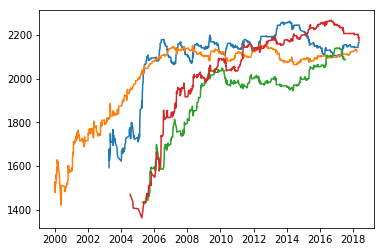

In [47]:
plot_player(res_df, "Nadal R.")
plot_player(res_df, "Federer R.")
plot_player(res_df, "Murray A.")
plot_player(res_df, "Djokovic N.")

This weighting works well, but above, it doesn't recognize the clear dominance of Rafa on clay vs. Federer's dominance on all other surfaces... 

#### Calibration

How well is our model calibrated?

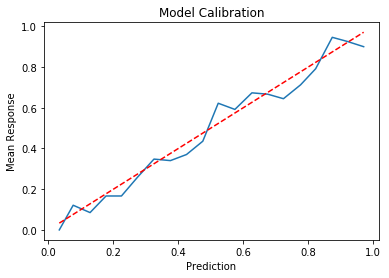

In [87]:
from sklearn.calibration import calibration_curve

def calibration_plot(y, pred, n_bins=20):
    _y, _x = calibration_curve(y, pred, n_bins=n_bins)
    plt.plot(_x, _y)
    plt.plot(_x, _x, 'r--')
    plt.xlabel("Prediction")
    plt.ylabel("Mean Response")
    plt.title("Model Calibration")

calibration_plot(rec_df['y'], rec_df['pred'])

OK, but not fantastic, let's try fitting a calibrator to get this in line...

In [88]:
# Fit only on clay
clay_df = _get_test_df(df, '2000-01-01', '2019-01-01').copy()

In [89]:
%pdb
from sklearn.isotonic import IsotonicRegression

MIN_TRAIN = 5000

def get_calibrated_preds(df, train_size=10000):
    # Fits isotonic regression on rolling window of training data
    out = []
    for i in range(MIN_TRAIN, df.shape[0]):
        if i % 1000 == 0:
            print i
        train_min = max(0, i - train_size)
        iso = IsotonicRegression(out_of_bounds='clip', y_min=0., y_max=1.)
        iso.fit(
            df['pred'].iloc[train_min:i],
            df['y'].iloc[train_min:i]
        )
        if i < len(preds):
            out.append(
                (df['match_id'].iloc[i], iso.predict([df['pred'].iloc[i]])[0])
            )
    return iso, out

final_iso, cal_preds = get_calibrated_preds(clay_df)

Automatic pdb calling has been turned OFF
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000


In [90]:
cal_df = pd.DataFrame(
    cal_preds,
    columns=['match_id', 'cal_pred']
)
new_df = pd.merge(
    df,
    cal_df,
    on='match_id',
    how='left'
)

In [91]:
rel_df = _get_test_df(new_df, MIN_TEST_DATE, MAX_TEST_DATE) 

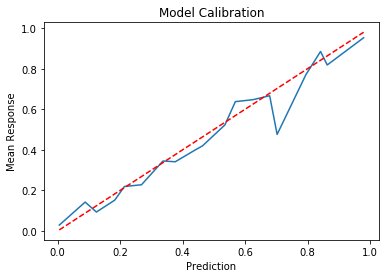

In [92]:
calibration_plot(rel_df['y'], rel_df['cal_pred'])

Calibration seems worse!  Perhaps my training period was not large enough, or too large?  Let's separate by 3-setters and 5-setters

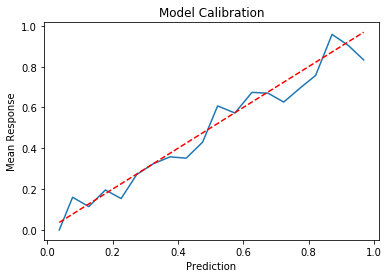

In [133]:
test_3 = rec_df[
    rec_df['best of'] == 3
]
calibration_plot(test_3['y'], test_3['pred'])

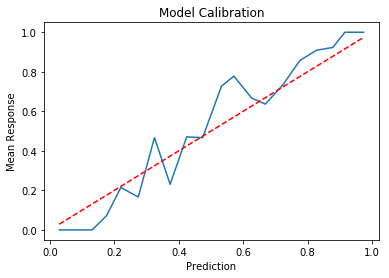

In [134]:
test_5 = rec_df[
    rec_df['best of'] == 5
]
calibration_plot(test_5['y'], test_5['pred'])

Calibration is better for 3's than 5's...

Text(0.5,1,'Isotonic Regression Function')

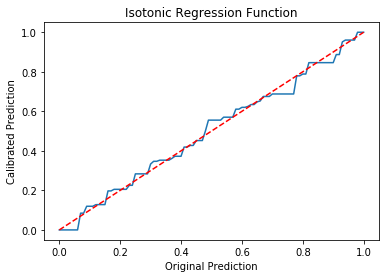

In [93]:
# What does final isotonic reg do?
_x = np.linspace(0, 1, 101)
_y = final_iso.predict(_x)
plt.plot(_x, _y)
plt.plot(_x, _x, 'r--')
plt.xlabel("Original Prediction")
plt.ylabel("Calibrated Prediction")
plt.title("Isotonic Regression Function")

Isotonic regression doesn't seem to do much...pretty much just an identity function.  Our takeaway here is that we may have to improve our calibration significantly (we may need to include more features because of systematic errors) in order to do well...

##### Tune Isotonic Regression
    * Recency weights / when to remove old training points...
    * Seasonality weights (?)
        * We are always better in some tournaments than others
    * Separating by tournament
    * Separating by ranking difference between players

##### Spline Calibration...

Perhaps spline calibration would work better than Isotonic Regression calibration...

In [94]:
# Fit spline online too!
def get_knot_vars(s, knots):
    return [(s - k).clip(lower=0)]


class CalibratorSpline():

    def __init__(self, n_knots=100, reg=1.0, lr=0.01):
        self.n_knots = n_knots
        self.reg = reg 
        # Prior is straight line
        self.prior = np.zeros(n_knots + 1)
        self.prior[0] = 1.
        # Initialize coefficient to prior
        self.coef_ = self.prior
        self.lr = lr
    
    def get_knot_vars(self, X):
        knots = np.linspace(0., 1., self.n_knots + 1)
        if isinstance(X, pd.DataFrame):
            s = X[X.columns[0]]
            return np.array(
                [(s - k).clip(lower=0) for k in knots]
            ).transpose()
        else:
            return np.array(
                [np.clip(float(X) - k, 0, None) for k in knots]
            ).reshape((len(knots), 1))

    @staticmethod
    def check_X(X):
        if not (isinstance(X, float) or (X.shape[1] == 1)):
            raise ValueError("Expecting float or 1 column data frame")
        
    def fit(self, X, y):
        self.check_X(X)
        knot_X = self.get_knot_vars(X)
        sol = np.dot(
            np.linalg.inv(
                np.dot(knot_X.transpose(), knot_X)
                + self.reg * np.eye(knot_X.shape[1])
            ),
            (
                np.dot(knot_X.transpose(), y)
                + self.reg * self.prior
            )
        )
        self.coef_ = sol

    def update(self, x, y):
        knot_x = self.get_knot_vars(x)
        pred = np.dot(self.coef_, knot_x)[0]
        # Regularize towards straight line
        this_update = (y - pred) * knot_x.reshape(-1) - self.reg * (pred - x) * knot_x.reshape(-1) 
        self.coef_ += self.lr * this_update
        
    def predict(self, X):
        self.check_X(X)
        knot_X = self.get_knot_vars(X)
        if knot_X.shape[1] > 1:
            return np.dot(knot_X, self.coef_)
        else:
            return np.dot(self.coef_, knot_X)

First let's test by fitting to our test set, that our calibrator works.

In [95]:
rec_df = _get_test_df(df, MIN_TEST_DATE, MAX_TEST_DATE)

In [146]:
calibrator = CalibratorSpline(n_knots=101, reg=0.01)
calibrator.fit(rec_df[['pred']], rec_df['y'])

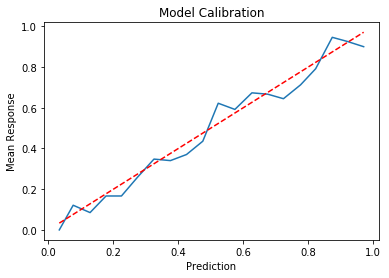

In [147]:
calibration_plot(rec_df['y'], rec_df['pred'])

In [148]:
cal_preds = calibrator.predict(rec_df[['pred']])
# Problem with linear rather than logistic is that preds can be < 0 or > 1
cal_preds = np.clip(cal_preds, 0, 1) 

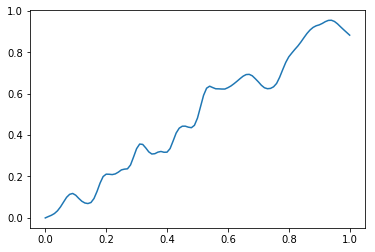

In [149]:
# What is calibrator doing?
_x = np.linspace(0, 1, 101)
_y = calibrator.predict(pd.DataFrame({'x': _x}))
plt.plot(_x, _y)

Might need a monotonicity constraint!  That's probably why splines worked well at work but not here...

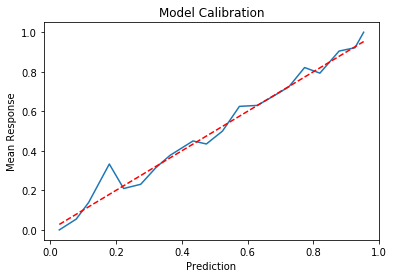

In [151]:
calibration_plot(rec_df['y'], cal_preds)

When fit on the test set, calibration seems quite good...How would an isotonic regression do on the same data? 

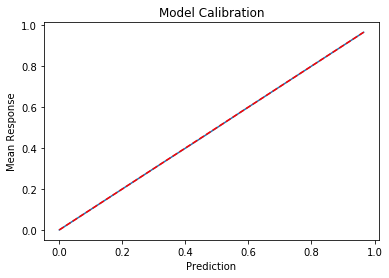

In [152]:
iso = IsotonicRegression()
iso.fit(rec_df['pred'], rec_df['y'])
iso_preds = iso.predict(rec_df['pred'])
calibration_plot(rec_df['y'], iso_preds)

Perfectly, maybe isotonic regression is better after all...

###### Fit Calibrator Online

Ignore this section, a properly tuned isotonic regression may be better after all...

In [170]:
clay_df = df[
    (df['__surface__'] == 'Clay') &
    (df['comment'] != 'Walkover')
].copy()
clay_df.sort_values(by=['date', 'tournament', 'round'], ascending=True, inplace=True)

In [171]:
calibrator = CalibratorSpline(reg=1., lr=0.01)

In [172]:
preds = []
for _, row in clay_df.iterrows():
    cur_pred = calibrator.predict(row['pred'])[0]
    preds.append((row['match_id'], cur_pred))
    calibrator.update(row['pred'], row['y'])
    new_pred = calibrator.predict(row['pred'])
    pred_at_1 = calibrator.predict(1.)[0]
    print "Truth: %f, Old Pred: %f, New Pred: %f, Pred at 1: %f" % (row['y'], cur_pred, new_pred, pred_at_1)

Truth: 1.000000, Old Pred: 0.481448, New Pred: 0.501342, Pred at 1: 1.051708
Truth: 1.000000, Old Pred: 0.400908, New Pred: 0.412629, Pred at 1: 1.090953
Truth: 0.000000, Old Pred: 0.531665, New Pred: 0.508045, Pred at 1: 1.031462
Truth: 0.000000, Old Pred: 0.418723, New Pred: 0.408632, Pred at 1: 0.999687
Truth: 1.000000, Old Pred: 0.511903, New Pred: 0.534310, Pred at 1: 1.053877
Truth: 1.000000, Old Pred: 0.531260, New Pred: 0.551417, Pred at 1: 1.102954
Truth: 1.000000, Old Pred: 0.621508, New Pred: 0.642421, Pred at 1: 1.147220
Truth: 0.000000, Old Pred: 0.566100, New Pred: 0.538219, Pred at 1: 1.078947
Truth: 1.000000, Old Pred: 0.598052, New Pred: 0.620089, Pred at 1: 1.126634
Truth: 0.000000, Old Pred: 0.629547, New Pred: 0.586029, Pred at 1: 1.034121
Truth: 1.000000, Old Pred: 0.463217, New Pred: 0.479797, Pred at 1: 1.080644
Truth: 1.000000, Old Pred: 0.589181, New Pred: 0.610522, Pred at 1: 1.127840
Truth: 0.000000, Old Pred: 0.531991, New Pred: 0.509509, Pred at 1: 1.069597

Truth: 1.000000, Old Pred: 0.435030, New Pred: 0.449339, Pred at 1: 0.957720
Truth: 0.000000, Old Pred: 0.382995, New Pred: 0.376558, Pred at 1: 0.934072
Truth: 0.000000, Old Pred: 0.707541, New Pred: 0.617102, Pred at 1: 0.793554
Truth: 0.000000, Old Pred: 0.650555, New Pred: 0.566463, Pred at 1: 0.674199
Truth: 0.000000, Old Pred: 0.314453, New Pred: 0.310489, Pred at 1: 0.658884
Truth: 1.000000, Old Pred: 0.342045, New Pred: 0.355718, Pred at 1: 0.705104
Truth: 0.000000, Old Pred: 0.399166, New Pred: 0.388491, Pred at 1: 0.674570
Truth: 1.000000, Old Pred: 0.352752, New Pred: 0.366973, Pred at 1: 0.721564
Truth: 1.000000, Old Pred: 0.499760, New Pred: 0.542470, Pred at 1: 0.807621
Truth: 0.000000, Old Pred: 0.447505, New Pred: 0.432769, Pred at 1: 0.767482
Truth: 0.000000, Old Pred: 0.347852, New Pred: 0.342525, Pred at 1: 0.747900
Truth: 1.000000, Old Pred: 0.418743, New Pred: 0.438577, Pred at 1: 0.803159
Truth: 0.000000, Old Pred: 0.402745, New Pred: 0.393338, Pred at 1: 0.773665

Truth: 1.000000, Old Pred: 0.400968, New Pred: 0.415837, Pred at 1: 0.902120
Truth: 0.000000, Old Pred: 0.209535, New Pred: 0.208891, Pred at 1: 0.897759
Truth: 0.000000, Old Pred: 0.336679, New Pred: 0.332373, Pred at 1: 0.880543
Truth: 0.000000, Old Pred: 0.499015, New Pred: 0.476043, Pred at 1: 0.825940
Truth: 1.000000, Old Pred: 0.193659, New Pred: 0.195765, Pred at 1: 0.840875
Truth: 0.000000, Old Pred: 0.197678, New Pred: 0.197141, Pred at 1: 0.837105
Truth: 0.000000, Old Pred: 0.521617, New Pred: 0.491465, Pred at 1: 0.773373
Truth: 0.000000, Old Pred: 0.394429, New Pred: 0.384417, Pred at 1: 0.744007
Truth: 0.000000, Old Pred: 0.166749, New Pred: 0.166454, Pred at 1: 0.741628
Truth: 0.000000, Old Pred: 0.551461, New Pred: 0.505004, Pred at 1: 0.664507
Truth: 1.000000, Old Pred: 0.484946, New Pred: 0.550441, Pred at 1: 0.781448
Truth: 1.000000, Old Pred: 0.404389, New Pred: 0.423852, Pred at 1: 0.836796
Truth: 1.000000, Old Pred: 0.152098, New Pred: 0.153155, Pred at 1: 0.846523

Truth: 0.000000, Old Pred: 0.362947, New Pred: 0.357129, Pred at 1: 0.964876
Truth: 0.000000, Old Pred: 0.217616, New Pred: 0.216835, Pred at 1: 0.959912
Truth: 1.000000, Old Pred: 0.849408, New Pred: 0.892697, Pred at 1: 1.011691
Truth: 0.000000, Old Pred: 0.798936, New Pred: 0.662844, Pred at 1: 0.822419
Truth: 0.000000, Old Pred: 0.237708, New Pred: 0.236464, Pred at 1: 0.815683
Truth: 1.000000, Old Pred: 0.657884, New Pred: 0.738547, Pred at 1: 0.927802
Truth: 0.000000, Old Pred: 0.544900, New Pred: 0.511201, Pred at 1: 0.857367
Truth: 0.000000, Old Pred: 0.397930, New Pred: 0.387695, Pred at 1: 0.827395
Truth: 0.000000, Old Pred: 0.206913, New Pred: 0.206190, Pred at 1: 0.822865
Truth: 0.000000, Old Pred: 0.658302, New Pred: 0.570000, Pred at 1: 0.699711
Truth: 1.000000, Old Pred: 0.277431, New Pred: 0.286528, Pred at 1: 0.736892
Truth: 0.000000, Old Pred: 0.256583, New Pred: 0.254727, Pred at 1: 0.728176
Truth: 0.000000, Old Pred: 0.278562, New Pred: 0.275903, Pred at 1: 0.717020

Truth: 0.000000, Old Pred: 0.494707, New Pred: 0.476963, Pred at 1: 0.954375
Truth: 1.000000, Old Pred: 0.692678, New Pred: 0.729547, Pred at 1: 1.014729
Truth: 0.000000, Old Pred: 0.660330, New Pred: 0.601762, Pred at 1: 0.904542
Truth: 0.000000, Old Pred: 0.119258, New Pred: 0.119185, Pred at 1: 0.903674
Truth: 1.000000, Old Pred: 0.502044, New Pred: 0.524868, Pred at 1: 0.959224
Truth: 1.000000, Old Pred: 0.496653, New Pred: 0.514937, Pred at 1: 1.007087
Truth: 1.000000, Old Pred: 0.780143, New Pred: 0.809218, Pred at 1: 1.050052
Truth: 0.000000, Old Pred: 0.374869, New Pred: 0.369343, Pred at 1: 1.028503
Truth: 1.000000, Old Pred: 0.874241, New Pred: 0.892764, Pred at 1: 1.052270
Truth: 0.000000, Old Pred: 0.424021, New Pred: 0.414969, Pred at 1: 1.021620
Truth: 0.000000, Old Pred: 0.414687, New Pred: 0.406010, Pred at 1: 0.992221
Truth: 0.000000, Old Pred: 0.239074, New Pred: 0.238034, Pred at 1: 0.985964
Truth: 0.000000, Old Pred: 0.485001, New Pred: 0.467676, Pred at 1: 0.938823

Truth: 1.000000, Old Pred: 0.310194, New Pred: 0.320274, Pred at 1: 0.942213
Truth: 1.000000, Old Pred: 0.682388, New Pred: 0.731062, Pred at 1: 1.017570
Truth: 1.000000, Old Pred: 0.521432, New Pred: 0.546098, Pred at 1: 1.074876
Truth: 1.000000, Old Pred: 0.417633, New Pred: 0.431273, Pred at 1: 1.117653
Truth: 0.000000, Old Pred: 0.480723, New Pred: 0.464393, Pred at 1: 1.072142
Truth: 1.000000, Old Pred: 0.583770, New Pred: 0.608225, Pred at 1: 1.124641
Truth: 1.000000, Old Pred: 0.532679, New Pred: 0.551101, Pred at 1: 1.170592
Truth: 0.000000, Old Pred: 0.527952, New Pred: 0.506147, Pred at 1: 1.113584
Truth: 0.000000, Old Pred: 0.374132, New Pred: 0.367823, Pred at 1: 1.090715
Truth: 0.000000, Old Pred: 0.401732, New Pred: 0.393155, Pred at 1: 1.062426
Truth: 1.000000, Old Pred: 0.581927, New Pred: 0.607511, Pred at 1: 1.116799
Truth: 0.000000, Old Pred: 0.874293, New Pred: 0.710940, Pred at 1: 0.891191
Truth: 0.000000, Old Pred: 0.480639, New Pred: 0.458393, Pred at 1: 0.840006

Truth: 1.000000, Old Pred: 0.328053, New Pred: 0.335384, Pred at 1: 1.117811
Truth: 0.000000, Old Pred: 0.379215, New Pred: 0.372905, Pred at 1: 1.094615
Truth: 1.000000, Old Pred: 0.366648, New Pred: 0.375868, Pred at 1: 1.129130
Truth: 1.000000, Old Pred: 0.402329, New Pred: 0.412618, Pred at 1: 1.164961
Truth: 1.000000, Old Pred: 0.859091, New Pred: 0.863270, Pred at 1: 1.171242
Truth: 1.000000, Old Pred: 0.905052, New Pred: 0.900462, Pred at 1: 1.164744
Truth: 1.000000, Old Pred: 0.969229, New Pred: 0.949245, Pred at 1: 1.139024
Truth: 0.000000, Old Pred: 0.928677, New Pred: 0.733948, Pred at 1: 0.881040
Truth: 1.000000, Old Pred: 0.606951, New Pred: 0.652872, Pred at 1: 0.961051
Truth: 1.000000, Old Pred: 0.575815, New Pred: 0.605462, Pred at 1: 1.021991
Truth: 0.000000, Old Pred: 0.886912, New Pred: 0.687467, Pred at 1: 0.776091
Truth: 0.000000, Old Pred: 0.418249, New Pred: 0.404979, Pred at 1: 0.740945
Truth: 0.000000, Old Pred: 0.358761, New Pred: 0.351406, Pred at 1: 0.717969

Truth: 1.000000, Old Pred: 0.284194, New Pred: 0.288093, Pred at 1: 1.136337
Truth: 0.000000, Old Pred: 0.066911, New Pred: 0.066904, Pred at 1: 1.136176
Truth: 0.000000, Old Pred: 0.493942, New Pred: 0.478932, Pred at 1: 1.091204
Truth: 0.000000, Old Pred: 0.537968, New Pred: 0.515283, Pred at 1: 1.032072
Truth: 1.000000, Old Pred: 0.672410, New Pred: 0.698467, Pred at 1: 1.080098
Truth: 0.000000, Old Pred: 0.658304, New Pred: 0.605375, Pred at 1: 0.974719
Truth: 0.000000, Old Pred: 0.308598, New Pred: 0.305747, Pred at 1: 0.961701
Truth: 0.000000, Old Pred: 0.513185, New Pred: 0.489996, Pred at 1: 0.904951
Truth: 1.000000, Old Pred: 0.510670, New Pred: 0.536830, Pred at 1: 0.965445
Truth: 1.000000, Old Pred: 0.415937, New Pred: 0.428789, Pred at 1: 1.006584
Truth: 1.000000, Old Pred: 0.757318, New Pred: 0.788640, Pred at 1: 1.054218
Truth: 1.000000, Old Pred: 0.410990, New Pred: 0.421119, Pred at 1: 1.089323
Truth: 1.000000, Old Pred: 0.960166, New Pred: 0.950596, Pred at 1: 1.077784

Truth: 0.000000, Old Pred: 0.735473, New Pred: 0.628273, Pred at 1: 0.773285
Truth: 1.000000, Old Pred: 0.537491, New Pred: 0.582243, Pred at 1: 0.858618
Truth: 1.000000, Old Pred: 0.616674, New Pred: 0.660587, Pred at 1: 0.935149
Truth: 1.000000, Old Pred: 0.302555, New Pred: 0.307755, Pred at 1: 0.960064
Truth: 1.000000, Old Pred: 0.443824, New Pred: 0.456378, Pred at 1: 0.999285
Truth: 0.000000, Old Pred: 0.127925, New Pred: 0.127840, Pred at 1: 0.998283
Truth: 1.000000, Old Pred: 0.623237, New Pred: 0.646266, Pred at 1: 1.045690
Truth: 1.000000, Old Pred: 0.716419, New Pred: 0.737810, Pred at 1: 1.083815
Truth: 0.000000, Old Pred: 0.334362, New Pred: 0.331203, Pred at 1: 1.069064
Truth: 1.000000, Old Pred: 0.538703, New Pred: 0.552814, Pred at 1: 1.106727
Truth: 1.000000, Old Pred: 0.734852, New Pred: 0.750122, Pred at 1: 1.134768
Truth: 1.000000, Old Pred: 0.587433, New Pred: 0.600525, Pred at 1: 1.167857
Truth: 0.000000, Old Pred: 0.541208, New Pred: 0.522070, Pred at 1: 1.112990

Truth: 0.000000, Old Pred: 0.501443, New Pred: 0.477113, Pred at 1: 0.767772
Truth: 1.000000, Old Pred: 0.428516, New Pred: 0.448927, Pred at 1: 0.823563
Truth: 1.000000, Old Pred: 0.298068, New Pred: 0.303851, Pred at 1: 0.850457
Truth: 1.000000, Old Pred: 0.122016, New Pred: 0.122525, Pred at 1: 0.856571
Truth: 0.000000, Old Pred: 0.481335, New Pred: 0.462629, Pred at 1: 0.808332
Truth: 0.000000, Old Pred: 0.199305, New Pred: 0.198791, Pred at 1: 0.804609
Truth: 1.000000, Old Pred: 0.238158, New Pred: 0.241341, Pred at 1: 0.823588
Truth: 0.000000, Old Pred: 0.272512, New Pred: 0.270758, Pred at 1: 0.814450
Truth: 0.000000, Old Pred: 0.567866, New Pred: 0.524860, Pred at 1: 0.733644
Truth: 1.000000, Old Pred: 0.567358, New Pred: 0.633924, Pred at 1: 0.842426
Truth: 0.000000, Old Pred: 0.435438, New Pred: 0.422983, Pred at 1: 0.806117
Truth: 0.000000, Old Pred: 0.453884, New Pred: 0.437777, Pred at 1: 0.763842
Truth: 0.000000, Old Pred: 0.266272, New Pred: 0.264537, Pred at 1: 0.754963

Truth: 0.000000, Old Pred: 0.079844, New Pred: 0.079829, Pred at 1: 0.918760
Truth: 0.000000, Old Pred: 0.717441, New Pred: 0.620665, Pred at 1: 0.772381
Truth: 0.000000, Old Pred: 0.535845, New Pred: 0.500134, Pred at 1: 0.702577
Truth: 0.000000, Old Pred: 0.424683, New Pred: 0.410585, Pred at 1: 0.665903
Truth: 0.000000, Old Pred: 0.305210, New Pred: 0.301814, Pred at 1: 0.652031
Truth: 0.000000, Old Pred: 0.374830, New Pred: 0.366046, Pred at 1: 0.626011
Truth: 0.000000, Old Pred: 0.431083, New Pred: 0.413195, Pred at 1: 0.586592
Truth: 1.000000, Old Pred: 0.373338, New Pred: 0.398726, Pred at 1: 0.654863
Truth: 1.000000, Old Pred: 0.173674, New Pred: 0.175246, Pred at 1: 0.667342
Truth: 0.000000, Old Pred: 0.179019, New Pred: 0.178653, Pred at 1: 0.664502
Truth: 1.000000, Old Pred: 0.599228, New Pred: 0.739568, Pred at 1: 0.839869
Truth: 0.000000, Old Pred: 0.690144, New Pred: 0.592013, Pred at 1: 0.702021
Truth: 0.000000, Old Pred: 0.550598, New Pred: 0.503095, Pred at 1: 0.625333

Truth: 1.000000, Old Pred: 0.892999, New Pred: 0.888028, Pred at 1: 1.140273
Truth: 1.000000, Old Pred: 0.446497, New Pred: 0.453501, Pred at 1: 1.166299
Truth: 1.000000, Old Pred: 0.832675, New Pred: 0.834475, Pred at 1: 1.169350
Truth: 1.000000, Old Pred: 0.816921, New Pred: 0.820128, Pred at 1: 1.174955
Truth: 1.000000, Old Pred: 0.868341, New Pred: 0.865121, Pred at 1: 1.169778
Truth: 1.000000, Old Pred: 0.758808, New Pred: 0.766212, Pred at 1: 1.184162
Truth: 1.000000, Old Pred: 0.980414, New Pred: 0.953083, Pred at 1: 1.147184
Truth: 1.000000, Old Pred: 0.596145, New Pred: 0.606371, Pred at 1: 1.174319
Truth: 0.000000, Old Pred: 0.858373, New Pred: 0.739741, Pred at 1: 0.979854
Truth: 1.000000, Old Pred: 0.534547, New Pred: 0.548154, Pred at 1: 1.016769
Truth: 1.000000, Old Pred: 0.490286, New Pred: 0.500378, Pred at 1: 1.048508
Truth: 1.000000, Old Pred: 0.698135, New Pred: 0.714018, Pred at 1: 1.079781
Truth: 1.000000, Old Pred: 0.883647, New Pred: 0.886613, Pred at 1: 1.083956

Truth: 0.000000, Old Pred: 0.544636, New Pred: 0.510775, Pred at 1: 0.727163
Truth: 0.000000, Old Pred: 0.400763, New Pred: 0.391666, Pred at 1: 0.698240
Truth: 0.000000, Old Pred: 0.224712, New Pred: 0.223885, Pred at 1: 0.692968
Truth: 1.000000, Old Pred: 0.616947, New Pred: 0.737455, Pred at 1: 0.848264
Truth: 0.000000, Old Pred: 0.161435, New Pred: 0.161226, Pred at 1: 0.846308
Truth: 1.000000, Old Pred: 0.625992, New Pred: 0.670747, Pred at 1: 0.922946
Truth: 0.000000, Old Pred: 0.581811, New Pred: 0.545012, Pred at 1: 0.843823
Truth: 0.000000, Old Pred: 0.518951, New Pred: 0.493280, Pred at 1: 0.783959
Truth: 0.000000, Old Pred: 0.508777, New Pred: 0.482015, Pred at 1: 0.724828
Truth: 0.000000, Old Pred: 0.331702, New Pred: 0.327473, Pred at 1: 0.708028
Truth: 0.000000, Old Pred: 0.453186, New Pred: 0.434864, Pred at 1: 0.664037
Truth: 1.000000, Old Pred: 0.561837, New Pred: 0.668295, Pred at 1: 0.814958
Truth: 1.000000, Old Pred: 0.706402, New Pred: 0.791241, Pred at 1: 0.924276

Truth: 1.000000, Old Pred: 0.478678, New Pred: 0.506048, Pred at 1: 0.907363
Truth: 1.000000, Old Pred: 0.600096, New Pred: 0.638264, Pred at 1: 0.978091
Truth: 1.000000, Old Pred: 0.632704, New Pred: 0.663732, Pred at 1: 1.036282
Truth: 1.000000, Old Pred: 0.514775, New Pred: 0.531556, Pred at 1: 1.080316
Truth: 1.000000, Old Pred: 0.689999, New Pred: 0.711542, Pred at 1: 1.120599
Truth: 0.000000, Old Pred: 0.441001, New Pred: 0.431289, Pred at 1: 1.087713
Truth: 0.000000, Old Pred: 0.643440, New Pred: 0.595460, Pred at 1: 0.989027
Truth: 0.000000, Old Pred: 0.102469, New Pred: 0.102431, Pred at 1: 0.988482
Truth: 0.000000, Old Pred: 0.464588, New Pred: 0.450021, Pred at 1: 0.946740
Truth: 0.000000, Old Pred: 0.655872, New Pred: 0.588690, Pred at 1: 0.831909
Truth: 1.000000, Old Pred: 0.651825, New Pred: 0.720705, Pred at 1: 0.932874
Truth: 0.000000, Old Pred: 0.334247, New Pred: 0.330180, Pred at 1: 0.916222
Truth: 0.000000, Old Pred: 0.365058, New Pred: 0.359043, Pred at 1: 0.894420

Truth: 1.000000, Old Pred: 0.701435, New Pred: 0.734940, Pred at 1: 1.035162
Truth: 0.000000, Old Pred: 0.477757, New Pred: 0.462770, Pred at 1: 0.991641
Truth: 1.000000, Old Pred: 0.470226, New Pred: 0.485617, Pred at 1: 1.035450
Truth: 1.000000, Old Pred: 0.681655, New Pred: 0.706691, Pred at 1: 1.081320
Truth: 0.000000, Old Pred: 0.536400, New Pred: 0.513877, Pred at 1: 1.022549
Truth: 1.000000, Old Pred: 0.450375, New Pred: 0.463295, Pred at 1: 1.062256
Truth: 1.000000, Old Pred: 0.595041, New Pred: 0.614437, Pred at 1: 1.105892
Truth: 1.000000, Old Pred: 0.361973, New Pred: 0.368608, Pred at 1: 1.133593
Truth: 1.000000, Old Pred: 0.806972, New Pred: 0.817714, Pred at 1: 1.151054
Truth: 1.000000, Old Pred: 1.002001, New Pred: 0.971796, Pred at 1: 1.113976
Truth: 1.000000, Old Pred: 0.878270, New Pred: 0.882189, Pred at 1: 1.119536
Truth: 0.000000, Old Pred: 0.557662, New Pred: 0.533111, Pred at 1: 1.056048
Truth: 1.000000, Old Pred: 0.491767, New Pred: 0.505633, Pred at 1: 1.095695

Truth: 0.000000, Old Pred: 0.559593, New Pred: 0.520077, Pred at 1: 0.705609
Truth: 0.000000, Old Pred: 0.209547, New Pred: 0.208920, Pred at 1: 0.701307
Truth: 0.000000, Old Pred: 0.388122, New Pred: 0.379894, Pred at 1: 0.674596
Truth: 0.000000, Old Pred: 0.387448, New Pred: 0.378839, Pred at 1: 0.647466
Truth: 0.000000, Old Pred: 0.485779, New Pred: 0.458002, Pred at 1: 0.592790
Truth: 1.000000, Old Pred: 0.381932, New Pred: 0.401449, Pred at 1: 0.649466
Truth: 0.000000, Old Pred: 0.258228, New Pred: 0.256688, Pred at 1: 0.641328
Truth: 0.000000, Old Pred: 0.437024, New Pred: 0.420649, Pred at 1: 0.601218
Truth: 1.000000, Old Pred: 0.504601, New Pred: 0.594551, Pred at 1: 0.743452
Truth: 0.000000, Old Pred: 0.442960, New Pred: 0.428538, Pred at 1: 0.704161
Truth: 1.000000, Old Pred: 0.503281, New Pred: 0.544726, Pred at 1: 0.788140
Truth: 0.000000, Old Pred: 0.391068, New Pred: 0.383357, Pred at 1: 0.761920
Truth: 1.000000, Old Pred: 0.492294, New Pred: 0.520121, Pred at 1: 0.826424

Truth: 0.000000, Old Pred: 0.367129, New Pred: 0.361604, Pred at 1: 0.901493
Truth: 1.000000, Old Pred: 0.533826, New Pred: 0.558360, Pred at 1: 0.957716
Truth: 0.000000, Old Pred: 0.369479, New Pred: 0.364023, Pred at 1: 0.936595
Truth: 0.000000, Old Pred: 0.183485, New Pred: 0.183130, Pred at 1: 0.933728
Truth: 1.000000, Old Pred: 0.271474, New Pred: 0.275499, Pred at 1: 0.955303
Truth: 0.000000, Old Pred: 0.630838, New Pred: 0.578944, Pred at 1: 0.855697
Truth: 1.000000, Old Pred: 0.601866, New Pred: 0.643305, Pred at 1: 0.930538
Truth: 0.000000, Old Pred: 0.739152, New Pred: 0.630623, Pred at 1: 0.772307
Truth: 1.000000, Old Pred: 0.606661, New Pred: 0.673210, Pred at 1: 0.876368
Truth: 1.000000, Old Pred: 0.577037, New Pred: 0.609815, Pred at 1: 0.941732
Truth: 0.000000, Old Pred: 0.238724, New Pred: 0.237754, Pred at 1: 0.935694
Truth: 0.000000, Old Pred: 0.148596, New Pred: 0.148440, Pred at 1: 0.934132
Truth: 0.000000, Old Pred: 0.711590, New Pred: 0.620726, Pred at 1: 0.792274

Truth: 1.000000, Old Pred: 0.662502, New Pred: 0.681581, Pred at 1: 1.158153
Truth: 1.000000, Old Pred: 0.783462, New Pred: 0.795484, Pred at 1: 1.178622
Truth: 1.000000, Old Pred: 0.233483, New Pred: 0.235888, Pred at 1: 1.194404
Truth: 1.000000, Old Pred: 0.851173, New Pred: 0.852991, Pred at 1: 1.197292
Truth: 1.000000, Old Pred: 0.452507, New Pred: 0.462191, Pred at 1: 1.229687
Truth: 0.000000, Old Pred: 0.915692, New Pred: 0.760817, Pred at 1: 0.997670
Truth: 1.000000, Old Pred: 0.294752, New Pred: 0.299822, Pred at 1: 1.022351
Truth: 0.000000, Old Pred: 0.267662, New Pred: 0.266133, Pred at 1: 1.013942
Truth: 1.000000, Old Pred: 0.724068, New Pred: 0.753242, Pred at 1: 1.061827
Truth: 0.000000, Old Pred: 0.141031, New Pred: 0.140904, Pred at 1: 1.060489
Truth: 0.000000, Old Pred: 0.828947, New Pred: 0.689684, Pred at 1: 0.860609
Truth: 1.000000, Old Pred: 0.605464, New Pred: 0.650306, Pred at 1: 0.939424
Truth: 0.000000, Old Pred: 0.390196, New Pred: 0.382734, Pred at 1: 0.913641

Truth: 1.000000, Old Pred: 0.409967, New Pred: 0.420501, Pred at 1: 1.036143
Truth: 0.000000, Old Pred: 0.286476, New Pred: 0.284558, Pred at 1: 1.026130
Truth: 0.000000, Old Pred: 0.687016, New Pred: 0.621188, Pred at 1: 0.905384
Truth: 1.000000, Old Pred: 0.617932, New Pred: 0.653288, Pred at 1: 0.970740
Truth: 0.000000, Old Pred: 0.565862, New Pred: 0.533532, Pred at 1: 0.898014
Truth: 0.000000, Old Pred: 0.530083, New Pred: 0.502089, Pred at 1: 0.834477
Truth: 0.000000, Old Pred: 0.381954, New Pred: 0.374191, Pred at 1: 0.808893
Truth: 1.000000, Old Pred: 0.583351, New Pred: 0.633823, Pred at 1: 0.896951
Truth: 1.000000, Old Pred: 0.451581, New Pred: 0.469288, Pred at 1: 0.946296
Truth: 0.000000, Old Pred: 0.471044, New Pred: 0.455205, Pred at 1: 0.902364
Truth: 0.000000, Old Pred: 0.595954, New Pred: 0.549788, Pred at 1: 0.813622
Truth: 1.000000, Old Pred: 0.556316, New Pred: 0.599375, Pred at 1: 0.894927
Truth: 0.000000, Old Pred: 0.562973, New Pred: 0.526160, Pred at 1: 0.818980

Truth: 0.000000, Old Pred: 0.609239, New Pred: 0.566471, Pred at 1: 0.954627
Truth: 0.000000, Old Pred: 0.451415, New Pred: 0.436648, Pred at 1: 0.914016
Truth: 0.000000, Old Pred: 0.371756, New Pred: 0.364618, Pred at 1: 0.890093
Truth: 1.000000, Old Pred: 0.488921, New Pred: 0.517103, Pred at 1: 0.955414
Truth: 1.000000, Old Pred: 0.457039, New Pred: 0.476288, Pred at 1: 1.007378
Truth: 1.000000, Old Pred: 0.525200, New Pred: 0.546973, Pred at 1: 1.059615
Truth: 1.000000, Old Pred: 0.670659, New Pred: 0.695289, Pred at 1: 1.105776
Truth: 0.000000, Old Pred: 0.242563, New Pred: 0.241505, Pred at 1: 1.099379
Truth: 1.000000, Old Pred: 0.867614, New Pred: 0.876702, Pred at 1: 1.112077
Truth: 1.000000, Old Pred: 0.892030, New Pred: 0.895415, Pred at 1: 1.116698
Truth: 1.000000, Old Pred: 0.691839, New Pred: 0.711552, Pred at 1: 1.154182
Truth: 0.000000, Old Pred: 0.484627, New Pred: 0.469722, Pred at 1: 1.110155
Truth: 0.000000, Old Pred: 0.656785, New Pred: 0.604750, Pred at 1: 1.005783

Truth: 1.000000, Old Pred: 0.297558, New Pred: 0.302985, Pred at 1: 1.015183
Truth: 1.000000, Old Pred: 0.825174, New Pred: 0.851888, Pred at 1: 1.051695
Truth: 1.000000, Old Pred: 0.518651, New Pred: 0.535608, Pred at 1: 1.095830
Truth: 1.000000, Old Pred: 0.862979, New Pred: 0.871927, Pred at 1: 1.108514
Truth: 1.000000, Old Pred: 0.817595, New Pred: 0.830308, Pred at 1: 1.128200
Truth: 0.000000, Old Pred: 0.252623, New Pred: 0.251482, Pred at 1: 1.121306
Truth: 0.000000, Old Pred: 0.417698, New Pred: 0.409517, Pred at 1: 1.092511
Truth: 0.000000, Old Pred: 0.238142, New Pred: 0.237199, Pred at 1: 1.086568
Truth: 1.000000, Old Pred: 0.477473, New Pred: 0.490958, Pred at 1: 1.126156
Truth: 1.000000, Old Pred: 0.709215, New Pred: 0.726404, Pred at 1: 1.158703
Truth: 1.000000, Old Pred: 0.928125, New Pred: 0.918221, Pred at 1: 1.145088
Truth: 0.000000, Old Pred: 0.382538, New Pred: 0.376882, Pred at 1: 1.122879
Truth: 0.000000, Old Pred: 0.587871, New Pred: 0.556091, Pred at 1: 1.047714

Truth: 0.000000, Old Pred: 0.586264, New Pred: 0.554051, Pred at 1: 1.027629
Truth: 1.000000, Old Pred: 0.617026, New Pred: 0.641597, Pred at 1: 1.077825
Truth: 0.000000, Old Pred: 0.269645, New Pred: 0.268116, Pred at 1: 1.069361
Truth: 1.000000, Old Pred: 0.683044, New Pred: 0.705749, Pred at 1: 1.111831
Truth: 1.000000, Old Pred: 0.376807, New Pred: 0.384544, Pred at 1: 1.142118
Truth: 0.000000, Old Pred: 0.718838, New Pred: 0.650648, Pred at 1: 1.013536
Truth: 1.000000, Old Pred: 0.627257, New Pred: 0.653448, Pred at 1: 1.065338
Truth: 1.000000, Old Pred: 0.481645, New Pred: 0.495700, Pred at 1: 1.105878
Truth: 1.000000, Old Pred: 0.806486, New Pred: 0.820793, Pred at 1: 1.128317
Truth: 0.000000, Old Pred: 0.426099, New Pred: 0.417439, Pred at 1: 1.098168
Truth: 1.000000, Old Pred: 0.533646, New Pred: 0.549255, Pred at 1: 1.138943
Truth: 1.000000, Old Pred: 0.647869, New Pred: 0.664619, Pred at 1: 1.174801
Truth: 1.000000, Old Pred: 0.894098, New Pred: 0.889983, Pred at 1: 1.168757

Truth: 1.000000, Old Pred: 0.699643, New Pred: 0.720023, Pred at 1: 1.155488
Truth: 0.000000, Old Pred: 0.608874, New Pred: 0.572060, Pred at 1: 1.072374
Truth: 0.000000, Old Pred: 0.079913, New Pred: 0.079898, Pred at 1: 1.072101
Truth: 0.000000, Old Pred: 0.373486, New Pred: 0.367379, Pred at 1: 1.049603
Truth: 0.000000, Old Pred: 0.277097, New Pred: 0.275172, Pred at 1: 1.039892
Truth: 0.000000, Old Pred: 0.651246, New Pred: 0.593745, Pred at 1: 0.932258
Truth: 1.000000, Old Pred: 0.370150, New Pred: 0.383067, Pred at 1: 0.975547
Truth: 0.000000, Old Pred: 0.419771, New Pred: 0.408786, Pred at 1: 0.942527
Truth: 0.000000, Old Pred: 0.357870, New Pred: 0.351815, Pred at 1: 0.921167
Truth: 1.000000, Old Pred: 0.224292, New Pred: 0.227585, Pred at 1: 0.940815
Truth: 0.000000, Old Pred: 0.677491, New Pred: 0.597904, Pred at 1: 0.813934
Truth: 1.000000, Old Pred: 0.461899, New Pred: 0.494854, Pred at 1: 0.888822
Truth: 1.000000, Old Pred: 0.480148, New Pred: 0.507477, Pred at 1: 0.953389

Truth: 1.000000, Old Pred: 0.685123, New Pred: 0.715366, Pred at 1: 1.015719
Truth: 0.000000, Old Pred: 0.662189, New Pred: 0.606278, Pred at 1: 0.907225
Truth: 1.000000, Old Pred: 0.615145, New Pred: 0.647613, Pred at 1: 0.968905
Truth: 0.000000, Old Pred: 0.530723, New Pred: 0.506620, Pred at 1: 0.909011
Truth: 1.000000, Old Pred: 0.642048, New Pred: 0.677852, Pred at 1: 0.972765
Truth: 1.000000, Old Pred: 0.756878, New Pred: 0.789890, Pred at 1: 1.022453
Truth: 1.000000, Old Pred: 0.421562, New Pred: 0.431969, Pred at 1: 1.057795
Truth: 0.000000, Old Pred: 0.259660, New Pred: 0.258397, Pred at 1: 1.050358
Truth: 1.000000, Old Pred: 0.790591, New Pred: 0.809626, Pred at 1: 1.080049
Truth: 0.000000, Old Pred: 0.529769, New Pred: 0.509261, Pred at 1: 1.024426
Truth: 0.000000, Old Pred: 0.459474, New Pred: 0.446863, Pred at 1: 0.985744
Truth: 1.000000, Old Pred: 0.752612, New Pred: 0.783639, Pred at 1: 1.033441
Truth: 1.000000, Old Pred: 0.704654, New Pred: 0.727780, Pred at 1: 1.074868

Truth: 0.000000, Old Pred: 0.311259, New Pred: 0.307349, Pred at 1: 0.863248
Truth: 1.000000, Old Pred: 0.465029, New Pred: 0.495267, Pred at 1: 0.933610
Truth: 0.000000, Old Pred: 0.710646, New Pred: 0.612253, Pred at 1: 0.788605
Truth: 0.000000, Old Pred: 0.456911, New Pred: 0.436167, Pred at 1: 0.742657
Truth: 1.000000, Old Pred: 0.667773, New Pred: 0.799930, Pred at 1: 0.899301
Truth: 0.000000, Old Pred: 0.203682, New Pred: 0.202995, Pred at 1: 0.894952
Truth: 1.000000, Old Pred: 0.351553, New Pred: 0.365443, Pred at 1: 0.941253
Truth: 0.000000, Old Pred: 0.258501, New Pred: 0.256779, Pred at 1: 0.932702
Truth: 1.000000, Old Pred: 0.635985, New Pred: 0.680041, Pred at 1: 1.007468
Truth: 1.000000, Old Pred: 0.872171, New Pred: 0.899976, Pred at 1: 1.041514
Truth: 0.000000, Old Pred: 0.626114, New Pred: 0.575744, Pred at 1: 0.943926
Truth: 1.000000, Old Pred: 0.518578, New Pred: 0.548707, Pred at 1: 1.010090
Truth: 1.000000, Old Pred: 0.555846, New Pred: 0.583011, Pred at 1: 1.068855

Truth: 1.000000, Old Pred: 0.490006, New Pred: 0.557295, Pred at 1: 0.854613
Truth: 1.000000, Old Pred: 0.548019, New Pred: 0.600212, Pred at 1: 0.948473
Truth: 1.000000, Old Pred: 0.308467, New Pred: 0.318415, Pred at 1: 0.986901
Truth: 1.000000, Old Pred: 0.532881, New Pred: 0.563372, Pred at 1: 1.052505
Truth: 1.000000, Old Pred: 0.554337, New Pred: 0.580531, Pred at 1: 1.109880
Truth: 0.000000, Old Pred: 0.745499, New Pred: 0.654585, Pred at 1: 0.959453
Truth: 1.000000, Old Pred: 0.257999, New Pred: 0.263536, Pred at 1: 0.986527
Truth: 0.000000, Old Pred: 0.739142, New Pred: 0.631824, Pred at 1: 0.828840
Truth: 1.000000, Old Pred: 0.546439, New Pred: 0.600000, Pred at 1: 0.924566
Truth: 1.000000, Old Pred: 0.590705, New Pred: 0.632907, Pred at 1: 1.001466
Truth: 1.000000, Old Pred: 0.747086, New Pred: 0.785486, Pred at 1: 1.058356
Truth: 0.000000, Old Pred: 0.631724, New Pred: 0.580002, Pred at 1: 0.958706
Truth: 1.000000, Old Pred: 0.636250, New Pred: 0.677947, Pred at 1: 1.030527

Truth: 1.000000, Old Pred: 1.007495, New Pred: 0.984088, Pred at 1: 1.066054
Truth: 1.000000, Old Pred: 0.650073, New Pred: 0.679901, Pred at 1: 1.121125
Truth: 0.000000, Old Pred: 0.277026, New Pred: 0.274882, Pred at 1: 1.110937
Truth: 1.000000, Old Pred: 0.897062, New Pred: 0.902509, Pred at 1: 1.118132
Truth: 1.000000, Old Pred: 0.819430, New Pred: 0.836288, Pred at 1: 1.143170
Truth: 1.000000, Old Pred: 0.563655, New Pred: 0.585426, Pred at 1: 1.192819
Truth: 1.000000, Old Pred: 0.264006, New Pred: 0.268578, Pred at 1: 1.216486
Truth: 0.000000, Old Pred: 0.328078, New Pred: 0.324339, Pred at 1: 1.200771
Truth: 0.000000, Old Pred: 0.555972, New Pred: 0.528433, Pred at 1: 1.134111
Truth: 0.000000, Old Pred: 0.424965, New Pred: 0.413868, Pred at 1: 1.100469
Truth: 1.000000, Old Pred: 0.601973, New Pred: 0.628084, Pred at 1: 1.154118
Truth: 0.000000, Old Pred: 0.255764, New Pred: 0.254228, Pred at 1: 1.146077
Truth: 1.000000, Old Pred: 0.924312, New Pred: 0.919590, Pred at 1: 1.139848

Truth: 1.000000, Old Pred: 0.146112, New Pred: 0.147273, Pred at 1: 1.149198
Truth: 0.000000, Old Pred: 0.425917, New Pred: 0.413895, Pred at 1: 1.114352
Truth: 1.000000, Old Pred: 0.400588, New Pred: 0.417309, Pred at 1: 1.164435
Truth: 0.000000, Old Pred: 0.547570, New Pred: 0.518273, Pred at 1: 1.097155
Truth: 1.000000, Old Pred: 0.690595, New Pred: 0.720989, Pred at 1: 1.149505
Truth: 1.000000, Old Pred: 0.926874, New Pred: 0.922450, Pred at 1: 1.143740
Truth: 1.000000, Old Pred: 0.940302, New Pred: 0.932958, Pred at 1: 1.134381
Truth: 1.000000, Old Pred: 0.209619, New Pred: 0.212848, Pred at 1: 1.154011
Truth: 0.000000, Old Pred: 0.873599, New Pred: 0.714565, Pred at 1: 0.930848
Truth: 0.000000, Old Pred: 0.526168, New Pred: 0.492683, Pred at 1: 0.864301
Truth: 0.000000, Old Pred: 0.258700, New Pred: 0.256416, Pred at 1: 0.854937
Truth: 1.000000, Old Pred: 0.656835, New Pred: 0.734399, Pred at 1: 0.964123
Truth: 0.000000, Old Pred: 0.603917, New Pred: 0.549952, Pred at 1: 0.869109

Truth: 1.000000, Old Pred: 0.548809, New Pred: 0.577815, Pred at 1: 1.117232
Truth: 1.000000, Old Pred: 0.938069, New Pred: 0.933826, Pred at 1: 1.111927
Truth: 1.000000, Old Pred: 0.902856, New Pred: 0.907818, Pred at 1: 1.118392
Truth: 0.000000, Old Pred: 0.465567, New Pred: 0.449096, Pred at 1: 1.074352
Truth: 0.000000, Old Pred: 0.692746, New Pred: 0.617299, Pred at 1: 0.945889
Truth: 0.000000, Old Pred: 0.178112, New Pred: 0.177678, Pred at 1: 0.942853
Truth: 0.000000, Old Pred: 0.691924, New Pred: 0.599895, Pred at 1: 0.806340
Truth: 1.000000, Old Pred: 0.518474, New Pred: 0.578578, Pred at 1: 0.913077
Truth: 0.000000, Old Pred: 0.237424, New Pred: 0.235977, Pred at 1: 0.905958
Truth: 1.000000, Old Pred: 0.711269, New Pred: 0.776849, Pred at 1: 0.995996
Truth: 1.000000, Old Pred: 0.361954, New Pred: 0.377705, Pred at 1: 1.045932
Truth: 1.000000, Old Pred: 0.544689, New Pred: 0.573812, Pred at 1: 1.108543
Truth: 1.000000, Old Pred: 0.821138, New Pred: 0.840037, Pred at 1: 1.136047

Truth: 0.000000, Old Pred: 0.560992, New Pred: 0.527364, Pred at 1: 0.955202
Truth: 0.000000, Old Pred: 0.308444, New Pred: 0.304888, Pred at 1: 0.940882
Truth: 1.000000, Old Pred: 0.354508, New Pred: 0.367639, Pred at 1: 0.985326
Truth: 1.000000, Old Pred: 0.750788, New Pred: 0.790484, Pred at 1: 1.043324
Truth: 0.000000, Old Pred: 0.486310, New Pred: 0.467198, Pred at 1: 0.994065
Truth: 0.000000, Old Pred: 0.444500, New Pred: 0.429995, Pred at 1: 0.954510
Truth: 0.000000, Old Pred: 0.529456, New Pred: 0.499047, Pred at 1: 0.889176
Truth: 1.000000, Old Pred: 0.710476, New Pred: 0.775604, Pred at 1: 0.978860
Truth: 0.000000, Old Pred: 0.284797, New Pred: 0.282209, Pred at 1: 0.967465
Truth: 1.000000, Old Pred: 0.563287, New Pred: 0.597224, Pred at 1: 1.035641
Truth: 1.000000, Old Pred: 0.453815, New Pred: 0.472857, Pred at 1: 1.087402
Truth: 0.000000, Old Pred: 0.456613, New Pred: 0.442160, Pred at 1: 1.046593
Truth: 0.000000, Old Pred: 0.393694, New Pred: 0.385049, Pred at 1: 1.018866

Truth: 0.000000, Old Pred: 0.298050, New Pred: 0.295191, Pred at 1: 0.996717
Truth: 1.000000, Old Pred: 0.264231, New Pred: 0.269411, Pred at 1: 1.022457
Truth: 1.000000, Old Pred: 0.593106, New Pred: 0.620661, Pred at 1: 1.078939
Truth: 0.000000, Old Pred: 0.168292, New Pred: 0.168014, Pred at 1: 1.076599
Truth: 0.000000, Old Pred: 0.767693, New Pred: 0.664825, Pred at 1: 0.913447
Truth: 1.000000, Old Pred: 0.698750, New Pred: 0.751449, Pred at 1: 0.991478
Truth: 1.000000, Old Pred: 0.691335, New Pred: 0.727116, Pred at 1: 1.050616
Truth: 1.000000, Old Pred: 0.715105, New Pred: 0.742792, Pred at 1: 1.097344
Truth: 0.000000, Old Pred: 0.682798, New Pred: 0.619596, Pred at 1: 0.979373
Truth: 0.000000, Old Pred: 0.286052, New Pred: 0.283569, Pred at 1: 0.968107
Truth: 1.000000, Old Pred: 0.753633, New Pred: 0.796479, Pred at 1: 1.029329
Truth: 0.000000, Old Pred: 0.275719, New Pred: 0.273654, Pred at 1: 1.019361
Truth: 0.000000, Old Pred: 0.263906, New Pred: 0.262147, Pred at 1: 1.010519

Truth: 1.000000, Old Pred: 0.713033, New Pred: 0.733814, Pred at 1: 1.152185
Truth: 1.000000, Old Pred: 0.782241, New Pred: 0.796131, Pred at 1: 1.175408
Truth: 1.000000, Old Pred: 0.913222, New Pred: 0.906438, Pred at 1: 1.165858
Truth: 0.000000, Old Pred: 0.760362, New Pred: 0.674770, Pred at 1: 1.015872
Truth: 1.000000, Old Pred: 0.874854, New Pred: 0.899034, Pred at 1: 1.045859
Truth: 1.000000, Old Pred: 0.569482, New Pred: 0.593626, Pred at 1: 1.098913
Truth: 0.000000, Old Pred: 0.327559, New Pred: 0.323863, Pred at 1: 1.083306
Truth: 0.000000, Old Pred: 0.258205, New Pred: 0.256722, Pred at 1: 1.075311
Truth: 0.000000, Old Pred: 0.526890, New Pred: 0.502625, Pred at 1: 1.015718
Truth: 1.000000, Old Pred: 0.742981, New Pred: 0.776272, Pred at 1: 1.067010
Truth: 0.000000, Old Pred: 0.388630, New Pred: 0.381006, Pred at 1: 1.041100
Truth: 1.000000, Old Pred: 0.550968, New Pred: 0.575216, Pred at 1: 1.095648
Truth: 0.000000, Old Pred: 0.391659, New Pred: 0.384038, Pred at 1: 1.069521

Truth: 0.000000, Old Pred: 0.152675, New Pred: 0.152459, Pred at 1: 0.858427
Truth: 0.000000, Old Pred: 0.180688, New Pred: 0.180258, Pred at 1: 0.855345
Truth: 1.000000, Old Pred: 0.494707, New Pred: 0.530914, Pred at 1: 0.932549
Truth: 0.000000, Old Pred: 0.378152, New Pred: 0.370152, Pred at 1: 0.906992
Truth: 0.000000, Old Pred: 0.393824, New Pred: 0.384015, Pred at 1: 0.877898
Truth: 0.000000, Old Pred: 0.416956, New Pred: 0.404017, Pred at 1: 0.843190
Truth: 0.000000, Old Pred: 0.381386, New Pred: 0.371880, Pred at 1: 0.815794
Truth: 0.000000, Old Pred: 0.406920, New Pred: 0.393997, Pred at 1: 0.782554
Truth: 1.000000, Old Pred: 0.576998, New Pred: 0.650031, Pred at 1: 0.897340
Truth: 1.000000, Old Pred: 0.492595, New Pred: 0.525305, Pred at 1: 0.969474
Truth: 1.000000, Old Pred: 0.235387, New Pred: 0.239443, Pred at 1: 0.991866
Truth: 1.000000, Old Pred: 0.655937, New Pred: 0.691613, Pred at 1: 1.054174
Truth: 0.000000, Old Pred: 0.307029, New Pred: 0.303921, Pred at 1: 1.040708

Truth: 1.000000, Old Pred: 0.649552, New Pred: 0.729050, Pred at 1: 0.905472
Truth: 1.000000, Old Pred: 0.588274, New Pred: 0.624385, Pred at 1: 0.974502
Truth: 0.000000, Old Pred: 0.496352, New Pred: 0.475841, Pred at 1: 0.922578
Truth: 1.000000, Old Pred: 0.485291, New Pred: 0.508464, Pred at 1: 0.979828
Truth: 0.000000, Old Pred: 0.260448, New Pred: 0.258912, Pred at 1: 0.971626
Truth: 1.000000, Old Pred: 0.567621, New Pred: 0.594285, Pred at 1: 1.028731
Truth: 1.000000, Old Pred: 0.421848, New Pred: 0.434428, Pred at 1: 1.069004
Truth: 1.000000, Old Pred: 0.226800, New Pred: 0.229374, Pred at 1: 1.085619
Truth: 0.000000, Old Pred: 0.182856, New Pred: 0.182508, Pred at 1: 1.082789
Truth: 0.000000, Old Pred: 0.318295, New Pred: 0.315263, Pred at 1: 1.068971
Truth: 0.000000, Old Pred: 0.405060, New Pred: 0.397088, Pred at 1: 1.041355
Truth: 1.000000, Old Pred: 0.546092, New Pred: 0.565953, Pred at 1: 1.088974
Truth: 1.000000, Old Pred: 0.351963, New Pred: 0.359322, Pred at 1: 1.119020

Truth: 1.000000, Old Pred: 0.634937, New Pred: 0.683046, Pred at 1: 0.968661
Truth: 0.000000, Old Pred: 0.654078, New Pred: 0.589885, Pred at 1: 0.855997
Truth: 0.000000, Old Pred: 0.200441, New Pred: 0.199827, Pred at 1: 0.851932
Truth: 0.000000, Old Pred: 0.325727, New Pred: 0.321178, Pred at 1: 0.835016
Truth: 0.000000, Old Pred: 0.124476, New Pred: 0.124383, Pred at 1: 0.833999
Truth: 1.000000, Old Pred: 0.738680, New Pred: 0.828407, Pred at 1: 0.943040
Truth: 1.000000, Old Pred: 0.405665, New Pred: 0.421712, Pred at 1: 0.991481
Truth: 0.000000, Old Pred: 0.335726, New Pred: 0.331307, Pred at 1: 0.974122
Truth: 0.000000, Old Pred: 0.726136, New Pred: 0.628293, Pred at 1: 0.824721
Truth: 1.000000, Old Pred: 0.328541, New Pred: 0.340392, Pred at 1: 0.867202
Truth: 0.000000, Old Pred: 0.158134, New Pred: 0.157901, Pred at 1: 0.865184
Truth: 1.000000, Old Pred: 0.699593, New Pred: 0.765854, Pred at 1: 0.957394
Truth: 1.000000, Old Pred: 0.709329, New Pred: 0.750901, Pred at 1: 1.021732

Truth: 0.000000, Old Pred: 0.271810, New Pred: 0.270266, Pred at 1: 1.147437
Truth: 1.000000, Old Pred: 0.479458, New Pred: 0.491865, Pred at 1: 1.184684
Truth: 1.000000, Old Pred: 0.651042, New Pred: 0.666037, Pred at 1: 1.217454
Truth: 0.000000, Old Pred: 0.868529, New Pred: 0.741355, Pred at 1: 1.014785
Truth: 1.000000, Old Pred: 0.717870, New Pred: 0.746580, Pred at 1: 1.062606
Truth: 1.000000, Old Pred: 0.846198, New Pred: 0.861955, Pred at 1: 1.084704
Truth: 0.000000, Old Pred: 0.055989, New Pred: 0.055985, Pred at 1: 1.084605
Truth: 1.000000, Old Pred: 0.448825, New Pred: 0.461026, Pred at 1: 1.122830
Truth: 1.000000, Old Pred: 0.633933, New Pred: 0.651674, Pred at 1: 1.161198
Truth: 1.000000, Old Pred: 0.538666, New Pred: 0.552262, Pred at 1: 1.197873
Truth: 0.000000, Old Pred: 0.451726, New Pred: 0.441501, Pred at 1: 1.163415
Truth: 1.000000, Old Pred: 0.621555, New Pred: 0.636993, Pred at 1: 1.198726
Truth: 0.000000, Old Pred: 0.525860, New Pred: 0.507362, Pred at 1: 1.146109

Truth: 1.000000, Old Pred: 0.407469, New Pred: 0.420822, Pred at 1: 0.964995
Truth: 1.000000, Old Pred: 0.579910, New Pred: 0.605647, Pred at 1: 1.019754
Truth: 0.000000, Old Pred: 0.191152, New Pred: 0.190740, Pred at 1: 1.016541
Truth: 1.000000, Old Pred: 0.715566, New Pred: 0.742106, Pred at 1: 1.061725
Truth: 1.000000, Old Pred: 0.874089, New Pred: 0.885307, Pred at 1: 1.076858
Truth: 1.000000, Old Pred: 0.868443, New Pred: 0.878098, Pred at 1: 1.090253
Truth: 1.000000, Old Pred: 0.213357, New Pred: 0.215352, Pred at 1: 1.104420
Truth: 0.000000, Old Pred: 0.601346, New Pred: 0.566849, Pred at 1: 1.024671
Truth: 1.000000, Old Pred: 0.409570, New Pred: 0.420129, Pred at 1: 1.060851
Truth: 0.000000, Old Pred: 0.665319, New Pred: 0.610038, Pred at 1: 0.952311
Truth: 1.000000, Old Pred: 0.525097, New Pred: 0.547171, Pred at 1: 1.005065
Truth: 1.000000, Old Pred: 0.786445, New Pred: 0.814843, Pred at 1: 1.046694
Truth: 0.000000, Old Pred: 0.466108, New Pred: 0.452676, Pred at 1: 1.006302

Truth: 1.000000, Old Pred: 0.732622, New Pred: 0.800706, Pred at 1: 0.960423
Truth: 1.000000, Old Pred: 0.710329, New Pred: 0.749761, Pred at 1: 1.022149
Truth: 0.000000, Old Pred: 0.830004, New Pred: 0.678316, Pred at 1: 0.815893
Truth: 0.000000, Old Pred: 0.364422, New Pred: 0.357482, Pred at 1: 0.792835
Truth: 1.000000, Old Pred: 0.626339, New Pred: 0.700295, Pred at 1: 0.902353
Truth: 1.000000, Old Pred: 0.772592, New Pred: 0.833111, Pred at 1: 0.979684
Truth: 1.000000, Old Pred: 0.646176, New Pred: 0.678466, Pred at 1: 1.038424
Truth: 1.000000, Old Pred: 0.816699, New Pred: 0.840412, Pred at 1: 1.072088
Truth: 0.000000, Old Pred: 0.486270, New Pred: 0.469775, Pred at 1: 1.025823
Truth: 0.000000, Old Pred: 0.568360, New Pred: 0.535110, Pred at 1: 0.951893
Truth: 0.000000, Old Pred: 0.386503, New Pred: 0.378720, Pred at 1: 0.925918
Truth: 0.000000, Old Pred: 0.193724, New Pred: 0.193228, Pred at 1: 0.922365
Truth: 1.000000, Old Pred: 0.514711, New Pred: 0.542656, Pred at 1: 0.985420

Truth: 0.000000, Old Pred: 0.563506, New Pred: 0.522518, Pred at 1: 0.739084
Truth: 1.000000, Old Pred: 0.480752, New Pred: 0.516015, Pred at 1: 0.816022
Truth: 0.000000, Old Pred: 0.486468, New Pred: 0.464631, Pred at 1: 0.764225
Truth: 1.000000, Old Pred: 0.560450, New Pred: 0.611302, Pred at 1: 0.855128
Truth: 0.000000, Old Pred: 0.663287, New Pred: 0.585583, Pred at 1: 0.733168
Truth: 0.000000, Old Pred: 0.399833, New Pred: 0.389132, Pred at 1: 0.702532
Truth: 1.000000, Old Pred: 0.400099, New Pred: 0.422069, Pred at 1: 0.762898
Truth: 0.000000, Old Pred: 0.560289, New Pred: 0.516100, Pred at 1: 0.683450
Truth: 0.000000, Old Pred: 0.229835, New Pred: 0.228756, Pred at 1: 0.677361
Truth: 0.000000, Old Pred: 0.355606, New Pred: 0.348643, Pred at 1: 0.655084
Truth: 0.000000, Old Pred: 0.434846, New Pred: 0.417075, Pred at 1: 0.614777
Truth: 1.000000, Old Pred: 0.493168, New Pred: 0.571500, Pred at 1: 0.745739
Truth: 1.000000, Old Pred: 0.585899, New Pred: 0.652711, Pred at 1: 0.852592

Truth: 0.000000, Old Pred: 0.443750, New Pred: 0.431164, Pred at 1: 0.927935
Truth: 1.000000, Old Pred: 0.483746, New Pred: 0.504348, Pred at 1: 0.980776
Truth: 1.000000, Old Pred: 0.581687, New Pred: 0.606363, Pred at 1: 1.033770
Truth: 1.000000, Old Pred: 0.578952, New Pred: 0.599356, Pred at 1: 1.080141
Truth: 1.000000, Old Pred: 0.795509, New Pred: 0.811483, Pred at 1: 1.105466
Truth: 1.000000, Old Pred: 0.631288, New Pred: 0.648796, Pred at 1: 1.143629
Truth: 1.000000, Old Pred: 0.645701, New Pred: 0.661132, Pred at 1: 1.177455
Truth: 1.000000, Old Pred: 0.758444, New Pred: 0.768548, Pred at 1: 1.196263
Truth: 1.000000, Old Pred: 0.666058, New Pred: 0.678772, Pred at 1: 1.224292
Truth: 1.000000, Old Pred: 0.977351, New Pred: 0.949840, Pred at 1: 1.185957
Truth: 0.000000, Old Pred: 0.719805, New Pred: 0.658436, Pred at 1: 1.063067
Truth: 0.000000, Old Pred: 0.090068, New Pred: 0.090045, Pred at 1: 1.062690
Truth: 1.000000, Old Pred: 0.772259, New Pred: 0.791399, Pred at 1: 1.093761

Truth: 0.000000, Old Pred: 0.639319, New Pred: 0.587220, Pred at 1: 0.884297
Truth: 1.000000, Old Pred: 0.606140, New Pred: 0.642760, Pred at 1: 0.952411
Truth: 0.000000, Old Pred: 0.437403, New Pred: 0.425809, Pred at 1: 0.917010
Truth: 1.000000, Old Pred: 0.518374, New Pred: 0.541548, Pred at 1: 0.972060
Truth: 0.000000, Old Pred: 0.777495, New Pred: 0.654950, Pred at 1: 0.795688
Truth: 0.000000, Old Pred: 0.356763, New Pred: 0.350700, Pred at 1: 0.774399
Truth: 1.000000, Old Pred: 0.530352, New Pred: 0.571610, Pred at 1: 0.855686
Truth: 1.000000, Old Pred: 0.585357, New Pred: 0.622465, Pred at 1: 0.926335
Truth: 1.000000, Old Pred: 0.685273, New Pred: 0.722393, Pred at 1: 0.987705
Truth: 0.000000, Old Pred: 0.132848, New Pred: 0.132744, Pred at 1: 0.986559
Truth: 1.000000, Old Pred: 0.588080, New Pred: 0.610549, Pred at 1: 1.035634
Truth: 1.000000, Old Pred: 0.869857, New Pred: 0.884849, Pred at 1: 1.055537
Truth: 0.000000, Old Pred: 0.389980, New Pred: 0.383575, Pred at 1: 1.031529

Truth: 1.000000, Old Pred: 0.623590, New Pred: 0.633438, Pred at 1: 1.225319
Truth: 1.000000, Old Pred: 0.791264, New Pred: 0.793500, Pred at 1: 1.229672
Truth: 0.000000, Old Pred: 0.953278, New Pred: 0.789372, Pred at 1: 0.982657
Truth: 1.000000, Old Pred: 0.678564, New Pred: 0.699366, Pred at 1: 1.022693
Truth: 1.000000, Old Pred: 0.510613, New Pred: 0.522979, Pred at 1: 1.058346
Truth: 1.000000, Old Pred: 0.725045, New Pred: 0.739250, Pred at 1: 1.085368
Truth: 1.000000, Old Pred: 0.851427, New Pred: 0.856020, Pred at 1: 1.092408
Truth: 1.000000, Old Pred: 0.826411, New Pred: 0.832675, Pred at 1: 1.102572
Truth: 0.000000, Old Pred: 0.652016, New Pred: 0.611189, Pred at 1: 1.009575
Truth: 1.000000, Old Pred: 0.648548, New Pred: 0.666412, Pred at 1: 1.047181
Truth: 1.000000, Old Pred: 0.654593, New Pred: 0.670051, Pred at 1: 1.080504
Truth: 0.000000, Old Pred: 0.346575, New Pred: 0.343032, Pred at 1: 1.064381
Truth: 0.000000, Old Pred: 0.860529, New Pred: 0.715425, Pred at 1: 0.852508

Truth: 0.000000, Old Pred: 0.548544, New Pred: 0.518954, Pred at 1: 0.864370
Truth: 0.000000, Old Pred: 0.151557, New Pred: 0.151373, Pred at 1: 0.862646
Truth: 1.000000, Old Pred: 0.447005, New Pred: 0.464880, Pred at 1: 0.912568
Truth: 1.000000, Old Pred: 0.841849, New Pred: 0.898440, Pred at 1: 0.977784
Truth: 0.000000, Old Pred: 0.189997, New Pred: 0.189583, Pred at 1: 0.974586
Truth: 0.000000, Old Pred: 0.594202, New Pred: 0.555329, Pred at 1: 0.891711
Truth: 1.000000, Old Pred: 0.491358, New Pred: 0.512630, Pred at 1: 0.945268
Truth: 0.000000, Old Pred: 0.615590, New Pred: 0.568243, Pred at 1: 0.851896
Truth: 0.000000, Old Pred: 0.496867, New Pred: 0.474237, Pred at 1: 0.797899
Truth: 0.000000, Old Pred: 0.272177, New Pred: 0.270175, Pred at 1: 0.788209
Truth: 1.000000, Old Pred: 0.681793, New Pred: 0.771921, Pred at 1: 0.906005
Truth: 0.000000, Old Pred: 0.607895, New Pred: 0.558440, Pred at 1: 0.812660
Truth: 0.000000, Old Pred: 0.673432, New Pred: 0.579817, Pred at 1: 0.682377

Truth: 1.000000, Old Pred: 0.525077, New Pred: 0.552777, Pred at 1: 1.003722
Truth: 0.000000, Old Pred: 0.156012, New Pred: 0.155802, Pred at 1: 1.001825
Truth: 1.000000, Old Pred: 0.753414, New Pred: 0.787304, Pred at 1: 1.052869
Truth: 1.000000, Old Pred: 0.341895, New Pred: 0.349935, Pred at 1: 1.085103
Truth: 0.000000, Old Pred: 0.409932, New Pred: 0.401387, Pred at 1: 1.056248
Truth: 1.000000, Old Pred: 0.421255, New Pred: 0.433878, Pred at 1: 1.096642
Truth: 1.000000, Old Pred: 1.069447, New Pred: 1.018048, Pred at 1: 1.043285
Truth: 1.000000, Old Pred: 0.747000, New Pred: 0.773259, Pred at 1: 1.085538
Truth: 0.000000, Old Pred: 0.725711, New Pred: 0.646574, Pred at 1: 0.947360
Truth: 0.000000, Old Pred: 0.220307, New Pred: 0.219470, Pred at 1: 0.942169
Truth: 1.000000, Old Pred: 0.630271, New Pred: 0.667301, Pred at 1: 1.008608
Truth: 1.000000, Old Pred: 0.319815, New Pred: 0.326952, Pred at 1: 1.038982
Truth: 1.000000, Old Pred: 0.931202, New Pred: 0.938532, Pred at 1: 1.047625

Truth: 0.000000, Old Pred: 0.504088, New Pred: 0.474782, Pred at 1: 0.773294
Truth: 0.000000, Old Pred: 0.676722, New Pred: 0.569632, Pred at 1: 0.641106
Truth: 1.000000, Old Pred: 0.386094, New Pred: 0.426916, Pred at 1: 0.734063
Truth: 0.000000, Old Pred: 0.404926, New Pred: 0.391397, Pred at 1: 0.700949
Truth: 1.000000, Old Pred: 0.453193, New Pred: 0.504078, Pred at 1: 0.802499
Truth: 1.000000, Old Pred: 0.425871, New Pred: 0.453763, Pred at 1: 0.871764
Truth: 0.000000, Old Pred: 0.208645, New Pred: 0.207888, Pred at 1: 0.867100
Truth: 0.000000, Old Pred: 0.462828, New Pred: 0.443688, Pred at 1: 0.821005
Truth: 0.000000, Old Pred: 0.402349, New Pred: 0.390713, Pred at 1: 0.789266
Truth: 1.000000, Old Pred: 0.274691, New Pred: 0.282984, Pred at 1: 0.824284
Truth: 0.000000, Old Pred: 0.214060, New Pred: 0.213187, Pred at 1: 0.819178
Truth: 1.000000, Old Pred: 0.497143, New Pred: 0.536033, Pred at 1: 0.900075
Truth: 1.000000, Old Pred: 0.641538, New Pred: 0.689067, Pred at 1: 0.978469

Truth: 1.000000, Old Pred: 0.779997, New Pred: 0.870348, Pred at 1: 0.956153
Truth: 0.000000, Old Pred: 0.439005, New Pred: 0.424338, Pred at 1: 0.917098
Truth: 0.000000, Old Pred: 0.242631, New Pred: 0.241201, Pred at 1: 0.909781
Truth: 1.000000, Old Pred: 0.510038, New Pred: 0.544926, Pred at 1: 0.983777
Truth: 1.000000, Old Pred: 0.231879, New Pred: 0.235837, Pred at 1: 1.005867
Truth: 0.000000, Old Pred: 0.179210, New Pred: 0.178821, Pred at 1: 1.002944
Truth: 0.000000, Old Pred: 0.332599, New Pred: 0.328014, Pred at 1: 0.985508
Truth: 0.000000, Old Pred: 0.158523, New Pred: 0.158279, Pred at 1: 0.983443
Truth: 0.000000, Old Pred: 0.320876, New Pred: 0.316781, Pred at 1: 0.967515
Truth: 1.000000, Old Pred: 0.790002, New Pred: 0.835289, Pred at 1: 1.027518
Truth: 1.000000, Old Pred: 0.645863, New Pred: 0.678547, Pred at 1: 1.086813
Truth: 0.000000, Old Pred: 0.476090, New Pred: 0.458946, Pred at 1: 1.040849
Truth: 0.000000, Old Pred: 0.828595, New Pred: 0.677149, Pred at 1: 0.835157

Truth: 0.000000, Old Pred: 0.340273, New Pred: 0.336415, Pred at 1: 1.127902
Truth: 0.000000, Old Pred: 0.810644, New Pred: 0.697027, Pred at 1: 0.947647
Truth: 1.000000, Old Pred: 0.575993, New Pred: 0.606467, Pred at 1: 1.009783
Truth: 1.000000, Old Pred: 0.679785, New Pred: 0.709143, Pred at 1: 1.061695
Truth: 0.000000, Old Pred: 0.699832, New Pred: 0.629385, Pred at 1: 0.935030
Truth: 0.000000, Old Pred: 0.121753, New Pred: 0.121673, Pred at 1: 0.934101
Truth: 0.000000, Old Pred: 0.218365, New Pred: 0.217556, Pred at 1: 0.929040
Truth: 0.000000, Old Pred: 0.541471, New Pred: 0.509899, Pred at 1: 0.860774
Truth: 1.000000, Old Pred: 0.259349, New Pred: 0.264640, Pred at 1: 0.886995
Truth: 1.000000, Old Pred: 0.222523, New Pred: 0.225734, Pred at 1: 0.906341
Truth: 1.000000, Old Pred: 0.389622, New Pred: 0.403511, Pred at 1: 0.950946
Truth: 0.000000, Old Pred: 0.088684, New Pred: 0.088661, Pred at 1: 0.950576
Truth: 1.000000, Old Pred: 0.415724, New Pred: 0.430001, Pred at 1: 0.994812

Truth: 0.000000, Old Pred: 0.147357, New Pred: 0.147220, Pred at 1: 1.151520
Truth: 1.000000, Old Pred: 0.488137, New Pred: 0.497441, Pred at 1: 1.181574
Truth: 1.000000, Old Pred: 1.055482, New Pred: 1.002043, Pred at 1: 1.117107
Truth: 0.000000, Old Pred: 0.634790, New Pred: 0.597878, Pred at 1: 1.030524
Truth: 0.000000, Old Pred: 0.218157, New Pred: 0.217517, Pred at 1: 1.026004
Truth: 0.000000, Old Pred: 0.660146, New Pred: 0.609522, Pred at 1: 0.922302
Truth: 1.000000, Old Pred: 0.517109, New Pred: 0.535044, Pred at 1: 0.968320
Truth: 0.000000, Old Pred: 0.473970, New Pred: 0.459925, Pred at 1: 0.926405
Truth: 1.000000, Old Pred: 0.679342, New Pred: 0.710047, Pred at 1: 0.980141
Truth: 1.000000, Old Pred: 0.728548, New Pred: 0.753751, Pred at 1: 1.022514
Truth: 0.000000, Old Pred: 0.844946, New Pred: 0.694475, Pred at 1: 0.812205
Truth: 1.000000, Old Pred: 0.628809, New Pred: 0.674193, Pred at 1: 0.889328
Truth: 0.000000, Old Pred: 0.724311, New Pred: 0.623901, Pred at 1: 0.739246

Truth: 1.000000, Old Pred: 0.872538, New Pred: 0.874377, Pred at 1: 1.133685
Truth: 0.000000, Old Pred: 0.332862, New Pred: 0.329444, Pred at 1: 1.118408
Truth: 0.000000, Old Pred: 0.728763, New Pred: 0.656828, Pred at 1: 0.985002
Truth: 1.000000, Old Pred: 0.443758, New Pred: 0.458199, Pred at 1: 1.028228
Truth: 1.000000, Old Pred: 0.376598, New Pred: 0.385716, Pred at 1: 1.062133
Truth: 0.000000, Old Pred: 0.831633, New Pred: 0.695746, Pred at 1: 0.863304
Truth: 1.000000, Old Pred: 0.519678, New Pred: 0.547005, Pred at 1: 0.925016
Truth: 1.000000, Old Pred: 0.750082, New Pred: 0.793880, Pred at 1: 0.987658
Truth: 0.000000, Old Pred: 0.579670, New Pred: 0.545028, Pred at 1: 0.910781
Truth: 0.000000, Old Pred: 0.491789, New Pred: 0.471676, Pred at 1: 0.859827
Truth: 0.000000, Old Pred: 0.387679, New Pred: 0.379437, Pred at 1: 0.833136
Truth: 0.000000, Old Pred: 0.124678, New Pred: 0.124587, Pred at 1: 0.832125
Truth: 1.000000, Old Pred: 0.323339, New Pred: 0.332498, Pred at 1: 0.867979

Truth: 0.000000, Old Pred: 0.657804, New Pred: 0.590317, Pred at 1: 0.768084
Truth: 0.000000, Old Pred: 0.203639, New Pred: 0.203010, Pred at 1: 0.763898
Truth: 0.000000, Old Pred: 0.202025, New Pred: 0.201411, Pred at 1: 0.759796
Truth: 1.000000, Old Pred: 0.638769, New Pred: 0.715401, Pred at 1: 0.870447
Truth: 1.000000, Old Pred: 0.604107, New Pred: 0.638220, Pred at 1: 0.935347
Truth: 0.000000, Old Pred: 0.555792, New Pred: 0.525400, Pred at 1: 0.865873
Truth: 1.000000, Old Pred: 0.476520, New Pred: 0.496841, Pred at 1: 0.918651
Truth: 1.000000, Old Pred: 0.658391, New Pred: 0.690840, Pred at 1: 0.976526
Truth: 1.000000, Old Pred: 0.613620, New Pred: 0.636444, Pred at 1: 1.024322
Truth: 1.000000, Old Pred: 0.720612, New Pred: 0.741570, Pred at 1: 1.061534
Truth: 1.000000, Old Pred: 0.149183, New Pred: 0.150011, Pred at 1: 1.069820
Truth: 0.000000, Old Pred: 0.127508, New Pred: 0.127422, Pred at 1: 1.068816
Truth: 1.000000, Old Pred: 0.924381, New Pred: 0.923142, Pred at 1: 1.067232

Truth: 1.000000, Old Pred: 0.875403, New Pred: 0.887367, Pred at 1: 1.047715
Truth: 0.000000, Old Pred: 0.604474, New Pred: 0.570385, Pred at 1: 0.967988
Truth: 0.000000, Old Pred: 0.461837, New Pred: 0.448883, Pred at 1: 0.928626
Truth: 1.000000, Old Pred: 0.825120, New Pred: 0.869420, Pred at 1: 0.983912
Truth: 0.000000, Old Pred: 0.577881, New Pred: 0.545791, Pred at 1: 0.909734
Truth: 0.000000, Old Pred: 0.718369, New Pred: 0.623577, Pred at 1: 0.764031
Truth: 1.000000, Old Pred: 0.424932, New Pred: 0.443568, Pred at 1: 0.816640
Truth: 0.000000, Old Pred: 0.110486, New Pred: 0.110432, Pred at 1: 0.815944
Truth: 1.000000, Old Pred: 0.270491, New Pred: 0.275294, Pred at 1: 0.840274
Truth: 1.000000, Old Pred: 0.353953, New Pred: 0.363013, Pred at 1: 0.874823
Truth: 1.000000, Old Pred: 0.446023, New Pred: 0.460480, Pred at 1: 0.917971
Truth: 0.000000, Old Pred: 0.767172, New Pred: 0.643955, Pred at 1: 0.744520
Truth: 1.000000, Old Pred: 0.585049, New Pred: 0.636278, Pred at 1: 0.833326

Truth: 0.000000, Old Pred: 0.227355, New Pred: 0.226568, Pred at 1: 0.854037
Truth: 0.000000, Old Pred: 0.513523, New Pred: 0.492325, Pred at 1: 0.799332
Truth: 0.000000, Old Pred: 0.547273, New Pred: 0.515843, Pred at 1: 0.730227
Truth: 0.000000, Old Pred: 0.371712, New Pred: 0.365189, Pred at 1: 0.707184
Truth: 0.000000, Old Pred: 0.220651, New Pred: 0.219850, Pred at 1: 0.702086
Truth: 1.000000, Old Pred: 0.402666, New Pred: 0.417792, Pred at 1: 0.748749
Truth: 0.000000, Old Pred: 0.434208, New Pred: 0.421907, Pred at 1: 0.712744
Truth: 1.000000, Old Pred: 0.520999, New Pred: 0.555645, Pred at 1: 0.785484
Truth: 1.000000, Old Pred: 0.512368, New Pred: 0.535817, Pred at 1: 0.841402
Truth: 0.000000, Old Pred: 0.461789, New Pred: 0.447950, Pred at 1: 0.800851
Truth: 0.000000, Old Pred: 0.544008, New Pred: 0.513277, Pred at 1: 0.732847
Truth: 0.000000, Old Pred: 0.387820, New Pred: 0.379956, Pred at 1: 0.706655
Truth: 1.000000, Old Pred: 0.428319, New Pred: 0.446717, Pred at 1: 0.758616

Truth: 1.000000, Old Pred: 0.427072, New Pred: 0.437351, Pred at 1: 1.036750
Truth: 0.000000, Old Pred: 0.350694, New Pred: 0.346647, Pred at 1: 1.019340
Truth: 1.000000, Old Pred: 0.524756, New Pred: 0.539215, Pred at 1: 1.058427
Truth: 0.000000, Old Pred: 0.386777, New Pred: 0.380988, Pred at 1: 1.035739
Truth: 1.000000, Old Pred: 0.534063, New Pred: 0.548314, Pred at 1: 1.073920
Truth: 0.000000, Old Pred: 0.325304, New Pred: 0.322371, Pred at 1: 1.060047
Truth: 1.000000, Old Pred: 0.580133, New Pred: 0.595020, Pred at 1: 1.096842
Truth: 0.000000, Old Pred: 0.475210, New Pred: 0.462869, Pred at 1: 1.057328
Truth: 0.000000, Old Pred: 0.305695, New Pred: 0.303324, Pred at 1: 1.045528
Truth: 0.000000, Old Pred: 0.328270, New Pred: 0.325099, Pred at 1: 1.030989
Truth: 0.000000, Old Pred: 0.255017, New Pred: 0.253796, Pred at 1: 1.023796
Truth: 0.000000, Old Pred: 0.344803, New Pred: 0.340847, Pred at 1: 1.006846
Truth: 1.000000, Old Pred: 0.511995, New Pred: 0.526886, Pred at 1: 1.047454

Truth: 1.000000, Old Pred: 0.903832, New Pred: 0.894751, Pred at 1: 1.122512
Truth: 1.000000, Old Pred: 0.789513, New Pred: 0.794356, Pred at 1: 1.131505
Truth: 1.000000, Old Pred: 0.989014, New Pred: 0.961211, Pred at 1: 1.095779
Truth: 0.000000, Old Pred: 0.247749, New Pred: 0.246826, Pred at 1: 1.089697
Truth: 1.000000, Old Pred: 0.843474, New Pred: 0.846087, Pred at 1: 1.093913
Truth: 1.000000, Old Pred: 0.954458, New Pred: 0.939653, Pred at 1: 1.074700
Truth: 1.000000, Old Pred: 0.585299, New Pred: 0.596303, Pred at 1: 1.103905
Truth: 0.000000, Old Pred: 0.540777, New Pred: 0.523008, Pred at 1: 1.051052
Truth: 0.000000, Old Pred: 0.646094, New Pred: 0.606427, Pred at 1: 0.960056
Truth: 1.000000, Old Pred: 0.578100, New Pred: 0.593735, Pred at 1: 0.998314
Truth: 0.000000, Old Pred: 0.624442, New Pred: 0.586879, Pred at 1: 0.912348
Truth: 0.000000, Old Pred: 0.549640, New Pred: 0.524270, Pred at 1: 0.848809
Truth: 1.000000, Old Pred: 0.524114, New Pred: 0.542973, Pred at 1: 0.896063

Truth: 1.000000, Old Pred: 0.571836, New Pred: 0.593287, Pred at 1: 0.983357
Truth: 1.000000, Old Pred: 0.879531, New Pred: 0.904166, Pred at 1: 1.013505
Truth: 0.000000, Old Pred: 0.083775, New Pred: 0.083757, Pred at 1: 1.013200
Truth: 1.000000, Old Pred: 0.936785, New Pred: 0.945745, Pred at 1: 1.023502
Truth: 0.000000, Old Pred: 0.210597, New Pred: 0.210018, Pred at 1: 1.019341
Truth: 0.000000, Old Pred: 0.655845, New Pred: 0.605575, Pred at 1: 0.916645
Truth: 1.000000, Old Pred: 0.506301, New Pred: 0.524367, Pred at 1: 0.963541
Truth: 1.000000, Old Pred: 0.328359, New Pred: 0.334562, Pred at 1: 0.990929
Truth: 0.000000, Old Pred: 0.837492, New Pred: 0.681371, Pred at 1: 0.780251
Truth: 1.000000, Old Pred: 0.615049, New Pred: 0.665393, Pred at 1: 0.864813
Truth: 1.000000, Old Pred: 0.747174, New Pred: 0.805397, Pred at 1: 0.942973
Truth: 0.000000, Old Pred: 0.650518, New Pred: 0.595879, Pred at 1: 0.837602
Truth: 1.000000, Old Pred: 0.266312, New Pred: 0.270610, Pred at 1: 0.860262

Truth: 1.000000, Old Pred: 0.646517, New Pred: 0.714331, Pred at 1: 0.898383
Truth: 0.000000, Old Pred: 0.828079, New Pred: 0.638848, Pred at 1: 0.680032
Truth: 0.000000, Old Pred: 0.268937, New Pred: 0.266789, Pred at 1: 0.670206
Truth: 1.000000, Old Pred: 0.454099, New Pred: 0.490553, Pred at 1: 0.751077
Truth: 0.000000, Old Pred: 0.249773, New Pred: 0.248306, Pred at 1: 0.743409
Truth: 1.000000, Old Pred: 0.362746, New Pred: 0.376539, Pred at 1: 0.789003
Truth: 1.000000, Old Pred: 0.680069, New Pred: 0.761220, Pred at 1: 0.898541
Truth: 1.000000, Old Pred: 0.666862, New Pred: 0.704696, Pred at 1: 0.962560
Truth: 1.000000, Old Pred: 0.726748, New Pred: 0.757671, Pred at 1: 1.012416
Truth: 1.000000, Old Pred: 0.509881, New Pred: 0.525342, Pred at 1: 1.054237
Truth: 1.000000, Old Pred: 0.744217, New Pred: 0.762204, Pred at 1: 1.085619
Truth: 0.000000, Old Pred: 0.402062, New Pred: 0.395125, Pred at 1: 1.059947
Truth: 1.000000, Old Pred: 0.868246, New Pred: 0.878044, Pred at 1: 1.073531

Truth: 0.000000, Old Pred: 0.468995, New Pred: 0.453402, Pred at 1: 0.938315
Truth: 0.000000, Old Pred: 0.471826, New Pred: 0.454734, Pred at 1: 0.892891
Truth: 1.000000, Old Pred: 0.747550, New Pred: 0.805134, Pred at 1: 0.970359
Truth: 1.000000, Old Pred: 0.702571, New Pred: 0.736211, Pred at 1: 1.025785
Truth: 1.000000, Old Pred: 0.857514, New Pred: 0.877919, Pred at 1: 1.052737
Truth: 0.000000, Old Pred: 0.190068, New Pred: 0.189634, Pred at 1: 1.049462
Truth: 0.000000, Old Pred: 0.357657, New Pred: 0.352479, Pred at 1: 1.029512
Truth: 0.000000, Old Pred: 0.180790, New Pred: 0.180424, Pred at 1: 1.026644
Truth: 1.000000, Old Pred: 0.488557, New Pred: 0.505800, Pred at 1: 1.073037
Truth: 1.000000, Old Pred: 0.340456, New Pred: 0.347914, Pred at 1: 1.103709
Truth: 0.000000, Old Pred: 0.674827, New Pred: 0.619513, Pred at 1: 0.993518
Truth: 1.000000, Old Pred: 0.258598, New Pred: 0.262845, Pred at 1: 1.016152
Truth: 0.000000, Old Pred: 0.400710, New Pred: 0.392504, Pred at 1: 0.988483

Truth: 1.000000, Old Pred: 0.275194, New Pred: 0.279680, Pred at 1: 1.074225
Truth: 1.000000, Old Pred: 0.847533, New Pred: 0.862056, Pred at 1: 1.094717
Truth: 0.000000, Old Pred: 0.025193, New Pred: 0.025193, Pred at 1: 1.094706
Truth: 1.000000, Old Pred: 0.814266, New Pred: 0.829453, Pred at 1: 1.117881
Truth: 0.000000, Old Pred: 0.510448, New Pred: 0.491575, Pred at 1: 1.066247
Truth: 1.000000, Old Pred: 0.650274, New Pred: 0.673232, Pred at 1: 1.111543
Truth: 1.000000, Old Pred: 0.504066, New Pred: 0.519039, Pred at 1: 1.152734
Truth: 0.000000, Old Pred: 0.485078, New Pred: 0.470239, Pred at 1: 1.108760
Truth: 1.000000, Old Pred: 1.038522, New Pred: 0.999372, Pred at 1: 1.065626
Truth: 1.000000, Old Pred: 0.764867, New Pred: 0.786792, Pred at 1: 1.100902
Truth: 1.000000, Old Pred: 0.930231, New Pred: 0.926589, Pred at 1: 1.096244
Truth: 0.000000, Old Pred: 0.642265, New Pred: 0.594736, Pred at 1: 0.998143
Truth: 1.000000, Old Pred: 0.853621, New Pred: 0.882993, Pred at 1: 1.035317

Truth: 0.000000, Old Pred: 0.590881, New Pred: 0.538957, Pred at 1: 0.719931
Truth: 0.000000, Old Pred: 0.166273, New Pred: 0.165987, Pred at 1: 0.717589
Truth: 1.000000, Old Pred: 0.669285, New Pred: 0.814984, Pred at 1: 0.884860
Truth: 0.000000, Old Pred: 0.288704, New Pred: 0.286291, Pred at 1: 0.873615
Truth: 0.000000, Old Pred: 0.313121, New Pred: 0.309697, Pred at 1: 0.859256
Truth: 1.000000, Old Pred: 0.846896, New Pred: 0.940124, Pred at 1: 0.954828
Truth: 1.000000, Old Pred: 0.585659, New Pred: 0.614262, Pred at 1: 1.013447
Truth: 1.000000, Old Pred: 0.681296, New Pred: 0.708772, Pred at 1: 1.062703
Truth: 0.000000, Old Pred: 0.567379, New Pred: 0.537485, Pred at 1: 0.992137
Truth: 0.000000, Old Pred: 0.288200, New Pred: 0.285965, Pred at 1: 0.981299
Truth: 0.000000, Old Pred: 0.571451, New Pred: 0.536240, Pred at 1: 0.905178
Truth: 1.000000, Old Pred: 0.791074, New Pred: 0.852184, Pred at 1: 0.980788
Truth: 0.000000, Old Pred: 0.757056, New Pred: 0.644348, Pred at 1: 0.815214

Truth: 0.000000, Old Pred: 0.133826, New Pred: 0.133714, Pred at 1: 0.891500
Truth: 1.000000, Old Pred: 0.207223, New Pred: 0.209558, Pred at 1: 0.907325
Truth: 1.000000, Old Pred: 0.688400, New Pred: 0.733881, Pred at 1: 0.978373
Truth: 1.000000, Old Pred: 0.587749, New Pred: 0.612641, Pred at 1: 1.031249
Truth: 1.000000, Old Pred: 0.788691, New Pred: 0.812722, Pred at 1: 1.067411
Truth: 0.000000, Old Pred: 0.271197, New Pred: 0.269621, Pred at 1: 1.058770
Truth: 1.000000, Old Pred: 0.708581, New Pred: 0.730172, Pred at 1: 1.097753
Truth: 1.000000, Old Pred: 0.539369, New Pred: 0.554583, Pred at 1: 1.137467
Truth: 1.000000, Old Pred: 0.411845, New Pred: 0.420551, Pred at 1: 1.169054
Truth: 0.000000, Old Pred: 0.613589, New Pred: 0.579867, Pred at 1: 1.088594
Truth: 1.000000, Old Pred: 0.621310, New Pred: 0.639491, Pred at 1: 1.128506
Truth: 1.000000, Old Pred: 0.773153, New Pred: 0.785983, Pred at 1: 1.150705
Truth: 0.000000, Old Pred: 0.659384, New Pred: 0.613227, Pred at 1: 1.051272

Truth: 0.000000, Old Pred: 0.283857, New Pred: 0.282102, Pred at 1: 0.964107
Truth: 1.000000, Old Pred: 0.731477, New Pred: 0.760209, Pred at 1: 1.010798
Truth: 1.000000, Old Pred: 0.791610, New Pred: 0.813574, Pred at 1: 1.044168
Truth: 1.000000, Old Pred: 0.669998, New Pred: 0.687396, Pred at 1: 1.079621
Truth: 1.000000, Old Pred: 0.554483, New Pred: 0.567150, Pred at 1: 1.113658
Truth: 0.000000, Old Pred: 0.600800, New Pred: 0.571112, Pred at 1: 1.039317
Truth: 1.000000, Old Pred: 0.873524, New Pred: 0.885716, Pred at 1: 1.055670
Truth: 0.000000, Old Pred: 0.588970, New Pred: 0.558786, Pred at 1: 0.982111
Truth: 1.000000, Old Pred: 0.488808, New Pred: 0.502319, Pred at 1: 1.021186
Truth: 0.000000, Old Pred: 0.328635, New Pred: 0.325593, Pred at 1: 1.006929
Truth: 0.000000, Old Pred: 0.270526, New Pred: 0.269081, Pred at 1: 0.998674
Truth: 0.000000, Old Pred: 0.678044, New Pred: 0.617400, Pred at 1: 0.883559
Truth: 1.000000, Old Pred: 0.708333, New Pred: 0.755840, Pred at 1: 0.954779

Truth: 1.000000, Old Pred: 0.754665, New Pred: 0.767521, Pred at 1: 1.140455
Truth: 1.000000, Old Pred: 0.759200, New Pred: 0.770119, Pred at 1: 1.160502
Truth: 0.000000, Old Pred: 0.180305, New Pred: 0.180029, Pred at 1: 1.158021
Truth: 0.000000, Old Pred: 0.362082, New Pred: 0.358128, Pred at 1: 1.140332
Truth: 0.000000, Old Pred: 0.453846, New Pred: 0.444008, Pred at 1: 1.106387
Truth: 0.000000, Old Pred: 0.791587, New Pred: 0.690985, Pred at 1: 0.939120
Truth: 1.000000, Old Pred: 0.678591, New Pred: 0.712319, Pred at 1: 0.996847
Truth: 1.000000, Old Pred: 0.876203, New Pred: 0.900741, Pred at 1: 1.027126
Truth: 0.000000, Old Pred: 0.609013, New Pred: 0.570422, Pred at 1: 0.942260
Truth: 0.000000, Old Pred: 0.620929, New Pred: 0.571907, Pred at 1: 0.846648
Truth: 0.000000, Old Pred: 0.275426, New Pred: 0.273598, Pred at 1: 0.837229
Truth: 0.000000, Old Pred: 0.326007, New Pred: 0.322275, Pred at 1: 0.821632
Truth: 0.000000, Old Pred: 0.628436, New Pred: 0.561404, Pred at 1: 0.714322

Truth: 1.000000, Old Pred: 0.638188, New Pred: 0.749173, Pred at 1: 0.882230
Truth: 1.000000, Old Pred: 0.620398, New Pred: 0.664256, Pred at 1: 0.958318
Truth: 0.000000, Old Pred: 0.681651, New Pred: 0.606340, Pred at 1: 0.832588
Truth: 0.000000, Old Pred: 0.418637, New Pred: 0.407201, Pred at 1: 0.799150
Truth: 1.000000, Old Pred: 0.451369, New Pred: 0.476183, Pred at 1: 0.861452
Truth: 0.000000, Old Pred: 0.089162, New Pred: 0.089140, Pred at 1: 0.861083
Truth: 1.000000, Old Pred: 0.448862, New Pred: 0.467949, Pred at 1: 0.913213
Truth: 1.000000, Old Pred: 0.674594, New Pred: 0.719219, Pred at 1: 0.984705
Truth: 0.000000, Old Pred: 0.612989, New Pred: 0.567712, Pred at 1: 0.893398
Truth: 1.000000, Old Pred: 0.492397, New Pred: 0.514705, Pred at 1: 0.948695
Truth: 0.000000, Old Pred: 0.346278, New Pred: 0.341932, Pred at 1: 0.930890
Truth: 1.000000, Old Pred: 0.603769, New Pred: 0.635968, Pred at 1: 0.993174
Truth: 0.000000, Old Pred: 0.103439, New Pred: 0.103401, Pred at 1: 0.992625

Truth: 1.000000, Old Pred: 0.837620, New Pred: 0.907777, Pred at 1: 0.977911
Truth: 0.000000, Old Pred: 0.374268, New Pred: 0.367568, Pred at 1: 0.954420
Truth: 1.000000, Old Pred: 0.665677, New Pred: 0.709544, Pred at 1: 1.025933
Truth: 0.000000, Old Pred: 0.497214, New Pred: 0.476975, Pred at 1: 0.974185
Truth: 0.000000, Old Pred: 0.512365, New Pred: 0.487361, Pred at 1: 0.915869
Truth: 0.000000, Old Pred: 0.279624, New Pred: 0.277393, Pred at 1: 0.905390
Truth: 0.000000, Old Pred: 0.482745, New Pred: 0.460682, Pred at 1: 0.853992
Truth: 0.000000, Old Pred: 0.247857, New Pred: 0.246399, Pred at 1: 0.846415
Truth: 1.000000, Old Pred: 0.398660, New Pred: 0.419220, Pred at 1: 0.904193
Truth: 1.000000, Old Pred: 0.689043, New Pred: 0.749542, Pred at 1: 0.991744
Truth: 1.000000, Old Pred: 0.523508, New Pred: 0.549295, Pred at 1: 1.050723
Truth: 1.000000, Old Pred: 0.638227, New Pred: 0.666666, Pred at 1: 1.104855
Truth: 0.000000, Old Pred: 0.449102, New Pred: 0.436860, Pred at 1: 1.067564

Truth: 1.000000, Old Pred: 0.516918, New Pred: 0.545432, Pred at 1: 1.048687
Truth: 1.000000, Old Pred: 0.938656, New Pred: 0.945717, Pred at 1: 1.056849
Truth: 1.000000, Old Pred: 0.859983, New Pred: 0.881833, Pred at 1: 1.085286
Truth: 1.000000, Old Pred: 0.438907, New Pred: 0.454162, Pred at 1: 1.130427
Truth: 1.000000, Old Pred: 0.581585, New Pred: 0.602999, Pred at 1: 1.178267
Truth: 0.000000, Old Pred: 0.398846, New Pred: 0.391356, Pred at 1: 1.151852
Truth: 0.000000, Old Pred: 0.499247, New Pred: 0.480683, Pred at 1: 1.101745
Truth: 0.000000, Old Pred: 0.302056, New Pred: 0.299280, Pred at 1: 1.089167
Truth: 1.000000, Old Pred: 1.008014, New Pred: 0.985293, Pred at 1: 1.064035
Truth: 1.000000, Old Pred: 0.641028, New Pred: 0.670650, Pred at 1: 1.119583
Truth: 1.000000, Old Pred: 0.823478, New Pred: 0.840651, Pred at 1: 1.144775
Truth: 0.000000, Old Pred: 0.804013, New Pred: 0.687401, Pred at 1: 0.964291
Truth: 0.000000, Old Pred: 0.595488, New Pred: 0.546970, Pred at 1: 0.874188

Truth: 0.000000, Old Pred: 0.558742, New Pred: 0.533946, Pred at 1: 1.217928
Truth: 0.000000, Old Pred: 0.478781, New Pred: 0.463683, Pred at 1: 1.174166
Truth: 1.000000, Old Pred: 0.797121, New Pred: 0.812407, Pred at 1: 1.198466
Truth: 1.000000, Old Pred: 0.728488, New Pred: 0.746633, Pred at 1: 1.231131
Truth: 0.000000, Old Pred: 0.716882, New Pred: 0.648834, Pred at 1: 1.103019
Truth: 0.000000, Old Pred: 0.293063, New Pred: 0.290484, Pred at 1: 1.091243
Truth: 1.000000, Old Pred: 0.192600, New Pred: 0.194650, Pred at 1: 1.105922
Truth: 1.000000, Old Pred: 0.366819, New Pred: 0.377498, Pred at 1: 1.144074
Truth: 0.000000, Old Pred: 0.479011, New Pred: 0.462425, Pred at 1: 1.098434
Truth: 0.000000, Old Pred: 0.357216, New Pred: 0.351575, Pred at 1: 1.077740
Truth: 1.000000, Old Pred: 0.554101, New Pred: 0.580099, Pred at 1: 1.134828
Truth: 0.000000, Old Pred: 0.569959, New Pred: 0.536927, Pred at 1: 1.060857
Truth: 1.000000, Old Pred: 0.631842, New Pred: 0.663848, Pred at 1: 1.120463

Truth: 1.000000, Old Pred: 0.684294, New Pred: 0.712247, Pred at 1: 1.151154
Truth: 1.000000, Old Pred: 0.837631, New Pred: 0.850177, Pred at 1: 1.169621
Truth: 0.000000, Old Pred: 0.369413, New Pred: 0.363400, Pred at 1: 1.147536
Truth: 0.000000, Old Pred: 0.510719, New Pred: 0.489134, Pred at 1: 1.092742
Truth: 0.000000, Old Pred: 0.487140, New Pred: 0.467621, Pred at 1: 1.042967
Truth: 0.000000, Old Pred: 0.347493, New Pred: 0.341899, Pred at 1: 1.023021
Truth: 1.000000, Old Pred: 0.609192, New Pred: 0.645230, Pred at 1: 1.090078
Truth: 1.000000, Old Pred: 0.850853, New Pred: 0.870005, Pred at 1: 1.115995
Truth: 1.000000, Old Pred: 0.497495, New Pred: 0.518249, Pred at 1: 1.168251
Truth: 1.000000, Old Pred: 0.738001, New Pred: 0.758602, Pred at 1: 1.203709
Truth: 1.000000, Old Pred: 0.518437, New Pred: 0.535881, Pred at 1: 1.248754
Truth: 1.000000, Old Pred: 0.497639, New Pred: 0.512316, Pred at 1: 1.289709
Truth: 1.000000, Old Pred: 0.623752, New Pred: 0.639337, Pred at 1: 1.325139

Truth: 0.000000, Old Pred: 0.655803, New Pred: 0.582297, Pred at 1: 0.814922
Truth: 0.000000, Old Pred: 0.576073, New Pred: 0.522971, Pred at 1: 0.728362
Truth: 1.000000, Old Pred: 0.516429, New Pred: 0.590956, Pred at 1: 0.852220
Truth: 0.000000, Old Pred: 0.091641, New Pred: 0.091614, Pred at 1: 0.851803
Truth: 0.000000, Old Pred: 0.277646, New Pred: 0.275229, Pred at 1: 0.841075
Truth: 0.000000, Old Pred: 0.413561, New Pred: 0.400503, Pred at 1: 0.806743
Truth: 1.000000, Old Pred: 0.621533, New Pred: 0.704274, Pred at 1: 0.925887
Truth: 1.000000, Old Pred: 0.559812, New Pred: 0.598569, Pred at 1: 1.001085
Truth: 1.000000, Old Pred: 0.597094, New Pred: 0.629647, Pred at 1: 1.064430
Truth: 0.000000, Old Pred: 0.133777, New Pred: 0.133666, Pred at 1: 1.063238
Truth: 1.000000, Old Pred: 0.709019, New Pred: 0.738379, Pred at 1: 1.112655
Truth: 0.000000, Old Pred: 0.377642, New Pred: 0.371208, Pred at 1: 1.089354
Truth: 0.000000, Old Pred: 0.258536, New Pred: 0.257068, Pred at 1: 1.081386

Truth: 1.000000, Old Pred: 0.527060, New Pred: 0.555644, Pred at 1: 1.088458
Truth: 1.000000, Old Pred: 0.136553, New Pred: 0.137316, Pred at 1: 1.096380
Truth: 1.000000, Old Pred: 0.731695, New Pred: 0.759772, Pred at 1: 1.142220
Truth: 1.000000, Old Pred: 0.911032, New Pred: 0.911248, Pred at 1: 1.142505
Truth: 1.000000, Old Pred: 0.238806, New Pred: 0.242094, Pred at 1: 1.161887
Truth: 0.000000, Old Pred: 0.790935, New Pred: 0.682638, Pred at 1: 0.989721
Truth: 0.000000, Old Pred: 0.723194, New Pred: 0.621768, Pred at 1: 0.839522
Truth: 0.000000, Old Pred: 0.577268, New Pred: 0.523999, Pred at 1: 0.752520
Truth: 1.000000, Old Pred: 0.281930, New Pred: 0.292736, Pred at 1: 0.794103
Truth: 0.000000, Old Pred: 0.242901, New Pred: 0.241386, Pred at 1: 0.786616
Truth: 0.000000, Old Pred: 0.557495, New Pred: 0.507603, Pred at 1: 0.707326
Truth: 1.000000, Old Pred: 0.506379, New Pred: 0.593561, Pred at 1: 0.846370
Truth: 1.000000, Old Pred: 0.435571, New Pred: 0.466630, Pred at 1: 0.920203

Truth: 1.000000, Old Pred: 0.330380, New Pred: 0.377132, Pred at 1: 0.650392
Truth: 0.000000, Old Pred: 0.166587, New Pred: 0.166236, Pred at 1: 0.647842
Truth: 1.000000, Old Pred: 0.583707, New Pred: 0.763445, Pred at 1: 0.857865
Truth: 1.000000, Old Pred: 0.261463, New Pred: 0.268231, Pred at 1: 0.888757
Truth: 0.000000, Old Pred: 0.247237, New Pred: 0.245713, Pred at 1: 0.881067
Truth: 0.000000, Old Pred: 0.608310, New Pred: 0.547201, Pred at 1: 0.781968
Truth: 0.000000, Old Pred: 0.292628, New Pred: 0.289130, Pred at 1: 0.768834
Truth: 1.000000, Old Pred: 0.161255, New Pred: 0.162904, Pred at 1: 0.781849
Truth: 1.000000, Old Pred: 0.578686, New Pred: 0.662905, Pred at 1: 0.908268
Truth: 0.000000, Old Pred: 0.157677, New Pred: 0.157440, Pred at 1: 0.906242
Truth: 0.000000, Old Pred: 0.729413, New Pred: 0.609674, Pred at 1: 0.747500
Truth: 0.000000, Old Pred: 0.264992, New Pred: 0.262638, Pred at 1: 0.737605
Truth: 1.000000, Old Pred: 0.668721, New Pred: 0.814741, Pred at 1: 0.905233

Truth: 1.000000, Old Pred: 0.547407, New Pred: 0.568726, Pred at 1: 1.099033
Truth: 0.000000, Old Pred: 0.477329, New Pred: 0.462231, Pred at 1: 1.055408
Truth: 0.000000, Old Pred: 0.687618, New Pred: 0.617706, Pred at 1: 0.931664
Truth: 1.000000, Old Pred: 0.829179, New Pred: 0.886211, Pred at 1: 0.998792
Truth: 1.000000, Old Pred: 0.569842, New Pred: 0.597660, Pred at 1: 1.057480
Truth: 1.000000, Old Pred: 0.315986, New Pred: 0.322304, Pred at 1: 1.085548
Truth: 0.000000, Old Pred: 0.711275, New Pred: 0.635174, Pred at 1: 0.952536
Truth: 0.000000, Old Pred: 0.329086, New Pred: 0.325011, Pred at 1: 0.936151
Truth: 1.000000, Old Pred: 0.276504, New Pred: 0.281858, Pred at 1: 0.962190
Truth: 1.000000, Old Pred: 0.671482, New Pred: 0.713143, Pred at 1: 1.030461
Truth: 1.000000, Old Pred: 0.941241, New Pred: 0.950677, Pred at 1: 1.041147
Truth: 1.000000, Old Pred: 0.584105, New Pred: 0.608518, Pred at 1: 1.093555
Truth: 1.000000, Old Pred: 0.574929, New Pred: 0.594821, Pred at 1: 1.139346

Truth: 0.000000, Old Pred: 0.103099, New Pred: 0.103054, Pred at 1: 0.775046
Truth: 0.000000, Old Pred: 0.209844, New Pred: 0.209044, Pred at 1: 0.770239
Truth: 0.000000, Old Pred: 0.517658, New Pred: 0.481789, Pred at 1: 0.705230
Truth: 1.000000, Old Pred: 0.463755, New Pred: 0.518995, Pred at 1: 0.811534
Truth: 1.000000, Old Pred: 0.440056, New Pred: 0.468934, Pred at 1: 0.881471
Truth: 0.000000, Old Pred: 0.087334, New Pred: 0.087312, Pred at 1: 0.881109
Truth: 1.000000, Old Pred: 0.706261, New Pred: 0.774566, Pred at 1: 0.974525
Truth: 0.000000, Old Pred: 0.520874, New Pred: 0.494615, Pred at 1: 0.913864
Truth: 1.000000, Old Pred: 0.478498, New Pred: 0.504208, Pred at 1: 0.975868
Truth: 0.000000, Old Pred: 0.759261, New Pred: 0.638623, Pred at 1: 0.806071
Truth: 1.000000, Old Pred: 0.611415, New Pred: 0.686029, Pred at 1: 0.918198
Truth: 0.000000, Old Pred: 0.344227, New Pred: 0.338999, Pred at 1: 0.899012
Truth: 1.000000, Old Pred: 0.558612, New Pred: 0.596794, Pred at 1: 0.973527

Truth: 0.000000, Old Pred: 0.687540, New Pred: 0.611459, Pred at 1: 0.865602
Truth: 1.000000, Old Pred: 0.716574, New Pred: 0.790362, Pred at 1: 0.963043
Truth: 1.000000, Old Pred: 0.618132, New Pred: 0.652097, Pred at 1: 1.026508
Truth: 1.000000, Old Pred: 0.544740, New Pred: 0.565992, Pred at 1: 1.076573
Truth: 0.000000, Old Pred: 0.538085, New Pred: 0.513749, Pred at 1: 1.015538
Truth: 1.000000, Old Pred: 0.538344, New Pred: 0.559980, Pred at 1: 1.066672
Truth: 0.000000, Old Pred: 0.482803, New Pred: 0.466819, Pred at 1: 1.021386
Truth: 1.000000, Old Pred: 0.908664, New Pred: 0.927026, Pred at 1: 1.043019
Truth: 0.000000, Old Pred: 0.540990, New Pred: 0.514436, Pred at 1: 0.979287
Truth: 0.000000, Old Pred: 0.795472, New Pred: 0.652131, Pred at 1: 0.788134
Truth: 1.000000, Old Pred: 0.516807, New Pred: 0.563083, Pred at 1: 0.877461
Truth: 1.000000, Old Pred: 0.371993, New Pred: 0.384670, Pred at 1: 0.920124
Truth: 1.000000, Old Pred: 0.178530, New Pred: 0.180049, Pred at 1: 0.932272

Truth: 0.000000, Old Pred: 0.560553, New Pred: 0.535185, Pred at 1: 1.018366
Truth: 1.000000, Old Pred: 0.354191, New Pred: 0.361061, Pred at 1: 1.046966
Truth: 1.000000, Old Pred: 0.774653, New Pred: 0.797321, Pred at 1: 1.082477
Truth: 1.000000, Old Pred: 0.779959, New Pred: 0.797520, Pred at 1: 1.110915
Truth: 1.000000, Old Pred: 0.944177, New Pred: 0.935793, Pred at 1: 1.100285
Truth: 0.000000, Old Pred: 0.744056, New Pred: 0.663411, Pred at 1: 0.957247
Truth: 0.000000, Old Pred: 0.377816, New Pred: 0.371797, Pred at 1: 0.934639
Truth: 1.000000, Old Pred: 0.787119, New Pred: 0.837007, Pred at 1: 0.999689
Truth: 0.000000, Old Pred: 0.412515, New Pred: 0.404213, Pred at 1: 0.971035
Truth: 0.000000, Old Pred: 0.684663, New Pred: 0.610858, Pred at 1: 0.845463
Truth: 0.000000, Old Pred: 0.257475, New Pred: 0.256020, Pred at 1: 0.837563
Truth: 0.000000, Old Pred: 0.154417, New Pred: 0.154225, Pred at 1: 0.835768
Truth: 0.000000, Old Pred: 0.183048, New Pred: 0.182673, Pred at 1: 0.832826

Truth: 0.000000, Old Pred: 0.438207, New Pred: 0.426493, Pred at 1: 0.973907
Truth: 1.000000, Old Pred: 0.702037, New Pred: 0.741166, Pred at 1: 1.036093
Truth: 0.000000, Old Pred: 0.553342, New Pred: 0.524226, Pred at 1: 0.968177
Truth: 0.000000, Old Pred: 0.335430, New Pred: 0.331092, Pred at 1: 0.950975
Truth: 0.000000, Old Pred: 0.549801, New Pred: 0.516941, Pred at 1: 0.880306
Truth: 0.000000, Old Pred: 0.251586, New Pred: 0.250087, Pred at 1: 0.872501
Truth: 0.000000, Old Pred: 0.244721, New Pred: 0.243366, Pred at 1: 0.865265
Truth: 0.000000, Old Pred: 0.296589, New Pred: 0.293573, Pred at 1: 0.852508
Truth: 1.000000, Old Pred: 0.523634, New Pred: 0.561777, Pred at 1: 0.930053
Truth: 0.000000, Old Pred: 0.190759, New Pred: 0.190283, Pred at 1: 0.926622
Truth: 0.000000, Old Pred: 0.331175, New Pred: 0.326749, Pred at 1: 0.909529
Truth: 1.000000, Old Pred: 0.789257, New Pred: 0.854127, Pred at 1: 0.988917
Truth: 1.000000, Old Pred: 0.571332, New Pred: 0.599578, Pred at 1: 1.048135

Truth: 0.000000, Old Pred: 0.151557, New Pred: 0.151364, Pred at 1: 0.811660
Truth: 0.000000, Old Pred: 0.441970, New Pred: 0.426355, Pred at 1: 0.771376
Truth: 1.000000, Old Pred: 0.462626, New Pred: 0.494277, Pred at 1: 0.844164
Truth: 0.000000, Old Pred: 0.257782, New Pred: 0.256163, Pred at 1: 0.835862
Truth: 0.000000, Old Pred: 0.625845, New Pred: 0.558952, Pred at 1: 0.729405
Truth: 1.000000, Old Pred: 0.633315, New Pred: 0.751700, Pred at 1: 0.880177
Truth: 0.000000, Old Pred: 0.153353, New Pred: 0.153155, Pred at 1: 0.878367
Truth: 0.000000, Old Pred: 0.164584, New Pred: 0.164321, Pred at 1: 0.876141
Truth: 1.000000, Old Pred: 0.703683, New Pred: 0.767501, Pred at 1: 0.965345
Truth: 0.000000, Old Pred: 0.123700, New Pred: 0.123617, Pred at 1: 0.964389
Truth: 1.000000, Old Pred: 0.325036, New Pred: 0.332737, Pred at 1: 0.996208
Truth: 0.000000, Old Pred: 0.624181, New Pred: 0.575133, Pred at 1: 0.899969
Truth: 0.000000, Old Pred: 0.085628, New Pred: 0.085607, Pred at 1: 0.899632

Truth: 1.000000, Old Pred: 0.843088, New Pred: 0.862363, Pred at 1: 1.068444
Truth: 1.000000, Old Pred: 0.843065, New Pred: 0.857905, Pred at 1: 1.089573
Truth: 0.000000, Old Pred: 0.050708, New Pred: 0.050705, Pred at 1: 1.089498
Truth: 0.000000, Old Pred: 0.222783, New Pred: 0.222032, Pred at 1: 1.084509
Truth: 1.000000, Old Pred: 0.839220, New Pred: 0.852207, Pred at 1: 1.103472
Truth: 0.000000, Old Pred: 0.565320, New Pred: 0.538056, Pred at 1: 1.035978
Truth: 1.000000, Old Pred: 0.544905, New Pred: 0.563713, Pred at 1: 1.081850
Truth: 0.000000, Old Pred: 0.269092, New Pred: 0.267502, Pred at 1: 1.073241
Truth: 1.000000, Old Pred: 0.761879, New Pred: 0.781528, Pred at 1: 1.105711
Truth: 0.000000, Old Pred: 0.213344, New Pred: 0.212708, Pred at 1: 1.101299
Truth: 0.000000, Old Pred: 0.021387, New Pred: 0.021387, Pred at 1: 1.101292
Truth: 0.000000, Old Pred: 0.437696, New Pred: 0.427380, Pred at 1: 1.067689
Truth: 1.000000, Old Pred: 0.325200, New Pred: 0.331723, Pred at 1: 1.096122

Truth: 1.000000, Old Pred: 0.736167, New Pred: 0.795331, Pred at 1: 0.971017
Truth: 0.000000, Old Pred: 0.188007, New Pred: 0.187596, Pred at 1: 0.967864
Truth: 0.000000, Old Pred: 0.087978, New Pred: 0.087956, Pred at 1: 0.967505
Truth: 1.000000, Old Pred: 0.506371, New Pred: 0.525986, Pred at 1: 1.017192
Truth: 0.000000, Old Pred: 0.144089, New Pred: 0.143947, Pred at 1: 1.015742
Truth: 1.000000, Old Pred: 0.737743, New Pred: 0.765436, Pred at 1: 1.060586
Truth: 0.000000, Old Pred: 0.255267, New Pred: 0.253991, Pred at 1: 1.053228
Truth: 1.000000, Old Pred: 0.133860, New Pred: 0.134501, Pred at 1: 1.060297
Truth: 1.000000, Old Pred: 0.835556, New Pred: 0.852702, Pred at 1: 1.084727
Truth: 1.000000, Old Pred: 0.906139, New Pred: 0.909545, Pred at 1: 1.089175
Truth: 1.000000, Old Pred: 1.051696, New Pred: 1.009519, Pred at 1: 1.044686
Truth: 0.000000, Old Pred: 0.209906, New Pred: 0.209308, Pred at 1: 1.040470
Truth: 1.000000, Old Pred: 0.171110, New Pred: 0.172332, Pred at 1: 1.051024

Truth: 0.000000, Old Pred: 0.617680, New Pred: 0.567703, Pred at 1: 0.846563
Truth: 0.000000, Old Pred: 0.664951, New Pred: 0.580993, Pred at 1: 0.721816
Truth: 1.000000, Old Pred: 0.426281, New Pred: 0.454018, Pred at 1: 0.790789
Truth: 1.000000, Old Pred: 0.325266, New Pred: 0.335190, Pred at 1: 0.828577
Truth: 1.000000, Old Pred: 0.448514, New Pred: 0.469557, Pred at 1: 0.884360
Truth: 1.000000, Old Pred: 0.769610, New Pred: 0.834657, Pred at 1: 0.966432
Truth: 1.000000, Old Pred: 0.470060, New Pred: 0.485983, Pred at 1: 1.011298
Truth: 1.000000, Old Pred: 0.849110, New Pred: 0.873686, Pred at 1: 1.043568
Truth: 0.000000, Old Pred: 0.799853, New Pred: 0.678041, Pred at 1: 0.861179
Truth: 0.000000, Old Pred: 0.398750, New Pred: 0.389855, Pred at 1: 0.832694
Truth: 1.000000, Old Pred: 0.672075, New Pred: 0.738533, Pred at 1: 0.928581
Truth: 0.000000, Old Pred: 0.834441, New Pred: 0.649449, Pred at 1: 0.708456
Truth: 0.000000, Old Pred: 0.519390, New Pred: 0.484306, Pred at 1: 0.643032

Truth: 1.000000, Old Pred: 0.852073, New Pred: 0.859068, Pred at 1: 1.100758
Truth: 0.000000, Old Pred: 0.314056, New Pred: 0.311612, Pred at 1: 1.088490
Truth: 0.000000, Old Pred: 0.177558, New Pred: 0.177277, Pred at 1: 1.086017
Truth: 1.000000, Old Pred: 0.259198, New Pred: 0.262069, Pred at 1: 1.103393
Truth: 0.000000, Old Pred: 0.275217, New Pred: 0.273752, Pred at 1: 1.094955
Truth: 1.000000, Old Pred: 0.623245, New Pred: 0.637082, Pred at 1: 1.127385
Truth: 0.000000, Old Pred: 0.441185, New Pred: 0.432369, Pred at 1: 1.096017
Truth: 0.000000, Old Pred: 0.079815, New Pred: 0.079801, Pred at 1: 1.095756
Truth: 0.000000, Old Pred: 0.644940, New Pred: 0.603629, Pred at 1: 1.003184
Truth: 0.000000, Old Pred: 0.681937, New Pred: 0.620154, Pred at 1: 0.886460
Truth: 1.000000, Old Pred: 0.472474, New Pred: 0.489086, Pred at 1: 0.932543
Truth: 1.000000, Old Pred: 0.398559, New Pred: 0.408484, Pred at 1: 0.967640
Truth: 1.000000, Old Pred: 0.728419, New Pred: 0.757354, Pred at 1: 1.014850

Truth: 0.000000, Old Pred: 0.760426, New Pred: 0.671753, Pred at 1: 0.905294
Truth: 1.000000, Old Pred: 0.724988, New Pred: 0.768353, Pred at 1: 0.970079
Truth: 0.000000, Old Pred: 0.680008, New Pred: 0.615609, Pred at 1: 0.851766
Truth: 0.000000, Old Pred: 0.564576, New Pred: 0.529085, Pred at 1: 0.776543
Truth: 0.000000, Old Pred: 0.542221, New Pred: 0.507502, Pred at 1: 0.705944
Truth: 1.000000, Old Pred: 0.522704, New Pred: 0.568652, Pred at 1: 0.794273
Truth: 0.000000, Old Pred: 0.484481, New Pred: 0.464351, Pred at 1: 0.744246
Truth: 1.000000, Old Pred: 0.567072, New Pred: 0.619630, Pred at 1: 0.836571
Truth: 0.000000, Old Pred: 0.435911, New Pred: 0.423835, Pred at 1: 0.800681
Truth: 1.000000, Old Pred: 0.606750, New Pred: 0.656079, Pred at 1: 0.884897
Truth: 0.000000, Old Pred: 0.553362, New Pred: 0.522117, Pred at 1: 0.815006
Truth: 1.000000, Old Pred: 0.615311, New Pred: 0.663710, Pred at 1: 0.897196
Truth: 0.000000, Old Pred: 0.345649, New Pred: 0.341203, Pred at 1: 0.879235

Truth: 1.000000, Old Pred: 0.665440, New Pred: 0.684366, Pred at 1: 1.141895
Truth: 1.000000, Old Pred: 0.935271, New Pred: 0.925534, Pred at 1: 1.128932
Truth: 0.000000, Old Pred: 0.867969, New Pred: 0.719687, Pred at 1: 0.913238
Truth: 1.000000, Old Pred: 0.665271, New Pred: 0.707958, Pred at 1: 0.983374
Truth: 0.000000, Old Pred: 0.068639, New Pred: 0.068631, Pred at 1: 0.983196
Truth: 0.000000, Old Pred: 0.537470, New Pred: 0.510914, Pred at 1: 0.919927
Truth: 0.000000, Old Pred: 0.038437, New Pred: 0.038436, Pred at 1: 0.919892
Truth: 0.000000, Old Pred: 0.507799, New Pred: 0.484371, Pred at 1: 0.863636
Truth: 1.000000, Old Pred: 0.697570, New Pred: 0.762070, Pred at 1: 0.954304
Truth: 0.000000, Old Pred: 0.245830, New Pred: 0.244587, Pred at 1: 0.947308
Truth: 1.000000, Old Pred: 0.804213, New Pred: 0.850645, Pred at 1: 1.006965
Truth: 1.000000, Old Pred: 0.201592, New Pred: 0.203674, Pred at 1: 1.021687
Truth: 0.000000, Old Pred: 0.219875, New Pred: 0.219118, Pred at 1: 1.016743

Truth: 0.000000, Old Pred: 0.396768, New Pred: 0.384357, Pred at 1: 0.695133
Truth: 0.000000, Old Pred: 0.416104, New Pred: 0.400209, Pred at 1: 0.659432
Truth: 1.000000, Old Pred: 0.498876, New Pred: 0.592207, Pred at 1: 0.806002
Truth: 1.000000, Old Pred: 0.207048, New Pred: 0.210418, Pred at 1: 0.826245
Truth: 1.000000, Old Pred: 0.560118, New Pred: 0.613211, Pred at 1: 0.919959
Truth: 0.000000, Old Pred: 0.739141, New Pred: 0.620100, Pred at 1: 0.757697
Truth: 1.000000, Old Pred: 0.297289, New Pred: 0.308001, Pred at 1: 0.798497
Truth: 1.000000, Old Pred: 0.505840, New Pred: 0.548686, Pred at 1: 0.884192
Truth: 0.000000, Old Pred: 0.488710, New Pred: 0.466053, Pred at 1: 0.831399
Truth: 1.000000, Old Pred: 0.670523, New Pred: 0.748719, Pred at 1: 0.939364
Truth: 0.000000, Old Pred: 0.468087, New Pred: 0.450285, Pred at 1: 0.893672
Truth: 1.000000, Old Pred: 0.117737, New Pred: 0.118301, Pred at 1: 0.900234
Truth: 1.000000, Old Pred: 0.333968, New Pred: 0.344646, Pred at 1: 0.939622

Truth: 1.000000, Old Pred: 0.637758, New Pred: 0.728054, Pred at 1: 0.896719
Truth: 0.000000, Old Pred: 0.709508, New Pred: 0.607466, Pred at 1: 0.750710
Truth: 0.000000, Old Pred: 0.524944, New Pred: 0.488187, Pred at 1: 0.683337
Truth: 0.000000, Old Pred: 0.104726, New Pred: 0.104677, Pred at 1: 0.682707
Truth: 0.000000, Old Pred: 0.128644, New Pred: 0.128531, Pred at 1: 0.681556
Truth: 1.000000, Old Pred: 0.481789, New Pred: 0.539277, Pred at 1: 0.788923
Truth: 1.000000, Old Pred: 0.465315, New Pred: 0.496122, Pred at 1: 0.860171
Truth: 0.000000, Old Pred: 0.319574, New Pred: 0.315630, Pred at 1: 0.844560
Truth: 0.000000, Old Pred: 0.571975, New Pred: 0.527526, Pred at 1: 0.762055
Truth: 0.000000, Old Pred: 0.283722, New Pred: 0.280999, Pred at 1: 0.750495
Truth: 0.000000, Old Pred: 0.110090, New Pred: 0.110032, Pred at 1: 0.749774
Truth: 1.000000, Old Pred: 0.669896, New Pred: 0.791666, Pred at 1: 0.897418
Truth: 1.000000, Old Pred: 0.692789, New Pred: 0.747709, Pred at 1: 0.978553

Truth: 1.000000, Old Pred: 0.364956, New Pred: 0.374807, Pred at 1: 1.031049
Truth: 0.000000, Old Pred: 0.836204, New Pred: 0.682893, Pred at 1: 0.822066
Truth: 0.000000, Old Pred: 0.737478, New Pred: 0.599686, Pred at 1: 0.656622
Truth: 1.000000, Old Pred: 0.602733, New Pred: 0.764592, Pred at 1: 0.848991
Truth: 0.000000, Old Pred: 0.425631, New Pred: 0.413064, Pred at 1: 0.813584
Truth: 1.000000, Old Pred: 0.666362, New Pred: 0.743753, Pred at 1: 0.921316
Truth: 1.000000, Old Pred: 0.274674, New Pred: 0.280092, Pred at 1: 0.947604
Truth: 1.000000, Old Pred: 0.426311, New Pred: 0.441064, Pred at 1: 0.992335
Truth: 1.000000, Old Pred: 0.697579, New Pred: 0.728223, Pred at 1: 1.044401
Truth: 1.000000, Old Pred: 0.721471, New Pred: 0.745486, Pred at 1: 1.085747
Truth: 0.000000, Old Pred: 0.428630, New Pred: 0.419058, Pred at 1: 1.053957
Truth: 0.000000, Old Pred: 0.437335, New Pred: 0.426512, Pred at 1: 1.019630
Truth: 1.000000, Old Pred: 0.139684, New Pred: 0.140464, Pred at 1: 1.027655

Truth: 0.000000, Old Pred: 0.205302, New Pred: 0.204608, Pred at 1: 0.788960
Truth: 1.000000, Old Pred: 0.442755, New Pred: 0.470214, Pred at 1: 0.856345
Truth: 1.000000, Old Pred: 0.599635, New Pred: 0.646392, Pred at 1: 0.938137
Truth: 0.000000, Old Pred: 0.312085, New Pred: 0.308780, Pred at 1: 0.924051
Truth: 0.000000, Old Pred: 0.465087, New Pred: 0.448354, Pred at 1: 0.879791
Truth: 0.000000, Old Pred: 0.444176, New Pred: 0.429251, Pred at 1: 0.839855
Truth: 0.000000, Old Pred: 0.078440, New Pred: 0.078425, Pred at 1: 0.839587
Truth: 0.000000, Old Pred: 0.251633, New Pred: 0.250074, Pred at 1: 0.831649
Truth: 0.000000, Old Pred: 0.232482, New Pred: 0.231341, Pred at 1: 0.825324
Truth: 1.000000, Old Pred: 0.629061, New Pred: 0.694369, Pred at 1: 0.925311
Truth: 1.000000, Old Pred: 0.566098, New Pred: 0.598132, Pred at 1: 0.990519
Truth: 0.000000, Old Pred: 0.268251, New Pred: 0.266479, Pred at 1: 0.981485
Truth: 0.000000, Old Pred: 0.581915, New Pred: 0.543205, Pred at 1: 0.900766

Truth: 1.000000, Old Pred: 0.850197, New Pred: 0.865511, Pred at 1: 1.081972
Truth: 1.000000, Old Pred: 1.008858, New Pred: 0.984925, Pred at 1: 1.055344
Truth: 0.000000, Old Pred: 0.372850, New Pred: 0.367324, Pred at 1: 1.033906
Truth: 0.000000, Old Pred: 0.071319, New Pred: 0.071309, Pred at 1: 1.033710
Truth: 1.000000, Old Pred: 0.723097, New Pred: 0.747809, Pred at 1: 1.075862
Truth: 1.000000, Old Pred: 0.327143, New Pred: 0.333026, Pred at 1: 1.102315
Truth: 1.000000, Old Pred: 0.232601, New Pred: 0.235054, Pred at 1: 1.118319
Truth: 1.000000, Old Pred: 0.915047, New Pred: 0.911620, Pred at 1: 1.113703
Truth: 0.000000, Old Pred: 0.496835, New Pred: 0.481139, Pred at 1: 1.067515
Truth: 1.000000, Old Pred: 0.893490, New Pred: 0.901592, Pred at 1: 1.078110
Truth: 1.000000, Old Pred: 0.767957, New Pred: 0.786452, Pred at 1: 1.108603
Truth: 0.000000, Old Pred: 0.273665, New Pred: 0.272093, Pred at 1: 1.099904
Truth: 1.000000, Old Pred: 0.665578, New Pred: 0.683534, Pred at 1: 1.136524

Truth: 0.000000, Old Pred: 0.292135, New Pred: 0.289920, Pred at 1: 1.041850
Truth: 0.000000, Old Pred: 0.297479, New Pred: 0.295061, Pred at 1: 1.030238
Truth: 0.000000, Old Pred: 0.299998, New Pred: 0.297454, Pred at 1: 1.018243
Truth: 1.000000, Old Pred: 0.694794, New Pred: 0.724022, Pred at 1: 1.068705
Truth: 1.000000, Old Pred: 1.003302, New Pred: 0.984281, Pred at 1: 1.047831
Truth: 1.000000, Old Pred: 0.513891, New Pred: 0.531535, Pred at 1: 1.093508
Truth: 0.000000, Old Pred: 0.331837, New Pred: 0.328285, Pred at 1: 1.077988
Truth: 1.000000, Old Pred: 0.414638, New Pred: 0.425493, Pred at 1: 1.114661
Truth: 1.000000, Old Pred: 1.018498, New Pred: 0.986645, Pred at 1: 1.078324
Truth: 1.000000, Old Pred: 0.651415, New Pred: 0.672328, Pred at 1: 1.120472
Truth: 1.000000, Old Pred: 0.921495, New Pred: 0.917406, Pred at 1: 1.115056
Truth: 0.000000, Old Pred: 0.509299, New Pred: 0.491052, Pred at 1: 1.064322
Truth: 0.000000, Old Pred: 0.322700, New Pred: 0.319432, Pred at 1: 1.049810

Truth: 0.000000, Old Pred: 0.388544, New Pred: 0.378524, Pred at 1: 0.757639
Truth: 0.000000, Old Pred: 0.293688, New Pred: 0.290435, Pred at 1: 0.744700
Truth: 0.000000, Old Pred: 0.560187, New Pred: 0.509503, Pred at 1: 0.664356
Truth: 0.000000, Old Pred: 0.415357, New Pred: 0.399418, Pred at 1: 0.628883
Truth: 0.000000, Old Pred: 0.351644, New Pred: 0.343409, Pred at 1: 0.606552
Truth: 1.000000, Old Pred: 0.302233, New Pred: 0.318887, Pred at 1: 0.661216
Truth: 0.000000, Old Pred: 0.326307, New Pred: 0.320622, Pred at 1: 0.643147
Truth: 1.000000, Old Pred: 0.482589, New Pred: 0.563820, Pred at 1: 0.778656
Truth: 0.000000, Old Pred: 0.527552, New Pred: 0.490687, Pred at 1: 0.710506
Truth: 1.000000, Old Pred: 0.395265, New Pred: 0.423436, Pred at 1: 0.782300
Truth: 0.000000, Old Pred: 0.311934, New Pred: 0.307910, Pred at 1: 0.767076
Truth: 0.000000, Old Pred: 0.412954, New Pred: 0.399625, Pred at 1: 0.732655
Truth: 0.000000, Old Pred: 0.461581, New Pred: 0.438973, Pred at 1: 0.685130

Truth: 0.000000, Old Pred: 0.311218, New Pred: 0.306616, Pred at 1: 0.717744
Truth: 0.000000, Old Pred: 0.491143, New Pred: 0.459887, Pred at 1: 0.661734
Truth: 0.000000, Old Pred: 0.221064, New Pred: 0.219897, Pred at 1: 0.655820
Truth: 0.000000, Old Pred: 0.414547, New Pred: 0.397896, Pred at 1: 0.621353
Truth: 1.000000, Old Pred: 0.467900, New Pred: 0.564479, Pred at 1: 0.775471
Truth: 1.000000, Old Pred: 0.477557, New Pred: 0.523411, Pred at 1: 0.867893
Truth: 0.000000, Old Pred: 0.333322, New Pred: 0.328063, Pred at 1: 0.849485
Truth: 1.000000, Old Pred: 0.494081, New Pred: 0.531267, Pred at 1: 0.928176
Truth: 1.000000, Old Pred: 0.524829, New Pred: 0.556497, Pred at 1: 0.996190
Truth: 1.000000, Old Pred: 0.624416, New Pred: 0.657178, Pred at 1: 1.057469
Truth: 0.000000, Old Pred: 0.589566, New Pred: 0.551062, Pred at 1: 0.975653
Truth: 0.000000, Old Pred: 0.555521, New Pred: 0.520800, Pred at 1: 0.902578
Truth: 1.000000, Old Pred: 0.400113, New Pred: 0.418863, Pred at 1: 0.956758

Truth: 1.000000, Old Pred: 0.843515, New Pred: 0.871772, Pred at 1: 1.067212
Truth: 1.000000, Old Pred: 0.587189, New Pred: 0.612983, Pred at 1: 1.121510
Truth: 0.000000, Old Pred: 0.469044, New Pred: 0.453980, Pred at 1: 1.078716
Truth: 0.000000, Old Pred: 0.052776, New Pred: 0.052773, Pred at 1: 1.078630
Truth: 1.000000, Old Pred: 0.579780, New Pred: 0.604438, Pred at 1: 1.131736
Truth: 0.000000, Old Pred: 0.430379, New Pred: 0.419666, Pred at 1: 1.098134
Truth: 1.000000, Old Pred: 1.014383, New Pred: 0.987626, Pred at 1: 1.068411
Truth: 1.000000, Old Pred: 0.571824, New Pred: 0.596715, Pred at 1: 1.122462
Truth: 0.000000, Old Pred: 0.300625, New Pred: 0.297974, Pred at 1: 1.110212
Truth: 1.000000, Old Pred: 1.084150, New Pred: 1.023986, Pred at 1: 1.048089
Truth: 0.000000, Old Pred: 0.792625, New Pred: 0.665680, Pred at 1: 0.865064
Truth: 1.000000, Old Pred: 0.716776, New Pred: 0.794227, Pred at 1: 0.965984
Truth: 1.000000, Old Pred: 0.642331, New Pred: 0.683117, Pred at 1: 1.036069

Truth: 1.000000, Old Pred: 0.637754, New Pred: 0.654546, Pred at 1: 1.216049
Truth: 1.000000, Old Pred: 0.400841, New Pred: 0.409576, Pred at 1: 1.248111
Truth: 0.000000, Old Pred: 0.629912, New Pred: 0.593140, Pred at 1: 1.162288
Truth: 0.000000, Old Pred: 0.480368, New Pred: 0.465570, Pred at 1: 1.118782
Truth: 1.000000, Old Pred: 0.525528, New Pred: 0.542601, Pred at 1: 1.162731
Truth: 1.000000, Old Pred: 1.044920, New Pred: 0.998392, Pred at 1: 1.108830
Truth: 0.000000, Old Pred: 0.637430, New Pred: 0.590613, Pred at 1: 1.012131
Truth: 1.000000, Old Pred: 0.723883, New Pred: 0.757391, Pred at 1: 1.065438
Truth: 0.000000, Old Pred: 0.184559, New Pred: 0.184165, Pred at 1: 1.062406
Truth: 0.000000, Old Pred: 0.242288, New Pred: 0.241139, Pred at 1: 1.055759
Truth: 0.000000, Old Pred: 0.387639, New Pred: 0.380248, Pred at 1: 1.030270
Truth: 0.000000, Old Pred: 0.343642, New Pred: 0.338864, Pred at 1: 1.011834
Truth: 0.000000, Old Pred: 0.164523, New Pred: 0.164258, Pred at 1: 1.009603

Truth: 1.000000, Old Pred: 0.408279, New Pred: 0.427361, Pred at 1: 0.881934
Truth: 0.000000, Old Pred: 0.027114, New Pred: 0.027113, Pred at 1: 0.881921
Truth: 1.000000, Old Pred: 0.508244, New Pred: 0.535371, Pred at 1: 0.944149
Truth: 0.000000, Old Pred: 0.565003, New Pred: 0.530027, Pred at 1: 0.869265
Truth: 1.000000, Old Pred: 0.229379, New Pred: 0.232841, Pred at 1: 0.889497
Truth: 1.000000, Old Pred: 0.360292, New Pred: 0.371540, Pred at 1: 0.929278
Truth: 0.000000, Old Pred: 0.599281, New Pred: 0.553899, Pred at 1: 0.840414
Truth: 0.000000, Old Pred: 0.027786, New Pred: 0.027786, Pred at 1: 0.840400
Truth: 1.000000, Old Pred: 0.627559, New Pred: 0.682450, Pred at 1: 0.928931
Truth: 0.000000, Old Pred: 0.583190, New Pred: 0.542381, Pred at 1: 0.846380
Truth: 0.000000, Old Pred: 0.060830, New Pred: 0.060825, Pred at 1: 0.846252
Truth: 0.000000, Old Pred: 0.822154, New Pred: 0.614422, Pred at 1: 0.628345
Truth: 1.000000, Old Pred: 0.463589, New Pred: 0.520392, Pred at 1: 0.736689

Truth: 0.000000, Old Pred: 0.288094, New Pred: 0.285451, Pred at 1: 0.966992
Truth: 1.000000, Old Pred: 0.750045, New Pred: 0.796252, Pred at 1: 1.032265
Truth: 1.000000, Old Pred: 0.274542, New Pred: 0.280234, Pred at 1: 1.059444
Truth: 1.000000, Old Pred: 0.377152, New Pred: 0.388835, Pred at 1: 1.099586
Truth: 0.000000, Old Pred: 0.197380, New Pred: 0.196863, Pred at 1: 1.095888
Truth: 0.000000, Old Pred: 0.361026, New Pred: 0.355382, Pred at 1: 1.074942
Truth: 1.000000, Old Pred: 0.703555, New Pred: 0.730274, Pred at 1: 1.121347
Truth: 1.000000, Old Pred: 0.695646, New Pred: 0.717721, Pred at 1: 1.161975
Truth: 0.000000, Old Pred: 0.201740, New Pred: 0.201195, Pred at 1: 1.158097
Truth: 0.000000, Old Pred: 0.847919, New Pred: 0.712355, Pred at 1: 0.955094
Truth: 0.000000, Old Pred: 0.303082, New Pred: 0.299812, Pred at 1: 0.941553
Truth: 1.000000, Old Pred: 0.752008, New Pred: 0.804471, Pred at 1: 1.013238
Truth: 1.000000, Old Pred: 0.337503, New Pred: 0.347335, Pred at 1: 1.050355

Truth: 0.000000, Old Pred: 0.801001, New Pred: 0.674013, Pred at 1: 0.875730
Truth: 1.000000, Old Pred: 0.460805, New Pred: 0.487955, Pred at 1: 0.941354
Truth: 0.000000, Old Pred: 0.384239, New Pred: 0.375914, Pred at 1: 0.914857
Truth: 1.000000, Old Pred: 0.703480, New Pred: 0.758291, Pred at 1: 0.994636
Truth: 0.000000, Old Pred: 0.316554, New Pred: 0.312885, Pred at 1: 0.979656
Truth: 0.000000, Old Pred: 0.457058, New Pred: 0.441111, Pred at 1: 0.937154
Truth: 0.000000, Old Pred: 0.213513, New Pred: 0.212713, Pred at 1: 0.932243
Truth: 1.000000, Old Pred: 0.181673, New Pred: 0.183648, Pred at 1: 0.946686
Truth: 0.000000, Old Pred: 0.697275, New Pred: 0.607721, Pred at 1: 0.809536
Truth: 0.000000, Old Pred: 0.522484, New Pred: 0.487764, Pred at 1: 0.743369
Truth: 1.000000, Old Pred: 0.561404, New Pred: 0.643611, Pred at 1: 0.869968
Truth: 1.000000, Old Pred: 0.380947, New Pred: 0.398871, Pred at 1: 0.923507
Truth: 1.000000, Old Pred: 0.853352, New Pred: 0.911658, Pred at 1: 0.988917

Truth: 0.000000, Old Pred: 0.302731, New Pred: 0.300414, Pred at 1: 1.161799
Truth: 1.000000, Old Pred: 1.082385, New Pred: 1.018699, Pred at 1: 1.091399
Truth: 0.000000, Old Pred: 0.957043, New Pred: 0.719405, Pred at 1: 0.804412
Truth: 0.000000, Old Pred: 0.066140, New Pred: 0.066132, Pred at 1: 0.804250
Truth: 0.000000, Old Pred: 0.433900, New Pred: 0.419428, Pred at 1: 0.766020
Truth: 0.000000, Old Pred: 0.606474, New Pred: 0.540003, Pred at 1: 0.666622
Truth: 1.000000, Old Pred: 0.591123, New Pred: 0.732900, Pred at 1: 0.844606
Truth: 0.000000, Old Pred: 0.489355, New Pred: 0.466341, Pred at 1: 0.791439
Truth: 1.000000, Old Pred: 0.225509, New Pred: 0.229025, Pred at 1: 0.811950
Truth: 0.000000, Old Pred: 0.250474, New Pred: 0.249008, Pred at 1: 0.804259
Truth: 1.000000, Old Pred: 0.729248, New Pred: 0.835479, Pred at 1: 0.929026
Truth: 0.000000, Old Pred: 0.213073, New Pred: 0.212373, Pred at 1: 0.924413
Truth: 1.000000, Old Pred: 0.837284, New Pred: 0.893828, Pred at 1: 0.990125

Truth: 0.000000, Old Pred: 0.316464, New Pred: 0.312929, Pred at 1: 0.935127
Truth: 1.000000, Old Pred: 0.555313, New Pred: 0.587622, Pred at 1: 1.001626
Truth: 0.000000, Old Pred: 0.421104, New Pred: 0.410451, Pred at 1: 0.968899
Truth: 0.000000, Old Pred: 0.420358, New Pred: 0.409217, Pred at 1: 0.935634
Truth: 1.000000, Old Pred: 0.720087, New Pred: 0.771797, Pred at 1: 1.010168
Truth: 1.000000, Old Pred: 0.869641, New Pred: 0.897759, Pred at 1: 1.044739
Truth: 0.000000, Old Pred: 0.420559, New Pred: 0.410238, Pred at 1: 1.012499
Truth: 1.000000, Old Pred: 0.937162, New Pred: 0.952167, Pred at 1: 1.029203
Truth: 0.000000, Old Pred: 0.281971, New Pred: 0.279854, Pred at 1: 1.018869
Truth: 0.000000, Old Pred: 0.268629, New Pred: 0.266863, Pred at 1: 1.009836
Truth: 1.000000, Old Pred: 0.681335, New Pred: 0.716388, Pred at 1: 1.068997
Truth: 0.000000, Old Pred: 0.292156, New Pred: 0.289776, Pred at 1: 1.057678
Truth: 0.000000, Old Pred: 0.361300, New Pred: 0.355593, Pred at 1: 1.036612

Truth: 1.000000, Old Pred: 0.610845, New Pred: 0.647183, Pred at 1: 0.981299
Truth: 0.000000, Old Pred: 0.352564, New Pred: 0.347615, Pred at 1: 0.962046
Truth: 0.000000, Old Pred: 0.647903, New Pred: 0.587528, Pred at 1: 0.853145
Truth: 1.000000, Old Pred: 0.426322, New Pred: 0.445379, Pred at 1: 0.906492
Truth: 1.000000, Old Pred: 0.629557, New Pred: 0.669553, Pred at 1: 0.976819
Truth: 1.000000, Old Pred: 0.515247, New Pred: 0.535400, Pred at 1: 1.026904
Truth: 1.000000, Old Pred: 0.660860, New Pred: 0.685677, Pred at 1: 1.074096
Truth: 1.000000, Old Pred: 0.583604, New Pred: 0.601772, Pred at 1: 1.116425
Truth: 1.000000, Old Pred: 0.639575, New Pred: 0.656590, Pred at 1: 1.153245
Truth: 1.000000, Old Pred: 0.820163, New Pred: 0.827925, Pred at 1: 1.165838
Truth: 0.000000, Old Pred: 0.760297, New Pred: 0.680199, Pred at 1: 1.020066
Truth: 0.000000, Old Pred: 0.523165, New Pred: 0.500781, Pred at 1: 0.962934
Truth: 0.000000, Old Pred: 0.724658, New Pred: 0.628266, Pred at 1: 0.814668

Truth: 1.000000, Old Pred: 0.556473, New Pred: 0.606870, Pred at 1: 0.860362
Truth: 1.000000, Old Pred: 0.544402, New Pred: 0.574664, Pred at 1: 0.924715
Truth: 1.000000, Old Pred: 0.634433, New Pred: 0.667390, Pred at 1: 0.985381
Truth: 1.000000, Old Pred: 0.454033, New Pred: 0.467470, Pred at 1: 1.026012
Truth: 0.000000, Old Pred: 0.429807, New Pred: 0.420227, Pred at 1: 0.994123
Truth: 1.000000, Old Pred: 0.695345, New Pred: 0.722831, Pred at 1: 1.042230
Truth: 1.000000, Old Pred: 0.566413, New Pred: 0.583652, Pred at 1: 1.084027
Truth: 0.000000, Old Pred: 0.456683, New Pred: 0.445284, Pred at 1: 1.047353
Truth: 0.000000, Old Pred: 0.393628, New Pred: 0.386927, Pred at 1: 1.022599
Truth: 1.000000, Old Pred: 0.357824, New Pred: 0.365338, Pred at 1: 1.052887
Truth: 1.000000, Old Pred: 0.648371, New Pred: 0.667940, Pred at 1: 1.093188
Truth: 0.000000, Old Pred: 0.769543, New Pred: 0.676868, Pred at 1: 0.936210
Truth: 1.000000, Old Pred: 0.684382, New Pred: 0.720794, Pred at 1: 0.996787

Truth: 1.000000, Old Pred: 0.727539, New Pred: 0.770921, Pred at 1: 1.004861
Truth: 0.000000, Old Pred: 0.376765, New Pred: 0.370737, Pred at 1: 0.982299
Truth: 1.000000, Old Pred: 0.423878, New Pred: 0.436388, Pred at 1: 1.022328
Truth: 1.000000, Old Pred: 0.502206, New Pred: 0.518064, Pred at 1: 1.065330
Truth: 1.000000, Old Pred: 0.700057, New Pred: 0.720712, Pred at 1: 1.103601
Truth: 0.000000, Old Pred: 0.510377, New Pred: 0.492730, Pred at 1: 1.053547
Truth: 1.000000, Old Pred: 0.543480, New Pred: 0.560244, Pred at 1: 1.095879
Truth: 0.000000, Old Pred: 0.694232, New Pred: 0.632781, Pred at 1: 0.977196
Truth: 0.000000, Old Pred: 0.494304, New Pred: 0.475704, Pred at 1: 0.927578
Truth: 1.000000, Old Pred: 0.749096, New Pred: 0.798757, Pred at 1: 0.996654
Truth: 0.000000, Old Pred: 0.271482, New Pred: 0.269835, Pred at 1: 0.987819
Truth: 0.000000, Old Pred: 0.613564, New Pred: 0.568308, Pred at 1: 0.896428
Truth: 1.000000, Old Pred: 0.485483, New Pred: 0.507748, Pred at 1: 0.952094

Truth: 1.000000, Old Pred: 0.562626, New Pred: 0.575805, Pred at 1: 1.278124
Truth: 0.000000, Old Pred: 0.253658, New Pred: 0.252566, Pred at 1: 1.271360
Truth: 1.000000, Old Pred: 1.058046, New Pred: 1.002574, Pred at 1: 1.200961
Truth: 0.000000, Old Pred: 0.556479, New Pred: 0.532220, Pred at 1: 1.137953
Truth: 1.000000, Old Pred: 0.100824, New Pred: 0.101117, Pred at 1: 1.142253
Truth: 0.000000, Old Pred: 0.501066, New Pred: 0.483483, Pred at 1: 1.093166
Truth: 1.000000, Old Pred: 0.627871, New Pred: 0.650377, Pred at 1: 1.139438
Truth: 0.000000, Old Pred: 0.426044, New Pred: 0.416589, Pred at 1: 1.108016
Truth: 0.000000, Old Pred: 0.806850, New Pred: 0.685288, Pred at 1: 0.923898
Truth: 1.000000, Old Pred: 0.683159, New Pred: 0.734946, Pred at 1: 1.002681
Truth: 0.000000, Old Pred: 0.276383, New Pred: 0.274439, Pred at 1: 0.992954
Truth: 1.000000, Old Pred: 0.330251, New Pred: 0.338417, Pred at 1: 1.025905
Truth: 0.000000, Old Pred: 0.487969, New Pred: 0.469439, Pred at 1: 0.977071

Truth: 0.000000, Old Pred: 0.503943, New Pred: 0.482342, Pred at 1: 0.933117
Truth: 1.000000, Old Pred: 0.489171, New Pred: 0.512506, Pred at 1: 0.990391
Truth: 1.000000, Old Pred: 0.796499, New Pred: 0.834851, Pred at 1: 1.042372
Truth: 1.000000, Old Pred: 0.579400, New Pred: 0.602231, Pred at 1: 1.092636
Truth: 0.000000, Old Pred: 0.468092, New Pred: 0.454205, Pred at 1: 1.051455
Truth: 0.000000, Old Pred: 0.712050, New Pred: 0.632165, Pred at 1: 0.915768
Truth: 1.000000, Old Pred: 0.755816, New Pred: 0.815917, Pred at 1: 0.994756
Truth: 0.000000, Old Pred: 0.458300, New Pred: 0.443502, Pred at 1: 0.953369
Truth: 0.000000, Old Pred: 0.675910, New Pred: 0.597801, Pred at 1: 0.827641
Truth: 0.000000, Old Pred: 0.297637, New Pred: 0.294568, Pred at 1: 0.814736
Truth: 1.000000, Old Pred: 0.523872, New Pred: 0.569364, Pred at 1: 0.902348
Truth: 1.000000, Old Pred: 0.702266, New Pred: 0.762271, Pred at 1: 0.987779
Truth: 1.000000, Old Pred: 0.233717, New Pred: 0.236734, Pred at 1: 1.006158

Truth: 1.000000, Old Pred: 1.028769, New Pred: 1.003873, Pred at 1: 1.026808
Truth: 0.000000, Old Pred: 0.501461, New Pred: 0.480368, Pred at 1: 0.973654
Truth: 0.000000, Old Pred: 0.258488, New Pred: 0.256947, Pred at 1: 0.965506
Truth: 1.000000, Old Pred: 0.331181, New Pred: 0.340160, Pred at 1: 1.000619
Truth: 0.000000, Old Pred: 0.159893, New Pred: 0.159674, Pred at 1: 0.998635
Truth: 1.000000, Old Pred: 0.568153, New Pred: 0.596412, Pred at 1: 1.058118
Truth: 0.000000, Old Pred: 0.369005, New Pred: 0.363073, Pred at 1: 1.036194
Truth: 1.000000, Old Pred: 0.747399, New Pred: 0.779969, Pred at 1: 1.086218
Truth: 0.000000, Old Pred: 0.321287, New Pred: 0.317955, Pred at 1: 1.071632
Truth: 0.000000, Old Pred: 0.030300, New Pred: 0.030299, Pred at 1: 1.071614
Truth: 1.000000, Old Pred: 0.901861, New Pred: 0.912403, Pred at 1: 1.084851
Truth: 0.000000, Old Pred: 0.118790, New Pred: 0.118723, Pred at 1: 1.084017
Truth: 0.000000, Old Pred: 0.315043, New Pred: 0.311927, Pred at 1: 1.070163

Truth: 1.000000, Old Pred: 0.658117, New Pred: 0.712304, Pred at 1: 1.027496
Truth: 1.000000, Old Pred: 0.257710, New Pred: 0.262494, Pred at 1: 1.052038
Truth: 1.000000, Old Pred: 0.696126, New Pred: 0.731347, Pred at 1: 1.110032
Truth: 0.000000, Old Pred: 0.433617, New Pred: 0.421812, Pred at 1: 1.074696
Truth: 1.000000, Old Pred: 0.841523, New Pred: 0.865037, Pred at 1: 1.106312
Truth: 0.000000, Old Pred: 0.292052, New Pred: 0.289562, Pred at 1: 1.094764
Truth: 1.000000, Old Pred: 0.845333, New Pred: 0.865283, Pred at 1: 1.121974
Truth: 0.000000, Old Pred: 0.259275, New Pred: 0.257743, Pred at 1: 1.113823
Truth: 1.000000, Old Pred: 0.831001, New Pred: 0.850417, Pred at 1: 1.141323
Truth: 0.000000, Old Pred: 0.689953, New Pred: 0.621689, Pred at 1: 1.018231
Truth: 0.000000, Old Pred: 0.379535, New Pred: 0.371493, Pred at 1: 0.992500
Truth: 1.000000, Old Pred: 0.460220, New Pred: 0.484826, Pred at 1: 1.053860
Truth: 0.000000, Old Pred: 0.376304, New Pred: 0.368884, Pred at 1: 1.029195

Truth: 0.000000, Old Pred: 0.485255, New Pred: 0.465528, Pred at 1: 1.007751
Truth: 1.000000, Old Pred: 0.452557, New Pred: 0.474458, Pred at 1: 1.064840
Truth: 1.000000, Old Pred: 0.716393, New Pred: 0.750544, Pred at 1: 1.119626
Truth: 1.000000, Old Pred: 0.774843, New Pred: 0.799201, Pred at 1: 1.157261
Truth: 1.000000, Old Pred: 0.494482, New Pred: 0.511785, Pred at 1: 1.203430
Truth: 1.000000, Old Pred: 0.567743, New Pred: 0.586013, Pred at 1: 1.246936
Truth: 1.000000, Old Pred: 0.460952, New Pred: 0.473188, Pred at 1: 1.284684
Truth: 1.000000, Old Pred: 0.843578, New Pred: 0.845190, Pred at 1: 1.287320
Truth: 0.000000, Old Pred: 0.149776, New Pred: 0.149622, Pred at 1: 1.285756
Truth: 1.000000, Old Pred: 0.869114, New Pred: 0.866712, Pred at 1: 1.281957
Truth: 0.000000, Old Pred: 0.377170, New Pred: 0.371647, Pred at 1: 1.260288
Truth: 1.000000, Old Pred: 0.759526, New Pred: 0.771639, Pred at 1: 1.282154
Truth: 1.000000, Old Pred: 0.713375, New Pred: 0.726861, Pred at 1: 1.308741

Truth: 0.000000, Old Pred: 0.076030, New Pred: 0.076018, Pred at 1: 1.157419
Truth: 1.000000, Old Pred: 0.819005, New Pred: 0.833553, Pred at 1: 1.179485
Truth: 0.000000, Old Pred: 0.826098, New Pred: 0.701655, Pred at 1: 0.988713
Truth: 0.000000, Old Pred: 0.506893, New Pred: 0.482171, Pred at 1: 0.931458
Truth: 1.000000, Old Pred: 0.414145, New Pred: 0.433914, Pred at 1: 0.986850
Truth: 1.000000, Old Pred: 0.633557, New Pred: 0.673655, Pred at 1: 1.056920
Truth: 0.000000, Old Pred: 0.719433, New Pred: 0.630586, Pred at 1: 0.914067
Truth: 1.000000, Old Pred: 0.349245, New Pred: 0.361713, Pred at 1: 0.957190
Truth: 1.000000, Old Pred: 0.541026, New Pred: 0.573604, Pred at 1: 1.025253
Truth: 1.000000, Old Pred: 0.565457, New Pred: 0.593053, Pred at 1: 1.083943
Truth: 0.000000, Old Pred: 0.384534, New Pred: 0.377589, Pred at 1: 1.059361
Truth: 0.000000, Old Pred: 0.774610, New Pred: 0.657692, Pred at 1: 0.886595
Truth: 1.000000, Old Pred: 0.570749, New Pred: 0.618370, Pred at 1: 0.972390

Truth: 0.000000, Old Pred: 0.465272, New Pred: 0.448634, Pred at 1: 0.933227
Truth: 0.000000, Old Pred: 0.422241, New Pred: 0.410143, Pred at 1: 0.898684
Truth: 1.000000, Old Pred: 0.500003, New Pred: 0.530537, Pred at 1: 0.966897
Truth: 0.000000, Old Pred: 0.701082, New Pred: 0.611129, Pred at 1: 0.828450
Truth: 1.000000, Old Pred: 0.496476, New Pred: 0.534435, Pred at 1: 0.908066
Truth: 0.000000, Old Pred: 0.590918, New Pred: 0.542087, Pred at 1: 0.818830
Truth: 1.000000, Old Pred: 0.715818, New Pred: 0.816964, Pred at 1: 0.941378
Truth: 1.000000, Old Pred: 0.699446, New Pred: 0.750974, Pred at 1: 1.018046
Truth: 0.000000, Old Pred: 0.122695, New Pred: 0.122615, Pred at 1: 1.017112
Truth: 0.000000, Old Pred: 0.204774, New Pred: 0.204175, Pred at 1: 1.012998
Truth: 0.000000, Old Pred: 0.690565, New Pred: 0.612160, Pred at 1: 0.883306
Truth: 1.000000, Old Pred: 0.188133, New Pred: 0.190208, Pred at 1: 0.898161
Truth: 1.000000, Old Pred: 0.644883, New Pred: 0.700636, Pred at 1: 0.985719

Truth: 0.000000, Old Pred: 0.675029, New Pred: 0.600668, Pred at 1: 0.855293
Truth: 0.000000, Old Pred: 0.206288, New Pred: 0.205623, Pred at 1: 0.850942
Truth: 0.000000, Old Pred: 0.224877, New Pred: 0.223922, Pred at 1: 0.845311
Truth: 1.000000, Old Pred: 0.659309, New Pred: 0.733688, Pred at 1: 0.950964
Truth: 0.000000, Old Pred: 0.314460, New Pred: 0.310957, Pred at 1: 0.936392
Truth: 0.000000, Old Pred: 0.324088, New Pred: 0.320029, Pred at 1: 0.920323
Truth: 0.000000, Old Pred: 0.644212, New Pred: 0.575029, Pred at 1: 0.807524
Truth: 1.000000, Old Pred: 0.534522, New Pred: 0.586405, Pred at 1: 0.902380
Truth: 1.000000, Old Pred: 0.433005, New Pred: 0.453499, Pred at 1: 0.958066
Truth: 0.000000, Old Pred: 0.775184, New Pred: 0.639448, Pred at 1: 0.776969
Truth: 1.000000, Old Pred: 0.365797, New Pred: 0.383258, Pred at 1: 0.830323
Truth: 1.000000, Old Pred: 0.688599, New Pred: 0.774385, Pred at 1: 0.943076
Truth: 1.000000, Old Pred: 0.785432, New Pred: 0.838583, Pred at 1: 1.011603

Truth: 1.000000, Old Pred: 0.817360, New Pred: 0.867352, Pred at 1: 1.014337
Truth: 1.000000, Old Pred: 0.558668, New Pred: 0.583530, Pred at 1: 1.069305
Truth: 1.000000, Old Pred: 0.172415, New Pred: 0.173718, Pred at 1: 1.080324
Truth: 0.000000, Old Pred: 0.379680, New Pred: 0.373227, Pred at 1: 1.056860
Truth: 1.000000, Old Pred: 0.216955, New Pred: 0.219389, Pred at 1: 1.073000
Truth: 1.000000, Old Pred: 0.634230, New Pred: 0.657996, Pred at 1: 1.120697
Truth: 1.000000, Old Pred: 0.726904, New Pred: 0.747064, Pred at 1: 1.156336
Truth: 1.000000, Old Pred: 0.663511, New Pred: 0.681358, Pred at 1: 1.192923
Truth: 1.000000, Old Pred: 0.754727, New Pred: 0.767598, Pred at 1: 1.216197
Truth: 0.000000, Old Pred: 0.723094, New Pred: 0.657981, Pred at 1: 1.089451
Truth: 1.000000, Old Pred: 0.768514, New Pred: 0.791326, Pred at 1: 1.125606
Truth: 0.000000, Old Pred: 0.179149, New Pred: 0.178828, Pred at 1: 1.122939
Truth: 0.000000, Old Pred: 0.451793, New Pred: 0.439655, Pred at 1: 1.085562

Truth: 0.000000, Old Pred: 0.388092, New Pred: 0.376265, Pred at 1: 0.672179
Truth: 1.000000, Old Pred: 0.517886, New Pred: 0.623772, Pred at 1: 0.828950
Truth: 1.000000, Old Pred: 0.302688, New Pred: 0.312711, Pred at 1: 0.867772
Truth: 0.000000, Old Pred: 0.269260, New Pred: 0.267171, Pred at 1: 0.858035
Truth: 0.000000, Old Pred: 0.569359, New Pred: 0.522734, Pred at 1: 0.775231
Truth: 0.000000, Old Pred: 0.523733, New Pred: 0.485832, Pred at 1: 0.708124
Truth: 0.000000, Old Pred: 0.458752, New Pred: 0.434848, Pred at 1: 0.661637
Truth: 1.000000, Old Pred: 0.469312, New Pred: 0.548439, Pred at 1: 0.796378
Truth: 0.000000, Old Pred: 0.358039, New Pred: 0.350492, Pred at 1: 0.773318
Truth: 0.000000, Old Pred: 0.314900, New Pred: 0.310318, Pred at 1: 0.757230
Truth: 1.000000, Old Pred: 0.298637, New Pred: 0.310352, Pred at 1: 0.800516
Truth: 0.000000, Old Pred: 0.315238, New Pred: 0.310837, Pred at 1: 0.784584
Truth: 1.000000, Old Pred: 0.591307, New Pred: 0.674253, Pred at 1: 0.908008

Truth: 1.000000, Old Pred: 0.400016, New Pred: 0.409991, Pred at 1: 1.204339
Truth: 0.000000, Old Pred: 0.393938, New Pred: 0.387181, Pred at 1: 1.179471
Truth: 1.000000, Old Pred: 0.577885, New Pred: 0.595286, Pred at 1: 1.220844
Truth: 0.000000, Old Pred: 0.290071, New Pred: 0.288049, Pred at 1: 1.210448
Truth: 0.000000, Old Pred: 0.084076, New Pred: 0.084058, Pred at 1: 1.210140
Truth: 0.000000, Old Pred: 0.427316, New Pred: 0.418049, Pred at 1: 1.178919
Truth: 1.000000, Old Pred: 0.930559, New Pred: 0.921846, Pred at 1: 1.167227
Truth: 0.000000, Old Pred: 0.505142, New Pred: 0.486500, Pred at 1: 1.116414
Truth: 0.000000, Old Pred: 0.517144, New Pred: 0.495167, Pred at 1: 1.060434
Truth: 1.000000, Old Pred: 0.599694, New Pred: 0.626863, Pred at 1: 1.115828
Truth: 0.000000, Old Pred: 0.399395, New Pred: 0.391260, Pred at 1: 1.088363
Truth: 1.000000, Old Pred: 0.282148, New Pred: 0.287377, Pred at 1: 1.113861
Truth: 1.000000, Old Pred: 0.718641, New Pred: 0.743114, Pred at 1: 1.156046

Truth: 0.000000, Old Pred: 0.538672, New Pred: 0.514696, Pred at 1: 1.058308
Truth: 0.000000, Old Pred: 0.488045, New Pred: 0.470150, Pred at 1: 1.010180
Truth: 0.000000, Old Pred: 0.132670, New Pred: 0.132561, Pred at 1: 1.009004
Truth: 0.000000, Old Pred: 0.586741, New Pred: 0.546672, Pred at 1: 0.926381
Truth: 1.000000, Old Pred: 0.625816, New Pred: 0.670523, Pred at 1: 1.002978
Truth: 1.000000, Old Pred: 0.602347, New Pred: 0.632398, Pred at 1: 1.062347
Truth: 0.000000, Old Pred: 0.446080, New Pred: 0.433362, Pred at 1: 1.024697
Truth: 1.000000, Old Pred: 0.465739, New Pred: 0.483721, Pred at 1: 1.073779
Truth: 0.000000, Old Pred: 0.722719, New Pred: 0.639230, Pred at 1: 0.933348
Truth: 0.000000, Old Pred: 0.393945, New Pred: 0.384811, Pred at 1: 0.904988
Truth: 1.000000, Old Pred: 0.539892, New Pred: 0.575008, Pred at 1: 0.976829
Truth: 0.000000, Old Pred: 0.396290, New Pred: 0.387412, Pred at 1: 0.948575
Truth: 1.000000, Old Pred: 0.829028, New Pred: 0.880408, Pred at 1: 1.010381

Truth: 0.000000, Old Pred: 0.645447, New Pred: 0.571058, Pred at 1: 0.790218
Truth: 0.000000, Old Pred: 0.102508, New Pred: 0.102462, Pred at 1: 0.789623
Truth: 0.000000, Old Pred: 0.554737, New Pred: 0.506241, Pred at 1: 0.711319
Truth: 0.000000, Old Pred: 0.032068, New Pred: 0.032067, Pred at 1: 0.711297
Truth: 0.000000, Old Pred: 0.184234, New Pred: 0.183709, Pred at 1: 0.707881
Truth: 1.000000, Old Pred: 0.478479, New Pred: 0.548453, Pred at 1: 0.830909
Truth: 1.000000, Old Pred: 0.538863, New Pred: 0.592203, Pred at 1: 0.927148
Truth: 1.000000, Old Pred: 0.740606, New Pred: 0.802062, Pred at 1: 1.009364
Truth: 1.000000, Old Pred: 0.764826, New Pred: 0.805492, Pred at 1: 1.067031
Truth: 1.000000, Old Pred: 0.727049, New Pred: 0.757962, Pred at 1: 1.116848
Truth: 0.000000, Old Pred: 0.797997, New Pred: 0.678516, Pred at 1: 0.936254
Truth: 1.000000, Old Pred: 0.687659, New Pred: 0.742988, Pred at 1: 1.018428
Truth: 0.000000, Old Pred: 0.598811, New Pred: 0.553673, Pred at 1: 0.929826

Truth: 0.000000, Old Pred: 0.276982, New Pred: 0.275037, Pred at 1: 1.104867
Truth: 0.000000, Old Pred: 0.849885, New Pred: 0.697621, Pred at 1: 0.892179
Truth: 0.000000, Old Pred: 0.558930, New Pred: 0.518617, Pred at 1: 0.814823
Truth: 0.000000, Old Pred: 0.045768, New Pred: 0.045766, Pred at 1: 0.814764
Truth: 0.000000, Old Pred: 0.417306, New Pred: 0.403554, Pred at 1: 0.779413
Truth: 0.000000, Old Pred: 0.242207, New Pred: 0.240660, Pred at 1: 0.771906
Truth: 1.000000, Old Pred: 0.478507, New Pred: 0.524115, Pred at 1: 0.863902
Truth: 1.000000, Old Pred: 0.419130, New Pred: 0.441575, Pred at 1: 0.924015
Truth: 0.000000, Old Pred: 0.126941, New Pred: 0.126841, Pred at 1: 0.922939
Truth: 0.000000, Old Pred: 0.148698, New Pred: 0.148510, Pred at 1: 0.921231
Truth: 1.000000, Old Pred: 0.615777, New Pred: 0.660133, Pred at 1: 0.998405
Truth: 0.000000, Old Pred: 0.376370, New Pred: 0.369182, Pred at 1: 0.974051
Truth: 0.000000, Old Pred: 0.125386, New Pred: 0.125292, Pred at 1: 0.973019

Truth: 0.000000, Old Pred: 0.107930, New Pred: 0.107874, Pred at 1: 0.712687
Truth: 1.000000, Old Pred: 0.212446, New Pred: 0.216338, Pred at 1: 0.734882
Truth: 1.000000, Old Pred: 0.559695, New Pred: 0.645210, Pred at 1: 0.865173
Truth: 0.000000, Old Pred: 0.669750, New Pred: 0.581123, Pred at 1: 0.737409
Truth: 0.000000, Old Pred: 0.232709, New Pred: 0.231450, Pred at 1: 0.730827
Truth: 0.000000, Old Pred: 0.527843, New Pred: 0.487113, Pred at 1: 0.662477
Truth: 1.000000, Old Pred: 0.390322, New Pred: 0.422343, Pred at 1: 0.741125
Truth: 0.000000, Old Pred: 0.297690, New Pred: 0.294192, Pred at 1: 0.727597
Truth: 1.000000, Old Pred: 0.504726, New Pred: 0.562904, Pred at 1: 0.833438
Truth: 0.000000, Old Pred: 0.679188, New Pred: 0.580400, Pred at 1: 0.699907
Truth: 0.000000, Old Pred: 0.362115, New Pred: 0.353852, Pred at 1: 0.675847
Truth: 0.000000, Old Pred: 0.402024, New Pred: 0.388690, Pred at 1: 0.643359
Truth: 0.000000, Old Pred: 0.443829, New Pred: 0.422334, Pred at 1: 0.601317

Truth: 0.000000, Old Pred: 0.340318, New Pred: 0.334918, Pred at 1: 0.765844
Truth: 0.000000, Old Pred: 0.264218, New Pred: 0.262338, Pred at 1: 0.756735
Truth: 1.000000, Old Pred: 0.552177, New Pred: 0.618084, Pred at 1: 0.866543
Truth: 1.000000, Old Pred: 0.347115, New Pred: 0.357710, Pred at 1: 0.905232
Truth: 0.000000, Old Pred: 0.419752, New Pred: 0.408727, Pred at 1: 0.872163
Truth: 1.000000, Old Pred: 0.677788, New Pred: 0.741032, Pred at 1: 0.963980
Truth: 1.000000, Old Pred: 0.737252, New Pred: 0.780856, Pred at 1: 1.027754
Truth: 1.000000, Old Pred: 0.454856, New Pred: 0.469249, Pred at 1: 1.070328
Truth: 0.000000, Old Pred: 0.531986, New Pred: 0.509006, Pred at 1: 1.011515
Truth: 1.000000, Old Pred: 0.746852, New Pred: 0.780544, Pred at 1: 1.062929
Truth: 1.000000, Old Pred: 0.433682, New Pred: 0.445785, Pred at 1: 1.101620
Truth: 0.000000, Old Pred: 0.397961, New Pred: 0.390906, Pred at 1: 1.075991
Truth: 1.000000, Old Pred: 0.523829, New Pred: 0.540401, Pred at 1: 1.119115

Truth: 0.000000, Old Pred: 0.262595, New Pred: 0.261236, Pred at 1: 1.082706
Truth: 1.000000, Old Pred: 0.615687, New Pred: 0.636509, Pred at 1: 1.127236
Truth: 0.000000, Old Pred: 0.482532, New Pred: 0.467739, Pred at 1: 1.083547
Truth: 0.000000, Old Pred: 0.634386, New Pred: 0.587624, Pred at 1: 0.987389
Truth: 1.000000, Old Pred: 0.643685, New Pred: 0.676706, Pred at 1: 1.047325
Truth: 1.000000, Old Pred: 0.816601, New Pred: 0.842542, Pred at 1: 1.083619
Truth: 1.000000, Old Pred: 0.457944, New Pred: 0.471365, Pred at 1: 1.124026
Truth: 0.000000, Old Pred: 0.606145, New Pred: 0.569481, Pred at 1: 1.041435
Truth: 0.000000, Old Pred: 0.301678, New Pred: 0.299155, Pred at 1: 1.029421
Truth: 1.000000, Old Pred: 0.394273, New Pred: 0.405240, Pred at 1: 1.067183
Truth: 1.000000, Old Pred: 0.670852, New Pred: 0.695303, Pred at 1: 1.113074
Truth: 1.000000, Old Pred: 0.665523, New Pred: 0.685614, Pred at 1: 1.152978
Truth: 1.000000, Old Pred: 0.820962, New Pred: 0.831700, Pred at 1: 1.169791

Truth: 1.000000, Old Pred: 0.895476, New Pred: 0.914217, Pred at 1: 1.043444
Truth: 0.000000, Old Pred: 0.133387, New Pred: 0.133289, Pred at 1: 1.042324
Truth: 0.000000, Old Pred: 0.538559, New Pred: 0.514525, Pred at 1: 0.981568
Truth: 0.000000, Old Pred: 0.438821, New Pred: 0.427228, Pred at 1: 0.946044
Truth: 1.000000, Old Pred: 0.797256, New Pred: 0.845133, Pred at 1: 1.007926
Truth: 1.000000, Old Pred: 0.264537, New Pred: 0.268227, Pred at 1: 1.028404
Truth: 0.000000, Old Pred: 0.424337, New Pred: 0.414728, Pred at 1: 0.996870
Truth: 1.000000, Old Pred: 0.532724, New Pred: 0.552849, Pred at 1: 1.045796
Truth: 0.000000, Old Pred: 0.057257, New Pred: 0.057253, Pred at 1: 1.045692
Truth: 1.000000, Old Pred: 0.765876, New Pred: 0.790991, Pred at 1: 1.084982
Truth: 1.000000, Old Pred: 0.685884, New Pred: 0.705965, Pred at 1: 1.123429
Truth: 1.000000, Old Pred: 0.215676, New Pred: 0.217570, Pred at 1: 1.137076
Truth: 0.000000, Old Pred: 0.262181, New Pred: 0.260925, Pred at 1: 1.129596

Truth: 0.000000, Old Pred: 0.579544, New Pred: 0.528843, Pred at 1: 0.731387
Truth: 0.000000, Old Pred: 0.639461, New Pred: 0.549077, Pred at 1: 0.619078
Truth: 0.000000, Old Pred: 0.157052, New Pred: 0.156808, Pred at 1: 0.617037
Truth: 1.000000, Old Pred: 0.433315, New Pred: 0.487361, Pred at 1: 0.724737
Truth: 0.000000, Old Pred: 0.510507, New Pred: 0.476483, Pred at 1: 0.662131
Truth: 0.000000, Old Pred: 0.348617, New Pred: 0.341463, Pred at 1: 0.640480
Truth: 0.000000, Old Pred: 0.313404, New Pred: 0.308737, Pred at 1: 0.624465
Truth: 1.000000, Old Pred: 0.442546, New Pred: 0.499854, Pred at 1: 0.735580
Truth: 0.000000, Old Pred: 0.183443, New Pred: 0.183015, Pred at 1: 0.732450
Truth: 0.000000, Old Pred: 0.174487, New Pred: 0.174137, Pred at 1: 0.729745
Truth: 1.000000, Old Pred: 0.171374, New Pred: 0.172997, Pred at 1: 0.742516
Truth: 0.000000, Old Pred: 0.405643, New Pred: 0.393455, Pred at 1: 0.709924
Truth: 1.000000, Old Pred: 0.349078, New Pred: 0.365627, Pred at 1: 0.762178

Truth: 0.000000, Old Pred: 0.254169, New Pred: 0.252714, Pred at 1: 0.789400
Truth: 0.000000, Old Pred: 0.228564, New Pred: 0.227615, Pred at 1: 0.783677
Truth: 0.000000, Old Pred: 0.617583, New Pred: 0.547639, Pred at 1: 0.679474
Truth: 0.000000, Old Pred: 0.461174, New Pred: 0.438737, Pred at 1: 0.632081
Truth: 1.000000, Old Pred: 0.396009, New Pred: 0.425222, Pred at 1: 0.705617
Truth: 1.000000, Old Pred: 0.387636, New Pred: 0.407309, Pred at 1: 0.762289
Truth: 0.000000, Old Pred: 0.573828, New Pred: 0.522402, Pred at 1: 0.676774
Truth: 0.000000, Old Pred: 0.305884, New Pred: 0.302306, Pred at 1: 0.662579
Truth: 0.000000, Old Pred: 0.370507, New Pred: 0.361943, Pred at 1: 0.637251
Truth: 1.000000, Old Pred: 0.570447, New Pred: 0.727208, Pred at 1: 0.831393
Truth: 1.000000, Old Pred: 0.477230, New Pred: 0.502509, Pred at 1: 0.892759
Truth: 0.000000, Old Pred: 0.756903, New Pred: 0.622533, Pred at 1: 0.719066
Truth: 0.000000, Old Pred: 0.340998, New Pred: 0.335504, Pred at 1: 0.699750

Truth: 1.000000, Old Pred: 0.492107, New Pred: 0.510020, Pred at 1: 1.024194
Truth: 1.000000, Old Pred: 0.268809, New Pred: 0.272586, Pred at 1: 1.044914
Truth: 1.000000, Old Pred: 0.530942, New Pred: 0.547485, Pred at 1: 1.087577
Truth: 0.000000, Old Pred: 0.091339, New Pred: 0.091316, Pred at 1: 1.087195
Truth: 0.000000, Old Pred: 0.591738, New Pred: 0.559281, Pred at 1: 1.010820
Truth: 1.000000, Old Pred: 0.834083, New Pred: 0.861547, Pred at 1: 1.047475
Truth: 1.000000, Old Pred: 0.690058, New Pred: 0.712712, Pred at 1: 1.089345
Truth: 0.000000, Old Pred: 0.053494, New Pred: 0.053491, Pred at 1: 1.089259
Truth: 1.000000, Old Pred: 0.684495, New Pred: 0.703164, Pred at 1: 1.125694
Truth: 0.000000, Old Pred: 0.392251, New Pred: 0.385992, Pred at 1: 1.101820
Truth: 1.000000, Old Pred: 0.300521, New Pred: 0.305034, Pred at 1: 1.124502
Truth: 0.000000, Old Pred: 0.482855, New Pred: 0.468735, Pred at 1: 1.081728
Truth: 1.000000, Old Pred: 0.725141, New Pred: 0.744698, Pred at 1: 1.116642

Truth: 1.000000, Old Pred: 0.539869, New Pred: 0.588884, Pred at 1: 0.866646
Truth: 0.000000, Old Pred: 0.518847, New Pred: 0.491234, Pred at 1: 0.805193
Truth: 0.000000, Old Pred: 0.649030, New Pred: 0.565091, Pred at 1: 0.686496
Truth: 1.000000, Old Pred: 0.627500, New Pred: 0.783302, Pred at 1: 0.869455
Truth: 0.000000, Old Pred: 0.474820, New Pred: 0.455367, Pred at 1: 0.821352
Truth: 1.000000, Old Pred: 0.658211, New Pred: 0.735385, Pred at 1: 0.929963
Truth: 1.000000, Old Pred: 0.760649, New Pred: 0.814171, Pred at 1: 1.001743
Truth: 0.000000, Old Pred: 0.940673, New Pred: 0.676110, Pred at 1: 0.711798
Truth: 1.000000, Old Pred: 0.470428, New Pred: 0.511338, Pred at 1: 0.797895
Truth: 0.000000, Old Pred: 0.134680, New Pred: 0.134567, Pred at 1: 0.796684
Truth: 0.000000, Old Pred: 0.314484, New Pred: 0.310835, Pred at 1: 0.781857
Truth: 0.000000, Old Pred: 0.366432, New Pred: 0.359177, Pred at 1: 0.758242
Truth: 1.000000, Old Pred: 0.380558, New Pred: 0.398090, Pred at 1: 0.811002

In [173]:
new_df = pd.DataFrame(preds, columns=['match_id', 'cal_pred'])
clay_df = pd.merge(clay_df, new_df, on='match_id', how='left')

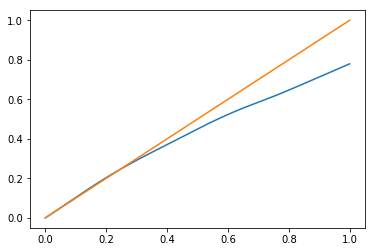

In [174]:
_x = pd.DataFrame({
    'x1': np.linspace(0., 1., 1001)
})
_y = calibrator.predict(_x)
plt.plot(_x, _y)
plt.plot(_x, _x)

Prediction at 1 has gone wayyyy down lately...

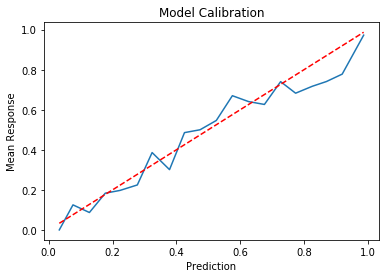

In [175]:
rel_df = _get_test_df(clay_df, MIN_TEST_DATE, MAX_TEST_DATE).copy()
rel_df = rel_df[rel_df['cal_pred']]
rel_df['cal_pred'] = rel_df['cal_pred'].clip(lower=0, upper=1)
calibration_plot(rel_df['y'], rel_df['cal_pred'])

Not great calibration...

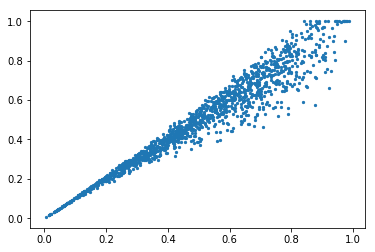

In [176]:
# Scatter of original prediction vs. calibrated prediction on relevant set.
plt.scatter(rel_df['pred'], rel_df['cal_pred'], s=5.)

Is this an artifact of the spline?  More variance the higher you go, because high up is sum of coefficients below?  Maybe a spline isn't the right thing here...

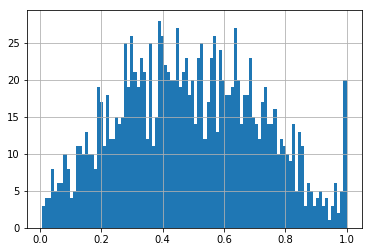

In [177]:
rel_df['cal_pred'].hist(bins=100)

Should this be more symmetric?  No real difference between player 1 and player 2...why wouldnt this distribution be symmetric?

#### Evaluate Betting

In [188]:
def evaluate_betting(val_df, buff=0.05):
    val_df['bet1'] = ((1. / val_df['p1_b365']) < (val_df['cal_pred'] - buff)).astype(int)
    val_df['bet2'] = ((1. / val_df['p2_b365']) < (1. - val_df['cal_pred'] - buff)).astype(int)

    bet_revenues = (
        val_df['p1_odds'] * val_df['bet1'] * val_df['y']  +
        val_df['p2_odds'] * val_df['bet2'] * (1. - val_df['y'])
    )

    bet_spending = val_df['bet1'] + val_df['bet2']
    profit_over_time = bet_revenues.cumsum() - bet_spending.cumsum()

    total_placed = bet_spending.sum()
    total_won = (val_df['bet1'] * val_df['y']).sum() + (val_df['bet2'] * (1. - val_df['y'])).sum()
    return bet_revenues.sum() - bet_spending.sum(), bet_spending.sum(), profit_over_time

profit, spending, time = evaluate_betting(rel_df.copy(), buff=0.05)

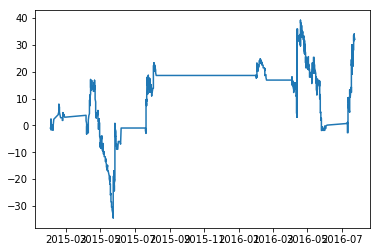

In [189]:
plt.plot(test_df['date'], time)

In [190]:
profits = []
spendings = []
buffs = np.arange(0, 1., 0.01)
for buff in buffs:
    profit, spending, _ = evaluate_betting(rel_df.copy(), buff=buff)
    profits.append(profit)
    spendings.append(spending)

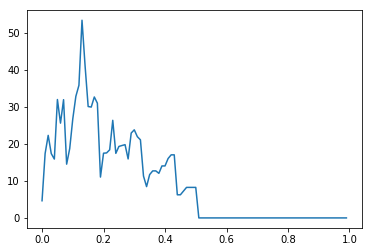

In [191]:
plt.plot(buffs, profits)

/Users/siddhantjagadish/Documents/DataProjects/tennis_modeling/tennis_modeling/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in divide
  This is separate from the ipykernel package so we can avoid doing imports until


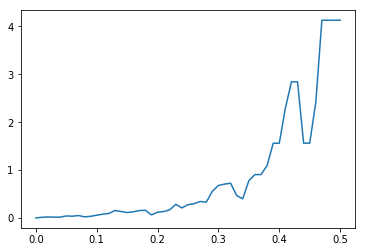

In [192]:
profits = np.array(profits)
spendings = np.array(spendings)
irs = profits / spendings
plt.plot(buffs, irs)

#### TODO:
* Combine with fatigue features
* Should learning rate have to do with number of matches opponent has played (the more uncertainty we have around opponent coefficient, the less we should update our original coefficient as well)?
* Figure out how to do this with multiple dimensions
    * Update network (interaction part first), then update player weights with ELO learning rate?
    * Update whole thing with ELO learning rate?
        * Apply same learning rate on both sides is much easier than applying different learning rates for each player...
* Calibrate and see how betting performance is...